# Load Data And Import Library

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import glob
import os

In [ ]:
import pandas as pd
import numpy as np
import glob
import json

# --- Đọc tất cả các file CSV trong folder ---
csv_path = "/content/drive/MyDrive/kpdl/data_stock/*.csv"
csv_files = glob.glob(csv_path)

dfs = []
for file in csv_files:
    df = pd.read_csv(file)
    # đảm bảo có cột time để merge
    if 'time' not in df.columns:
        df.rename(columns={'date': 'time'}, inplace=True)
    dfs.append(df)

# --- Đọc file JSON ---
json_path = "/content/drive/MyDrive/kpdl/daily_scores_vi.json"
with open(json_path, "r") as f:
    data = json.load(f)

# Chuyển JSON thành DataFrame
records = []
for time, scores in data.items():
    records.append({
        "time": time,
        "p_neg": scores[0],
        "p_neu": scores[1],
        "p_pos": scores[2]
    })
df_json = pd.DataFrame(records)

# --- Ghép tất cả DataFrame lại với nhau ---
df_all = pd.concat(dfs, axis=0)

# Merge với dữ liệu JSON
df_final = pd.merge(df_all, df_json, on="time", how="outer")

# --- Chuyển cột time sang datetime ---
df_final["time"] = pd.to_datetime(df_final["time"])

# --- Lọc dữ liệu từ 2020-01-01 trở đi ---
df = df_final[df_final["time"] >= "2020-01-01"].sort_values(by="time").reset_index(drop=True)
df = df[~df['symbol'].isnull()]
df[['p_neg','p_neu','p_pos']] = df[['p_neg','p_neu','p_pos']].fillna({'p_neg':0, 'p_neu':1, 'p_pos':0})

# Thêm flag có tin
mask_nan = df[['p_neg','p_neu','p_pos']].isna().any(axis=1)

# kiểm tra tổng khác 1 (chỉ xét khi không NaN)
mask_sum = (df[['p_neg','p_neu','p_pos']].sum(axis=1) != 1)

# gộp 2 điều kiện
df['has_news'] = np.where(mask_nan | mask_sum, 1, 0)

df


,time,open,high,low,close,volume,symbol,p_neg,p_neu,p_pos,has_news
1,2020-01-06,8.57,8.57,8.57,8.57,0.0,CMC,0.000000,1.000000,0.000000,0
2,2020-01-06,20.84,21.03,20.74,20.81,1091660.0,FPT,0.000000,1.000000,0.000000,0
3,2020-01-06,11.79,11.79,11.03,11.38,8240.0,ITC,0.000000,1.000000,0.000000,0
4,2020-01-06,7.65,7.74,7.56,7.74,466153.0,OIL,0.000000,1.000000,0.000000,0
5,2020-01-06,46.45,46.45,45.73,45.89,497990.0,PLX,0.000000,1.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...
15816,2025-08-29,36.50,36.50,36.05,36.10,1695376.0,PLX,0.009066,0.949478,0.041457,1
15817,2025-08-29,15.95,15.95,15.70,15.80,404965.0,ITC,0.009066,0.949478,0.041457,1
15818,2025-08-29,105.00,105.00,101.60,101.60,11117268.0,FPT,0.009066,0.949478,0.041457,1
15819,2025-08-29,8.20,9.10,8.00,9.10,4488.0,CMC,0.009066,0.949478,0.041457,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15747 entries, 1 to 15820
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   time      15747 non-null  datetime64[ns]
 1   open      15747 non-null  float64       
 2   high      15747 non-null  float64       
 3   low       15747 non-null  float64       
 4   close     15747 non-null  float64       
 5   volume    15747 non-null  float64       
 6   symbol    15747 non-null  object        
 7   p_neg     15747 non-null  float64       
 8   p_neu     15747 non-null  float64       
 9   p_pos     15747 non-null  float64       
 10  has_news  15747 non-null  int64         
dtypes: datetime64[ns](1), float64(8), int64(1), object(1)
memory usage: 1.4+ MB


In [ ]:
import pandas as pd
import numpy as np

# Sentiment: NaN -> neutral
df[['p_neg','p_neu','p_pos']] = df[['p_neg','p_neu','p_pos']].fillna({'p_neg':0, 'p_neu':1, 'p_pos':0})

# Thêm flag có tin
mask_nan = df[['p_neg','p_neu','p_pos']].isna().any(axis=1)

# kiểm tra tổng khác 1 (chỉ xét khi không NaN)
mask_sum = (df[['p_neg','p_neu','p_pos']].sum(axis=1) != 1)

# gộp 2 điều kiện
df['has_news'] = np.where(mask_nan | mask_sum, 1, 0)

# --- 2. Tính toán return cơ bản ---
df['ret1']   = df['close'].pct_change()
df['logret'] = np.log(df['close'] / df['close'].shift(1))
df['ret5']   = df['close'].pct_change(5)
df['ret20']  = df['close'].pct_change(20)

# --- 3. EMA và khoảng cách/slope ---
df['ema20'] = df['close'].ewm(span=20).mean()
df['ema60'] = df['close'].ewm(span=60).mean()
df['ema20_dist']  = (df['close'] - df['ema20']) / df['ema20']
df['ema60_slope'] = df['ema60'].diff()

# --- 4. Volatility & ATR ---
df['vol20'] = df['logret'].rolling(20).std()
df['atr14'] = (df['high'] - df['low']).rolling(14).mean()

# --- 5. Volume-based ---
df['vol_z20'] = (df['volume'] - df['volume'].rolling(20).mean()) / df['volume'].rolling(20).std()

# --- 6. Sentiment features ---
df['sent_polarity'] = df['p_pos'] - df['p_neg']
df['sent_entropy']  = -(df[['p_neg','p_neu','p_pos']] * np.log(df[['p_neg','p_neu','p_pos']] + 1e-6)).sum(axis=1)
df['sent_polarity_ema3'] = df['sent_polarity'].ewm(span=3).mean()
df['sent_vol_interact']  = df['sent_polarity'] * df['vol_z20']

# --- 7. Target (close đã làm mượt) ---
df['target'] = df['close'].ewm(span=30).mean().shift(-1)  # EMA30, dịch -1 để dự báo xu hướng kế tiếp

# # --- 8. Drop NaN do rolling ---
df = df.dropna().reset_index(drop=True)
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15726 entries, 0 to 15725
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   time                15726 non-null  datetime64[ns]
 1   open                15726 non-null  float64       
 2   high                15726 non-null  float64       
 3   low                 15726 non-null  float64       
 4   close               15726 non-null  float64       
 5   volume              15726 non-null  float64       
 6   symbol              15726 non-null  object        
 7   p_neg               15726 non-null  float64       
 8   p_neu               15726 non-null  float64       
 9   p_pos               15726 non-null  float64       
 10  has_news            15726 non-null  int64         
 11  ret1                15726 non-null  float64       
 12  logret              15726 non-null  float64       
 13  ret5                15726 non-null  float64   

In [ ]:
# hoặc loại bỏ các đoạn đầu thiếu dữ liệu
df = df.groupby('symbol').apply(lambda g: g.dropna()).reset_index(drop=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14417 entries, 0 to 14416
Data columns (total 42 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   time                14417 non-null  datetime64[ns]
 1   open                14417 non-null  float64       
 2   high                14417 non-null  float64       
 3   low                 14417 non-null  float64       
 4   close               14417 non-null  float64       
 5   volume              14417 non-null  float64       
 6   symbol              14417 non-null  object        
 7   p_neg               14417 non-null  float64       
 8   p_neu               14417 non-null  float64       
 9   p_pos               14417 non-null  float64       
 10  has_news            14417 non-null  int64         
 11  ret1                14417 non-null  float64       
 12  logret              14417 non-null  float64       
 13  ret5                14417 non-null  float64   

/tmp/ipython-input-212126993.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('symbol').apply(lambda g: g.dropna()).reset_index(drop=True)


In [ ]:
df[df['has_news'] == 0]

,time,open,high,low,close,volume,symbol,p_neg,p_neu,p_pos,...,ema20_dist,ema60_slope,vol20,atr14,vol_z20,sent_polarity,sent_entropy,sent_polarity_ema3,sent_vol_interact,target
1,2020-01-06,8.57,8.57,8.57,8.57,0.0,CMC,0.0,1.0,0.0,...,0.000000,NaN,NaN,NaN,NaN,0.0,-9.999995e-07,0.000000e+00,NaN,14.894000
2,2020-01-06,20.84,21.03,20.74,20.81,1091660.0,FPT,0.0,1.0,0.0,...,0.387703,6.222000,NaN,NaN,NaN,0.0,-9.999995e-07,0.000000e+00,NaN,13.643739
3,2020-01-06,11.79,11.79,11.03,11.38,8240.0,ITC,0.0,1.0,0.0,...,-0.167412,-1.175452,NaN,NaN,NaN,0.0,-9.999995e-07,0.000000e+00,NaN,12.017044
4,2020-01-06,7.65,7.74,7.56,7.74,466153.0,OIL,0.0,1.0,0.0,...,-0.352672,-1.543396,NaN,NaN,NaN,0.0,-9.999995e-07,0.000000e+00,NaN,19.723962
5,2020-01-06,46.45,46.45,45.73,45.89,497990.0,PLX,0.0,1.0,0.0,...,1.275727,7.221647,NaN,NaN,NaN,0.0,-9.999995e-07,0.000000e+00,NaN,17.217112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15794,2025-08-27,36.35,36.85,36.15,36.40,1393378.0,PLX,0.0,1.0,0.0,...,-0.473311,-1.015665,1.645671,0.863571,-0.218361,0.0,-9.999995e-07,-1.010297e-07,-0.0,64.401890
15795,2025-08-27,15.95,16.30,15.75,15.95,344013.0,ITC,0.0,1.0,0.0,...,-0.750968,-1.652856,1.554416,0.867143,-0.431279,0.0,-9.999995e-07,-5.051487e-08,-0.0,67.021123
15796,2025-08-27,101.40,105.10,101.20,105.00,19471753.0,FPT,0.0,1.0,0.0,...,0.545293,1.321008,1.576337,1.124286,2.560158,0.0,-9.999995e-07,-2.525743e-08,0.0,63.258470
15797,2025-08-27,8.70,8.80,8.70,8.70,1909.0,CMC,0.0,1.0,0.0,...,-0.860366,-1.879681,1.675452,1.102857,-0.461320,0.0,-9.999995e-07,-1.262872e-08,-0.0,59.615988


In [ ]:
for sym, df in merged_df.groupby("symbol"):
    print(f"==== {sym} ====")
    print(df.describe(include="all"))
    print("\n")


==== BSR ====
              time         open         high          low        close  \
count         1500  1500.000000  1500.000000  1500.000000  1500.000000   
unique        1403          NaN          NaN          NaN          NaN   
top     2024-12-06          NaN          NaN          NaN          NaN   
freq             2          NaN          NaN          NaN          NaN   
mean           NaN    17.109620    17.427827    16.769540    17.105753   
std            NaN     5.820947     5.907609     5.722073     5.802100   
min            NaN     4.340000     4.710000     4.250000     4.430000   
25%            NaN    14.680000    14.970000    14.310000    14.657500   
50%            NaN    18.360000    18.650000    18.070000    18.360000   
75%            NaN    21.500000    21.800000    21.080000    21.430000   
max            NaN    31.450000    31.450000    29.550000    30.210000   

              volume symbol  
count   1.500000e+03   1500  
unique           NaN      1  
top    

## News (!)

In [ ]:
import os, json
import pandas as pd
from pathlib import Path

root_dir = Path("/content/drive/MyDrive/kpdl/data_news")
target_folders = ["vnz","itc","cmc","fpt","gas","sgt","oil","plx","pvg","bsr"]  # thêm 'bsr' nếu muốn

def read_data_folders(root_dir: Path, target_folders):
    all_rows = []

    # chỉ giữ những folder thực sự tồn tại
    existing = [f for f in target_folders if (root_dir / f).is_dir()]
    if not existing:
        print("⚠️ Không tìm thấy folder nào trong target_folders dưới", root_dir)
    else:
        print("📂 Sẽ đọc các folder:", existing)

    for folder in existing:
        base = root_dir / folder

        # duyệt đệ quy mọi file json/jsonl/csv
        for p in base.rglob("*"):
            if not p.is_file():
                continue

            # JSON (mảng/object) hoặc JSON Lines
            if p.suffix.lower() in [".json", ".jsonl", ".ndjson", ".jl"]:
                try:
                    if p.suffix.lower() == ".json":
                        with p.open("r", encoding="utf-8") as f:
                            data = json.load(f)
                        if isinstance(data, list):
                            for row in data:
                                row["folder"] = folder
                                all_rows.append(row)
                        elif isinstance(data, dict):
                            data["folder"] = folder
                            all_rows.append(data)
                    else:
                        # JSON Lines
                        with p.open("r", encoding="utf-8") as f:
                            for line in f:
                                if line.strip():
                                    row = json.loads(line)
                                    row["folder"] = folder
                                    all_rows.append(row)
                except Exception as e:
                    print(f"❌ Lỗi đọc JSON {p}: {e}")

            # CSV
            elif p.suffix.lower() == ".csv":
                try:
                    df_csv = pd.read_csv(p, encoding="utf-8")
                    df_csv["folder"] = folder
                    all_rows.extend(df_csv.to_dict(orient="records"))
                except Exception as e:
                    print(f"❌ Lỗi đọc CSV {p}: {e}")

    return pd.DataFrame(all_rows)

df = read_data_folders(root_dir, target_folders)
print(df.shape)
print(df.head())

📂 Sẽ đọc các folder: ['vnz', 'itc', 'cmc', 'fpt', 'gas', 'sgt', 'oil', 'plx', 'pvg', 'bsr']
(9825, 9)
  id                                              title  \
0  1    VNGGames ra mắt Cổng thông tin thể thao điện tử   
1  2  Zalo tiếp tục là nền tảng nhắn tin phổ biến & ...   
2  3  Zalopay thay “áo mới”, đẩy mạnh kế hoạch tăng ...   
3  4          Zalopay công bố nhận diện thương hiệu mới   
4  5               VNG công bố Báo cáo thường niên 2023   

                                                 url  \
0  https://vng.com.vn/news/enterprise/vnggames-ra...   
1  https://vng.com.vn/news/press-release/zalo-tie...   
2  https://vng.com.vn/news/enterprise/zalopay-reb...   
3  https://vng.com.vn/news/press-release/zalopay-...   
4  https://vng.com.vn/news/enterprise/vng-cong-bo...   

                                             content              ngay_dang  \
0  Cổng thông tin này được xây dựng nhằm mục tiêu...  12:00 AM | 09/07/2024   
1  Theo báo cáo của Decision Lab, hạng mục “Nền 

In [ ]:

root_dir = "/content/drive/MyDrive/kpdl/data_news/"

target_folders = ["vnz", "itc", "cmc", "fpt", "gas", "sgt", "oil", "plx", "pvg"]


def read_data_folders(root_dir, target_folders):
    all_data = []

    for folder in target_folders:
        folder_path = os.path.join(root_dir, folder)
        if not os.path.isdir(folder_path):
            continue

        for file in sorted(os.listdir(folder_path)):
            file_path = os.path.join(folder_path, file)

            if file.endswith(".json"):
                try:
                    with open(file_path, "r", encoding="utf-8") as f:
                        data = json.load(f)

                        if isinstance(data, list):
                            for row in data:
                                row["folder"] = folder
                                all_data.append(row)
                        elif isinstance(data, dict):
                            data["folder"] = folder
                            all_data.append(data)
                except Exception as e:
                    print(f"❌ Lỗi đọc JSON {file_path}: {e}")

            # Xử lý file CSV
            elif file.endswith(".csv"):
                try:
                    df_csv = pd.read_csv(file_path, encoding="utf-8")
                    df_csv["folder"] = folder
                    all_data.extend(df_csv.to_dict(orient="records"))
                except Exception as e:
                    print(f"❌ Lỗi đọc CSV {file_path}: {e}")

    return pd.DataFrame(all_data)

df = read_data_folders(root_dir, target_folders)
print(df.shape)
print(df.head())

❌ Lỗi đọc JSON /content/drive/MyDrive/kpdl/data_news/vnz/data_vnz_links_round_1.json: name 'json' is not defined
❌ Lỗi đọc JSON /content/drive/MyDrive/kpdl/data_news/vnz/data_vnz_links_round_10.json: name 'json' is not defined
❌ Lỗi đọc JSON /content/drive/MyDrive/kpdl/data_news/vnz/data_vnz_links_round_11.json: name 'json' is not defined
❌ Lỗi đọc JSON /content/drive/MyDrive/kpdl/data_news/vnz/data_vnz_links_round_12.json: name 'json' is not defined
❌ Lỗi đọc JSON /content/drive/MyDrive/kpdl/data_news/vnz/data_vnz_links_round_13.json: name 'json' is not defined
❌ Lỗi đọc JSON /content/drive/MyDrive/kpdl/data_news/vnz/data_vnz_links_round_14.json: name 'json' is not defined
❌ Lỗi đọc JSON /content/drive/MyDrive/kpdl/data_news/vnz/data_vnz_links_round_15.json: name 'json' is not defined
❌ Lỗi đọc JSON /content/drive/MyDrive/kpdl/data_news/vnz/data_vnz_links_round_16.json: name 'json' is not defined
❌ Lỗi đọc JSON /content/drive/MyDrive/kpdl/data_news/vnz/data_vnz_links_round_17.json: na

KeyboardInterrupt: 

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9506 entries, 0 to 9505
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          9506 non-null   object
 1   title       9506 non-null   object
 2   url         9506 non-null   object
 3   content     9506 non-null   object
 4   ngay_dang   7829 non-null   object
 5   ngay_crawl  7829 non-null   object
 6   folder      9506 non-null   object
 7   file        9506 non-null   object
 8   pub_date    1677 non-null   object
 9   crawl_date  1677 non-null   object
dtypes: object(10)
memory usage: 742.8+ KB


# Data Processing

In [ ]:
# Filna cho cột thời gian

df["ngay_dang"] = df["ngay_dang"].fillna(df["pub_date"])
df["ngay_crawl"] = df["ngay_crawl"].fillna(df["crawl_date"])

In [ ]:
# Lọc những trường quan trọng

df = df.rename(columns={"folder": "source"})
df = df[["url", "title", "content", "ngay_dang", "source"]]

In [ ]:
df.head()

,url,title,content,ngay_dang,source
0,https://vng.com.vn/news/press-release/vng-lot-...,VNG lọt Top 29 doanh nghiệp tư nhân đóng thuế ...,"Thành phố Hồ Chí Minh, ngày 18 tháng 8 năm 202...",09:00 AM | 18/08/2025,vnz
1,https://vng.com.vn/news/enterprise/chu-tich-vn...,Chủ tịch VNG Lê Hồng Minh: “Thế giới cần những...,“\nCó nên để AI quyết định tất cả thay mình? C...,10:00 AM | 17/08/2025,vnz
2,https://vng.com.vn/news/press-release/vng-msb-...,"VNG và MSB ký kết hợp tác chiến lược, nâng tầm...",Bà Nguyễn Thị Mỹ Hạnh - Phó Tổng Giám đốc MSB ...,10:00 AM | 11/08/2025,vnz
3,https://vng.com.vn/news/enterprise/nha-sang-la...,Nhà sáng lập Zalo: Chấp nhận chỉ trích để giữ ...,"Vương Quang Khải, sinh năm 1979, là một trong ...",08:08 AM | 08/08/2025,vnz
4,https://vng.com.vn/news/enterprise/zalo-chuyen...,Zalo hợp tác cùng 24 ngân hàng triển khai tính...,Zalo vừa hoàn tất tích hợp tính năng chuyển kh...,09:00 AM | 06/08/2025,vnz


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9506 entries, 0 to 9505
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   url        9506 non-null   object
 1   title      9506 non-null   object
 2   content    9506 non-null   object
 3   ngay_dang  9506 non-null   object
 4   source     9506 non-null   object
dtypes: object(5)
memory usage: 371.5+ KB


In [ ]:
df['source'].value_counts()

In [ ]:
test = data.drop_duplicates(subset=["source"])
test

,url,title,content,ngay_dang,source
0,https://vng.com.vn/news/press-release/vng-lot-...,VNG lọt Top 29 doanh nghiệp tư nhân đóng thuế ...,"Thành phố Hồ Chí Minh, ngày 18 tháng 8 năm 202...",09:00 AM | 18/08/2025,vnz
370,https://www.vnr500.com.vn/Daiichi-Life-Viet-Na...,Dai-ichi Life Việt Nam dẫn đầu doanh nghiệp BH...,Trong bối cảnh thị trường còn nhiều thách thức...,08/09/2025,itc
964,https://www.cmc.com.vn/insight-detail/cmc-tele...,24 Tháng 03 2023,"Từ 12-14/9/2025, Security Bootcamp 2025 sẽ diễ...",10 September 2025,cmc
1764,https://fpt.com/vi/tin-tuc/tin-fpt/5-nam-lien-...,"5 năm liên tiếp, FPT ra mắt báo cáo thường niê...",Báo cáo thường niên 2024 của FPT mang đến bức ...,02/04/2025,fpt
2952,https://www.pvgas.com.vn/bai-viet/tong-ket-5-n...,,"Kết thúc năm 2019, Công an tỉnh Cà Mau và Tổng...",- 03/12/2019 3:15:00 CH,gas
4176,http://www.saigontel.vn/vi/tin-tuc/tin-tuc/295...,HD Hyundai cân nhắc xây dựng nhà máy đóng tàu ...,"Ngày 12/8 tại Seoul (Hàn Quốc), Phó Chủ tịch H...","Viết bởiPhòng Truyền Thông- Thứ tư, 13 Tháng 8...",sgt
5166,https://www.pvoil.com.vn/pvoil-thi-diem-ban-xa...,PVOIL thí điểm bán xăng sinh học E10 RON95,"Từ ngày 01/8/2025, PVOIL thí điểm bán xăng sin...",23.07.2025,oil
7893,https://www.petrolimex.com.vn/nd/tin-chuyen-ng...,Petrolimex nhận Giải thưởng ASEAN-OSHNET về An...,"Ngày 3/9/2025 tại Bangkok (Thái Lan), đại diện...","10:03 SA @ Thứ Sáu - 05 tháng 9, 2025",plx
9053,https://www.genco3.com/tin-tuc/tin-nganh-dien/...,"Gian trưng bày của EVN ""hút khách"" tại Triển l...",Trong khuôn khổ Triển lãm thành tựu đất nước đ...,08:00 05/09/2025,pvg
9506,https://nhipcaudautu.vn/tai-chinh/nguoi-dan-da...,Người dân đang gửi 15 triệu tỉ đồng trong ngân...,Thủ tướng Phạm Minh Chính yêu cầu cần có giải ...,06/08/2024 21:41,nhipcadautu


In [ ]:
# Format lại định dạng ngày tương ứng với mỗi trang tin tức

mask = data["source"] == "vnz"
data.loc[mask, "ngay_dang"] = data.loc[mask, "ngay_dang"].str[-10:]

mask = data["source"] == "gas"
data.loc[mask, "ngay_dang"] = data.loc[mask, "ngay_dang"].str[1:12]

mask = data["source"] == "oil"
data.loc[mask, "ngay_dang"] = data.loc[mask, "ngay_dang"].str.replace(
    ".", "/", regex=False
)

mask = data["source"] == "pvg"
data.loc[mask, "ngay_dang"] = data.loc[mask, "ngay_dang"].str[-10:]

data.loc[mask, "ngay_dang"] = data.loc[mask, "ngay_dang"].str.slice(0, 10)

mask = data["source"] == "cmc"
data.loc[mask, "ngay_dang"] = pd.to_datetime(
    data.loc[mask, "ngay_dang"], errors="coerce"
).dt.strftime("%d/%m/%Y")

mask = data["source"] == "sgt"
data.loc[mask, "ngay_dang"] = data.loc[mask, "ngay_dang"].str[-15:]


mask = data["source"] == "plx"
data.loc[mask, "ngay_dang"] = data.loc[mask, "ngay_dang"].str[-16:]

In [ ]:
mask = data["source"].str.lower().str.strip() == "sgt"

data.loc[mask, "ngay_dang"] = data.loc[mask, "ngay_dang"].str.replace(
    "Tháng ", "", regex=False
)

# Xóa khoảng trắng
data.loc[mask, "ngay_dang"] = (
    data.loc[mask, "ngay_dang"].str.strip().str.replace(r"\s+", " ", regex=True)
)

split_cols = data.loc[mask, "ngay_dang"].str.split(" ", expand=True)

split_cols.columns = ["day", "month", "year"]

data.loc[mask, "day"] = split_cols["day"]
data.loc[mask, "month"] = split_cols["month"]
data.loc[mask, "year"] = split_cols["year"]

data.loc[mask, "day"] = data.loc[mask, "day"].str.zfill(2)
data.loc[mask, "month"] = data.loc[mask, "month"].str.zfill(2)

data.loc[mask, "ngay_dang"] = (
    data.loc[mask, "day"] + "/" + data.loc[mask, "month"] + "/" + data.loc[mask, "year"]
)

# Xóa cột phụ
data = data.drop(columns=["day", "month", "year"])

In [ ]:
mask = data["source"].str.lower().str.strip() == "plx"

# 1. Chuẩn hóa chuỗi: bỏ chữ "tháng" và dấu ","
data.loc[mask, "ngay_dang"] = (
    data.loc[mask, "ngay_dang"]
    .str.replace("tháng", "", case=False, regex=False)  # bỏ chữ "tháng"
    .str.replace(",", "", regex=False)  # bỏ dấu phẩy
    .str.strip()  # bỏ khoảng trắng thừa
    .str.replace(r"\s+", " ", regex=True)  # chuẩn hóa khoảng trắng
)

# 2. Format cột ngày (Dùng cột phụ để tách -> ghép lại cho đúng đinh dạng dd/mm/yyyy)
split_cols = data.loc[mask, "ngay_dang"].str.split(" ", expand=True)
split_cols.columns = ["day", "month", "year"]

# 3. Ghép
data.loc[mask, "day"] = split_cols["day"].str.zfill(2)
data.loc[mask, "month"] = split_cols["month"].str.zfill(2)
data.loc[mask, "year"] = split_cols["year"]

data.loc[mask, "ngay_dang"] = (
    data.loc[mask, "day"] + "/" + data.loc[mask, "month"] + "/" + data.loc[mask, "year"]
)

# 4. Xóa cột phụ
data = data.drop(columns=["day", "month", "year"])

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17799 entries, 0 to 17800
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   url        17799 non-null  object
 1   title      17799 non-null  object
 2   content    17799 non-null  object
 3   ngay_dang  17190 non-null  object
 4   source     17799 non-null  object
dtypes: object(5)
memory usage: 834.3+ KB


In [ ]:
data

,url,title,content,ngay_dang,source
0,https://vng.com.vn/news/press-release/vng-lot-...,VNG lọt Top 29 doanh nghiệp tư nhân đóng thuế ...,"Thành phố Hồ Chí Minh, ngày 18 tháng 8 năm 202...",18/08/2025,vnz
1,https://vng.com.vn/news/enterprise/chu-tich-vn...,Chủ tịch VNG Lê Hồng Minh: “Thế giới cần những...,“\nCó nên để AI quyết định tất cả thay mình? C...,17/08/2025,vnz
2,https://vng.com.vn/news/press-release/vng-msb-...,"VNG và MSB ký kết hợp tác chiến lược, nâng tầm...",Bà Nguyễn Thị Mỹ Hạnh - Phó Tổng Giám đốc MSB ...,11/08/2025,vnz
3,https://vng.com.vn/news/enterprise/nha-sang-la...,Nhà sáng lập Zalo: Chấp nhận chỉ trích để giữ ...,"Vương Quang Khải, sinh năm 1979, là một trong ...",08/08/2025,vnz
4,https://vng.com.vn/news/enterprise/zalo-chuyen...,Zalo hợp tác cùng 24 ngân hàng triển khai tính...,Zalo vừa hoàn tất tích hợp tính năng chuyển kh...,06/08/2025,vnz
...,...,...,...,...,...
17796,https://cafef.vn/chuyen-gia-vpbanks-muc-chiet-...,Chuyên gia VPBankS: Mức chiết khấu 15-20% là p...,Thị trường chứng khoán Việt Nam thường xuyên c...,26/03/2025,CafeF
17797,https://cafef.vn/them-ctck-len-ke-hoach-lai-tr...,Thêm CTCK lên kế hoạch lãi trên nghìn tỷ năm 2...,"Sáng ngày 15/4 tới đây,Chứng khoán MB (mã: MBS...",26/03/2025,CafeF
17798,https://cafef.vn/chung-khoan-ngay-mai-26-3-co-...,"Chứng khoán ngày mai, 26-3: Có nên mua trung b...","Kết thúc phiên giao dịch ngày 25-3, VN-Index đ...",25/03/2025,CafeF
17799,https://cafef.vn/trinh-thu-tuong-nhieu-du-an-v...,"Trình Thủ tướng nhiều dự án, Vingroup muốn chi...",Đó là những dự án về điện tái tạo và khí LNG.\...,25/03/2025,CafeF


In [ ]:
data = data.dropna(subset=["ngay_dang"])

In [ ]:
data["source"].value_counts()

source
nhipcadautu    6022
oil            2727
CafeF          2273
gas            1224
fpt            1188
plx            1159
sgt             990
cmc             799
itc             594
pvg             453
vnz             370
Name: count, dtype: int64

In [ ]:
# Check dữ liệu trong cột Ngaydang

df_unique = data.drop_duplicates(subset=["source"], keep="first")
df_unique

,url,title,content,ngay_dang,source
0,https://vng.com.vn/news/press-release/vng-lot-...,VNG lọt Top 29 doanh nghiệp tư nhân đóng thuế ...,"Thành phố Hồ Chí Minh, ngày 18 tháng 8 năm 202...",18/08/2025,vnz
370,https://www.vnr500.com.vn/Daiichi-Life-Viet-Na...,Dai-ichi Life Việt Nam dẫn đầu doanh nghiệp BH...,Trong bối cảnh thị trường còn nhiều thách thức...,08/09/2025,itc
964,https://www.cmc.com.vn/insight-detail/cmc-tele...,24 Tháng 03 2023,"Từ 12-14/9/2025, Security Bootcamp 2025 sẽ diễ...",10/09/2025,cmc
1764,https://fpt.com/vi/tin-tuc/tin-fpt/5-nam-lien-...,"5 năm liên tiếp, FPT ra mắt báo cáo thường niê...",Báo cáo thường niên 2024 của FPT mang đến bức ...,02/04/2025,fpt
2952,https://www.pvgas.com.vn/bai-viet/tong-ket-5-n...,,"Kết thúc năm 2019, Công an tỉnh Cà Mau và Tổng...",03/12/2019,gas
4176,http://www.saigontel.vn/vi/tin-tuc/tin-tuc/295...,HD Hyundai cân nhắc xây dựng nhà máy đóng tàu ...,"Ngày 12/8 tại Seoul (Hàn Quốc), Phó Chủ tịch H...",13/08/2025,sgt
5166,https://www.pvoil.com.vn/pvoil-thi-diem-ban-xa...,PVOIL thí điểm bán xăng sinh học E10 RON95,"Từ ngày 01/8/2025, PVOIL thí điểm bán xăng sin...",23/07/2025,oil
7893,https://www.petrolimex.com.vn/nd/tin-chuyen-ng...,Petrolimex nhận Giải thưởng ASEAN-OSHNET về An...,"Ngày 3/9/2025 tại Bangkok (Thái Lan), đại diện...",05/09/2025,plx
9053,https://www.genco3.com/tin-tuc/tin-nganh-dien/...,"Gian trưng bày của EVN ""hút khách"" tại Triển l...",Trong khuôn khổ Triển lãm thành tựu đất nước đ...,05/09/2025,pvg
9506,https://nhipcaudautu.vn/tai-chinh/nguoi-dan-da...,Người dân đang gửi 15 triệu tỉ đồng trong ngân...,Thủ tướng Phạm Minh Chính yêu cầu cần có giải ...,06/08/2024,nhipcadautu


## Chuẩn hóa câu trước khi tách


In [ ]:
MIN_TOKENS = 2
FIN_KEYWORDS = [
    "lợi nhuận","doanh thu","lỗ","phá sản","cắt giảm","sáp nhập","phát hành","nợ xấu",
    "hạ hạng","nâng hạng","cổ tức","hồi phục","lao dốc","bứt phá","kỷ lục",
    # tech
    "ra mắt sản phẩm","tấn công mạng","AI","blockchain","khách hàng mới","mất dữ liệu",
    # energy
    "điện mặt trời","điện gió","năng lượng tái tạo","mở rộng công suất","giá dầu","cháy nổ"
]

def _contains_any(s, kws):
    s = (s or "").lower()
    return any(k in s for k in kws)

# Chuẩn hóa ngày sang yyy-mm-dd
def normalize_date_vi(s):
    # s dạng dd/mm/yyyy -> yyyy-mm-dd
    s = str(s).strip()
    for fmt in ("%d/%m/%Y", "%Y-%m-%d", "%d-%m-%Y", "%d/%m/%y"):
        try:
            return datetime.strptime(s, fmt).strftime("%Y-%m-%d")
        except Exception:
            pass
    return s

# Tách câu với underthesea
def vi_sent_tokenize(text):
    text = (text or "").strip()
    if not text:
        return []
    # ưu tiên underthesea nếu có
    try:
        from underthesea import sent_tokenize
        sents = sent_tokenize(text)
        sents = [re.sub(r"\s+", " ", s).strip() for s in sents if s and s.strip()]
        if sents:
            return sents
    except Exception:
        pass

    txt = re.sub(r"\s+", " ", text)
    # chèn dấu ngắt sau .,!,?,… nếu theo sau là chữ in hoa/ngoặc/nháy
    txt = re.sub(r"([\.!?…])(\s+)(?=[“\"'(\\[\\{]*[A-ZÀÁÂÃÈÉÊÌÍÒÓÔÕÙÚĂĐĨŨƠƯÝ])", r"\\1\n", txt)
    sents = [s.strip() for s in txt.split("\n") if s.strip()]
    return sents

# Lọc câu nhiễu nhưng vẫn giữ câu “cảm xúc”
NON_ALPHA_MIN_RATIO = 0.35
NUMERIC_HINTS = ["%", "tỷ", "tỉ", "tỷ đồng", "tỉ đồng", "yoy", "qoq", "lnst", "ebitda", "P/E", "P/B", "ROE", "ROA"]

def _mostly_non_alnum(s):
    valid = re.findall(r"[\p{L}\p{Nd}]", s)
    return (len(valid) / max(1, len(s))) < NON_ALPHA_MIN_RATIO

def keep_sentence(s):
    s = (s or "").strip()
    if not s:
        return False
    tokens = re.findall(r"\w+", s, flags=re.UNICODE)
    if len(tokens) <= 1:
        return _contains_any(s, FIN_KEYWORDS) or bool(re.search(r"[!?]", s))
    if s.endswith(":") and len(tokens) <= 3 and not _contains_any(s, FIN_KEYWORDS):
        return False
    if s.isupper():
        if len(tokens) >= 5 or _contains_any(s, NUMERIC_HINTS):
            return True
        return False
    if _mostly_non_alnum(s) and not _contains_any(s, NUMERIC_HINTS):
        return False
    return True

# Hàm tách câu
def explode_content_to_sentences(df, date_col="ngay_dang", ticker_col="ticket", content_col="content"):

    work = df[[date_col, ticker_col, content_col]].copy()
    work.rename(columns={date_col: "date", ticker_col: "ticket", content_col: "content"}, inplace=True)
    work["date"] = work["date"].map(normalize_date_vi)

    rows = []
    for idx, row in work.iterrows():
        date = row["date"]
        ticket = row["ticket"]
        content = row["content"]
        article_id = f"art_{idx}"
        sents = vi_sent_tokenize(content)
        sents = [s for s in sents if keep_sentence(s)]
        for i, s in enumerate(sents):
            rows.append({
                "article_id": article_id,
                "date": date,
                "ticket": ticket,
                "cau": s,
                "sent_idx": i
            })
    return pd.DataFrame(rows)

df_sent = explode_content_to_sentences(df, date_col="ngay_dang", ticker_col="ticket", content_col="content")
df_sent.head()


,article_id,date,ticket,cau,sent_idx
0,art_0,2025-08-18,VNZ,"Thành phố Hồ Chí Minh, ngày 18 tháng 8 năm 202...",0
1,art_0,2025-08-18,VNZ,Đây là năm thứ 3 liên tiếp Tập đoàn ghi nhận m...,1
2,art_0,2025-08-18,VNZ,"Kết thúc năm 2024, doanh thu hợp nhất của Tập ...",2
3,art_0,2025-08-18,VNZ,"Riêng trong 6 tháng đầu năm 2025, VNG đã đóng ...",3
4,art_0,2025-08-18,VNZ,Các mảng kinh doanh lõi đều ghi nhận sự tăng t...,4


In [ ]:
df_sent.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128439 entries, 0 to 128438
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   article_id  128439 non-null  object
 1   date        128439 non-null  object
 2   ticket      128439 non-null  object
 3   cau         128439 non-null  object
 4   sent_idx    128439 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 4.9+ MB


## Sentiment score

In [ ]:
# PhoBERT để tạo sentiment

MODEL_NAME = "wonrax/phobert-base-vietnamese-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME)
model.eval()


# Chấm sentiment cho list câu
def score_sentences_vi(texts, batch_size=32, max_length=256, device=None):
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    if not texts:
        return np.zeros((0, 3), dtype=np.float32)

    probs_all = []
    with torch.no_grad():
        for i in range(0, len(texts), batch_size):
            batch = [
                str(t) if isinstance(t, str) and t.strip() else ""
                for t in texts[i : i + batch_size]
            ]
            enc = tokenizer(
                batch,
                return_tensors="pt",
                padding=True,
                truncation=True,
                max_length=max_length,
            ).to(device)
            logits = model(**enc).logits
            probs = torch.softmax(logits, dim=1).cpu().numpy()
            probs_all.append(probs)
    return np.vstack(probs_all)


# Tính sentiment
def compute_article_sentiment_from_df(
    df_sent, article_col="article_id", text_col="cau"
):
    rows = []
    for aid, g in df_sent.groupby(article_col, dropna=False):
        texts = g[text_col].astype(str).tolist()
        P = score_sentences_vi(texts)
        if P.shape[0] == 0:
            agg = np.array([1.0, 0.0, 0.0], dtype=np.float32)
        else:
            agg = P.mean(axis=0)
        compound = float(agg[2] - agg[0])
        rows.append(
            {
                "article_id": aid,
                "p_neg": float(agg[0]),
                "p_neu": float(agg[1]),
                "p_pos": float(agg[2]),
                "compound": compound,
            }
        )
    return pd.DataFrame(rows)


# Tính sentiment theo NGÀY (mean của các bài trong ngày)
def compute_daily_sentiment_from_df(df_articles_with_date, date_col="date"):
    """
    df_articles_with_date: phải có cột [date, p_neg, p_neu, p_pos]
    """
    return (
        df_articles_with_date.groupby(date_col)[["p_neg", "p_neu", "p_pos"]]
        .mean()
        .reset_index()
    )


# Lưu score
def export_daily_json(df_daily, out_path, date_col="date"):
    payload = {
        r[date_col]: [float(r["p_neg"]), float(r["p_neu"]), float(r["p_pos"])]
        for _, r in df_daily.iterrows()
    }
    with open(out_path, "w", encoding="utf-8") as f:
        json.dump(payload, f, ensure_ascii=False, indent=2)


df_sent = df_sent.dropna(subset=["article_id", "date", "cau"]).copy()
df_sent["cau"] = df_sent["cau"].astype(str)

# sentiment
art_df = compute_article_sentiment_from_df(
    df_sent, article_col="article_id", text_col="cau"
)

# gắn lại cột ngày cho mỗi bài
art_df = art_df.merge(
    df_sent[["article_id", "date"]].drop_duplicates(), on="article_id", how="left"
)

# 3) sentiment theo NGÀY
daily_df = compute_daily_sentiment_from_df(art_df, date_col="date")

display(art_df.head(), daily_df.head())

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/285 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

bpe.codes: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/17.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/999 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/540M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/540M [00:00<?, ?B/s]

,article_id,p_neg,p_neu,p_pos,compound,date
0,art_0,0.116267,0.755887,0.127846,0.011578,2025-08-18
1,art_1,0.220958,0.374233,0.404809,0.183851,2025-08-17
2,art_10,0.160307,0.641134,0.198559,0.038251,2025-01-26
3,art_1000,0.039814,0.945635,0.014550,-0.025264,2024-07-11
4,art_1001,0.030761,0.791719,0.177520,0.146758,2024-07-04


,date,p_neg,p_neu,p_pos
0,1970-01-01,0.090607,0.766210,0.143183
1,2016-10-31,0.018746,0.902885,0.078369
2,2017-05-30,0.019618,0.555870,0.424512
3,2017-07-28,0.090036,0.173447,0.736517
4,2017-07-31,0.380594,0.409376,0.210030


# Load Stock data

In [ ]:
# df = pd.read_csv(
#     "/content/drive/MyDrive/kpdl/stock.csv"
# )
# # df1 = pd.read_json(
# #     "/home/namphuong/course_materials/Khai phá dữ liệu/DA_cuoiky/data_clean/daily_scores_vi.json"
# # )
# df.drop(columns=["Unnamed: 0"], inplace=True)
# df.rename(columns={"time": "date"}, inplace=True)
# # # Giả sử df1 có 3 hàng (score1, score2, score3)
# # df1 = df1.transpose().reset_index()
# # df1.columns = ["date", "score1", "score2", "score3"]
# # df["date"] = pd.to_datetime(df["date"])
# # df1["date"] = pd.to_datetime(df1["date"])

# # df = pd.merge(df, df1, on="date", how="left")

# # df = pd.merge(df, df1, on="date", how="inner")

### FPT

In [ ]:
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_processing.csv"
)
df.drop(columns=["Unnamed: 0"], inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1490 entries, 0 to 1489
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         1490 non-null   object 
 1   open         1490 non-null   float64
 2   high         1490 non-null   float64
 3   low          1490 non-null   float64
 4   close        1490 non-null   float64
 5   volume       1490 non-null   int64  
 6   symbol       1490 non-null   object 
 7   ma_5         1490 non-null   float64
 8   ema_5        1490 non-null   float64
 9   ma_10        1490 non-null   float64
 10  ema_10       1490 non-null   float64
 11  ma_20        1490 non-null   float64
 12  ema_20       1490 non-null   float64
 13  rsi_14       1490 non-null   float64
 14  ret          1490 non-null   float64
 15  open_pct     1490 non-null   float64
 16  high_pct     1490 non-null   float64
 17  low_pct      1490 non-null   float64
 18  close_pct    1490 non-null   float64
 19  volume

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 876 entries, 0 to 875
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    876 non-null    datetime64[ns]
 1   score1  876 non-null    float64       
 2   score2  876 non-null    float64       
 3   score3  876 non-null    float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 27.5 KB


In [ ]:
df1

,date,score1,score2,score3
0,1970-01-01,0.090607,0.766210,0.143183
1,2016-10-31,0.018746,0.902885,0.078369
2,2017-05-30,0.019618,0.555870,0.424512
3,2017-07-28,0.090036,0.173447,0.736517
4,2017-07-31,0.380594,0.409376,0.210030
...,...,...,...,...
871,2025-08-29,0.009066,0.949478,0.041457
872,2025-09-03,0.036679,0.920234,0.043087
873,2025-09-05,0.223464,0.682995,0.093542
874,2025-09-08,0.100426,0.770731,0.128843


## Tổng quan biến động theo mã

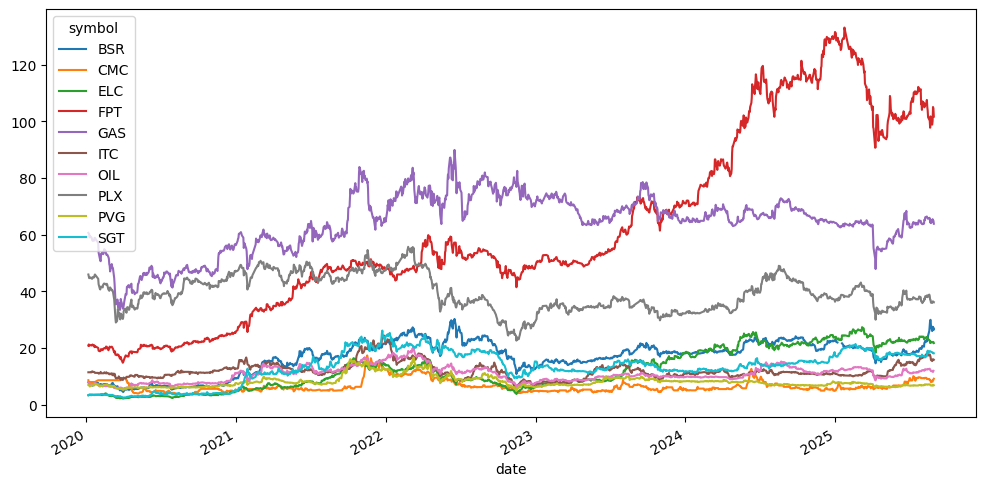

In [ ]:

df_no_vnz = df[df['symbol'] != "VNZ"].copy()
df_no_vnz['date'] = pd.to_datetime(df_no_vnz['date'])
df_no_vnz = df_no_vnz.sort_values(['symbol','date'])

dedup = df_no_vnz.drop_duplicates(subset=['date','symbol'], keep='last')
df_pivot = dedup.pivot(index='date', columns='symbol', values='close')
df_pivot.plot(figsize=(12,6))
plt.show()


In [ ]:
# Scale dữ liệu về phân phối chuẩn
scaler = StandardScaler()
n = len(df)
n_train = int(n*0.7)
n_val = int(n*0.85)

scaler.fit(X_all[:n_train])
X_scaled = scaler.transform(X_all)


In [ ]:
def make_sequences(X, y, window=20):
    xs, ys = [], []
    for i in range(len(X)-window):
        xs.append(X[i:i+window])
        ys.append(y[i+window])
    return np.stack(xs), np.array(ys)

WINDOW = 20 #(Số ngày liên tiếp trong quá khứ)
X_seq, y_seq = make_sequences(X_scaled, y_all, WINDOW)

X_tr, y_tr = X_seq[:n_train-WINDOW], y_seq[:n_train-WINDOW]
X_va, y_va = X_seq[n_train-WINDOW:n_val-WINDOW], y_seq[n_train-WINDOW:n_val-WINDOW]
X_te, y_te = X_seq[n_val-WINDOW:], y_seq[n_val-WINDOW:]


In [ ]:
train_dl = DataLoader(TensorDataset(torch.tensor(X_tr), torch.tensor(y_tr)), batch_size=64, shuffle=True)
val_dl   = DataLoader(TensorDataset(torch.tensor(X_va), torch.tensor(y_va)), batch_size=64)
test_dl  = DataLoader(TensorDataset(torch.tensor(X_te), torch.tensor(y_te)), batch_size=64)

class StockSentimentLSTM(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, dropout=0.3):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)
    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:,-1,:]).squeeze(-1)

model = StockSentimentLSTM(input_size=len(FEATURES)).to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
loss_fn = nn.MSELoss()


# Tạo lớp cho mô hình VAE

In [ ]:

from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_squared_error
from keras import layers, models, callbacks, optimizers, losses
from keras import ops as K
import numpy as np
import pandas as pd
np.random.seed(42)
tf.random.set_seed(42)
import tensorflow as tf


class Sampling(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        eps = tf.random.normal(shape=K.shape(mu))
        return mu + K.exp(0.5 * logvar) * eps


class KLDivergenceLayer(layers.Layer):
    def __init__(self, beta=0.5, **kwargs):
        super().__init__(**kwargs)
        self.beta = beta

    def call(self, inputs):
        mu, logvar = inputs
        kl_per = -0.5 * K.sum(1 + logvar - K.square(mu) - K.exp(logvar), axis=1)
        kl = K.mean(kl_per)
        self.add_loss(self.beta * kl)
        return inputs

# Tính toán các chỉ số

In [ ]:
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values("date").reset_index(drop=True)

# Tính các chỉ số kỹ thuật
# Đường trung bình động (SMA & EMA)

df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["close"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

# ==========================
# Đặt lại tên cột giống như bảng mẫu
# ==========================
df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15728 entries, 19 to 15746
Data columns (total 33 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         15728 non-null  datetime64[ns]
 1   open         15728 non-null  float64       
 2   high         15728 non-null  float64       
 3   low          15728 non-null  float64       
 4   close        15728 non-null  float64       
 5   volume       15728 non-null  int64         
 6   symbol       15728 non-null  object        
 7   ret_1d_raw   15727 non-null  float64       
 8   ret_5d       15692 non-null  float64       
 9   ret_20d      15527 non-null  float64       
 10  vol_10       15637 non-null  float64       
 11  sma_5        15703 non-null  float64       
 12  sma_20       15538 non-null  float64       
 13  ema_12       15728 non-null  float64       
 14  ema_26       15728 non-null  float64       
 15  macd         15728 non-null  float64       
 16  macd_sig

In [ ]:
df = df.dropna(subset="volume_pct")
df = df.dropna(subset="sma_20")
df = df.dropna(subset="ret_20d")
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15507 entries, 200 to 15746
Data columns (total 33 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         15507 non-null  datetime64[ns]
 1   open         15507 non-null  float64       
 2   high         15507 non-null  float64       
 3   low          15507 non-null  float64       
 4   close        15507 non-null  float64       
 5   volume       15507 non-null  int64         
 6   symbol       15507 non-null  object        
 7   ret_1d_raw   15507 non-null  float64       
 8   ret_5d       15507 non-null  float64       
 9   ret_20d      15507 non-null  float64       
 10  vol_10       15507 non-null  float64       
 11  sma_5        15507 non-null  float64       
 12  sma_20       15507 non-null  float64       
 13  ema_12       15507 non-null  float64       
 14  ema_26       15507 non-null  float64       
 15  macd         15507 non-null  float64       
 16  macd_si

In [ ]:
df

,date,open,high,low,close,volume,symbol,p_neg,p_neu,p_pos,ret_1d,y_up
0,2020-01-06,20.84,21.03,20.74,20.81,1091660,FPT,0.333333,0.333333,0.333333,-0.667948,0
1,2020-01-06,6.91,6.91,6.91,6.91,33200,PVG,0.333333,0.333333,0.333333,-0.520984,0
2,2020-01-06,3.28,3.48,3.28,3.31,3240,SGT,0.333333,0.333333,0.333333,17.311178,1
3,2020-01-06,59.93,60.74,59.62,60.61,431090,GAS,0.333333,0.333333,0.333333,-0.858604,0
4,2020-01-06,8.57,8.57,8.57,8.57,0,CMC,0.333333,0.333333,0.333333,-0.617270,0
...,...,...,...,...,...,...,...,...,...,...,...,...
15741,2025-08-29,15.95,15.95,15.70,15.80,404965,ITC,0.009066,0.949478,0.041457,5.430380,1
15742,2025-08-29,105.00,105.00,101.60,101.60,11117268,FPT,0.009066,0.949478,0.041457,-0.372047,0
15743,2025-08-29,65.00,65.00,63.80,63.80,1479957,GAS,0.009066,0.949478,0.041457,-0.716301,0
15744,2025-08-29,18.60,18.60,17.90,18.10,71270,SGT,0.009066,0.949478,0.041457,-0.624309,0


CNN + LSTM

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/home/namphuong/course_materials/Khai phá dữ liệu/DA_cuoiky/data_clean/stock.csv"
)
df = df.drop(columns=["Unnamed: 0"])

In [ ]:
df

,time,open,high,low,close,volume,symbol
0,2020-01-06,20.84,21.03,20.74,20.81,1091660,FPT
1,2020-01-07,20.92,21.21,20.81,21.21,837240,FPT
2,2020-01-08,20.99,21.06,20.74,20.74,1814290,FPT
3,2020-01-09,20.92,21.06,20.84,21.03,967050,FPT
4,2020-01-10,20.99,21.10,20.84,20.99,1018650,FPT
...,...,...,...,...,...,...,...
15742,2025-08-25,11.90,12.10,11.50,11.70,1348149,OIL
15743,2025-08-26,11.60,11.80,11.40,11.70,1031970,OIL
15744,2025-08-27,11.70,11.80,11.40,11.50,1718519,OIL
15745,2025-08-28,11.50,12.00,11.30,11.90,1603218,OIL


In [ ]:
import pandas as pd

# Giả sử df là DataFrame stock ban đầu
stock = stock.sort_values(["symbol", "time"])

stock["close_next"] = stock.groupby("symbol")["close"].shift(-1)
stock["target"] = (stock["close_next"] > stock["close"]).astype(int)

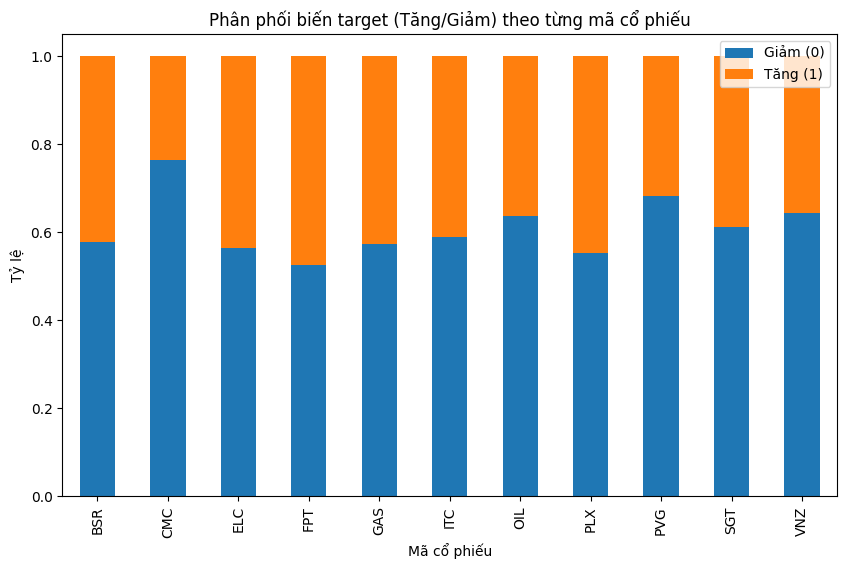

In [ ]:
import matplotlib.pyplot as plt

dist.plot(kind="bar", stacked=True, figsize=(10,6))
plt.title("Phân phối biến target (Tăng/Giảm) theo từng mã cổ phiếu")
plt.xlabel("Mã cổ phiếu")
plt.ylabel("Tỷ lệ")
plt.legend(["Giảm (0)", "Tăng (1)"])
plt.show()


# Xem tương quan các chỉ số trong từng mã

In [ ]:
import pandas as pd

# Giả sử stock đã có dữ liệu
symbols = stock["symbol"].unique()

corr_dict = {}
for sym in symbols:
    df_sym = stock[stock["symbol"] == sym][["open", "high", "low", "close", "volume"]]
    corr_dict[sym] = df_sym.corr()


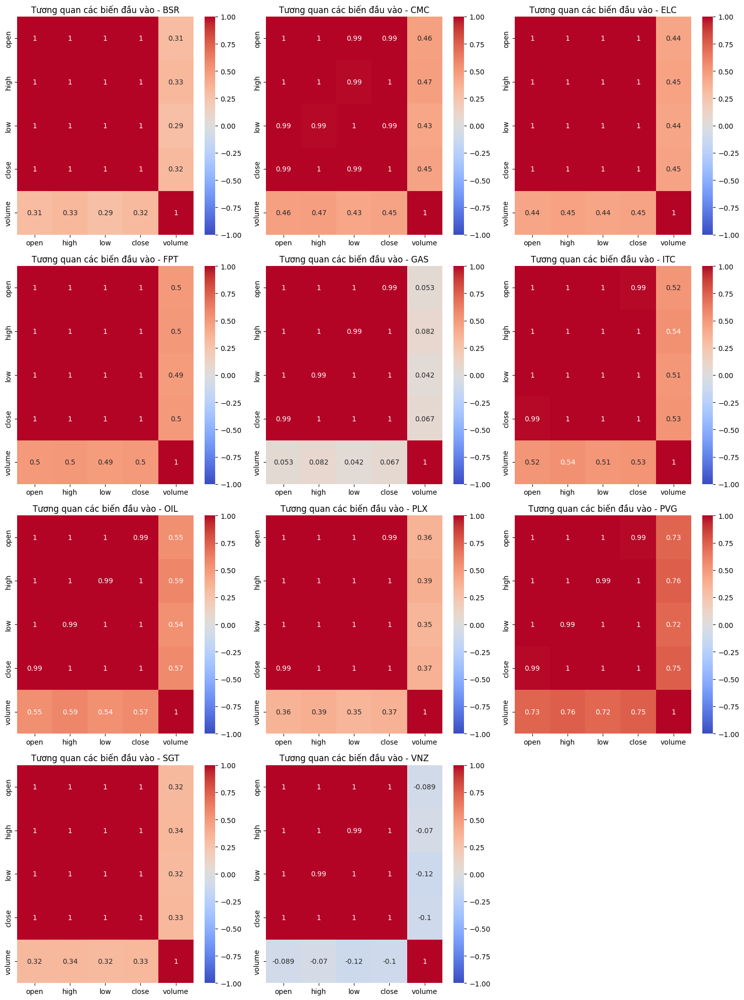

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

n = len(symbols)        # số mã cổ phiếu
cols = 3                # số cột (3 biểu đồ trên 1 hàng)
rows = math.ceil(n/cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))

# Nếu chỉ có 1 hàng thì axes sẽ là 1D, cần flatten để xử lý chung
axes = axes.flatten()

for i, sym in enumerate(symbols):
    sns.heatmap(
        corr_dict[sym], annot=True, cmap="coolwarm",
        vmin=-1, vmax=1, ax=axes[i]
    )
    axes[i].set_title(f"Tương quan các biến đầu vào - {sym}")

# Ẩn subplot thừa (nếu số mã không chia hết cho 3)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
df.to_csv('/content/sample_data/data_total.csv')

In [ ]:
daily_df.head(50)

,date,p_neg,p_neu,p_pos
0,1970-01-01,0.090607,0.766210,0.143183
1,2016-10-31,0.018746,0.902885,0.078369
2,2017-05-30,0.019618,0.555870,0.424512
3,2017-07-28,0.090036,0.173447,0.736517
4,2017-07-31,0.380594,0.409376,0.210030
5,2017-08-21,0.203716,0.549738,0.246545
6,2017-10-11,0.163076,0.572954,0.263970
7,2017-12-05,0.381989,0.344620,0.273390
8,2017-12-07,0.327618,0.286215,0.386167
9,2018-02-28,0.128149,0.769611,0.102240


In [ ]:
import pandas as pd

df_sent = pd.read_csv('/home/namphuong/course_materials/Khai phá dữ liệu/DA_cuoiky/data_clean/colab.csv')

In [ ]:
df_sent.head(10)

,article_id,date,ticket,cau,sent_idx
0,art_0,2025-08-18,VNZ,"Thành phố Hồ Chí Minh, ngày 18 tháng 8 năm 202...",0
1,art_0,2025-08-18,VNZ,Đây là năm thứ 3 liên tiếp Tập đoàn ghi nhận m...,1
2,art_0,2025-08-18,VNZ,"Kết thúc năm 2024, doanh thu hợp nhất của Tập ...",2
3,art_0,2025-08-18,VNZ,"Riêng trong 6 tháng đầu năm 2025, VNG đã đóng ...",3
4,art_0,2025-08-18,VNZ,Các mảng kinh doanh lõi đều ghi nhận sự tăng t...,4
5,art_0,2025-08-18,VNZ,"Cụ thể, trong Quý II, mảng game ghi nhận booki...",5
6,art_0,2025-08-18,VNZ,Các nền tảng nội địa như Zalo và Zalopay duy t...,6
7,art_0,2025-08-18,VNZ,"Đặc biệt, với AI, lĩnh vực đang tạo ra những ả...",7
8,art_0,2025-08-18,VNZ,VNG hiện là một trong số ít doanh nghiệp công ...,8
9,art_0,2025-08-18,VNZ,"Tháng 6/2024, tập đoàn khai trương hạ tầng AI ...",9


In [ ]:
# df_sent có cột 'cau' -> đưa thẳng vào pipeline chấm sentiment:
art_df = compute_article_sentiment(df_sent, group_col="article_id", text_col="cau", ticker_col="ticket")
# Nếu cần gộp theo ngày:
daily_df = compute_daily_sentiment(art_df.merge(df_sent[["article_id","date"]].drop_duplicates(), on="article_id", how="left"),
                                   date_col="date")
export_daily_json(daily_df, "vn_sentiment_by_date.json")

# Dữ liệu tách câu data_tachcau

In [ ]:
d.to_csv(
    "/home/namphuong/course_materials/Khai phá dữ liệu/DA_cuoiky/data_clean/data_tachcau.csv"
)

## Dữ liệu đã tách từ

In [ ]:
data_sent.info()

<class 'pandas.core.frame.DataFrame'>
Index: 234866 entries, 0 to 247217
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   url          234866 non-null  object
 1   title        234866 non-null  object
 2   content      234866 non-null  object
 3   ngay_dang    234866 non-null  object
 4   source       234866 non-null  object
 5   ticket       234866 non-null  object
 6   cau          234866 non-null  object
 7   tokens       234866 non-null  object
 8   tokens_list  234866 non-null  object
dtypes: object(9)
memory usage: 17.9+ MB


In [ ]:
a = data_sent[['title', 'ticket', 'cau', 'tokens_list']]
a.to_csv(
    "/home/namphuong/course_materials/Khai phá dữ liệu/DA_cuoiky/data_clean/tachtu.csv"
)

# Xây dựng mô hình dự đoán xu hướng

# Dự đoán FPT

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/FPT_history_2020-01-01_2025-09-01.csv"
)
df.info()
# df1 = pd.read_json(
#     "/home/namphuong/course_materials/Khai phá dữ liệu/DA_cuoiky/data_clean/daily_scores_vi.json"
# )
# df.drop(columns=["Unnamed: 0"], inplace=True)
# df.rename(columns={"time": "date"}, inplace=True)
# # Giả sử df1 có 3 hàng (score1, score2, score3)
# df1 = df1.transpose().reset_index()
# df1.columns = ["date", "score1", "score2", "score3"]
# df["date"] = pd.to_datetime(df["date"])
# df1["date"] = pd.to_datetime(df1["date"])

# df = pd.merge(df, df1, on="date", how="left")

# df = pd.merge(df, df1, on="date", how="inner")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   time    1500 non-null   object 
 1   open    1500 non-null   float64
 2   high    1500 non-null   float64
 3   low     1500 non-null   float64
 4   close   1500 non-null   float64
 5   volume  1500 non-null   int64  
 6   symbol  1500 non-null   object 
dtypes: float64(4), int64(1), object(2)
memory usage: 82.2+ KB


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15747 entries, 1 to 15820
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   time      15747 non-null  datetime64[ns]
 1   open      15747 non-null  float64       
 2   high      15747 non-null  float64       
 3   low       15747 non-null  float64       
 4   close     15747 non-null  float64       
 5   volume    15747 non-null  float64       
 6   symbol    15747 non-null  object        
 7   p_neg     15747 non-null  float64       
 8   p_neu     15747 non-null  float64       
 9   p_pos     15747 non-null  float64       
 10  has_news  15747 non-null  int64         
dtypes: datetime64[ns](1), float64(8), int64(1), object(1)
memory usage: 1.4+ MB


In [ ]:
import pandas as pd
import numpy as np
df[['p_neg','p_neu','p_pos']] = df[['p_neg','p_neu','p_pos']].fillna({'p_neg':0, 'p_neu':1, 'p_pos':0})

# Thêm flag có tin
mask_nan = df[['p_neg','p_neu','p_pos']].isna().any(axis=1)

# kiểm tra tổng khác 1 (chỉ xét khi không NaN)
mask_sum = (df[['p_neg','p_neu','p_pos']].sum(axis=1) != 1)

# gộp 2 điều kiện
df['has_news'] = np.where(mask_nan | mask_sum, 1, 0)
# Giả sử df là dữ liệu gốc
df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)

# ==========================
# Các chỉ báo kỹ thuật
# ==========================

# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["close"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

# ==========================
# Đặt lại tên cột giống như bảng mẫu
# ==========================
df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "open","high","low","close","volume",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20","rsi_14",
        "open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14",
        "p_neg","p_neu","p_pos","has_news","ret"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')

In [ ]:
df = df.dropna(subset='rsi_14')
df = df.dropna(subset='ma_20')
df = df.dropna(subset='volume_pct')
df = df.dropna(subset='ma_10')
df = df.dropna(subset='atr_14')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15708 entries, 19 to 15746
Data columns (total 27 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         15708 non-null  datetime64[ns]
 1   open         15708 non-null  float64       
 2   high         15708 non-null  float64       
 3   low          15708 non-null  float64       
 4   close        15708 non-null  float64       
 5   volume       15708 non-null  float64       
 6   symbol       15708 non-null  object        
 7   p_neg        15708 non-null  float64       
 8   p_neu        15708 non-null  float64       
 9   p_pos        15708 non-null  float64       
 10  has_news     15708 non-null  int64         
 11  ma_5         15708 non-null  float64       
 12  ema_5        15708 non-null  float64       
 13  ma_10        15708 non-null  float64       
 14  ema_10       15708 non-null  float64       
 15  ma_20        15708 non-null  float64       
 16  ema_20  

In [ ]:

import os, json, joblib, numpy as np, pandas as pd
from datetime import timedelta
from keras import models as keras_models
from keras import layers
from keras import ops as K
import tensorflow as tf
import matplotlib.pyplot as plt

# ----- cấu hình đường dẫn artifacts -----
BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# Làm sạch feature rồi scale  --
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# Backtest H ngày cuối (multi-step direct)
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest dùng BEST] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")


NameError: name 'Sampling' is not defined

RMSE=4.572 | MAPE=4.29%


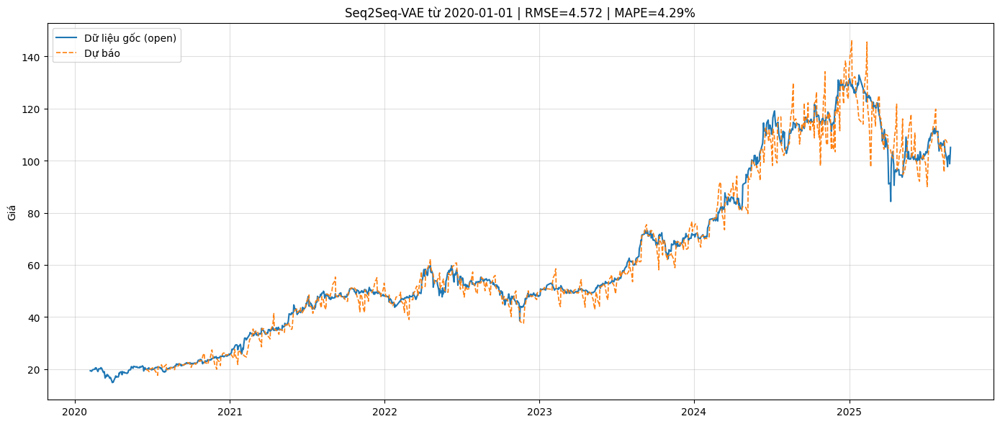

In [ ]:
# ======================
# 6) Backtest: dự báo từ 2020 đến hết dữ liệu (multi-step direct, step = H)
# ======================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo", linewidth=1.2)
plt.title(f"Seq2Seq-VAE từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


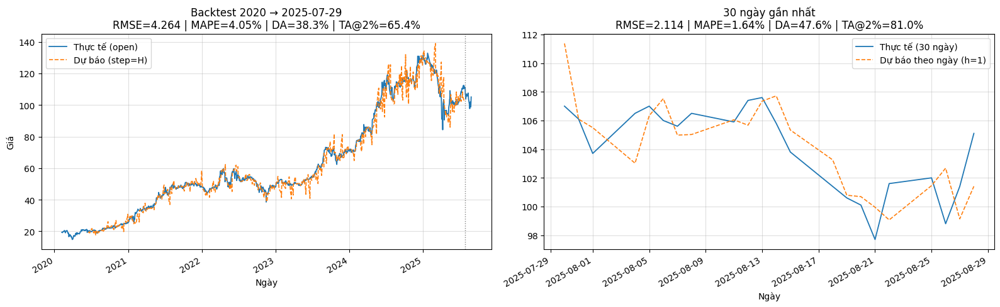

In [ ]:
# =========================================
# PLOTTING & TREND METRICS (KHÔNG ĐỘNG VÀO MÔ HÌNH)
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> (max-30d), step = H
# (2) 30 ngày gần nhất: dự báo theo ngày (h=1)
# + Tính thêm DA, TA@x% và xoay nhãn trục X
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- các hàm đánh giá xu hướng ----
def trend_labels_from_prices(prices, thr=0.0):
    """Trả về nhãn xu hướng {-1,0,1} dựa trên % thay đổi và ngưỡng thr (vd: 0.02 = 2%)"""
    r = (prices[1:] - prices[:-1]) / np.where(prices[:-1] == 0, 1e-9, prices[:-1])
    up  = (r >  thr).astype(int)
    down= (r < -thr).astype(int)
    lab = np.where(up==1, 1, np.where(down==1, -1, 0))
    return lab

def directional_accuracy(y_true, y_pred):
    n = min(len(y_true), len(y_pred))
    return float((y_true[:n] == y_pred[:n]).mean()) if n > 0 else np.nan

def ta_within_tol(actual, pred, tol=0.02):
    """TA@tol: nếu sai hướng nhưng |err%| < tol thì vẫn tính 'không sai nghiêm trọng'"""
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    act = actual[:n]; prd = pred[:n]
    # lấy nhãn xu hướng với thr=0 (chỉ xét hướng), sau đó áp dụng dung sai theo giá
    y_true = trend_labels_from_prices(act, thr=0.0)
    y_pred = trend_labels_from_prices(prd, thr=0.0)
    # lỗi phần trăm tại các mốc (bỏ phần tử đầu vì nhãn dùng diff)
    pct_err = np.abs((act[1:] - prd[1:]) / np.where(act[1:] == 0, 1e-9, act[1:]))
    ok = (y_true == y_pred) | (pct_err <= tol)
    return float(ok.mean())

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training (ret=shift(-1))

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) mốc tách: max - 30 ngày ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# =========================================
# (1) BACKTEST 2020 -> cutoff (multi-step, step=H)
# =========================================
# tìm chỉ số phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu đến {pd.Timestamp(cutoff).date()} cho W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)
bt_pred, bt_idx = [], []

for i in range(steps):
    e = W + i * H                       # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]    # (W,F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]
    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets: seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                       # (H,)
    tgt_end = min(e + H, cut_idx + 1)
    take    = max(0, tgt_end - e)
    if take:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp với bt_idx bằng mask (tránh reindex lỗi trùng nhãn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ độ dài
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Sai số giá & xu hướng
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / np.where(bt_actual==0, 1e-9, bt_actual))) * 100) if n1 else np.nan
# xu hướng (ngưỡng để tránh nhiễu — bạn có thể chỉnh)
THR = 0.002  # 0.2%
y_true_bt = trend_labels_from_prices(bt_actual, thr=THR)
y_pred_bt = trend_labels_from_prices(bt_pred,   thr=THR)
bt_DA     = directional_accuracy(y_true_bt, y_pred_bt)
bt_TA2    = ta_within_tol(bt_actual, bt_pred, tol=0.02)

# =========================================
# (2) 30 NGÀY GẦN NHẤT: dự báo THEO NGÀY (h=1)
# =========================================
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để dự báo.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])  # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / np.where(last_actual==0, 1e-9, last_actual))) * 100) if n2 else np.nan
y_true_d = trend_labels_from_prices(last_actual, thr=THR)
y_pred_d = trend_labels_from_prices(d_pred,       thr=THR)
d_DA     = directional_accuracy(y_true_d, y_pred_d)
d_TA2    = ta_within_tol(last_actual, d_pred, tol=0.02)

# =========================================
#  VẼ 2 BIỂU ĐỒ CẠNH NHAU + XOAY NHÃN TRỤC X
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# (trái) 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()}\n"
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | DA={bt_DA*100:.1f}% | TA@2%={bt_TA2*100:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
for tick in axes[0].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

# (phải) 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"30 ngày gần nhất\n"
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | DA={d_DA*100:.1f}% | TA@2%={d_TA2*100:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
for tick in axes[1].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

plt.tight_layout(); plt.show()



=== Đánh giá trung hạn 20 ngày ===


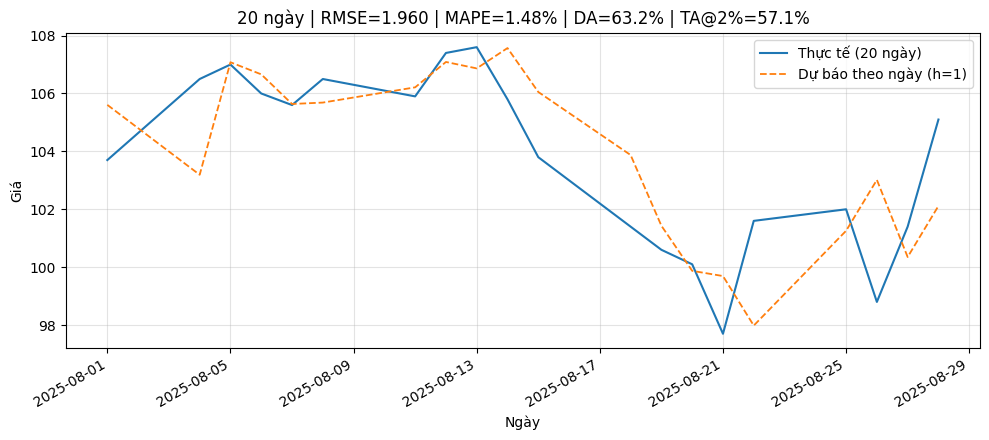


=== Đánh giá trung hạn 30 ngày ===


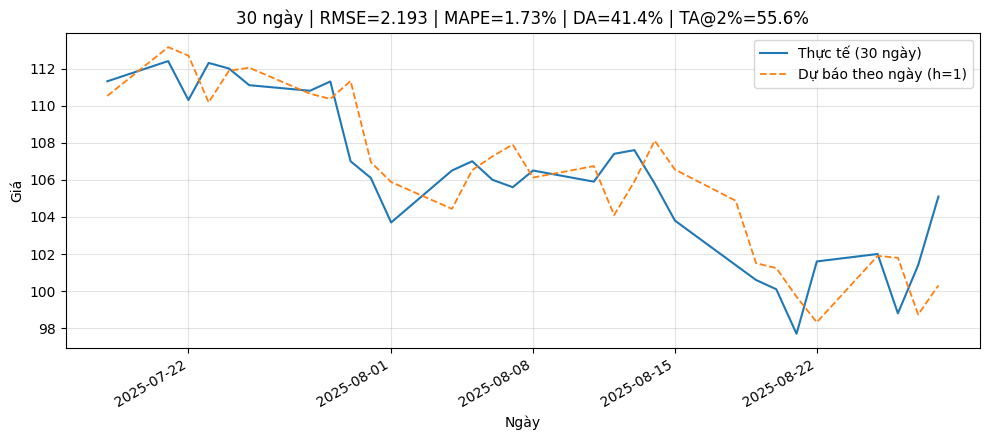


=== Đánh giá trung hạn 60 ngày ===


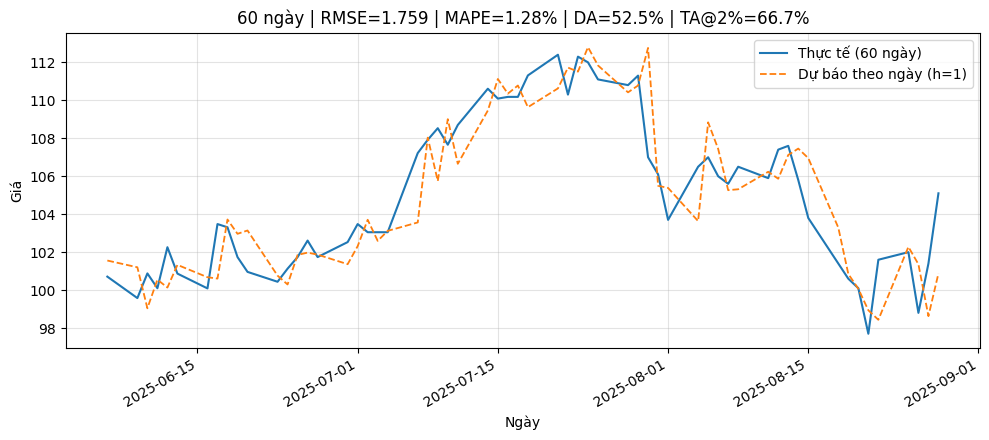


Tóm tắt trung hạn:
    N      rmse      mape         DA      TA@2%       start         end
0  20  1.960398  1.475474  63.157895  57.142857  2025-08-01  2025-08-28
1  30  2.193391  1.726119  41.379310  55.555556  2025-07-18  2025-08-28
2  60  1.758729  1.277783  52.542373  66.666667  2025-06-06  2025-08-28


In [ ]:
# ============================================
# DỰ BÁO TRUNG HẠN THEO NGÀY CHO 20/30/60 NGÀY (h=1)
# - Reuse model đã nạp: vae, x_scaler, cfg
# - Tính các chỉ số RMSE, MAPE, DA, TA@2%
# - Vẽ 1 figure riêng cho mỗi khung ngày
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


## So sánh với mô hình base line

In [ ]:
# ============================================================
# CODE 2 — VAE seq2seq (đã có) + Baseline #2: TCN (Temporal Convolutional Network)
# - cùng đặc trưng & đầu vào: (W,F) -> H bước log-return (multi-step direct)
# ============================================================
import os, json, joblib, numpy as np, pandas as pd
import tensorflow as tf
from keras import models as keras_models, layers, optimizers, callbacks
from keras import ops as K

BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

W = int(cfg["W"]); H = int(cfg["H"])
HIDDEN = int(cfg["HIDDEN"]); DROPOUT = float(cfg["DROPOUT"])
LR = float(cfg["LR"]); BATCH = int(cfg["BATCH"]); EPOCHS = int(cfg["EPOCHS"])
TARGET_COL = cfg["TARGET_COL"]; feature_cols_cfg = cfg["feature_cols"]
assert "df" in globals(), "Cần có biến df trong môi trường."

def make_design_matrix(df_in: pd.DataFrame, feature_cols, target_col, W, H, scaler):
    df_use = df_in.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill().fillna(0.0)
               .clip(-1e6, 1e6)
    )
    X_scaled = scaler.transform(X_feats.astype("float32")).astype("float32")
    prices = df_use[target_col].to_numpy(dtype=np.float32)

    eps = 1e-9
    logret = np.zeros_like(prices, dtype=np.float32)
    logret[1:] = np.log((prices[1:] + eps) / (np.maximum(prices[:-1], eps)))

    Xs, Ys = [], []
    for end in range(W, len(prices) - H):
        Xs.append(X_scaled[end - W:end])
        Ys.append(logret[end + 1:end + 1 + H])
    return np.asarray(Xs, np.float32), np.asarray(Ys, np.float32), df_use

X_all, y_all, df_use = make_design_matrix(df, feature_cols_cfg, TARGET_COL, W, H, x_scaler)
F = X_all.shape[-1]
print("Data:", X_all.shape, y_all.shape)

# --------- Baseline #2: TCN ----------
def ResidualBlock(x, dilation, filters, kernel_size=3, dropout=0.2):
    # causal padding cho TCN
    pad = (kernel_size - 1) * dilation
    x_in = x
    x = layers.ZeroPadding1D((pad, 0))(x)
    x = layers.Conv1D(filters, kernel_size, dilation_rate=dilation, padding="valid", activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    x = layers.ZeroPadding1D((pad, 0))(x)
    x = layers.Conv1D(filters, kernel_size, dilation_rate=dilation, padding="valid", activation="relu")(x)
    # match chiều
    if x_in.shape[-1] != filters:
        x_in = layers.Conv1D(filters, 1, padding="same")(x_in)
    out = layers.Add()([x, x_in])
    out = layers.Activation("relu")(out)
    return out

def build_tcn_baseline(W, F, H, hidden=128, dropout=0.2):
    inp = layers.Input(shape=(W, F))
    x = inp
    # 3–4 block dãn nở: 1,2,4,8
    for d in [1, 2, 4, 8]:
        x = ResidualBlock(x, dilation=d, filters=hidden, kernel_size=3, dropout=dropout)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    out = layers.Dense(H, activation="linear")(x)  # H bước log-return
    model = keras_models.Model(inp, out)
    model.compile(optimizer=optimizers.Adam(LR), loss="mse")
    return model

baseline2 = build_tcn_baseline(W, F, H, hidden=HIDDEN, dropout=DROPOUT)
baseline2.summary()

VAL_SPLIT = float(cfg.get("VAL_SPLIT", 0.2))
es = callbacks.EarlyStopping(patience=5, restore_best_weights=True, monitor="val_loss")
hist = baseline2.fit(X_all, y_all, validation_split=VAL_SPLIT,
                     epochs=EPOCHS, batch_size=BATCH, verbose=1, callbacks=[es])

baseline2_path = os.path.join(BEST_DIR, "baseline_tcn.keras")
baseline2.save(baseline2_path)

# --------- Backtest H ngày cuối ----------
X_feats = df_use[feature_cols_cfg]
X_scaled = x_scaler.transform(
    X_feats.replace([np.inf,-np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6,1e6).astype("float32")
).astype("float32")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
times  = pd.to_datetime(df_use["time"]).to_numpy("datetime64[ns]")

bt_window = X_scaled[-H - W : -H]              # (W,F)
pred_rets_b2 = baseline2.predict(bt_window[None, ...], verbose=0)[0]  # (H,)
pred_rets_vae = vae.predict(bt_window[None, ...], verbose=0)[0, :, 0] # (H,)

def roll_from_returns(start_price, rets):
    seq = [float(start_price)]
    for r in rets: seq.append(seq[-1] * np.exp(float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

start_price = prices[-H - 1]
pred_prices_b2  = roll_from_returns(start_price, pred_rets_b2)
pred_prices_vae = roll_from_returns(start_price, pred_rets_vae)
actual_idx      = times[-H:]
actual_prices   = prices[-H:]

rmse_b2 = float(np.sqrt(np.mean((pred_prices_b2 - actual_prices)**2)))
mape_b2 = float(np.mean(np.abs((actual_prices - pred_prices_b2) / actual_prices)) * 100)
rmse_v  = float(np.sqrt(np.mean((pred_prices_vae - actual_prices)**2)))
mape_v  = float(np.mean(np.abs((actual_prices - pred_prices_vae) / actual_prices)) * 100)

print(f"[Backtest H-cuối] Baseline#2 (TCN): RMSE={rmse_b2:.4f} | MAPE={mape_b2:.2f}%")
print(f"[Backtest H-cuối] VAE seq2seq    : RMSE={rmse_v :.4f} | MAPE={mape_v :.2f}%")


Data: (1383, 90, 20) (1383, 7)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 90, 20)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d      │ (None, 92, 20)    │          0 │ input_layer[0][0] │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 90, 128)   │      7,808 │ zero_padding1d[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 90, 128)   │          0 │ conv1d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_1    │ (None, 92, 128)   │          0 │ dropout[0][0]     │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 90, 128)   │     49,280 │ zero_padding1d_1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 90, 128)   │      2,688 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 90, 128)   │          0 │ conv1d_1[0][0],   │
│                     │                   │            │ conv1d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 90, 128)   │          0 │ add[0][0]         │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_2    │ (None, 94, 128)   │          0 │ activation[0][0]  │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 90, 128)   │     49,280 │ zero_padding1d_2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 90, 128)   │          0 │ conv1d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_3    │ (None, 94, 128)   │          0 │ dropout_1[0][0]   │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_4 (Conv1D)   │ (None, 90, 128)   │     49,280 │ zero_padding1d_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 90, 128)   │          0 │ conv1d_4[0][0],   │
│                     │                   │            │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 90, 128)   │          0 │ add_1[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_4    │ (None, 98, 128)   │          0 │ activation_1[0][… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_5 (Conv1D)   │ (None, 90, 128)   │     49,280 │ zero_padding1d_4… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 90, 128)   │          0 │ conv1d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_5    │ (None, 98, 128)   │          0 │ dropout_2[0][0] 

 Total params: 372,871 (1.42 MB)

 Trainable params: 372,871 (1.42 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - loss: 0.2426 - val_loss: 0.0308
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - loss: 0.0131 - val_loss: 0.0163
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - loss: 0.0048 - val_loss: 0.0048
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 0.0023 - val_loss: 0.0057
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - loss: 0.0015 - val_loss: 0.0034
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - loss: 0.0010 - val_loss: 0.0040
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - loss: 6.5734e-04 - val_loss: 0.0039
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - loss: 4.6859e-04 - val_loss: 0.0031
Epoch 9/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 4.0083e-04 - val_loss: 0.0027
Epoch 10/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - loss: 3.6036e-04 - val_loss: 0.0026
[Backtest H-cuối] Baseline#2 (TCN): RMSE=3.7988 | MAPE=3.31%
[Backtest H-cuối] VAE seq2seq    : RMSE=3.3182 | MAPE=2.35%


## Đánh giá mô hình VAE Seq2Seq & TCN

In [ ]:
# ============================================================
# EVAL for CODE 2 — VAE vs Baseline#2 (TCN)
# Tạo 2 bảng chỉ số: Backtest & 30 ngày gần nhất (h=1)
# ============================================================
import numpy as np, pandas as pd

K_LIST = [1, 20, 30]
TAU, EPS = 0.02, 1e-9

def pct_change_safe(a, b):
    return (a - b) / np.where(np.abs(b) < EPS, np.sign(b) * EPS + (b == 0)*EPS, b)

def directional_accuracy_k(y_true, y_pred, k: int) -> float:
    if len(y_true) <= k or len(y_pred) <= k: return np.nan
    t_dir = np.sign(y_true[k:] - y_true[:-k])
    p_dir = np.sign(y_pred[k:] - y_pred[:-k])
    m = min(len(t_dir), len(p_dir))
    return float((t_dir[:m] == p_dir[:m]).mean() * 100)

def slope_sign(arr):
    t = np.arange(len(arr)); a, _ = np.polyfit(t, arr, 1)
    return np.sign(a)

def slope_da_k(y_true, y_pred, k: int) -> float:
    m = min(len(y_true), len(y_pred)) - k + 1
    if m <= 0: return np.nan
    ok = sum(slope_sign(y_true[i:i+k]) == slope_sign(y_pred[i:i+k]) for i in range(m))
    return float(ok / m * 100)

def ta_daily_with_tol(actual, pred, tol=0.02):
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    r_true = pct_change_safe(actual[1:], actual[:-1])
    r_pred = pct_change_safe(pred[1:],   pred[:-1])
    lab_t  = np.where(r_true > 0, 1, np.where(r_true < 0, -1, 0))
    lab_p  = np.where(r_pred > 0, 1, np.where(r_pred < 0, -1, 0))
    pct_err = np.abs(pct_change_safe(actual[1:], pred[1:]))
    ok = (lab_t == lab_p) | (pct_err <= tol)
    return float(ok.mean() * 100)

def ta_k_return(actual, pred, k: int, tau: float = 0.02):
    if len(actual) <= k or len(pred) <= k: return np.nan
    rt = (actual[k:] / np.where(np.abs(actual[:-k]) < EPS, EPS, actual[:-k])) - 1.0
    rp = (pred[k:]   / np.where(np.abs(pred[:-k])   < EPS, EPS, pred[:-k]))   - 1.0
    m  = min(len(rt), len(rp))
    denom = np.where(np.abs(rt[:m]) < EPS, 1.0, np.abs(rt[:m]))
    pe = np.abs((rt[:m] - rp[:m]) / denom)
    return float((pe <= tau).mean() * 100)

def mae(a, b): return float(np.mean(np.abs(a - b)))
def rmse(a, b): return float(np.sqrt(np.mean((a - b) ** 2)))
def mape(a, b): return float(np.mean(np.abs(pct_change_safe(a, b))) * 100)

# ---- Chuẩn bị dữ liệu ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = (X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6))
X_all_scaled = x_scaler.transform(X_feats.astype("float32")).astype("float32")

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) Backtest (multi-step direct, step=H) ----
max_date = times.max()
cutoff = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))
if cut_idx + 1 < W + H:
    raise ValueError("Không đủ dữ liệu cho backtest.")

def roll_price_from_rets(p0, rets):
    seq = [float(p0)]
    for r in rets: seq.append(seq[-1] * np.exp(float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

bt_idx, bt_pred_vae, bt_pred_tcn = [], [], []
for i in range(max(0, (cut_idx + 1 - W) // H)):
    e = W + i * H
    if e - 1 > cut_idx - H: break
    win = X_all_scaled[e - W:e]
    # VAE
    r_vae = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p_vae = roll_price_from_rets(prices[e - 1], r_vae)
    # TCN
    r_tcn = baseline2.predict(win[None, ...], verbose=0)[0]
    p_tcn = roll_price_from_rets(prices[e - 1], r_tcn)
    tgt_end = min(e + H, cut_idx + 1); take = max(0, tgt_end - e)
    if take:
        bt_pred_vae.extend(p_vae[:take]); bt_pred_tcn.extend(p_tcn[:take])
        bt_idx.extend(times[e:tgt_end])

bt_idx = np.asarray(bt_idx, dtype="datetime64[ns]")
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]
n = min(len(bt_idx), len(bt_actual), len(bt_pred_vae), len(bt_pred_tcn))
bt_idx, bt_actual = bt_idx[:n], bt_actual[:n]
bt_pred_vae, bt_pred_tcn = np.asarray(bt_pred_vae[:n]), np.asarray(bt_pred_tcn[:n])

def build_metric_row(actual, pred):
    return {
        "RMSE": rmse(actual, pred),
        "MAPE": mape(actual, pred),
        "MAE":  mae(actual, pred),
        "DA@1": directional_accuracy_k(actual, pred, 1),
        "DA@20": directional_accuracy_k(actual, pred, 20),
        "Slope-DA@20": slope_da_k(actual, pred, 20),
        "TA(daily@2%)": ta_daily_with_tol(actual, pred, tol=TAU)
    }

tbl_backtest = pd.DataFrame({
    "VAE seq2seq": build_metric_row(bt_actual, bt_pred_vae),
    "Baseline#2 TCN": build_metric_row(bt_actual, bt_pred_tcn),
}).round(4)

print("\n=== BẢNG CHỈ SỐ — BACKTEST ===")
print(tbl_backtest)

# ---- 2) 30 ngày gần nhất — one-step (h=1) ----
last_mask = times > cutoff
first_last_idx = int(np.where(last_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó.")

last_times  = times[last_mask]
last_actual = prices[last_mask]

pred_vae_1d, pred_tcn_1d = [], []
for t_idx in range(first_last_idx, len(times)):
    win = X_all_scaled[t_idx - W : t_idx]
    p0  = float(prices[t_idx - 1])
    # VAE
    r = vae.predict(win[None, ...], verbose=0)[0, :, 0][0]
    pred_vae_1d.append(p0 * np.exp(float(r)))
    # TCN
    r = baseline2.predict(win[None, ...], verbose=0)[0][0]
    pred_tcn_1d.append(p0 * np.exp(float(r)))

pred_vae_1d = np.asarray(pred_vae_1d, dtype=np.float32)
pred_tcn_1d = np.asarray(pred_tcn_1d, dtype=np.float32)
n2 = min(len(pred_vae_1d), len(pred_tcn_1d), len(last_actual))
last_actual = last_actual[:n2]; pred_vae_1d = pred_vae_1d[:n2]; pred_tcn_1d = pred_tcn_1d[:n2]

tbl_last30 = pd.DataFrame({
    "VAE seq2seq": build_metric_row(last_actual, pred_vae_1d),
    "TCN": build_metric_row(last_actual, pred_tcn_1d),
}).round(4)

print("\n=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===")
tbl_last30



=== BẢNG CHỈ SỐ — BACKTEST ===
              VAE seq2seq  Baseline#2 TCN
RMSE               4.3167          4.6869
MAPE               4.6379          3.2611
MAE                2.8684          2.5881
DA@1              43.3284         45.1613
DA@20             74.4238         78.8104
Slope-DA@20       74.0713         82.6152
TA(daily@2%)      62.6100         71.2610

=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===


,VAE seq2seq,TCN
RMSE,2.1471,4.2870
MAPE,1.6861,3.7656
MAE,1.7460,3.7451
DA@1,71.4286,52.3810
DA@20,100.0000,100.0000
Slope-DA@20,100.0000,100.0000
TA(daily@2%),85.7143,61.9048


## So sánh VAE Seq2Seq & MLP

Data shapes: (1383, 90, 20) (1383, 7)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 90, 20)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1800)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       230,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 247,943 (968.53 KB)

 Trainable params: 247,943 (968.53 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.4217 - val_loss: 0.3687
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.1020 - val_loss: 0.2308
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0378 - val_loss: 0.1511
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0210 - val_loss: 0.1084
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0119 - val_loss: 0.0728
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0076 - val_loss: 0.0598
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0057 - val_loss: 0.0519
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0043 - val_loss: 0.0451
Epoch 9/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0033 - val_loss: 0.0405
Epoch 10/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0027 - val_loss: 0.0368


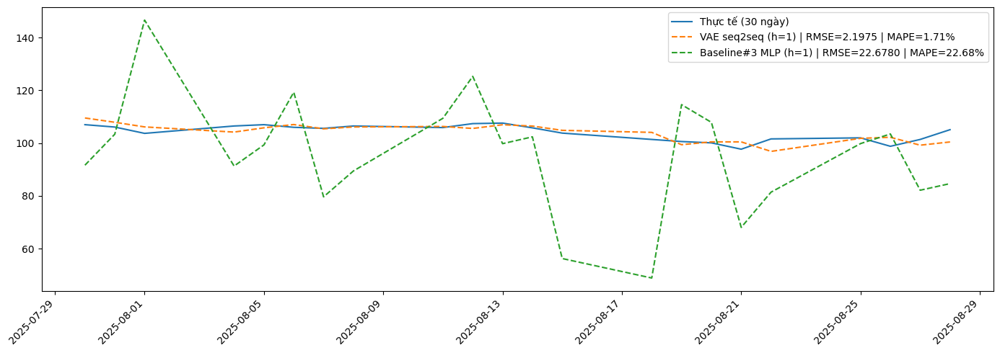


=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===
              VAE seq2seq       MLP
RMSE               2.1975   22.6780
MAPE               1.7112   22.6805
MAE                1.7587   17.7840
DA@1              61.9048   52.3810
DA@20            100.0000  100.0000
Slope-DA@20      100.0000  100.0000
TA(daily@2%)      80.9524   52.3810


In [ ]:
# ============================================================
# BASELINE #3 — MLP (Flatten W×F -> Dense -> Dense(H))
# So sánh với VAE seq2seq bằng cùng đặc trưng & tham số
# ============================================================
import os, json, joblib, numpy as np, pandas as pd
import tensorflow as tf
from keras import models as keras_models, layers, callbacks, optimizers
from keras import ops as K

# ---------- 0) LOAD VAE + SCALER + CFG ----------
BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# Custom objects của bạn (đã định nghĩa ở nơi khác)
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

W = int(cfg["W"]); H = int(cfg["H"])
HIDDEN = int(cfg["HIDDEN"]); DROPOUT = float(cfg["DROPOUT"])
LR = float(cfg["LR"]); BATCH = int(cfg["BATCH"]); EPOCHS = int(cfg["EPOCHS"])
VAL_SPLIT = float(cfg.get("VAL_SPLIT", 0.2))
TARGET_COL = cfg["TARGET_COL"]; feature_cols_cfg = cfg["feature_cols"]

assert "df" in globals(), "Cần có biến df trong môi trường."

# ---------- 1) DATA PIPELINE (y như bạn đang dùng) ----------
EPS = 1e-9

def make_design_matrix(df_in, feature_cols, target_col, W, H, scaler):
    df_use = df_in.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill().fillna(0.0)
               .clip(-1e6, 1e6)
    )
    X_scaled = scaler.transform(X_feats.astype("float32")).astype("float32")
    prices = df_use[target_col].to_numpy(dtype=np.float32)

    # LOG-RETURN (đổi thành simple return nếu bạn huấn luyện theo simple)
    logret = np.zeros_like(prices, dtype=np.float32)
    logret[1:] = np.log((prices[1:] + EPS) / (np.maximum(prices[:-1], EPS)))

    Xs, Ys = [], []
    for end in range(W, len(prices) - H):
        Xs.append(X_scaled[end - W:end])                       # (W,F)
        Ys.append(logret[end + 1:end + 1 + H])                # (H,)
    return np.asarray(Xs, np.float32), np.asarray(Ys, np.float32), df_use

X_all, y_all, df_use = make_design_matrix(df, feature_cols_cfg, TARGET_COL, W, H, x_scaler)
F = X_all.shape[-1]
print("Data shapes:", X_all.shape, y_all.shape)

# ---------- 2) BASELINE #3: MLP (Flatten -> Dense -> Dense(H)) ----------
def build_mlp_baseline(W, F, H, hidden=128, dropout=0.2):
    inp = layers.Input(shape=(W, F))
    x = layers.Flatten()(inp)                       # (W*F,)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    out = layers.Dense(H, activation="linear")(x)   # H bước log-return
    model = keras_models.Model(inp, out)
    model.compile(optimizer=optimizers.Adam(LR), loss="mse")
    return model

baseline3 = build_mlp_baseline(W, F, H, hidden=HIDDEN, dropout=DROPOUT)
baseline3.summary()

# Train + early stopping
es = callbacks.EarlyStopping(patience=5, restore_best_weights=True, monitor="val_loss")
hist = baseline3.fit(
    X_all, y_all,
    validation_split=VAL_SPLIT,
    epochs=EPOCHS, batch_size=BATCH, verbose=1, callbacks=[es]
)

# Save
baseline3_path = os.path.join(BEST_DIR, "baseline_mlp.keras")
baseline3.save(baseline3_path)

# ---------- 3) BACKTEST H ngày cuối ----------
def roll_from_returns(p0, rets, use_log=True):
    seq = [float(p0)]
    for r in rets:
        if use_log:
            seq.append(seq[-1] * np.exp(float(r)))   # đổi thành *(1+r) nếu simple return
        else:
            seq.append(seq[-1] * (1.0 + float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

X_feats = df_use[feature_cols_cfg]
X_scaled_full = x_scaler.transform(
    X_feats.replace([np.inf,-np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6,1e6).astype("float32")
).astype("float32")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
times  = pd.to_datetime(df_use["time"]).to_numpy("datetime64[ns]")

bt_window = X_scaled_full[-H - W : -H]  # (W,F)
pred_rets_vae = vae.predict(bt_window[None, ...], verbose=0)[0, :, 0]   # (H,)
pred_rets_mlp = baseline3.predict(bt_window[None, ...], verbose=0)[0]   # (H,)

start_price = prices[-H - 1]
pred_prices_vae = roll_from_returns(start_price, pred_rets_vae, use_log=True)
pred_prices_mlp = roll_from_returns(start_price, pred_rets_mlp, use_log=True)
actual_idx      = times[-H:]
actual_prices   = prices[-H:]

# ---------- 4) TRỰC QUAN 30 NGÀY GẦN NHẤT (h=1) ----------
import matplotlib.pyplot as plt

def one_step_price(model_kind, win_scaled, prev_price):
    if model_kind == "vae":
        r1 = float(vae.predict(win_scaled[None, ...], verbose=0)[0, 0, 0])
    elif model_kind == "mlp":
        r1 = float(baseline3.predict(win_scaled[None, ...], verbose=0)[0][0])
    else:
        raise ValueError("model_kind?")
    return prev_price * np.exp(r1)  # đổi thành *(1+r1) nếu simple return

# Chuẩn bị 30 ngày cuối
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")
last_mask = times > cutoff
if not last_mask.any():
    raise ValueError("Không có 30 ngày cuối để trực quan.")
first_last_idx = int(np.where(last_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó.")

last_times  = times[last_mask]
last_actual = prices[last_mask]

pred_vae_1d, pred_mlp_1d = [], []
for t_idx in range(first_last_idx, len(times)):
    win = X_scaled_full[t_idx - W : t_idx]
    p0  = float(prices[t_idx - 1])
    pred_vae_1d.append(one_step_price("vae", win, p0))
    pred_mlp_1d.append(one_step_price("mlp", win, p0))

pred_vae_1d = np.asarray(pred_vae_1d, dtype=np.float32)
pred_mlp_1d = np.asarray(pred_mlp_1d, dtype=np.float32)
n = min(len(pred_vae_1d), len(pred_mlp_1d), len(last_actual))
pred_vae_1d, pred_mlp_1d, d_times, last_actual = pred_vae_1d[:n], pred_mlp_1d[:n], last_times[:n], last_actual[:n]

def pct_change_safe(a, b, eps=1e-9): return (a - b) / np.where(np.abs(b) < eps, np.sign(b) * eps + (b == 0)*eps, b)
def RMSE(a,b): return float(np.sqrt(np.mean((a-b)**2)))
def MAPE(a,b): return float(np.mean(np.abs(pct_change_safe(a,b))) * 100)
def MAE(a,b):  return float(np.mean(np.abs(a-b)))

rmse_v = RMSE(pred_vae_1d, last_actual);  mape_v = MAPE(last_actual, pred_vae_1d);  mae_v = MAE(pred_vae_1d, last_actual)
rmse_m = RMSE(pred_mlp_1d, last_actual);  mape_m = MAPE(last_actual, pred_mlp_1d);  mae_m = MAE(pred_mlp_1d, last_actual)

plt.figure(figsize=(14,5))
plt.plot(d_times, last_actual, label="Thực tế (30 ngày)")
plt.plot(d_times, pred_vae_1d, "--", label=f"VAE seq2seq (h=1) | RMSE={rmse_v:.4f} | MAPE={mape_v:.2f}%")
plt.plot(d_times, pred_mlp_1d, "--", label=f"Baseline#3 MLP (h=1) | RMSE={rmse_m:.4f} | MAPE={mape_m:.2f}%")
plt.xticks(rotation=45, ha="right"); plt.legend(); plt.tight_layout(); plt.show()

# ---------- 5) BẢNG ĐÁNH GIÁ (Backtest & 30 ngày) ----------
def directional_accuracy_k(y_true, y_pred, k:int)->float:
    if len(y_true) <= k or len(y_pred) <= k: return np.nan
    t_dir = np.sign(y_true[k:] - y_true[:-k])
    p_dir = np.sign(y_pred[k:] - y_pred[:-k])
    m = min(len(t_dir), len(p_dir))
    return float((t_dir[:m] == p_dir[:m]).mean() * 100)

def slope_sign(arr):
    t = np.arange(len(arr))
    a, _ = np.polyfit(t, arr, 1)
    return np.sign(a)

def slope_da_k(y_true, y_pred, k:int)->float:
    m = min(len(y_true), len(y_pred)) - k + 1
    if m <= 0: return np.nan
    ok = sum(slope_sign(y_true[i:i+k]) == slope_sign(y_pred[i:i+k]) for i in range(m))
    return float(ok / m * 100)

def ta_daily_with_tol(actual, pred, tol=0.02):
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    r_true = pct_change_safe(actual[1:], actual[:-1])
    r_pred = pct_change_safe(pred[1:],   pred[:-1])
    lab_t  = np.where(r_true > 0, 1, np.where(r_true < 0, -1, 0))
    lab_p  = np.where(r_pred > 0, 1, np.where(r_pred < 0, -1, 0))
    pct_err = np.abs(pct_change_safe(actual[1:], pred[1:]))
    ok = (lab_t == lab_p) | (pct_err <= 0.02)
    return float(ok.mean() * 100)

def ta_k_return(actual, pred, k:int, tau:float=0.02):
    if len(actual) <= k or len(pred) <= k: return np.nan
    rt = (actual[k:] / np.where(np.abs(actual[:-k]) < EPS, EPS, actual[:-k])) - 1.0
    rp = (pred[k:]   / np.where(np.abs(pred[:-k])   < EPS, EPS, pred[:-k]))   - 1.0
    m  = min(len(rt), len(rp))
    denom = np.where(np.abs(rt[:m]) < EPS, 1.0, np.abs(rt[:m]))
    pe = np.abs((rt[:m] - rp[:m]) / denom)
    return float((pe <= tau).mean() * 100)

def build_metric_row(actual, pred):
    return {
        "RMSE": RMSE(actual, pred),
        "MAPE": MAPE(actual, pred),
        "MAE":  MAE(actual, pred),
        "DA@1": directional_accuracy_k(actual, pred, 1),
        "DA@20": directional_accuracy_k(actual, pred, 20),
        "Slope-DA@20": slope_da_k(actual, pred, 20),
        "TA(daily@2%)": ta_daily_with_tol(actual, pred, tol=0.02)
    }

# --- Backtest (đang có pred_prices_vae / pred_prices_mlp / actual_prices) ---
# tbl_backtest = pd.DataFrame({
#     "VAE seq2seq": build_metric_row(actual_prices, pred_prices_vae),
#     "Baseline#3 MLP": build_metric_row(actual_prices, pred_prices_mlp),
# }).round(4)
# print("\n=== BẢNG CHỈ SỐ — BACKTEST ===")
# print(tbl_backtest)

# --- 30 ngày gần nhất (h=1) ---
tbl_last30 = pd.DataFrame({
    "VAE seq2seq": build_metric_row(last_actual, pred_vae_1d),
    "MLP": build_metric_row(last_actual, pred_mlp_1d),
}).round(4)
print("\n=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===")
print(tbl_last30)


# Dự đoán với ITC

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/ITC_history_2020-01-01_2025-09-01.csv"
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   time    1500 non-null   object 
 1   open    1500 non-null   float64
 2   high    1500 non-null   float64
 3   low     1500 non-null   float64
 4   close   1500 non-null   float64
 5   volume  1500 non-null   int64  
 6   symbol  1500 non-null   object 
dtypes: float64(4), int64(1), object(2)
memory usage: 82.2+ KB


In [ ]:

df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)

# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["open"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')

In [ ]:
# ----- cấu hình đường dẫn artifacts -----
BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# ----- 3) Làm sạch feature rồi scale (KHÔNG fit lại) -----
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# ----- 4) Backtest H ngày cuối (multi-step direct) -----
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")


[Backtest] H=7: RMSE=1.1474 | MAPE=6.11%


[Backtest toàn bộ từ 2020] RMSE=1.085 | MAPE=6.24%


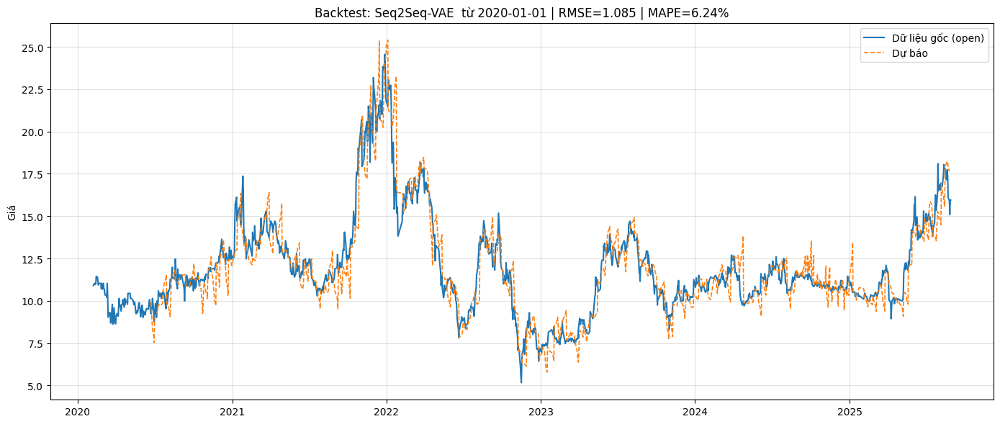

In [ ]:
start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"[Backtest toàn bộ từ 2020] RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo", linewidth=1.2)
plt.title(f"Backtest: Seq2Seq-VAE  từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


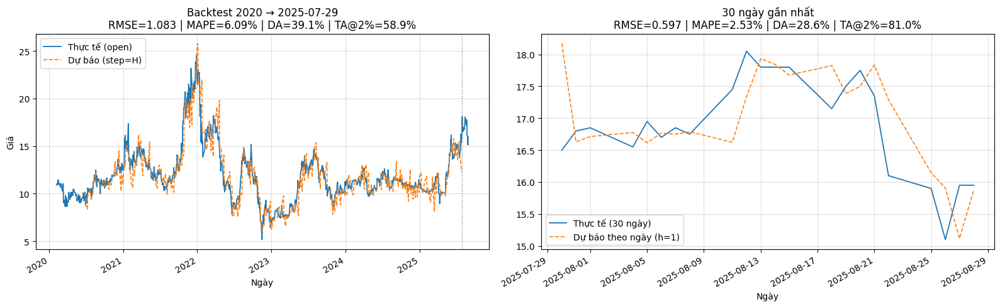

In [ ]:
# =========================================
# PLOTTING & TREND METRICS (KHÔNG ĐỘNG VÀO MÔ HÌNH)
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> (max-30d), step = H
# (2) 30 ngày gần nhất: dự báo theo ngày (h=1)
# + Tính thêm DA, TA@x% và xoay nhãn trục X
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- các hàm đánh giá xu hướng ----
def trend_labels_from_prices(prices, thr=0.0):
    """Trả về nhãn xu hướng {-1,0,1} dựa trên % thay đổi và ngưỡng thr (vd: 0.02 = 2%)"""
    r = (prices[1:] - prices[:-1]) / np.where(prices[:-1] == 0, 1e-9, prices[:-1])
    up  = (r >  thr).astype(int)
    down= (r < -thr).astype(int)
    lab = np.where(up==1, 1, np.where(down==1, -1, 0))
    return lab

def directional_accuracy(y_true, y_pred):
    n = min(len(y_true), len(y_pred))
    return float((y_true[:n] == y_pred[:n]).mean()) if n > 0 else np.nan

def ta_within_tol(actual, pred, tol=0.02):
    """TA@tol: nếu sai hướng nhưng |err%| < tol thì vẫn tính 'không sai nghiêm trọng'"""
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    act = actual[:n]; prd = pred[:n]
    # lấy nhãn xu hướng với thr=0 (chỉ xét hướng), sau đó áp dụng dung sai theo giá
    y_true = trend_labels_from_prices(act, thr=0.0)
    y_pred = trend_labels_from_prices(prd, thr=0.0)
    # lỗi phần trăm tại các mốc (bỏ phần tử đầu vì nhãn dùng diff)
    pct_err = np.abs((act[1:] - prd[1:]) / np.where(act[1:] == 0, 1e-9, act[1:]))
    ok = (y_true == y_pred) | (pct_err <= tol)
    return float(ok.mean())

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training (ret=shift(-1))

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) mốc tách: max - 30 ngày ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# =========================================
# (1) BACKTEST 2020 -> cutoff (multi-step, step=H)
# =========================================
# tìm chỉ số phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu đến {pd.Timestamp(cutoff).date()} cho W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)
bt_pred, bt_idx = [], []

for i in range(steps):
    e = W + i * H                       # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]    # (W,F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]
    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets: seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                       # (H,)
    tgt_end = min(e + H, cut_idx + 1)
    take    = max(0, tgt_end - e)
    if take:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp với bt_idx bằng mask (tránh reindex lỗi trùng nhãn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ độ dài
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Sai số giá & xu hướng
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / np.where(bt_actual==0, 1e-9, bt_actual))) * 100) if n1 else np.nan
# xu hướng (ngưỡng để tránh nhiễu — bạn có thể chỉnh)
THR = 0.002  # 0.2%
y_true_bt = trend_labels_from_prices(bt_actual, thr=THR)
y_pred_bt = trend_labels_from_prices(bt_pred,   thr=THR)
bt_DA     = directional_accuracy(y_true_bt, y_pred_bt)
bt_TA2    = ta_within_tol(bt_actual, bt_pred, tol=0.02)

# =========================================
# (2) 30 NGÀY GẦN NHẤT: dự báo THEO NGÀY (h=1)
# =========================================
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để dự báo.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])  # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / np.where(last_actual==0, 1e-9, last_actual))) * 100) if n2 else np.nan
y_true_d = trend_labels_from_prices(last_actual, thr=THR)
y_pred_d = trend_labels_from_prices(d_pred,       thr=THR)
d_DA     = directional_accuracy(y_true_d, y_pred_d)
d_TA2    = ta_within_tol(last_actual, d_pred, tol=0.02)

# =========================================
#  VẼ 2 BIỂU ĐỒ CẠNH NHAU + XOAY NHÃN TRỤC X
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# (trái) 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()}\n"
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | DA={bt_DA*100:.1f}% | TA@2%={bt_TA2*100:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
for tick in axes[0].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

# (phải) 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"30 ngày gần nhất\n"
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | DA={d_DA*100:.1f}% | TA@2%={d_TA2*100:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
for tick in axes[1].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

plt.tight_layout(); plt.show()



=== Đánh giá trung hạn 20 ngày ===


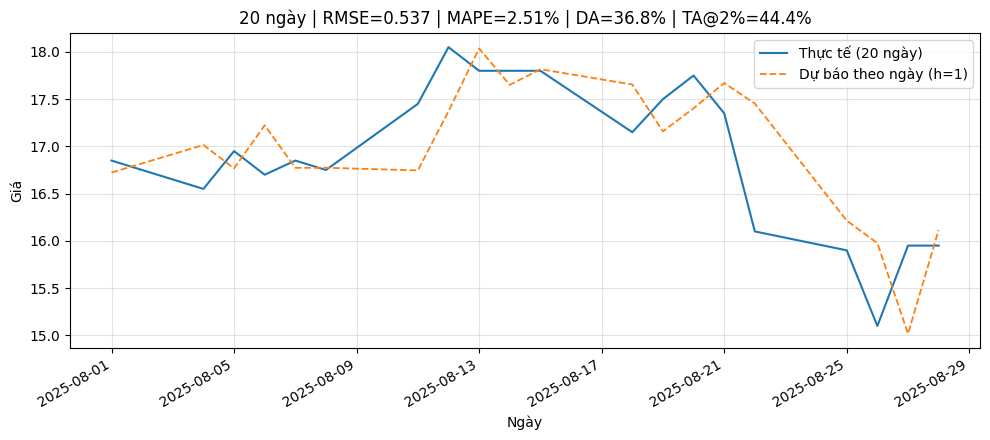


=== Đánh giá trung hạn 30 ngày ===


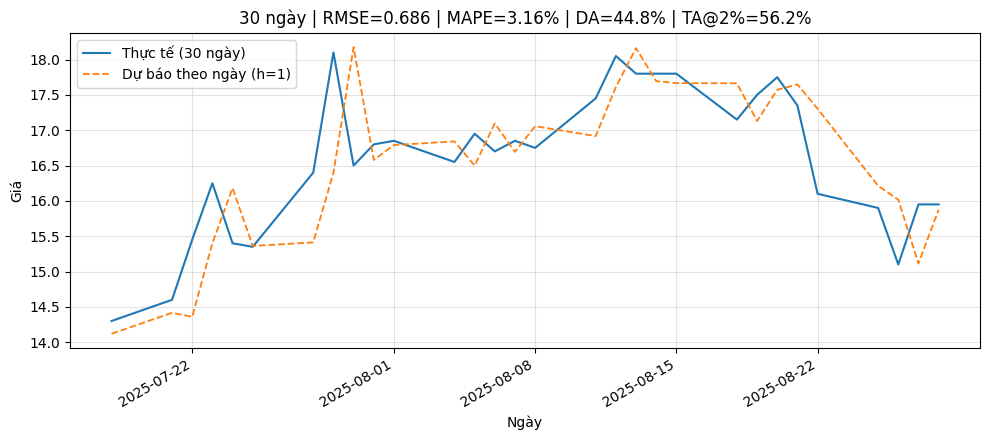


=== Đánh giá trung hạn 60 ngày ===


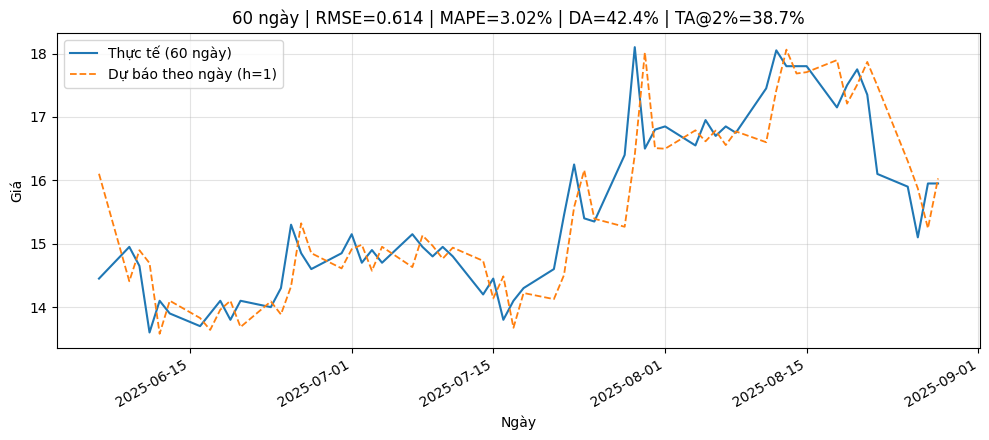


Tóm tắt trung hạn:
    N      rmse      mape         DA      TA@2%       start         end
0  20  0.537147  2.509744  36.842105  44.444444  2025-08-01  2025-08-28
1  30  0.686481  3.156239  44.827586  56.250000  2025-07-18  2025-08-28
2  60  0.614090  3.023762  42.372881  38.709677  2025-06-06  2025-08-28


In [ ]:
# ============================================
# DỰ BÁO TRUNG HẠN THEO NGÀY CHO 20/30/60 NGÀY (h=1)
# - Reuse model đã nạp: vae, x_scaler, cfg
# - Tính các chỉ số RMSE, MAPE, DA, TA@2%
# - Vẽ 1 figure riêng cho mỗi khung ngày
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


# Dự đoán với CMC

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/CMC_history_2020-01-01_2025-09-01.csv"
)
df.info()

In [ ]:
import pandas as pd
import numpy as np

# Giả sử df là dữ liệu gốc
df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)

# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["open"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')
df.info()

In [ ]:

# ----- cấu hình đường dẫn artifacts -----
BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# ----- 3) Làm sạch feature rồi scale (KHÔNG fit lại) -----
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# ----- 4) Backtest H ngày cuối (multi-step direct) -----
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest dùng BEST] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")

[Backtest toàn bộ từ 2020] RMSE=1.094 | MAPE=6.08%


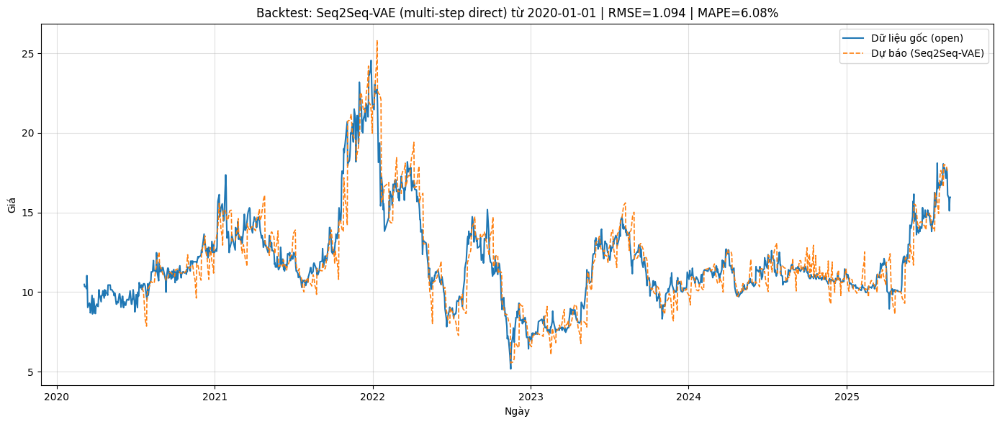

In [ ]:

start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"[Backtest toàn bộ từ 2020] RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo (Seq2Seq-VAE)", linewidth=1.2)
plt.title(f"Backtest: Seq2Seq-VAE (multi-step direct) từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.xlabel("Ngày"); plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


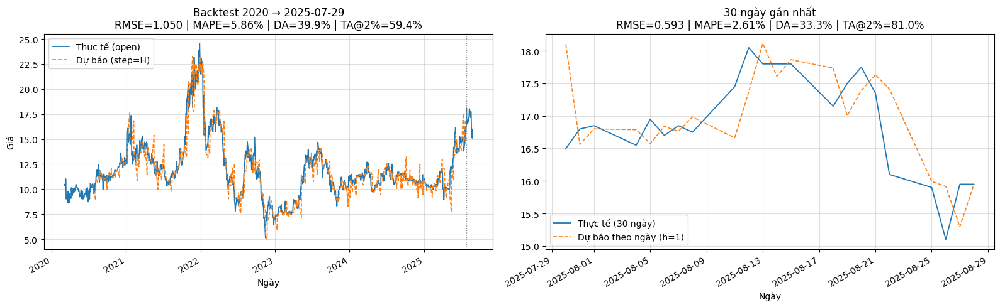

In [ ]:
# =========================================
# PLOTTING & TREND METRICS (KHÔNG ĐỘNG VÀO MÔ HÌNH)
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> (max-30d), step = H
# (2) 30 ngày gần nhất: dự báo theo ngày (h=1)
# + Tính thêm DA, TA@x% và xoay nhãn trục X
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- các hàm đánh giá xu hướng ----
def trend_labels_from_prices(prices, thr=0.0):
    """Trả về nhãn xu hướng {-1,0,1} dựa trên % thay đổi và ngưỡng thr (vd: 0.02 = 2%)"""
    r = (prices[1:] - prices[:-1]) / np.where(prices[:-1] == 0, 1e-9, prices[:-1])
    up  = (r >  thr).astype(int)
    down= (r < -thr).astype(int)
    lab = np.where(up==1, 1, np.where(down==1, -1, 0))
    return lab

def directional_accuracy(y_true, y_pred):
    n = min(len(y_true), len(y_pred))
    return float((y_true[:n] == y_pred[:n]).mean()) if n > 0 else np.nan

def ta_within_tol(actual, pred, tol=0.02):
    """TA@tol: nếu sai hướng nhưng |err%| < tol thì vẫn tính 'không sai nghiêm trọng'"""
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    act = actual[:n]; prd = pred[:n]
    # lấy nhãn xu hướng với thr=0 (chỉ xét hướng), sau đó áp dụng dung sai theo giá
    y_true = trend_labels_from_prices(act, thr=0.0)
    y_pred = trend_labels_from_prices(prd, thr=0.0)
    # lỗi phần trăm tại các mốc (bỏ phần tử đầu vì nhãn dùng diff)
    pct_err = np.abs((act[1:] - prd[1:]) / np.where(act[1:] == 0, 1e-9, act[1:]))
    ok = (y_true == y_pred) | (pct_err <= tol)
    return float(ok.mean())

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training (ret=shift(-1))

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) mốc tách: max - 30 ngày ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# =========================================
# (1) BACKTEST 2020 -> cutoff (multi-step, step=H)
# =========================================
# tìm chỉ số phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu đến {pd.Timestamp(cutoff).date()} cho W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)
bt_pred, bt_idx = [], []

for i in range(steps):
    e = W + i * H                       # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]    # (W,F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]
    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets: seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                       # (H,)
    tgt_end = min(e + H, cut_idx + 1)
    take    = max(0, tgt_end - e)
    if take:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp với bt_idx bằng mask (tránh reindex lỗi trùng nhãn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ độ dài
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Sai số giá & xu hướng
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / np.where(bt_actual==0, 1e-9, bt_actual))) * 100) if n1 else np.nan
# xu hướng (ngưỡng để tránh nhiễu — bạn có thể chỉnh)
THR = 0.002  # 0.2%
y_true_bt = trend_labels_from_prices(bt_actual, thr=THR)
y_pred_bt = trend_labels_from_prices(bt_pred,   thr=THR)
bt_DA     = directional_accuracy(y_true_bt, y_pred_bt)
bt_TA2    = ta_within_tol(bt_actual, bt_pred, tol=0.02)

# =========================================
# (2) 30 NGÀY GẦN NHẤT: dự báo THEO NGÀY (h=1)
# =========================================
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để dự báo.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])  # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / np.where(last_actual==0, 1e-9, last_actual))) * 100) if n2 else np.nan
y_true_d = trend_labels_from_prices(last_actual, thr=THR)
y_pred_d = trend_labels_from_prices(d_pred,       thr=THR)
d_DA     = directional_accuracy(y_true_d, y_pred_d)
d_TA2    = ta_within_tol(last_actual, d_pred, tol=0.02)

# =========================================
#  VẼ 2 BIỂU ĐỒ CẠNH NHAU + XOAY NHÃN TRỤC X
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# (trái) 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()}\n"
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | DA={bt_DA*100:.1f}% | TA@2%={bt_TA2*100:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
for tick in axes[0].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

# (phải) 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"30 ngày gần nhất\n"
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | DA={d_DA*100:.1f}% | TA@2%={d_TA2*100:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
for tick in axes[1].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

plt.tight_layout(); plt.show()



=== Đánh giá trung hạn 20 ngày ===


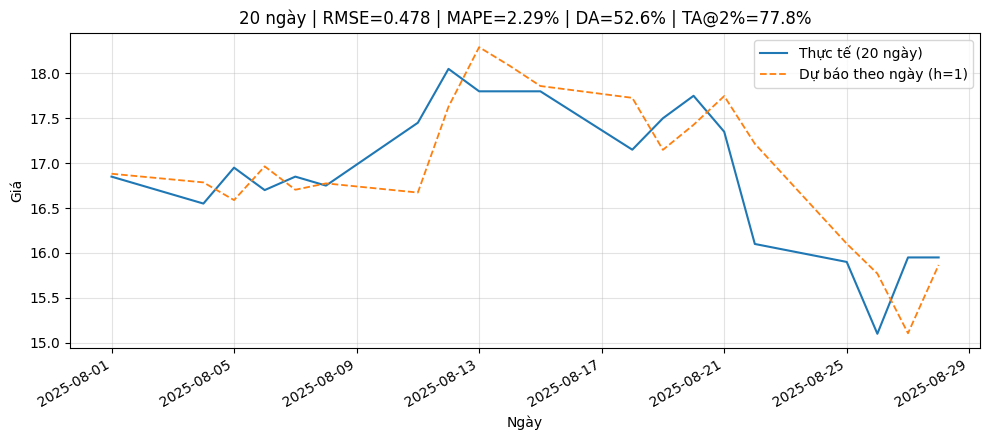


=== Đánh giá trung hạn 30 ngày ===


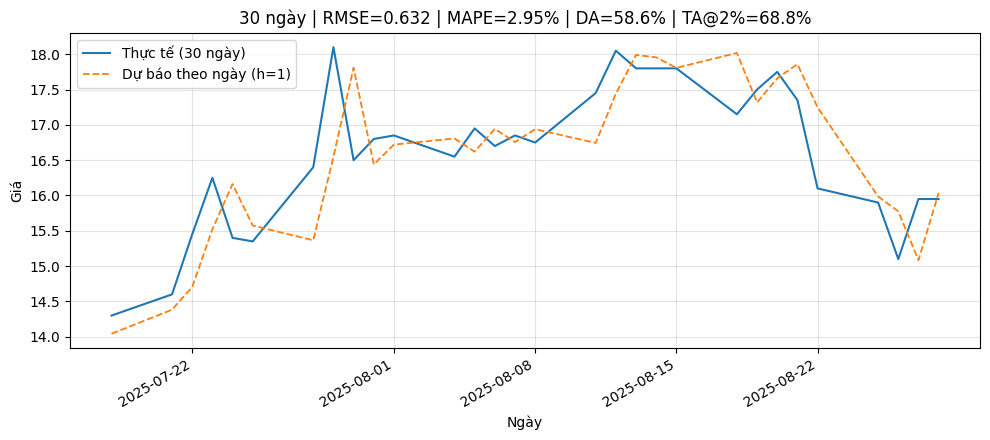


=== Đánh giá trung hạn 60 ngày ===


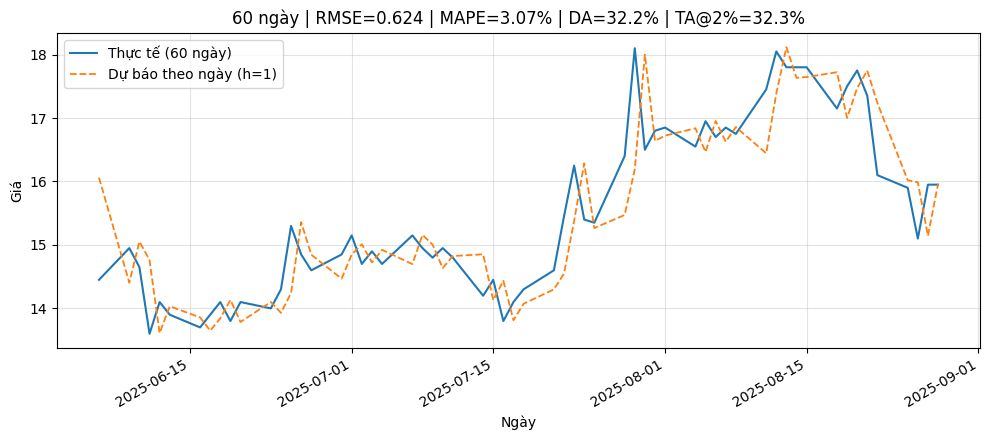


Tóm tắt trung hạn:
    N      rmse      mape         DA      TA@2%       start         end
0  20  0.477544  2.288389  52.631579  77.777778  2025-08-01  2025-08-28
1  30  0.631678  2.947628  58.620690  68.750000  2025-07-18  2025-08-28
2  60  0.623514  3.070750  32.203390  32.258065  2025-06-06  2025-08-28


In [ ]:
# ============================================
# DỰ BÁO TRUNG HẠN THEO NGÀY CHO 20/30/60 NGÀY (h=1)
# - Reuse model đã nạp: vae, x_scaler, cfg
# - Tính các chỉ số RMSE, MAPE, DA, TA@2%
# - Vẽ 1 figure riêng cho mỗi khung ngày
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


## So sánh VAE & TCN

In [ ]:
# ============================================================
# CODE 2 — VAE seq2seq (đã có) + Baseline #2: TCN (Temporal Convolutional Network)
# - cùng đặc trưng & đầu vào: (W,F) -> H bước log-return (multi-step direct)
# ============================================================
import os, json, joblib, numpy as np, pandas as pd
import tensorflow as tf
from keras import models as keras_models, layers, optimizers, callbacks
from keras import ops as K

BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

W = int(cfg["W"]); H = int(cfg["H"])
HIDDEN = int(cfg["HIDDEN"]); DROPOUT = float(cfg["DROPOUT"])
LR = float(cfg["LR"]); BATCH = int(cfg["BATCH"]); EPOCHS = int(cfg["EPOCHS"])
TARGET_COL = cfg["TARGET_COL"]; feature_cols_cfg = cfg["feature_cols"]
assert "df" in globals(), "Cần có biến df trong môi trường."

def make_design_matrix(df_in: pd.DataFrame, feature_cols, target_col, W, H, scaler):
    df_use = df_in.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill().fillna(0.0)
               .clip(-1e6, 1e6)
    )
    X_scaled = scaler.transform(X_feats.astype("float32")).astype("float32")
    prices = df_use[target_col].to_numpy(dtype=np.float32)

    eps = 1e-9
    logret = np.zeros_like(prices, dtype=np.float32)
    logret[1:] = np.log((prices[1:] + eps) / (np.maximum(prices[:-1], eps)))

    Xs, Ys = [], []
    for end in range(W, len(prices) - H):
        Xs.append(X_scaled[end - W:end])
        Ys.append(logret[end + 1:end + 1 + H])
    return np.asarray(Xs, np.float32), np.asarray(Ys, np.float32), df_use

X_all, y_all, df_use = make_design_matrix(df, feature_cols_cfg, TARGET_COL, W, H, x_scaler)
F = X_all.shape[-1]
print("Data:", X_all.shape, y_all.shape)

# --------- Baseline #2: TCN ----------
def ResidualBlock(x, dilation, filters, kernel_size=3, dropout=0.2):
    # causal padding cho TCN
    pad = (kernel_size - 1) * dilation
    x_in = x
    x = layers.ZeroPadding1D((pad, 0))(x)
    x = layers.Conv1D(filters, kernel_size, dilation_rate=dilation, padding="valid", activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    x = layers.ZeroPadding1D((pad, 0))(x)
    x = layers.Conv1D(filters, kernel_size, dilation_rate=dilation, padding="valid", activation="relu")(x)
    # match chiều
    if x_in.shape[-1] != filters:
        x_in = layers.Conv1D(filters, 1, padding="same")(x_in)
    out = layers.Add()([x, x_in])
    out = layers.Activation("relu")(out)
    return out

def build_tcn_baseline(W, F, H, hidden=128, dropout=0.2):
    inp = layers.Input(shape=(W, F))
    x = inp
    # 3–4 block dãn nở: 1,2,4,8
    for d in [1, 2, 4, 8]:
        x = ResidualBlock(x, dilation=d, filters=hidden, kernel_size=3, dropout=dropout)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    out = layers.Dense(H, activation="linear")(x)  # H bước log-return
    model = keras_models.Model(inp, out)
    model.compile(optimizer=optimizers.Adam(LR), loss="mse")
    return model

baseline2 = build_tcn_baseline(W, F, H, hidden=HIDDEN, dropout=DROPOUT)
baseline2.summary()

VAL_SPLIT = float(cfg.get("VAL_SPLIT", 0.2))
es = callbacks.EarlyStopping(patience=5, restore_best_weights=True, monitor="val_loss")
hist = baseline2.fit(X_all, y_all, validation_split=VAL_SPLIT,
                     epochs=EPOCHS, batch_size=BATCH, verbose=1, callbacks=[es])

baseline2_path = os.path.join(BEST_DIR, "baseline_tcn.keras")
baseline2.save(baseline2_path)

# --------- Backtest H ngày cuối ----------
X_feats = df_use[feature_cols_cfg]
X_scaled = x_scaler.transform(
    X_feats.replace([np.inf,-np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6,1e6).astype("float32")
).astype("float32")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
times  = pd.to_datetime(df_use["time"]).to_numpy("datetime64[ns]")

bt_window = X_scaled[-H - W : -H]              # (W,F)
pred_rets_b2 = baseline2.predict(bt_window[None, ...], verbose=0)[0]  # (H,)
pred_rets_vae = vae.predict(bt_window[None, ...], verbose=0)[0, :, 0] # (H,)

def roll_from_returns(start_price, rets):
    seq = [float(start_price)]
    for r in rets: seq.append(seq[-1] * np.exp(float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

start_price = prices[-H - 1]
pred_prices_b2  = roll_from_returns(start_price, pred_rets_b2)
pred_prices_vae = roll_from_returns(start_price, pred_rets_vae)
actual_idx      = times[-H:]
actual_prices   = prices[-H:]

rmse_b2 = float(np.sqrt(np.mean((pred_prices_b2 - actual_prices)**2)))
mape_b2 = float(np.mean(np.abs((actual_prices - pred_prices_b2) / actual_prices)) * 100)
rmse_v  = float(np.sqrt(np.mean((pred_prices_vae - actual_prices)**2)))
mape_v  = float(np.mean(np.abs((actual_prices - pred_prices_vae) / actual_prices)) * 100)

print(f"[Backtest H-cuối] (TCN): RMSE={rmse_b2:.4f} | MAPE={mape_b2:.2f}%")
print(f"[Backtest H-cuối] VAE seq2seq    : RMSE={rmse_v :.4f} | MAPE={mape_v :.2f}%")


Data: (1375, 90, 20) (1375, 7)


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 90, 20)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_8    │ (None, 92, 20)    │          0 │ input_layer_3[0]… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_9 (Conv1D)   │ (None, 90, 128)   │      7,808 │ zero_padding1d_8… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 90, 128)   │          0 │ conv1d_9[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_9    │ (None, 92, 128)   │          0 │ dropout_9[0][0]   │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_10 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_9… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_11 (Conv1D)  │ (None, 90, 128)   │      2,688 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, 90, 128)   │          0 │ conv1d_10[0][0],  │
│                     │                   │            │ conv1d_11[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 90, 128)   │          0 │ add_4[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_10   │ (None, 94, 128)   │          0 │ activation_4[0][… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_12 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_10          │ (None, 90, 128)   │          0 │ conv1d_12[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_11   │ (None, 94, 128)   │          0 │ dropout_10[0][0]  │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_13 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_5 (Add)         │ (None, 90, 128)   │          0 │ conv1d_13[0][0],  │
│                     │                   │            │ activation_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 90, 128)   │          0 │ add_5[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_12   │ (None, 98, 128)   │          0 │ activation_5[0][… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_14 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_11          │ (None, 90, 128)   │          0 │ conv1d_14[0][0]   │
│ (Dropout)           │                   │            │                 

 Total params: 372,871 (1.42 MB)

 Trainable params: 372,871 (1.42 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - loss: 62.9753 - val_loss: 0.0264
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 5.0070 - val_loss: 0.0109
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 1.3496 - val_loss: 0.0066
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.6056 - val_loss: 0.0039
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - loss: 0.3795 - val_loss: 0.0025
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - loss: 0.3003 - val_loss: 0.0019
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - loss: 0.2016 - val_loss: 0.0022
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - loss: 0.1350 - val_loss: 0.0023
Epoch 9/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - loss: 0.1135 - val_loss: 0.0021
Epoch 10/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0971 - val_loss: 0.0018
[Backtest H-cuối] (TCN): RMSE=1.4237 | MAPE=8.28%
[Backtest H-cuối] VAE seq2seq    : RMSE=1.1474 | MAPE=6.11%


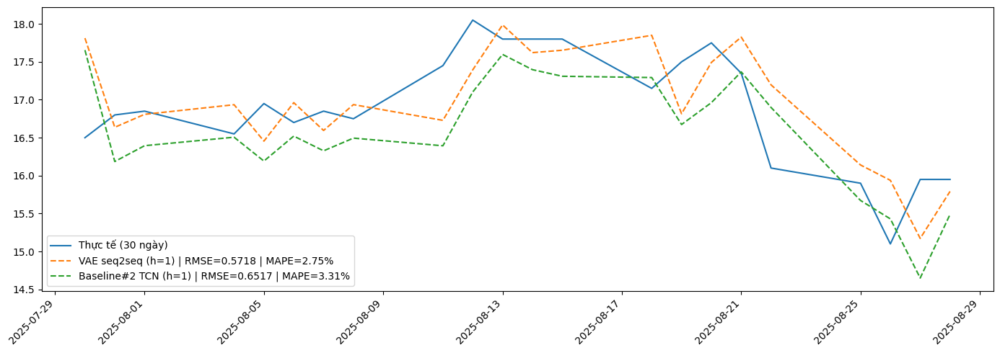

In [ ]:
# ======================================================================
# TRỰC QUAN 30 NGÀY GẦN NHẤT — VAE vs Baseline #2 (TCN)
# (dùng lại: vae, baseline2, x_scaler, cfg, df, W, H, TARGET_COL, feature_cols_cfg)
# ======================================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def pct_change_safe(a, b, eps=1e-9):
    return (a - b) / np.where(np.abs(b) < eps, np.sign(b) * eps + (b == 0)*eps, b)

# ---- Chuẩn bị dữ liệu như code 2 ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = (
    X_feats.replace([np.inf, -np.inf], np.nan)
           .ffill().bfill().fillna(0.0)
           .clip(-1e6, 1e6)
)
X_all_scaled = x_scaler.transform(X_feats.astype("float32")).astype("float32")

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- Mốc 30 ngày gần nhất ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để trực quan.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

# ---- One-step (h=1) cho VAE & Baseline #2 (TCN) ----
def one_step_from_model(model_kind, win_scaled, prev_price):
    """
    model_kind: 'vae' hoặc 'tcn'
    - VAE: predict (H,1) -> lấy bước đầu rets[0]
    - TCN : predict (H,)  -> lấy bước đầu rets[0]
    """
    if model_kind == "vae":
        rets = vae.predict(win_scaled[None, ...], verbose=0)[0, :, 0]  # (H,)
        r1 = float(rets[0])
    elif model_kind == "tcn":
        rets = baseline2.predict(win_scaled[None, ...], verbose=0)[0]   # (H,)
        r1 = float(rets[0])
    else:
        raise ValueError("model_kind không hợp lệ.")
    # Khôi phục giá từ log-return: p1 = p0 * exp(r1)
    return prev_price * np.exp(r1)

pred_vae, pred_tcn = [], []
for t_idx in range(first_last_idx, len(times)):
    win = X_all_scaled[t_idx - W : t_idx]      # (W,F)
    p0  = float(prices[t_idx - 1])
    pred_vae.append(one_step_from_model("vae", win, p0))
    pred_tcn.append(one_step_from_model("tcn", win, p0))

pred_vae = np.asarray(pred_vae, dtype=np.float32)
pred_tcn = np.asarray(pred_tcn, dtype=np.float32)

n = min(len(pred_vae), len(pred_tcn), len(last_actual))
pred_vae, pred_tcn, d_times, last_actual = pred_vae[:n], pred_tcn[:n], last_times[:n], last_actual[:n]

# ---- Tính RMSE / MAPE để hiển thị ----
rmse_v  = float(np.sqrt(np.mean((pred_vae - last_actual)**2)))
mape_v  = float(np.mean(np.abs(pct_change_safe(last_actual, pred_vae))) * 100)
rmse_t  = float(np.sqrt(np.mean((pred_tcn - last_actual)**2)))
mape_t  = float(np.mean(np.abs(pct_change_safe(last_actual, pred_tcn))) * 100)

# ---- Vẽ ----
plt.figure(figsize=(14,5))
plt.plot(d_times, last_actual, label="Thực tế (30 ngày)")
plt.plot(d_times, pred_vae, "--", label=f"VAE seq2seq (h=1) | RMSE={rmse_v:.4f} | MAPE={mape_v:.2f}%")
plt.plot(d_times, pred_tcn, "--", label=f"Baseline#2 TCN (h=1) | RMSE={rmse_t:.4f} | MAPE={mape_t:.2f}%")
plt.xticks(rotation=45, ha="right")
plt.legend()
plt.tight_layout()
plt.show()

## Đánh giá VAE & TCN

In [ ]:
# ============================================================
# EVAL for CODE 2 — VAE vs Baseline#2 (TCN)
# Tạo 2 bảng chỉ số: Backtest & 30 ngày gần nhất (h=1)
# ============================================================
import numpy as np, pandas as pd

K_LIST = [1, 20, 30]
TAU, EPS = 0.02, 1e-9

def pct_change_safe(a, b):
    return (a - b) / np.where(np.abs(b) < EPS, np.sign(b) * EPS + (b == 0)*EPS, b)

def directional_accuracy_k(y_true, y_pred, k: int) -> float:
    if len(y_true) <= k or len(y_pred) <= k: return np.nan
    t_dir = np.sign(y_true[k:] - y_true[:-k])
    p_dir = np.sign(y_pred[k:] - y_pred[:-k])
    m = min(len(t_dir), len(p_dir))
    return float((t_dir[:m] == p_dir[:m]).mean() * 100)

def slope_sign(arr):
    t = np.arange(len(arr)); a, _ = np.polyfit(t, arr, 1)
    return np.sign(a)

def slope_da_k(y_true, y_pred, k: int) -> float:
    m = min(len(y_true), len(y_pred)) - k + 1
    if m <= 0: return np.nan
    ok = sum(slope_sign(y_true[i:i+k]) == slope_sign(y_pred[i:i+k]) for i in range(m))
    return float(ok / m * 100)

def ta_daily_with_tol(actual, pred, tol=0.02):
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    r_true = pct_change_safe(actual[1:], actual[:-1])
    r_pred = pct_change_safe(pred[1:],   pred[:-1])
    lab_t  = np.where(r_true > 0, 1, np.where(r_true < 0, -1, 0))
    lab_p  = np.where(r_pred > 0, 1, np.where(r_pred < 0, -1, 0))
    pct_err = np.abs(pct_change_safe(actual[1:], pred[1:]))
    ok = (lab_t == lab_p) | (pct_err <= tol)
    return float(ok.mean() * 100)

def ta_k_return(actual, pred, k: int, tau: float = 0.02):
    if len(actual) <= k or len(pred) <= k: return np.nan
    rt = (actual[k:] / np.where(np.abs(actual[:-k]) < EPS, EPS, actual[:-k])) - 1.0
    rp = (pred[k:]   / np.where(np.abs(pred[:-k])   < EPS, EPS, pred[:-k]))   - 1.0
    m  = min(len(rt), len(rp))
    denom = np.where(np.abs(rt[:m]) < EPS, 1.0, np.abs(rt[:m]))
    pe = np.abs((rt[:m] - rp[:m]) / denom)
    return float((pe <= tau).mean() * 100)

def mae(a, b): return float(np.mean(np.abs(a - b)))
def rmse(a, b): return float(np.sqrt(np.mean((a - b) ** 2)))
def mape(a, b): return float(np.mean(np.abs(pct_change_safe(a, b))) * 100)

# ---- Chuẩn bị dữ liệu ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = (X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6))
X_all_scaled = x_scaler.transform(X_feats.astype("float32")).astype("float32")

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) Backtest (multi-step direct, step=H) ----
max_date = times.max()
cutoff = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))
if cut_idx + 1 < W + H:
    raise ValueError("Không đủ dữ liệu cho backtest.")

def roll_price_from_rets(p0, rets):
    seq = [float(p0)]
    for r in rets: seq.append(seq[-1] * np.exp(float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

bt_idx, bt_pred_vae, bt_pred_tcn = [], [], []
for i in range(max(0, (cut_idx + 1 - W) // H)):
    e = W + i * H
    if e - 1 > cut_idx - H: break
    win = X_all_scaled[e - W:e]
    # VAE
    r_vae = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p_vae = roll_price_from_rets(prices[e - 1], r_vae)
    # TCN
    r_tcn = baseline2.predict(win[None, ...], verbose=0)[0]
    p_tcn = roll_price_from_rets(prices[e - 1], r_tcn)
    tgt_end = min(e + H, cut_idx + 1); take = max(0, tgt_end - e)
    if take:
        bt_pred_vae.extend(p_vae[:take]); bt_pred_tcn.extend(p_tcn[:take])
        bt_idx.extend(times[e:tgt_end])

bt_idx = np.asarray(bt_idx, dtype="datetime64[ns]")
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]
n = min(len(bt_idx), len(bt_actual), len(bt_pred_vae), len(bt_pred_tcn))
bt_idx, bt_actual = bt_idx[:n], bt_actual[:n]
bt_pred_vae, bt_pred_tcn = np.asarray(bt_pred_vae[:n]), np.asarray(bt_pred_tcn[:n])

def build_metric_row(actual, pred):
    return {
        "RMSE": rmse(actual, pred),
        "MAPE": mape(actual, pred),
        "MAE":  mae(actual, pred),
        "DA@1": directional_accuracy_k(actual, pred, 1),
        "DA@20": directional_accuracy_k(actual, pred, 20),
        "Slope-DA@20": slope_da_k(actual, pred, 20),
        "TA(daily@2%)": ta_daily_with_tol(actual, pred, tol=TAU)
    }

tbl_backtest = pd.DataFrame({
    "VAE seq2seq": build_metric_row(bt_actual, bt_pred_vae),
    "TCN": build_metric_row(bt_actual, bt_pred_tcn),
}).round(4)

print("\n=== BẢNG CHỈ SỐ — BACKTEST ===")
print(tbl_backtest)

# ---- 2) 30 ngày gần nhất — one-step (h=1) ----
last_mask = times > cutoff
first_last_idx = int(np.where(last_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó.")

last_times  = times[last_mask]
last_actual = prices[last_mask]

pred_vae_1d, pred_tcn_1d = [], []
for t_idx in range(first_last_idx, len(times)):
    win = X_all_scaled[t_idx - W : t_idx]
    p0  = float(prices[t_idx - 1])
    # VAE
    r = vae.predict(win[None, ...], verbose=0)[0, :, 0][0]
    pred_vae_1d.append(p0 * np.exp(float(r)))
    # TCN
    r = baseline2.predict(win[None, ...], verbose=0)[0][0]
    pred_tcn_1d.append(p0 * np.exp(float(r)))

pred_vae_1d = np.asarray(pred_vae_1d, dtype=np.float32)
pred_tcn_1d = np.asarray(pred_tcn_1d, dtype=np.float32)
n2 = min(len(pred_vae_1d), len(pred_tcn_1d), len(last_actual))
last_actual = last_actual[:n2]; pred_vae_1d = pred_vae_1d[:n2]; pred_tcn_1d = pred_tcn_1d[:n2]

tbl_last30 = pd.DataFrame({
    "VAE seq2seq": build_metric_row(last_actual, pred_vae_1d),
    "TCN": build_metric_row(last_actual, pred_tcn_1d),
}).round(4)

print("\n=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===")
tbl_last30



=== BẢNG CHỈ SỐ — BACKTEST ===
              VAE seq2seq      TCN
RMSE               1.0699   1.6173
MAPE               6.0891  10.2269
MAE                0.7287   1.0443
DA@1              44.1415  43.4046
DA@20             73.2436  72.1226
Slope-DA@20       75.4294  74.7573
TA(daily@2%)      58.6588  52.3213

=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===


,VAE seq2seq,TCN
RMSE,0.6365,0.6517
MAPE,2.7492,3.3117
MAE,0.4678,0.5442
DA@1,28.5714,33.3333
DA@20,100.0000,100.0000
Slope-DA@20,66.6667,100.0000
TA(daily@2%),71.4286,57.1429


## So sánh VAE && MLP

Data shapes: (1375, 90, 20) (1375, 7)


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 90, 20)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 1800)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 128)            │       230,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 247,943 (968.53 KB)

 Trainable params: 247,943 (968.53 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 748.5956 - val_loss: 1.3463
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 257.5386 - val_loss: 0.4822
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 156.1734 - val_loss: 0.4790
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 93.3101 - val_loss: 0.2340
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 73.1334 - val_loss: 0.0754
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 51.5702 - val_loss: 0.0328
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 43.2453 - val_loss: 0.0260
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 37.9483 - val_loss: 0.0274
Epoch 9/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 29.0320 - val_loss: 0.0291
Epoch 10/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 26.5523 - val_loss: 0.0281


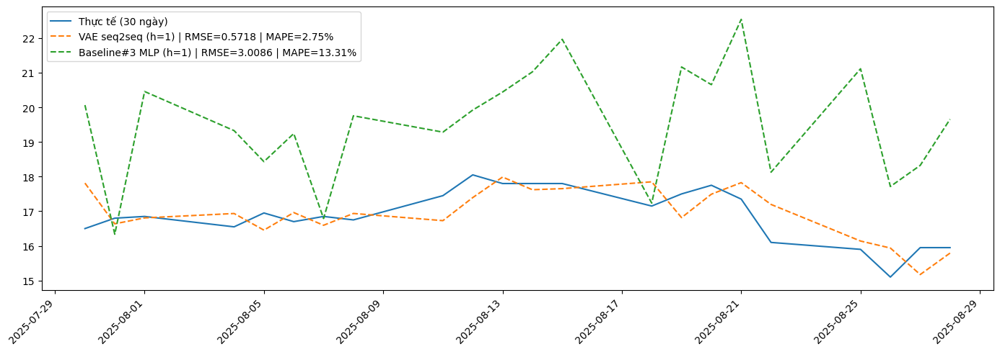


=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===
              VAE seq2seq      MLP
RMSE               0.5718   3.0086
MAPE               2.7454  13.3106
MAE                0.4644   2.6820
DA@1              28.5714  38.0952
DA@20            100.0000  50.0000
Slope-DA@20      100.0000   0.0000
TA(daily@2%)      66.6667  42.8571


In [ ]:
# ============================================================
# BASELINE #3 — MLP (Flatten W×F -> Dense -> Dense(H))
# So sánh với VAE seq2seq bằng cùng đặc trưng & tham số
# ============================================================
import os, json, joblib, numpy as np, pandas as pd
import tensorflow as tf
from keras import models as keras_models, layers, callbacks, optimizers
from keras import ops as K

# ---------- 0) LOAD VAE + SCALER + CFG ----------
BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# Custom objects của bạn (đã định nghĩa ở nơi khác)
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

W = int(cfg["W"]); H = int(cfg["H"])
HIDDEN = int(cfg["HIDDEN"]); DROPOUT = float(cfg["DROPOUT"])
LR = float(cfg["LR"]); BATCH = int(cfg["BATCH"]); EPOCHS = int(cfg["EPOCHS"])
VAL_SPLIT = float(cfg.get("VAL_SPLIT", 0.2))
TARGET_COL = cfg["TARGET_COL"]; feature_cols_cfg = cfg["feature_cols"]

assert "df" in globals(), "Cần có biến df trong môi trường."

# ---------- 1) DATA PIPELINE (y như bạn đang dùng) ----------
EPS = 1e-9

def make_design_matrix(df_in, feature_cols, target_col, W, H, scaler):
    df_use = df_in.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill().fillna(0.0)
               .clip(-1e6, 1e6)
    )
    X_scaled = scaler.transform(X_feats.astype("float32")).astype("float32")
    prices = df_use[target_col].to_numpy(dtype=np.float32)

    # LOG-RETURN (đổi thành simple return nếu bạn huấn luyện theo simple)
    logret = np.zeros_like(prices, dtype=np.float32)
    logret[1:] = np.log((prices[1:] + EPS) / (np.maximum(prices[:-1], EPS)))

    Xs, Ys = [], []
    for end in range(W, len(prices) - H):
        Xs.append(X_scaled[end - W:end])                       # (W,F)
        Ys.append(logret[end + 1:end + 1 + H])                # (H,)
    return np.asarray(Xs, np.float32), np.asarray(Ys, np.float32), df_use

X_all, y_all, df_use = make_design_matrix(df, feature_cols_cfg, TARGET_COL, W, H, x_scaler)
F = X_all.shape[-1]
print("Data shapes:", X_all.shape, y_all.shape)

# ---------- 2) BASELINE #3: MLP (Flatten -> Dense -> Dense(H)) ----------
def build_mlp_baseline(W, F, H, hidden=128, dropout=0.2):
    inp = layers.Input(shape=(W, F))
    x = layers.Flatten()(inp)                       # (W*F,)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    out = layers.Dense(H, activation="linear")(x)   # H bước log-return
    model = keras_models.Model(inp, out)
    model.compile(optimizer=optimizers.Adam(LR), loss="mse")
    return model

baseline3 = build_mlp_baseline(W, F, H, hidden=HIDDEN, dropout=DROPOUT)
baseline3.summary()

# Train + early stopping
es = callbacks.EarlyStopping(patience=5, restore_best_weights=True, monitor="val_loss")
hist = baseline3.fit(
    X_all, y_all,
    validation_split=VAL_SPLIT,
    epochs=EPOCHS, batch_size=BATCH, verbose=1, callbacks=[es]
)

# Save
baseline3_path = os.path.join(BEST_DIR, "baseline_mlp.keras")
baseline3.save(baseline3_path)

# ---------- 3) BACKTEST H ngày cuối ----------
def roll_from_returns(p0, rets, use_log=True):
    seq = [float(p0)]
    for r in rets:
        if use_log:
            seq.append(seq[-1] * np.exp(float(r)))   # đổi thành *(1+r) nếu simple return
        else:
            seq.append(seq[-1] * (1.0 + float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

X_feats = df_use[feature_cols_cfg]
X_scaled_full = x_scaler.transform(
    X_feats.replace([np.inf,-np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6,1e6).astype("float32")
).astype("float32")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
times  = pd.to_datetime(df_use["time"]).to_numpy("datetime64[ns]")

bt_window = X_scaled_full[-H - W : -H]  # (W,F)
pred_rets_vae = vae.predict(bt_window[None, ...], verbose=0)[0, :, 0]   # (H,)
pred_rets_mlp = baseline3.predict(bt_window[None, ...], verbose=0)[0]   # (H,)

start_price = prices[-H - 1]
pred_prices_vae = roll_from_returns(start_price, pred_rets_vae, use_log=True)
pred_prices_mlp = roll_from_returns(start_price, pred_rets_mlp, use_log=True)
actual_idx      = times[-H:]
actual_prices   = prices[-H:]

# ---------- 4) TRỰC QUAN 30 NGÀY GẦN NHẤT (h=1) ----------
import matplotlib.pyplot as plt

def one_step_price(model_kind, win_scaled, prev_price):
    if model_kind == "vae":
        r1 = float(vae.predict(win_scaled[None, ...], verbose=0)[0, 0, 0])
    elif model_kind == "mlp":
        r1 = float(baseline3.predict(win_scaled[None, ...], verbose=0)[0][0])
    else:
        raise ValueError("model_kind?")
    return prev_price * np.exp(r1)  # đổi thành *(1+r1) nếu simple return

# Chuẩn bị 30 ngày cuối
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")
last_mask = times > cutoff
if not last_mask.any():
    raise ValueError("Không có 30 ngày cuối để trực quan.")
first_last_idx = int(np.where(last_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó.")

last_times  = times[last_mask]
last_actual = prices[last_mask]

pred_vae_1d, pred_mlp_1d = [], []
for t_idx in range(first_last_idx, len(times)):
    win = X_scaled_full[t_idx - W : t_idx]
    p0  = float(prices[t_idx - 1])
    pred_vae_1d.append(one_step_price("vae", win, p0))
    pred_mlp_1d.append(one_step_price("mlp", win, p0))

pred_vae_1d = np.asarray(pred_vae_1d, dtype=np.float32)
pred_mlp_1d = np.asarray(pred_mlp_1d, dtype=np.float32)
n = min(len(pred_vae_1d), len(pred_mlp_1d), len(last_actual))
pred_vae_1d, pred_mlp_1d, d_times, last_actual = pred_vae_1d[:n], pred_mlp_1d[:n], last_times[:n], last_actual[:n]

def pct_change_safe(a, b, eps=1e-9): return (a - b) / np.where(np.abs(b) < eps, np.sign(b) * eps + (b == 0)*eps, b)
def RMSE(a,b): return float(np.sqrt(np.mean((a-b)**2)))
def MAPE(a,b): return float(np.mean(np.abs(pct_change_safe(a,b))) * 100)
def MAE(a,b):  return float(np.mean(np.abs(a-b)))

rmse_v = RMSE(pred_vae_1d, last_actual);  mape_v = MAPE(last_actual, pred_vae_1d);  mae_v = MAE(pred_vae_1d, last_actual)
rmse_m = RMSE(pred_mlp_1d, last_actual);  mape_m = MAPE(last_actual, pred_mlp_1d);  mae_m = MAE(pred_mlp_1d, last_actual)

plt.figure(figsize=(14,5))
plt.plot(d_times, last_actual, label="Thực tế (30 ngày)")
plt.plot(d_times, pred_vae_1d, "--", label=f"VAE seq2seq (h=1) | RMSE={rmse_v:.4f} | MAPE={mape_v:.2f}%")
plt.plot(d_times, pred_mlp_1d, "--", label=f"Baseline#3 MLP (h=1) | RMSE={rmse_m:.4f} | MAPE={mape_m:.2f}%")
plt.xticks(rotation=45, ha="right"); plt.legend(); plt.tight_layout(); plt.show()

# ---------- 5) BẢNG ĐÁNH GIÁ (Backtest & 30 ngày) ----------
def directional_accuracy_k(y_true, y_pred, k:int)->float:
    if len(y_true) <= k or len(y_pred) <= k: return np.nan
    t_dir = np.sign(y_true[k:] - y_true[:-k])
    p_dir = np.sign(y_pred[k:] - y_pred[:-k])
    m = min(len(t_dir), len(p_dir))
    return float((t_dir[:m] == p_dir[:m]).mean() * 100)

def slope_sign(arr):
    t = np.arange(len(arr))
    a, _ = np.polyfit(t, arr, 1)
    return np.sign(a)

def slope_da_k(y_true, y_pred, k:int)->float:
    m = min(len(y_true), len(y_pred)) - k + 1
    if m <= 0: return np.nan
    ok = sum(slope_sign(y_true[i:i+k]) == slope_sign(y_pred[i:i+k]) for i in range(m))
    return float(ok / m * 100)

def ta_daily_with_tol(actual, pred, tol=0.02):
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    r_true = pct_change_safe(actual[1:], actual[:-1])
    r_pred = pct_change_safe(pred[1:],   pred[:-1])
    lab_t  = np.where(r_true > 0, 1, np.where(r_true < 0, -1, 0))
    lab_p  = np.where(r_pred > 0, 1, np.where(r_pred < 0, -1, 0))
    pct_err = np.abs(pct_change_safe(actual[1:], pred[1:]))
    ok = (lab_t == lab_p) | (pct_err <= 0.02)
    return float(ok.mean() * 100)

def ta_k_return(actual, pred, k:int, tau:float=0.02):
    if len(actual) <= k or len(pred) <= k: return np.nan
    rt = (actual[k:] / np.where(np.abs(actual[:-k]) < EPS, EPS, actual[:-k])) - 1.0
    rp = (pred[k:]   / np.where(np.abs(pred[:-k])   < EPS, EPS, pred[:-k]))   - 1.0
    m  = min(len(rt), len(rp))
    denom = np.where(np.abs(rt[:m]) < EPS, 1.0, np.abs(rt[:m]))
    pe = np.abs((rt[:m] - rp[:m]) / denom)
    return float((pe <= tau).mean() * 100)

def build_metric_row(actual, pred):
    return {
        "RMSE": RMSE(actual, pred),
        "MAPE": MAPE(actual, pred),
        "MAE":  MAE(actual, pred),
        "DA@1": directional_accuracy_k(actual, pred, 1),
        "DA@20": directional_accuracy_k(actual, pred, 20),
        "Slope-DA@20": slope_da_k(actual, pred, 20),
        "TA(daily@2%)": ta_daily_with_tol(actual, pred, tol=0.02)
    }

# --- Backtest (đang có pred_prices_vae / pred_prices_mlp / actual_prices) ---
# tbl_backtest = pd.DataFrame({
#     "VAE seq2seq": build_metric_row(actual_prices, pred_prices_vae),
#     "Baseline#3 MLP": build_metric_row(actual_prices, pred_prices_mlp),
# }).round(4)
# print("\n=== BẢNG CHỈ SỐ — BACKTEST ===")
# print(tbl_backtest)

# --- 30 ngày gần nhất (h=1) ---
tbl_last30 = pd.DataFrame({
    "VAE seq2seq": build_metric_row(last_actual, pred_vae_1d),
    "MLP": build_metric_row(last_actual, pred_mlp_1d),
}).round(4)
print("\n=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===")
print(tbl_last30)


# Dự đoán ELC

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/ELC_history_2020-01-01_2025-09-01.csv"
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   time    1500 non-null   object 
 1   open    1500 non-null   float64
 2   high    1500 non-null   float64
 3   low     1500 non-null   float64
 4   close   1500 non-null   float64
 5   volume  1500 non-null   int64  
 6   symbol  1500 non-null   object 
dtypes: float64(4), int64(1), object(2)
memory usage: 82.2+ KB


In [ ]:
import pandas as pd
import numpy as np

# Giả sử df là dữ liệu gốc
df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)

# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["open"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

# ==========================
# Đặt lại tên cột giống như bảng mẫu
# ==========================
df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1481 entries, 19 to 1499
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         1481 non-null   datetime64[ns]
 1   open         1481 non-null   float64       
 2   high         1481 non-null   float64       
 3   low          1481 non-null   float64       
 4   close        1481 non-null   float64       
 5   volume       1481 non-null   int64         
 6   symbol       1481 non-null   object        
 7   ma_5         1481 non-null   float64       
 8   ema_5        1481 non-null   float64       
 9   ma_10        1481 non-null   float64       
 10  ema_10       1481 non-null   float64       
 11  ma_20        1481 non-null   float64       
 12  ema_20       1481 non-null   float64       
 13  rsi_14       1481 non-null   float64       
 14  ret          1481 non-null   float64       
 15  open_pct     1481 non-null   float64       
 16  high_pct  

In [ ]:

# ----- cấu hình đường dẫn artifacts -----
# BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# ----- 3) Làm sạch feature rồi scale (KHÔNG fit lại) -----
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# ----- 4) Backtest H ngày cuối (multi-step direct) -----
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest dùng BEST] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")


[Backtest dùng BEST] H=7: RMSE=0.5947 | MAPE=2.28%


[Backtest toàn bộ từ 2020] RMSE=1.053 | MAPE=5.90%


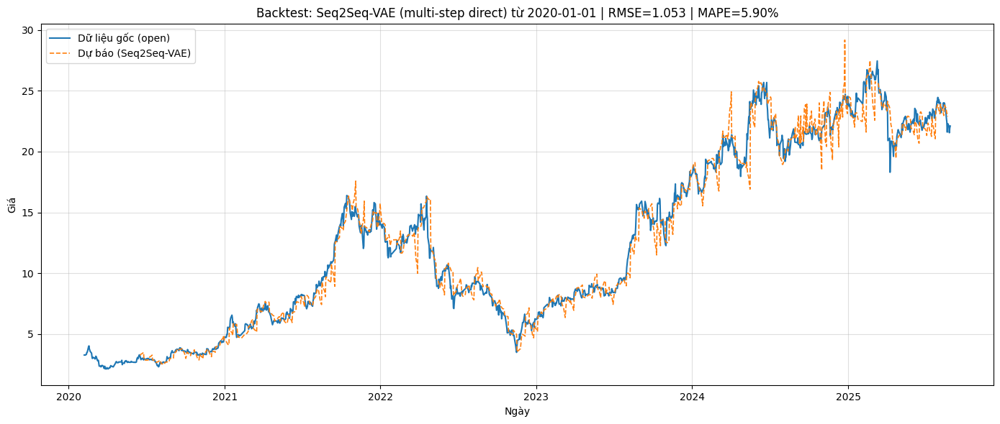

In [ ]:
start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"[Backtest toàn bộ từ 2020] RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo (Seq2Seq-VAE)", linewidth=1.2)
plt.title(f"Backtest: Seq2Seq-VAE (multi-step direct) từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.xlabel("Ngày"); plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


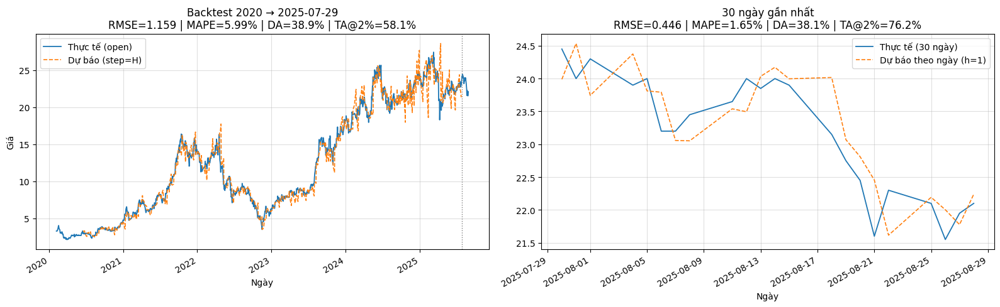

In [ ]:
# =========================================
# PLOTTING & TREND METRICS (KHÔNG ĐỘNG VÀO MÔ HÌNH)
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> (max-30d), step = H
# (2) 30 ngày gần nhất: dự báo theo ngày (h=1)
# + Tính thêm DA, TA@x% và xoay nhãn trục X
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- các hàm đánh giá xu hướng ----
def trend_labels_from_prices(prices, thr=0.0):
    """Trả về nhãn xu hướng {-1,0,1} dựa trên % thay đổi và ngưỡng thr (vd: 0.02 = 2%)"""
    r = (prices[1:] - prices[:-1]) / np.where(prices[:-1] == 0, 1e-9, prices[:-1])
    up  = (r >  thr).astype(int)
    down= (r < -thr).astype(int)
    lab = np.where(up==1, 1, np.where(down==1, -1, 0))
    return lab

def directional_accuracy(y_true, y_pred):
    n = min(len(y_true), len(y_pred))
    return float((y_true[:n] == y_pred[:n]).mean()) if n > 0 else np.nan

def ta_within_tol(actual, pred, tol=0.02):
    """TA@tol: nếu sai hướng nhưng |err%| < tol thì vẫn tính 'không sai nghiêm trọng'"""
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    act = actual[:n]; prd = pred[:n]
    # lấy nhãn xu hướng với thr=0 (chỉ xét hướng), sau đó áp dụng dung sai theo giá
    y_true = trend_labels_from_prices(act, thr=0.0)
    y_pred = trend_labels_from_prices(prd, thr=0.0)
    # lỗi phần trăm tại các mốc (bỏ phần tử đầu vì nhãn dùng diff)
    pct_err = np.abs((act[1:] - prd[1:]) / np.where(act[1:] == 0, 1e-9, act[1:]))
    ok = (y_true == y_pred) | (pct_err <= tol)
    return float(ok.mean())

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training (ret=shift(-1))

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) mốc tách: max - 30 ngày ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# =========================================
# (1) BACKTEST 2020 -> cutoff (multi-step, step=H)
# =========================================
# tìm chỉ số phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu đến {pd.Timestamp(cutoff).date()} cho W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)
bt_pred, bt_idx = [], []

for i in range(steps):
    e = W + i * H                       # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]    # (W,F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]
    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets: seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                       # (H,)
    tgt_end = min(e + H, cut_idx + 1)
    take    = max(0, tgt_end - e)
    if take:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp với bt_idx bằng mask (tránh reindex lỗi trùng nhãn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ độ dài
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Sai số giá & xu hướng
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / np.where(bt_actual==0, 1e-9, bt_actual))) * 100) if n1 else np.nan
# xu hướng (ngưỡng để tránh nhiễu — bạn có thể chỉnh)
THR = 0.002  # 0.2%
y_true_bt = trend_labels_from_prices(bt_actual, thr=THR)
y_pred_bt = trend_labels_from_prices(bt_pred,   thr=THR)
bt_DA     = directional_accuracy(y_true_bt, y_pred_bt)
bt_TA2    = ta_within_tol(bt_actual, bt_pred, tol=0.02)

# =========================================
# (2) 30 NGÀY GẦN NHẤT: dự báo THEO NGÀY (h=1)
# =========================================
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để dự báo.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])  # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / np.where(last_actual==0, 1e-9, last_actual))) * 100) if n2 else np.nan
y_true_d = trend_labels_from_prices(last_actual, thr=THR)
y_pred_d = trend_labels_from_prices(d_pred,       thr=THR)
d_DA     = directional_accuracy(y_true_d, y_pred_d)
d_TA2    = ta_within_tol(last_actual, d_pred, tol=0.02)

# =========================================
#  VẼ 2 BIỂU ĐỒ CẠNH NHAU + XOAY NHÃN TRỤC X
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# (trái) 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()}\n"
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | DA={bt_DA*100:.1f}% | TA@2%={bt_TA2*100:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
for tick in axes[0].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

# (phải) 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"30 ngày gần nhất\n"
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | DA={d_DA*100:.1f}% | TA@2%={d_TA2*100:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
for tick in axes[1].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

plt.tight_layout(); plt.show()



=== Đánh giá trung hạn 20 ngày ===


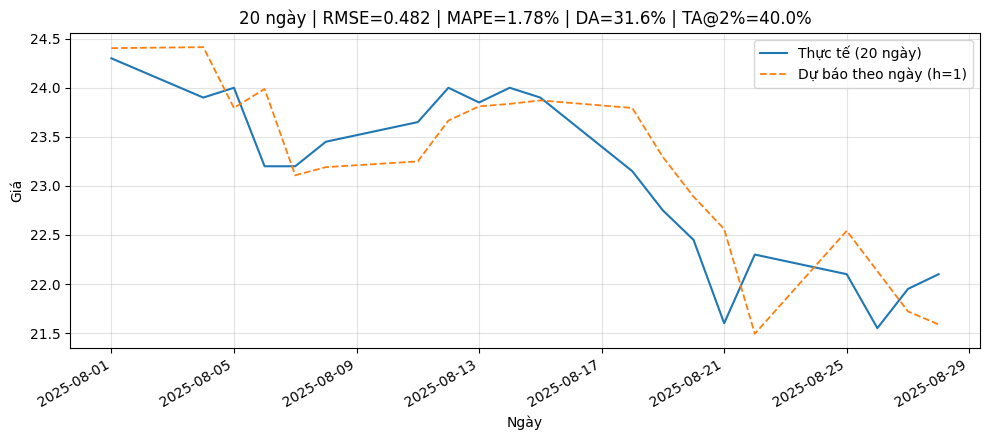


=== Đánh giá trung hạn 30 ngày ===


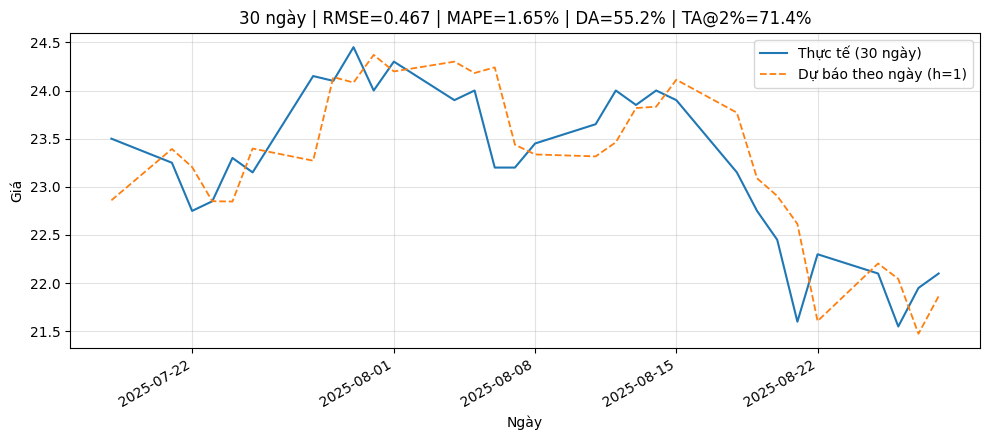


=== Đánh giá trung hạn 60 ngày ===


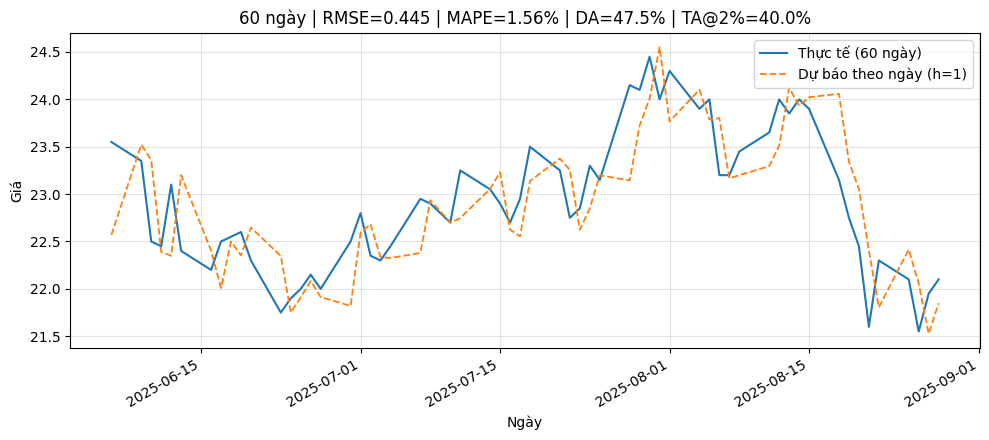


Tóm tắt trung hạn:
    N      rmse      mape         DA      TA@2%       start         end
0  20  0.481694  1.782396  31.578947  40.000000  2025-08-01  2025-08-28
1  30  0.466637  1.647284  55.172414  71.428571  2025-07-18  2025-08-28
2  60  0.445062  1.555384  47.457627  40.000000  2025-06-06  2025-08-28


In [ ]:
# ============================================
# DỰ BÁO TRUNG HẠN THEO NGÀY CHO 20/30/60 NGÀY (h=1)
# - Reuse model đã nạp: vae, x_scaler, cfg
# - Tính các chỉ số RMSE, MAPE, DA, TA@2%
# - Vẽ 1 figure riêng cho mỗi khung ngày
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


# Dự đoán GAS

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/GAS_history_2020-01-01_2025-09-01.csv"
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   time    1500 non-null   object 
 1   open    1500 non-null   float64
 2   high    1500 non-null   float64
 3   low     1500 non-null   float64
 4   close   1500 non-null   float64
 5   volume  1500 non-null   int64  
 6   symbol  1500 non-null   object 
dtypes: float64(4), int64(1), object(2)
memory usage: 82.2+ KB


In [ ]:

df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)

# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["close"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

# ==========================
# Đặt lại tên cột giống như bảng mẫu
# ==========================
df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1481 entries, 19 to 1499
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         1481 non-null   datetime64[ns]
 1   open         1481 non-null   float64       
 2   high         1481 non-null   float64       
 3   low          1481 non-null   float64       
 4   close        1481 non-null   float64       
 5   volume       1481 non-null   int64         
 6   symbol       1481 non-null   object        
 7   ma_5         1481 non-null   float64       
 8   ema_5        1481 non-null   float64       
 9   ma_10        1481 non-null   float64       
 10  ema_10       1481 non-null   float64       
 11  ma_20        1481 non-null   float64       
 12  ema_20       1481 non-null   float64       
 13  rsi_14       1481 non-null   float64       
 14  ret          1481 non-null   float64       
 15  open_pct     1481 non-null   float64       
 16  high_pct  

In [ ]:
# ----- cấu hình đường dẫn artifacts -----
# BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# ----- 3) Làm sạch feature rồi scale (KHÔNG fit lại) -----
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# ----- 4) Backtest H ngày cuối (multi-step direct) -----
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest dùng BEST] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")

[Backtest dùng BEST] H=7: RMSE=1.0534 | MAPE=1.46%


[Backtest toàn bộ từ 2020] RMSE=4.316 | MAPE=4.55%


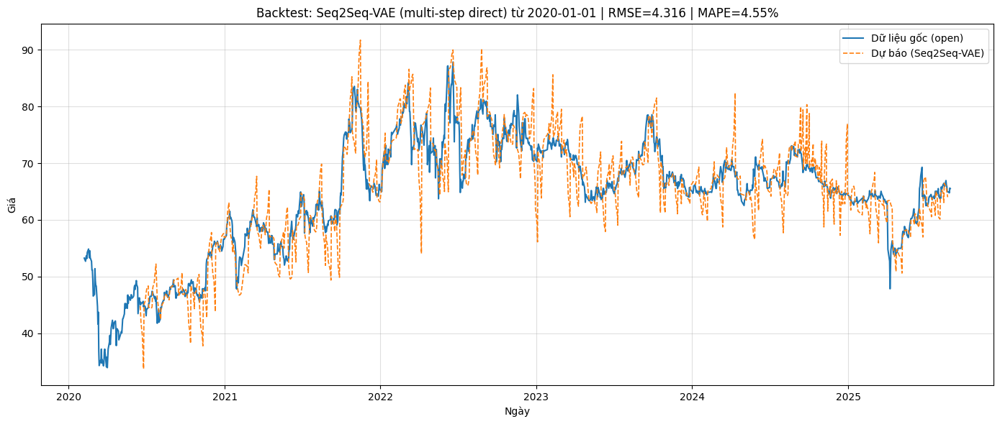

In [ ]:
start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"[Backtest toàn bộ từ 2020] RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo (Seq2Seq-VAE)", linewidth=1.2)
plt.title(f"Backtest: Seq2Seq-VAE (multi-step direct) từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.xlabel("Ngày"); plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


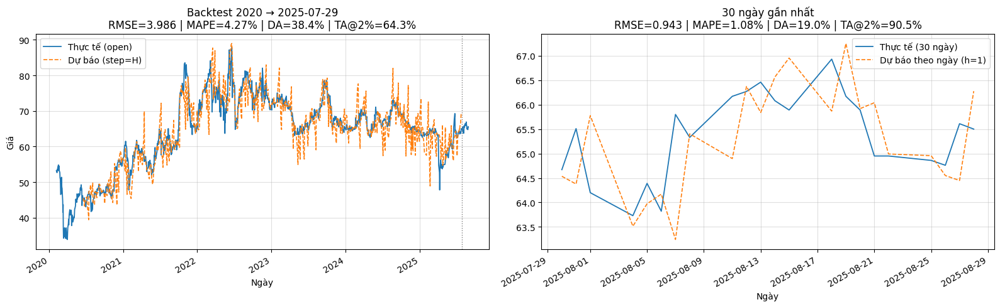

In [ ]:
# =========================================
# PLOTTING & TREND METRICS (KHÔNG ĐỘNG VÀO MÔ HÌNH)
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> (max-30d), step = H
# (2) 30 ngày gần nhất: dự báo theo ngày (h=1)
# + Tính thêm DA, TA@x% và xoay nhãn trục X
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- các hàm đánh giá xu hướng ----
def trend_labels_from_prices(prices, thr=0.0):
    """Trả về nhãn xu hướng {-1,0,1} dựa trên % thay đổi và ngưỡng thr (vd: 0.02 = 2%)"""
    r = (prices[1:] - prices[:-1]) / np.where(prices[:-1] == 0, 1e-9, prices[:-1])
    up  = (r >  thr).astype(int)
    down= (r < -thr).astype(int)
    lab = np.where(up==1, 1, np.where(down==1, -1, 0))
    return lab

def directional_accuracy(y_true, y_pred):
    n = min(len(y_true), len(y_pred))
    return float((y_true[:n] == y_pred[:n]).mean()) if n > 0 else np.nan

def ta_within_tol(actual, pred, tol=0.02):
    """TA@tol: nếu sai hướng nhưng |err%| < tol thì vẫn tính 'không sai nghiêm trọng'"""
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    act = actual[:n]; prd = pred[:n]
    # lấy nhãn xu hướng với thr=0 (chỉ xét hướng), sau đó áp dụng dung sai theo giá
    y_true = trend_labels_from_prices(act, thr=0.0)
    y_pred = trend_labels_from_prices(prd, thr=0.0)
    # lỗi phần trăm tại các mốc (bỏ phần tử đầu vì nhãn dùng diff)
    pct_err = np.abs((act[1:] - prd[1:]) / np.where(act[1:] == 0, 1e-9, act[1:]))
    ok = (y_true == y_pred) | (pct_err <= tol)
    return float(ok.mean())

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training (ret=shift(-1))

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) mốc tách: max - 30 ngày ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# =========================================
# (1) BACKTEST 2020 -> cutoff (multi-step, step=H)
# =========================================
# tìm chỉ số phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu đến {pd.Timestamp(cutoff).date()} cho W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)
bt_pred, bt_idx = [], []

for i in range(steps):
    e = W + i * H                       # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]    # (W,F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]
    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets: seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                       # (H,)
    tgt_end = min(e + H, cut_idx + 1)
    take    = max(0, tgt_end - e)
    if take:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp với bt_idx bằng mask (tránh reindex lỗi trùng nhãn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ độ dài
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Sai số giá & xu hướng
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / np.where(bt_actual==0, 1e-9, bt_actual))) * 100) if n1 else np.nan
# xu hướng (ngưỡng để tránh nhiễu — bạn có thể chỉnh)
THR = 0.002  # 0.2%
y_true_bt = trend_labels_from_prices(bt_actual, thr=THR)
y_pred_bt = trend_labels_from_prices(bt_pred,   thr=THR)
bt_DA     = directional_accuracy(y_true_bt, y_pred_bt)
bt_TA2    = ta_within_tol(bt_actual, bt_pred, tol=0.02)

# =========================================
# (2) 30 NGÀY GẦN NHẤT: dự báo THEO NGÀY (h=1)
# =========================================
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để dự báo.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])  # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / np.where(last_actual==0, 1e-9, last_actual))) * 100) if n2 else np.nan
y_true_d = trend_labels_from_prices(last_actual, thr=THR)
y_pred_d = trend_labels_from_prices(d_pred,       thr=THR)
d_DA     = directional_accuracy(y_true_d, y_pred_d)
d_TA2    = ta_within_tol(last_actual, d_pred, tol=0.02)

# =========================================
#  VẼ 2 BIỂU ĐỒ CẠNH NHAU + XOAY NHÃN TRỤC X
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# (trái) 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()}\n"
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | DA={bt_DA*100:.1f}% | TA@2%={bt_TA2*100:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
for tick in axes[0].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

# (phải) 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"30 ngày gần nhất\n"
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | DA={d_DA*100:.1f}% | TA@2%={d_TA2*100:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
for tick in axes[1].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

plt.tight_layout(); plt.show()



=== Đánh giá trung hạn 20 ngày ===


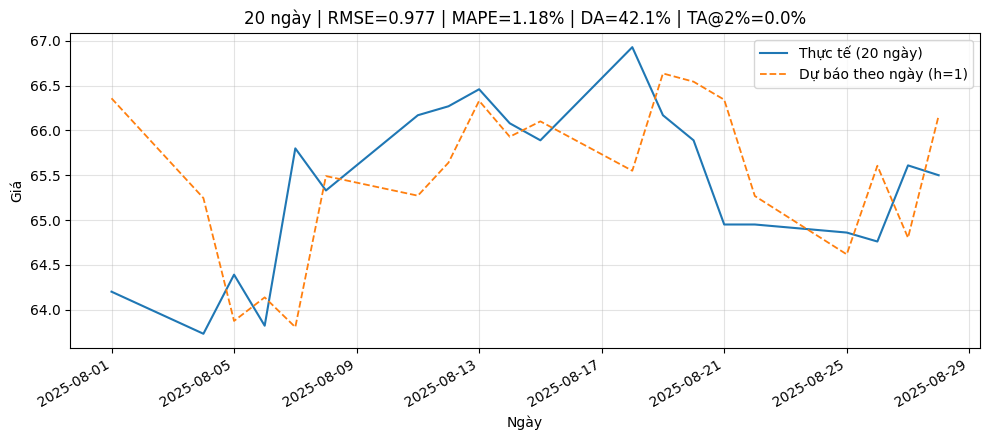


=== Đánh giá trung hạn 30 ngày ===


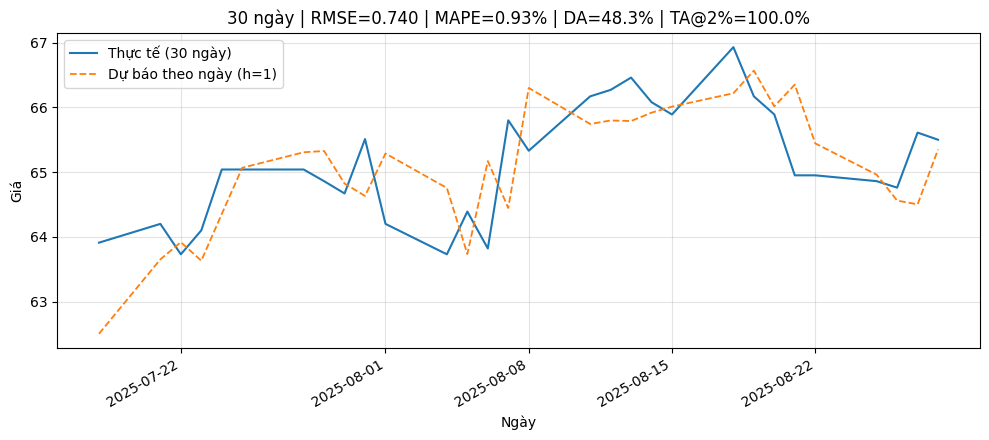


=== Đánh giá trung hạn 60 ngày ===


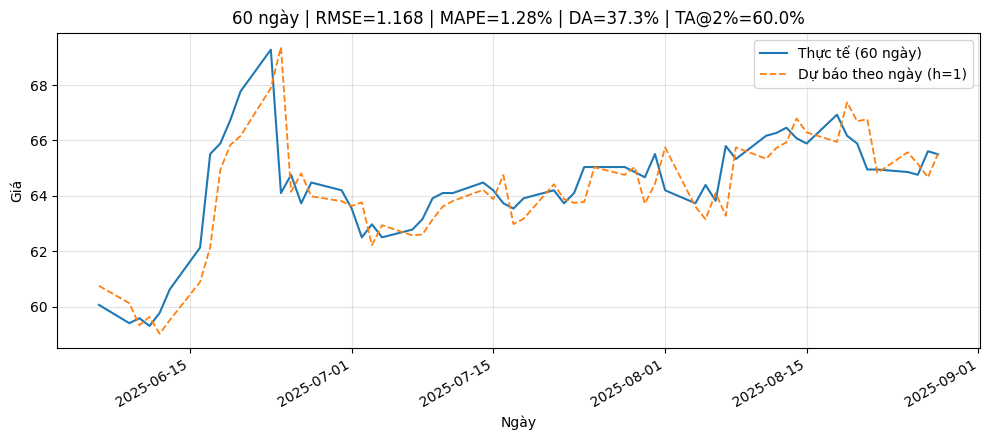


Tóm tắt trung hạn:
    N      rmse      mape         DA  TA@2%       start         end
0  20  0.976814  1.184520  42.105263    0.0  2025-08-01  2025-08-28
1  30  0.740231  0.927150  48.275862  100.0  2025-07-18  2025-08-28
2  60  1.168178  1.279932  37.288136   60.0  2025-06-06  2025-08-28


In [ ]:
# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


# Dự báo OIL

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/OIL_history_2020-01-01_2025-09-01.csv"
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   time    1500 non-null   object 
 1   open    1500 non-null   float64
 2   high    1500 non-null   float64
 3   low     1500 non-null   float64
 4   close   1500 non-null   float64
 5   volume  1500 non-null   int64  
 6   symbol  1500 non-null   object 
dtypes: float64(4), int64(1), object(2)
memory usage: 82.2+ KB


In [ ]:
import numpy as np
df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)


# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["close"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

# ==========================
# Đặt lại tên cột giống như bảng mẫu
# ==========================
df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1481 entries, 19 to 1499
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         1481 non-null   datetime64[ns]
 1   open         1481 non-null   float64       
 2   high         1481 non-null   float64       
 3   low          1481 non-null   float64       
 4   close        1481 non-null   float64       
 5   volume       1481 non-null   int64         
 6   symbol       1481 non-null   object        
 7   ma_5         1481 non-null   float64       
 8   ema_5        1481 non-null   float64       
 9   ma_10        1481 non-null   float64       
 10  ema_10       1481 non-null   float64       
 11  ma_20        1481 non-null   float64       
 12  ema_20       1481 non-null   float64       
 13  rsi_14       1481 non-null   float64       
 14  ret          1481 non-null   float64       
 15  open_pct     1481 non-null   float64       
 16  high_pct  

In [ ]:


# ----- cấu hình đường dẫn artifacts -----
BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# ----- 3) Làm sạch feature rồi scale (KHÔNG fit lại) -----
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# ----- 4) Backtest H ngày cuối (multi-step direct) -----
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest dùng BEST] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")


[Backtest dùng BEST] H=7: RMSE=0.5197 | MAPE=3.75%


[Backtest toàn bộ từ 2020] RMSE=0.870 | MAPE=5.34%


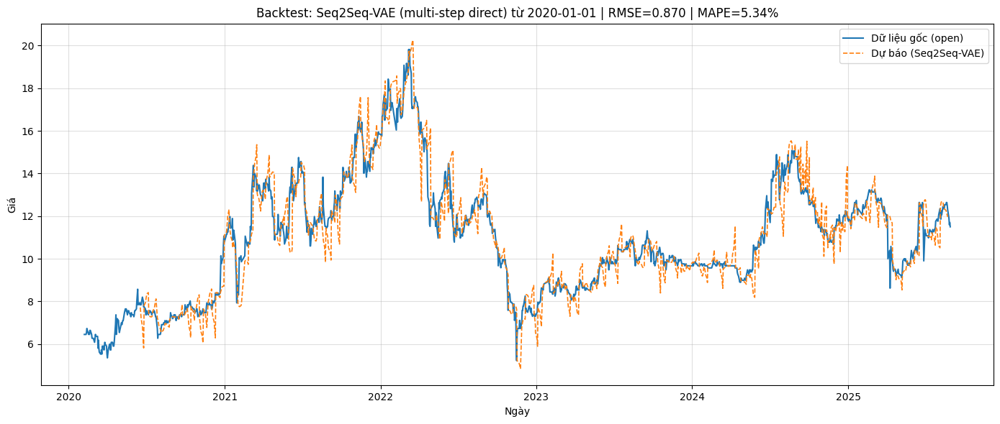

In [ ]:
start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"[Backtest toàn bộ từ 2020] RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo (Seq2Seq-VAE)", linewidth=1.2)
plt.title(f"Backtest: Seq2Seq-VAE (multi-step direct) từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.xlabel("Ngày"); plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


In [ ]:
# =========================================
# PLOTTING & TREND METRICS (KHÔNG ĐỘNG VÀO MÔ HÌNH)
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> (max-30d), step = H
# (2) 30 ngày gần nhất: dự báo theo ngày (h=1)
# + Tính thêm DA, TA@x% và xoay nhãn trục X
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- các hàm đánh giá xu hướng ----
def trend_labels_from_prices(prices, thr=0.0):
    """Trả về nhãn xu hướng {-1,0,1} dựa trên % thay đổi và ngưỡng thr (vd: 0.02 = 2%)"""
    r = (prices[1:] - prices[:-1]) / np.where(prices[:-1] == 0, 1e-9, prices[:-1])
    up  = (r >  thr).astype(int)
    down= (r < -thr).astype(int)
    lab = np.where(up==1, 1, np.where(down==1, -1, 0))
    return lab

def directional_accuracy(y_true, y_pred):
    n = min(len(y_true), len(y_pred))
    return float((y_true[:n] == y_pred[:n]).mean()) if n > 0 else np.nan

def ta_within_tol(actual, pred, tol=0.02):
    """TA@tol: nếu sai hướng nhưng |err%| < tol thì vẫn tính 'không sai nghiêm trọng'"""
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    act = actual[:n]; prd = pred[:n]
    # lấy nhãn xu hướng với thr=0 (chỉ xét hướng), sau đó áp dụng dung sai theo giá
    y_true = trend_labels_from_prices(act, thr=0.0)
    y_pred = trend_labels_from_prices(prd, thr=0.0)
    # lỗi phần trăm tại các mốc (bỏ phần tử đầu vì nhãn dùng diff)
    pct_err = np.abs((act[1:] - prd[1:]) / np.where(act[1:] == 0, 1e-9, act[1:]))
    ok = (y_true == y_pred) | (pct_err <= tol)
    return float(ok.mean())

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training (ret=shift(-1))

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) mốc tách: max - 30 ngày ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# =========================================
# (1) BACKTEST 2020 -> cutoff (multi-step, step=H)
# =========================================
# tìm chỉ số phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu đến {pd.Timestamp(cutoff).date()} cho W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)
bt_pred, bt_idx = [], []

for i in range(steps):
    e = W + i * H                       # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]    # (W,F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]
    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets: seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                       # (H,)
    tgt_end = min(e + H, cut_idx + 1)
    take    = max(0, tgt_end - e)
    if take:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp với bt_idx bằng mask (tránh reindex lỗi trùng nhãn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ độ dài
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Sai số giá & xu hướng
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / np.where(bt_actual==0, 1e-9, bt_actual))) * 100) if n1 else np.nan
# xu hướng (ngưỡng để tránh nhiễu — bạn có thể chỉnh)
THR = 0.002  # 0.2%
y_true_bt = trend_labels_from_prices(bt_actual, thr=THR)
y_pred_bt = trend_labels_from_prices(bt_pred,   thr=THR)
bt_DA     = directional_accuracy(y_true_bt, y_pred_bt)
bt_TA2    = ta_within_tol(bt_actual, bt_pred, tol=0.02)

# =========================================
# (2) 30 NGÀY GẦN NHẤT: dự báo THEO NGÀY (h=1)
# =========================================
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để dự báo.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])  # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / np.where(last_actual==0, 1e-9, last_actual))) * 100) if n2 else np.nan
y_true_d = trend_labels_from_prices(last_actual, thr=THR)
y_pred_d = trend_labels_from_prices(d_pred,       thr=THR)
d_DA     = directional_accuracy(y_true_d, y_pred_d)
d_TA2    = ta_within_tol(last_actual, d_pred, tol=0.02)

# =========================================
#  VẼ 2 BIỂU ĐỒ CẠNH NHAU + XOAY NHÃN TRỤC X
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# (trái) 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()}\n"
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | DA={bt_DA*100:.1f}% | TA@2%={bt_TA2*100:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
for tick in axes[0].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

# (phải) 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"30 ngày gần nhất\n"
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | DA={d_DA*100:.1f}% | TA@2%={d_TA2*100:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
for tick in axes[1].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

plt.tight_layout(); plt.show()



=== Đánh giá trung hạn 20 ngày ===


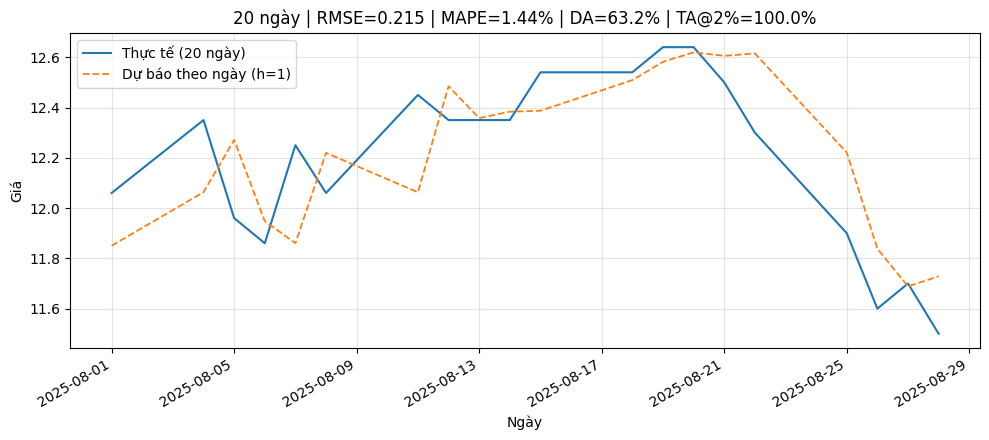


=== Đánh giá trung hạn 30 ngày ===


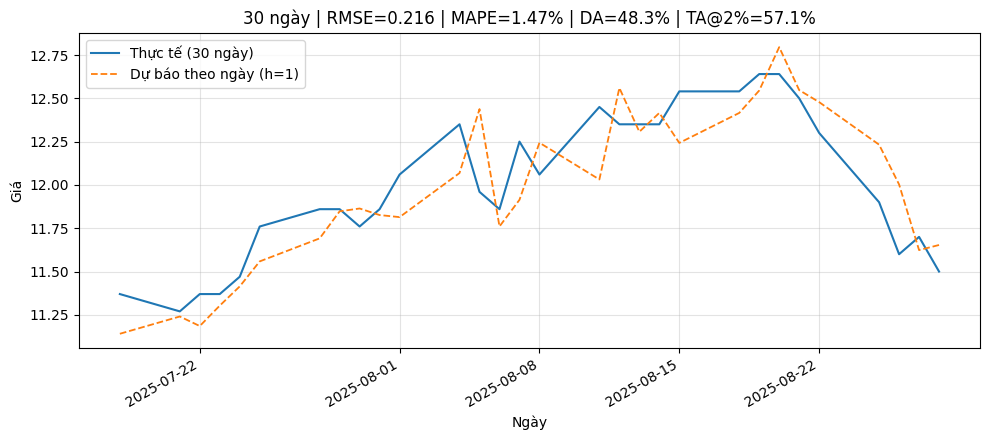


=== Đánh giá trung hạn 60 ngày ===


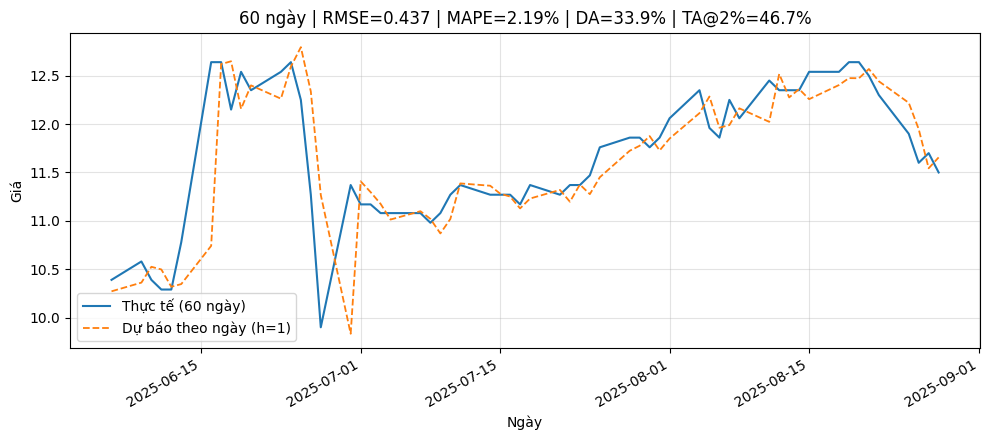


Tóm tắt trung hạn:
    N      rmse      mape         DA       TA@2%       start         end
0  20  0.215398  1.438785  63.157895  100.000000  2025-08-01  2025-08-28
1  30  0.215962  1.472200  48.275862   57.142857  2025-07-18  2025-08-28
2  60  0.437265  2.194577  33.898305   46.666667  2025-06-06  2025-08-28


In [ ]:
# ============================================
# DỰ BÁO TRUNG HẠN THEO NGÀY CHO 20/30/60 NGÀY (h=1)
# - Reuse model đã nạp: vae, x_scaler, cfg
# - Tính các chỉ số RMSE, MAPE, DA, TA@2%
# - Vẽ 1 figure riêng cho mỗi khung ngày
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


# Dự báo PLX

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/PLX_history_2020-01-01_2025-09-01.csv"
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   time    1500 non-null   object 
 1   open    1500 non-null   float64
 2   high    1500 non-null   float64
 3   low     1500 non-null   float64
 4   close   1500 non-null   float64
 5   volume  1500 non-null   int64  
 6   symbol  1500 non-null   object 
dtypes: float64(4), int64(1), object(2)
memory usage: 82.2+ KB


In [ ]:

df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)


# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["close"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

# ==========================
# Đặt lại tên cột giống như bảng mẫu
# ==========================
df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1481 entries, 19 to 1499
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         1481 non-null   datetime64[ns]
 1   open         1481 non-null   float64       
 2   high         1481 non-null   float64       
 3   low          1481 non-null   float64       
 4   close        1481 non-null   float64       
 5   volume       1481 non-null   int64         
 6   symbol       1481 non-null   object        
 7   ma_5         1481 non-null   float64       
 8   ema_5        1481 non-null   float64       
 9   ma_10        1481 non-null   float64       
 10  ema_10       1481 non-null   float64       
 11  ma_20        1481 non-null   float64       
 12  ema_20       1481 non-null   float64       
 13  rsi_14       1481 non-null   float64       
 14  ret          1481 non-null   float64       
 15  open_pct     1481 non-null   float64       
 16  high_pct  

In [ ]:
# ----- cấu hình đường dẫn artifacts -----
# BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# ----- 3) Làm sạch feature rồi scale (KHÔNG fit lại) -----
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# ----- 4) Backtest H ngày cuối (multi-step direct) -----
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest dùng BEST] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")



[Backtest dùng BEST] H=7: RMSE=1.6152 | MAPE=4.00%


[Backtest toàn bộ từ 2020] RMSE=2.559 | MAPE=4.57%


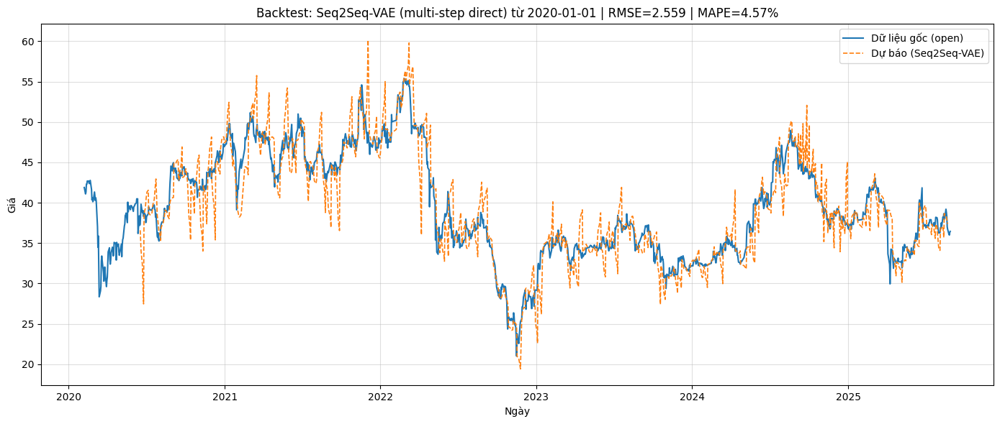

In [ ]:

start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"[Backtest toàn bộ từ 2020] RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo (Seq2Seq-VAE)", linewidth=1.2)
plt.title(f"Backtest: Seq2Seq-VAE (multi-step direct) từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.xlabel("Ngày"); plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


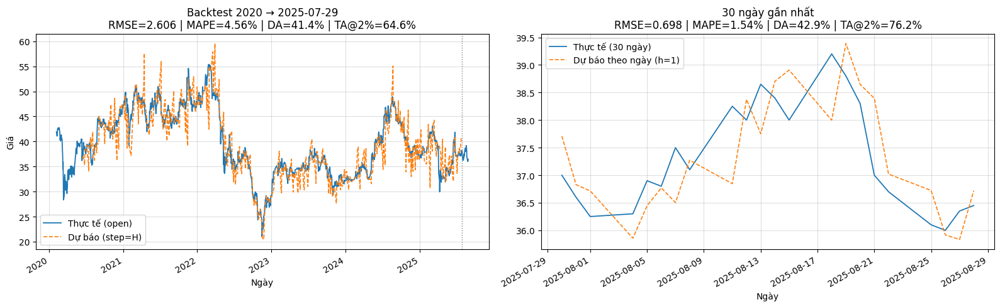

In [ ]:
# =========================================
# PLOTTING & TREND METRICS (KHÔNG ĐỘNG VÀO MÔ HÌNH)
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> (max-30d), step = H
# (2) 30 ngày gần nhất: dự báo theo ngày (h=1)
# + Tính thêm DA, TA@x% và xoay nhãn trục X
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- các hàm đánh giá xu hướng ----
def trend_labels_from_prices(prices, thr=0.0):
    """Trả về nhãn xu hướng {-1,0,1} dựa trên % thay đổi và ngưỡng thr (vd: 0.02 = 2%)"""
    r = (prices[1:] - prices[:-1]) / np.where(prices[:-1] == 0, 1e-9, prices[:-1])
    up  = (r >  thr).astype(int)
    down= (r < -thr).astype(int)
    lab = np.where(up==1, 1, np.where(down==1, -1, 0))
    return lab

def directional_accuracy(y_true, y_pred):
    n = min(len(y_true), len(y_pred))
    return float((y_true[:n] == y_pred[:n]).mean()) if n > 0 else np.nan

def ta_within_tol(actual, pred, tol=0.02):
    """TA@tol: nếu sai hướng nhưng |err%| < tol thì vẫn tính 'không sai nghiêm trọng'"""
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    act = actual[:n]; prd = pred[:n]
    # lấy nhãn xu hướng với thr=0 (chỉ xét hướng), sau đó áp dụng dung sai theo giá
    y_true = trend_labels_from_prices(act, thr=0.0)
    y_pred = trend_labels_from_prices(prd, thr=0.0)
    # lỗi phần trăm tại các mốc (bỏ phần tử đầu vì nhãn dùng diff)
    pct_err = np.abs((act[1:] - prd[1:]) / np.where(act[1:] == 0, 1e-9, act[1:]))
    ok = (y_true == y_pred) | (pct_err <= tol)
    return float(ok.mean())

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training (ret=shift(-1))

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) mốc tách: max - 30 ngày ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# =========================================
# (1) BACKTEST 2020 -> cutoff (multi-step, step=H)
# =========================================
# tìm chỉ số phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu đến {pd.Timestamp(cutoff).date()} cho W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)
bt_pred, bt_idx = [], []

for i in range(steps):
    e = W + i * H                       # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]    # (W,F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]
    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets: seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                       # (H,)
    tgt_end = min(e + H, cut_idx + 1)
    take    = max(0, tgt_end - e)
    if take:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp với bt_idx bằng mask (tránh reindex lỗi trùng nhãn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ độ dài
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Sai số giá & xu hướng
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / np.where(bt_actual==0, 1e-9, bt_actual))) * 100) if n1 else np.nan
# xu hướng (ngưỡng để tránh nhiễu — bạn có thể chỉnh)
THR = 0.002  # 0.2%
y_true_bt = trend_labels_from_prices(bt_actual, thr=THR)
y_pred_bt = trend_labels_from_prices(bt_pred,   thr=THR)
bt_DA     = directional_accuracy(y_true_bt, y_pred_bt)
bt_TA2    = ta_within_tol(bt_actual, bt_pred, tol=0.02)

# =========================================
# (2) 30 NGÀY GẦN NHẤT: dự báo THEO NGÀY (h=1)
# =========================================
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để dự báo.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])  # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / np.where(last_actual==0, 1e-9, last_actual))) * 100) if n2 else np.nan
y_true_d = trend_labels_from_prices(last_actual, thr=THR)
y_pred_d = trend_labels_from_prices(d_pred,       thr=THR)
d_DA     = directional_accuracy(y_true_d, y_pred_d)
d_TA2    = ta_within_tol(last_actual, d_pred, tol=0.02)

# =========================================
#  VẼ 2 BIỂU ĐỒ CẠNH NHAU + XOAY NHÃN TRỤC X
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# (trái) 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()}\n"
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | DA={bt_DA*100:.1f}% | TA@2%={bt_TA2*100:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
for tick in axes[0].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

# (phải) 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"30 ngày gần nhất\n"
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | DA={d_DA*100:.1f}% | TA@2%={d_TA2*100:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
for tick in axes[1].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

plt.tight_layout(); plt.show()



=== Đánh giá trung hạn 20 ngày ===


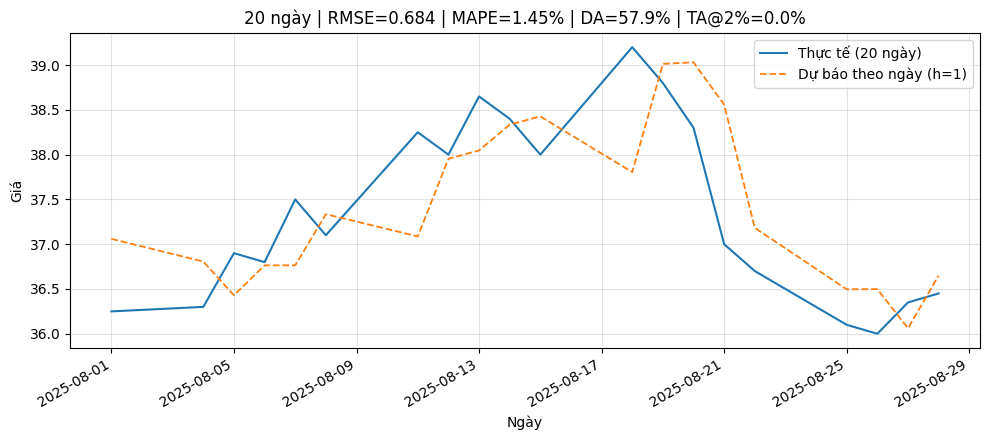


=== Đánh giá trung hạn 30 ngày ===


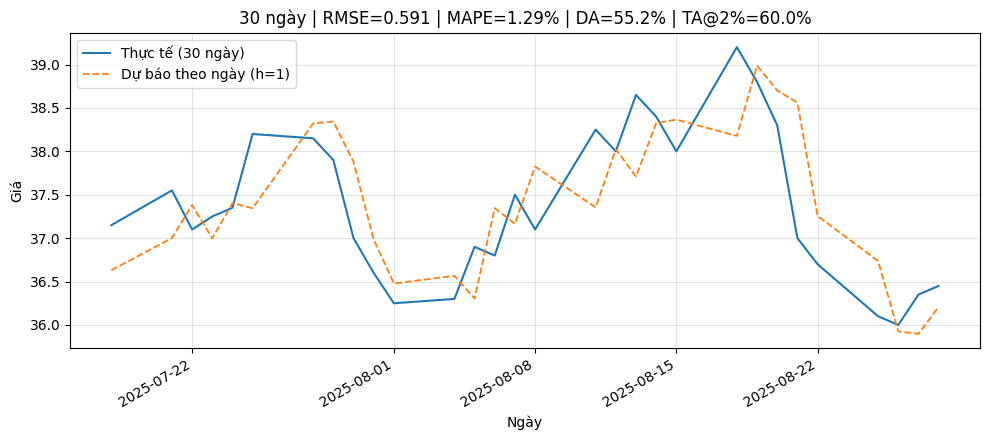


=== Đánh giá trung hạn 60 ngày ===


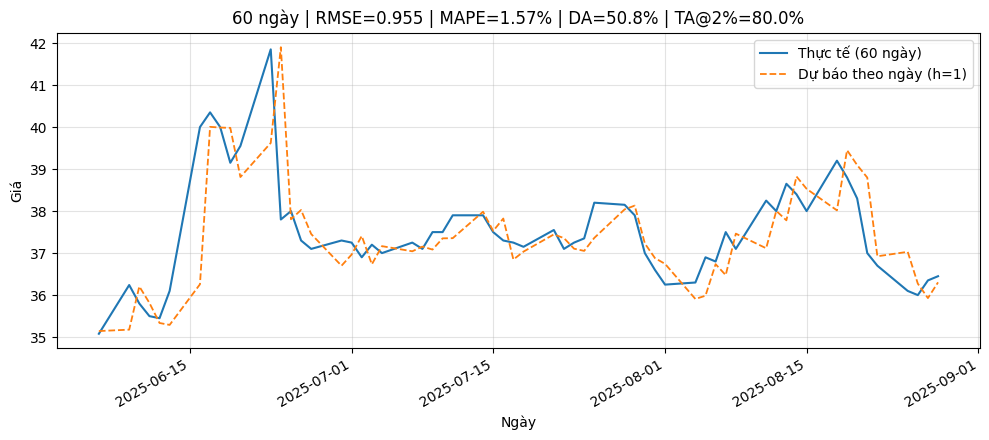


Tóm tắt trung hạn:
    N      rmse      mape         DA  TA@2%       start         end
0  20  0.683772  1.449008  57.894737    0.0  2025-08-01  2025-08-28
1  30  0.591384  1.292353  55.172414   60.0  2025-07-18  2025-08-28
2  60  0.955031  1.566667  50.847458   80.0  2025-06-06  2025-08-28


In [ ]:
# ============================================
# DỰ BÁO TRUNG HẠN THEO NGÀY CHO 20/30/60 NGÀY (h=1)
# - Reuse model đã nạp: vae, x_scaler, cfg
# - Tính các chỉ số RMSE, MAPE, DA, TA@2%
# - Vẽ 1 figure riêng cho mỗi khung ngày
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


# Dự báo PVG

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/PVG_history_2020-01-01_2025-09-01.csv"
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   time    1500 non-null   object 
 1   open    1500 non-null   float64
 2   high    1500 non-null   float64
 3   low     1500 non-null   float64
 4   close   1500 non-null   float64
 5   volume  1500 non-null   int64  
 6   symbol  1500 non-null   object 
dtypes: float64(4), int64(1), object(2)
memory usage: 82.2+ KB


In [ ]:

df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)

# ==========================
# Các chỉ báo kỹ thuật
# ==========================

# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["close"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

# ==========================
# Đặt lại tên cột giống như bảng mẫu
# ==========================
df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1480 entries, 19 to 1499
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         1480 non-null   datetime64[ns]
 1   open         1480 non-null   float64       
 2   high         1480 non-null   float64       
 3   low          1480 non-null   float64       
 4   close        1480 non-null   float64       
 5   volume       1480 non-null   int64         
 6   symbol       1480 non-null   object        
 7   ma_5         1480 non-null   float64       
 8   ema_5        1480 non-null   float64       
 9   ma_10        1480 non-null   float64       
 10  ema_10       1480 non-null   float64       
 11  ma_20        1480 non-null   float64       
 12  ema_20       1480 non-null   float64       
 13  rsi_14       1480 non-null   float64       
 14  ret          1480 non-null   float64       
 15  open_pct     1480 non-null   float64       
 16  high_pct  

In [ ]:

# ----- cấu hình đường dẫn artifacts -----
# BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# ----- 3) Làm sạch feature rồi scale (KHÔNG fit lại) -----
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# ----- 4) Backtest H ngày cuối (multi-step direct) -----
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest dùng BEST] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")



[Backtest dùng BEST] H=7: RMSE=0.2438 | MAPE=3.20%


[Backtest toàn bộ từ 2020] RMSE=0.778 | MAPE=5.43%


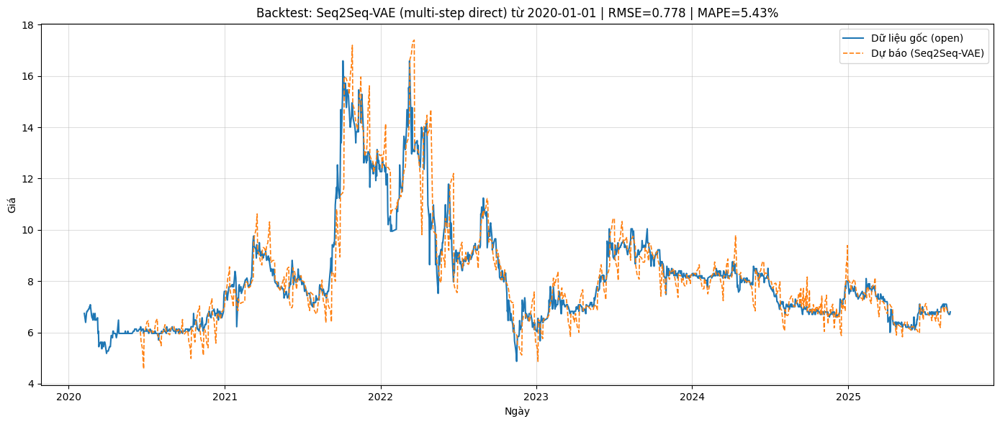

In [ ]:


start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"[Backtest toàn bộ từ 2020] RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo (Seq2Seq-VAE)", linewidth=1.2)
plt.title(f"Backtest: Seq2Seq-VAE (multi-step direct) từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.xlabel("Ngày"); plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


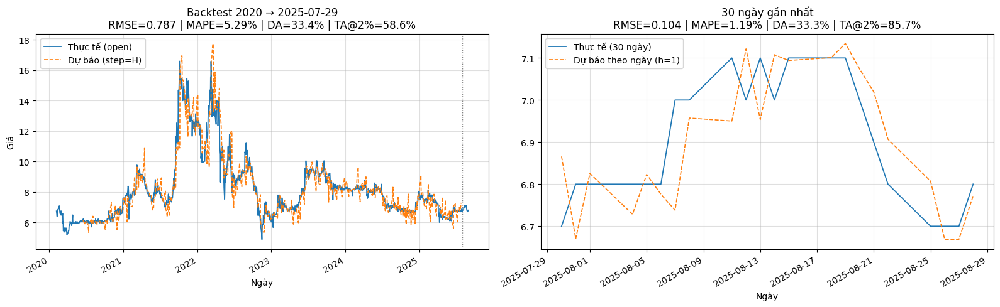

In [ ]:
# =========================================
# PLOTTING & TREND METRICS (KHÔNG ĐỘNG VÀO MÔ HÌNH)
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> (max-30d), step = H
# (2) 30 ngày gần nhất: dự báo theo ngày (h=1)
# + Tính thêm DA, TA@x% và xoay nhãn trục X
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- các hàm đánh giá xu hướng ----
def trend_labels_from_prices(prices, thr=0.0):
    """Trả về nhãn xu hướng {-1,0,1} dựa trên % thay đổi và ngưỡng thr (vd: 0.02 = 2%)"""
    r = (prices[1:] - prices[:-1]) / np.where(prices[:-1] == 0, 1e-9, prices[:-1])
    up  = (r >  thr).astype(int)
    down= (r < -thr).astype(int)
    lab = np.where(up==1, 1, np.where(down==1, -1, 0))
    return lab

def directional_accuracy(y_true, y_pred):
    n = min(len(y_true), len(y_pred))
    return float((y_true[:n] == y_pred[:n]).mean()) if n > 0 else np.nan

def ta_within_tol(actual, pred, tol=0.02):
    """TA@tol: nếu sai hướng nhưng |err%| < tol thì vẫn tính 'không sai nghiêm trọng'"""
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    act = actual[:n]; prd = pred[:n]
    # lấy nhãn xu hướng với thr=0 (chỉ xét hướng), sau đó áp dụng dung sai theo giá
    y_true = trend_labels_from_prices(act, thr=0.0)
    y_pred = trend_labels_from_prices(prd, thr=0.0)
    # lỗi phần trăm tại các mốc (bỏ phần tử đầu vì nhãn dùng diff)
    pct_err = np.abs((act[1:] - prd[1:]) / np.where(act[1:] == 0, 1e-9, act[1:]))
    ok = (y_true == y_pred) | (pct_err <= tol)
    return float(ok.mean())

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training (ret=shift(-1))

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) mốc tách: max - 30 ngày ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# =========================================
# (1) BACKTEST 2020 -> cutoff (multi-step, step=H)
# =========================================
# tìm chỉ số phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu đến {pd.Timestamp(cutoff).date()} cho W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)
bt_pred, bt_idx = [], []

for i in range(steps):
    e = W + i * H                       # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]    # (W,F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]
    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets: seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                       # (H,)
    tgt_end = min(e + H, cut_idx + 1)
    take    = max(0, tgt_end - e)
    if take:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp với bt_idx bằng mask (tránh reindex lỗi trùng nhãn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ độ dài
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Sai số giá & xu hướng
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / np.where(bt_actual==0, 1e-9, bt_actual))) * 100) if n1 else np.nan
# xu hướng (ngưỡng để tránh nhiễu — bạn có thể chỉnh)
THR = 0.002  # 0.2%
y_true_bt = trend_labels_from_prices(bt_actual, thr=THR)
y_pred_bt = trend_labels_from_prices(bt_pred,   thr=THR)
bt_DA     = directional_accuracy(y_true_bt, y_pred_bt)
bt_TA2    = ta_within_tol(bt_actual, bt_pred, tol=0.02)

# =========================================
# (2) 30 NGÀY GẦN NHẤT: dự báo THEO NGÀY (h=1)
# =========================================
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để dự báo.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])  # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / np.where(last_actual==0, 1e-9, last_actual))) * 100) if n2 else np.nan
y_true_d = trend_labels_from_prices(last_actual, thr=THR)
y_pred_d = trend_labels_from_prices(d_pred,       thr=THR)
d_DA     = directional_accuracy(y_true_d, y_pred_d)
d_TA2    = ta_within_tol(last_actual, d_pred, tol=0.02)

# =========================================
#  VẼ 2 BIỂU ĐỒ CẠNH NHAU + XOAY NHÃN TRỤC X
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# (trái) 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()}\n"
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | DA={bt_DA*100:.1f}% | TA@2%={bt_TA2*100:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
for tick in axes[0].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

# (phải) 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"30 ngày gần nhất\n"
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | DA={d_DA*100:.1f}% | TA@2%={d_TA2*100:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
for tick in axes[1].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

plt.tight_layout(); plt.show()



=== Đánh giá trung hạn 20 ngày ===


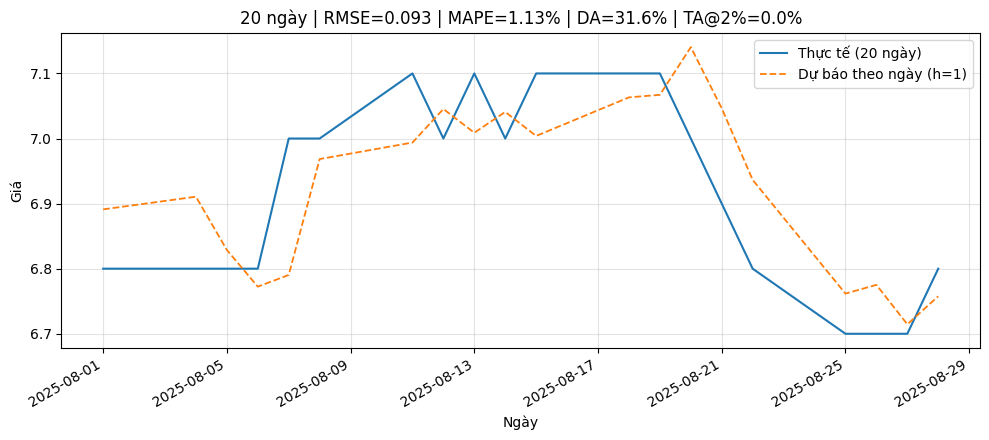


=== Đánh giá trung hạn 30 ngày ===


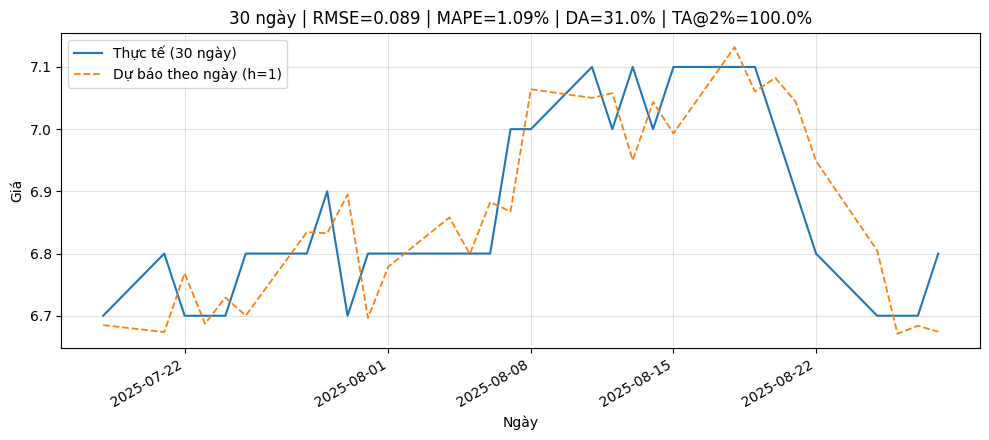


=== Đánh giá trung hạn 60 ngày ===


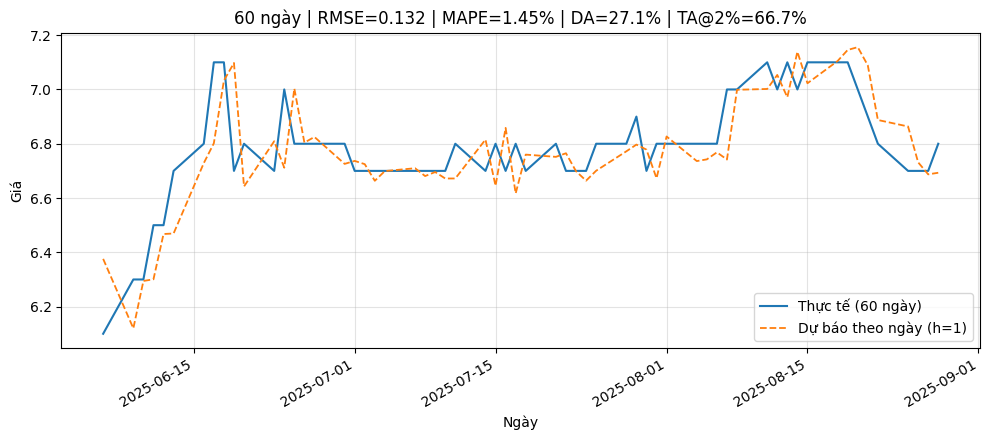


Tóm tắt trung hạn:
    N      rmse      mape         DA       TA@2%       start         end
0  20  0.093078  1.130174  31.578947    0.000000  2025-08-01  2025-08-28
1  30  0.089491  1.087544  31.034483  100.000000  2025-07-18  2025-08-28
2  60  0.131518  1.451187  27.118644   66.666667  2025-06-06  2025-08-28


In [ ]:
# ============================================
# DỰ BÁO TRUNG HẠN THEO NGÀY CHO 20/30/60 NGÀY (h=1)
# - Reuse model đã nạp: vae, x_scaler, cfg
# - Tính các chỉ số RMSE, MAPE, DA, TA@2%
# - Vẽ 1 figure riêng cho mỗi khung ngày
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


# Dự báo SGT

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/SGT_history_2020-01-01_2025-09-01.csv"
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   time    1500 non-null   object 
 1   open    1500 non-null   float64
 2   high    1500 non-null   float64
 3   low     1500 non-null   float64
 4   close   1500 non-null   float64
 5   volume  1500 non-null   int64  
 6   symbol  1500 non-null   object 
dtypes: float64(4), int64(1), object(2)
memory usage: 82.2+ KB


In [ ]:

df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)

# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["close"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

# ==========================
# Đặt lại tên cột giống như bảng mẫu
# ==========================
df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1478 entries, 19 to 1499
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         1478 non-null   datetime64[ns]
 1   open         1478 non-null   float64       
 2   high         1478 non-null   float64       
 3   low          1478 non-null   float64       
 4   close        1478 non-null   float64       
 5   volume       1478 non-null   int64         
 6   symbol       1478 non-null   object        
 7   ma_5         1478 non-null   float64       
 8   ema_5        1478 non-null   float64       
 9   ma_10        1478 non-null   float64       
 10  ema_10       1478 non-null   float64       
 11  ma_20        1478 non-null   float64       
 12  ema_20       1478 non-null   float64       
 13  rsi_14       1478 non-null   float64       
 14  ret          1478 non-null   float64       
 15  open_pct     1478 non-null   float64       
 16  high_pct  

In [ ]:
# ----- cấu hình đường dẫn artifacts -----
# BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# ----- 3) Làm sạch feature rồi scale (KHÔNG fit lại) -----
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# ----- 4) Backtest H ngày cuối (multi-step direct) -----
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest dùng BEST] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")


[Backtest dùng BEST] H=7: RMSE=0.3365 | MAPE=1.65%


[Backtest toàn bộ từ 2020] RMSE=1.183 | MAPE=5.65%


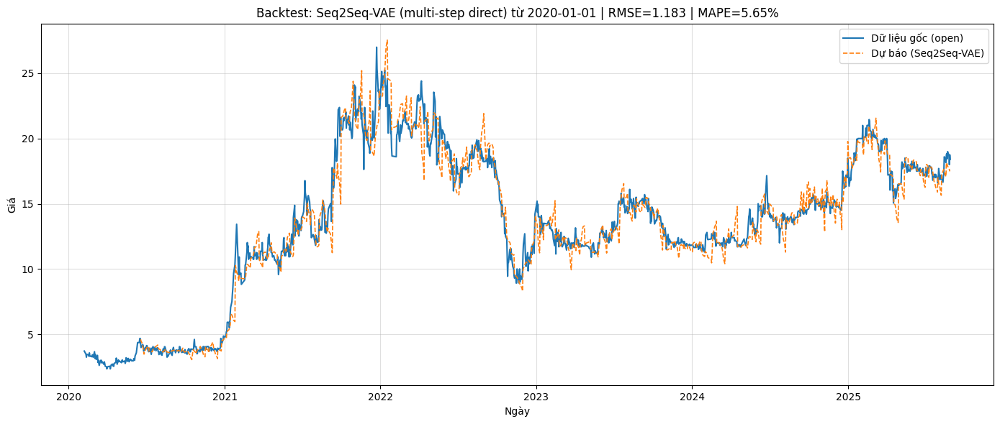

In [ ]:
start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"[Backtest toàn bộ từ 2020] RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo (Seq2Seq-VAE)", linewidth=1.2)
plt.title(f"Backtest: Seq2Seq-VAE (multi-step direct) từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.xlabel("Ngày"); plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


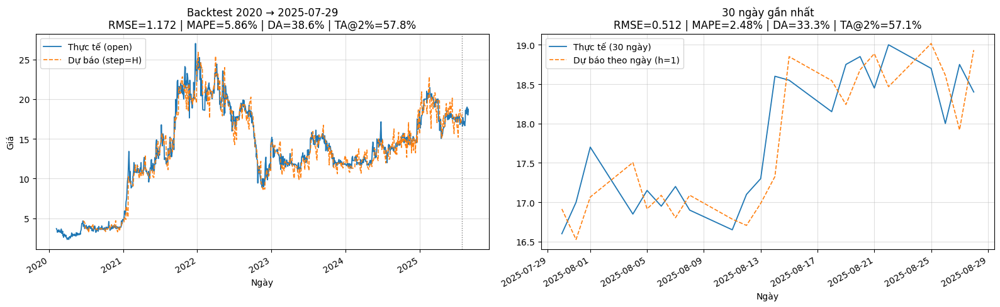

In [ ]:
# =========================================
# PLOTTING & TREND METRICS (KHÔNG ĐỘNG VÀO MÔ HÌNH)
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> (max-30d), step = H
# (2) 30 ngày gần nhất: dự báo theo ngày (h=1)
# + Tính thêm DA, TA@x% và xoay nhãn trục X
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- các hàm đánh giá xu hướng ----
def trend_labels_from_prices(prices, thr=0.0):
    """Trả về nhãn xu hướng {-1,0,1} dựa trên % thay đổi và ngưỡng thr (vd: 0.02 = 2%)"""
    r = (prices[1:] - prices[:-1]) / np.where(prices[:-1] == 0, 1e-9, prices[:-1])
    up  = (r >  thr).astype(int)
    down= (r < -thr).astype(int)
    lab = np.where(up==1, 1, np.where(down==1, -1, 0))
    return lab

def directional_accuracy(y_true, y_pred):
    n = min(len(y_true), len(y_pred))
    return float((y_true[:n] == y_pred[:n]).mean()) if n > 0 else np.nan

def ta_within_tol(actual, pred, tol=0.02):
    """TA@tol: nếu sai hướng nhưng |err%| < tol thì vẫn tính 'không sai nghiêm trọng'"""
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    act = actual[:n]; prd = pred[:n]
    # lấy nhãn xu hướng với thr=0 (chỉ xét hướng), sau đó áp dụng dung sai theo giá
    y_true = trend_labels_from_prices(act, thr=0.0)
    y_pred = trend_labels_from_prices(prd, thr=0.0)
    # lỗi phần trăm tại các mốc (bỏ phần tử đầu vì nhãn dùng diff)
    pct_err = np.abs((act[1:] - prd[1:]) / np.where(act[1:] == 0, 1e-9, act[1:]))
    ok = (y_true == y_pred) | (pct_err <= tol)
    return float(ok.mean())

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training (ret=shift(-1))

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) mốc tách: max - 30 ngày ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# =========================================
# (1) BACKTEST 2020 -> cutoff (multi-step, step=H)
# =========================================
# tìm chỉ số phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu đến {pd.Timestamp(cutoff).date()} cho W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)
bt_pred, bt_idx = [], []

for i in range(steps):
    e = W + i * H                       # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]    # (W,F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]
    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets: seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                       # (H,)
    tgt_end = min(e + H, cut_idx + 1)
    take    = max(0, tgt_end - e)
    if take:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp với bt_idx bằng mask (tránh reindex lỗi trùng nhãn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ độ dài
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Sai số giá & xu hướng
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / np.where(bt_actual==0, 1e-9, bt_actual))) * 100) if n1 else np.nan
# xu hướng (ngưỡng để tránh nhiễu — bạn có thể chỉnh)
THR = 0.002  # 0.2%
y_true_bt = trend_labels_from_prices(bt_actual, thr=THR)
y_pred_bt = trend_labels_from_prices(bt_pred,   thr=THR)
bt_DA     = directional_accuracy(y_true_bt, y_pred_bt)
bt_TA2    = ta_within_tol(bt_actual, bt_pred, tol=0.02)

# =========================================
# (2) 30 NGÀY GẦN NHẤT: dự báo THEO NGÀY (h=1)
# =========================================
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để dự báo.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])  # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / np.where(last_actual==0, 1e-9, last_actual))) * 100) if n2 else np.nan
y_true_d = trend_labels_from_prices(last_actual, thr=THR)
y_pred_d = trend_labels_from_prices(d_pred,       thr=THR)
d_DA     = directional_accuracy(y_true_d, y_pred_d)
d_TA2    = ta_within_tol(last_actual, d_pred, tol=0.02)

# =========================================
#  VẼ 2 BIỂU ĐỒ CẠNH NHAU + XOAY NHÃN TRỤC X
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# (trái) 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()}\n"
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | DA={bt_DA*100:.1f}% | TA@2%={bt_TA2*100:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
for tick in axes[0].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

# (phải) 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"30 ngày gần nhất\n"
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | DA={d_DA*100:.1f}% | TA@2%={d_TA2*100:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
for tick in axes[1].get_xticklabels(): tick.set_rotation(30); tick.set_ha("right")

plt.tight_layout(); plt.show()



=== Đánh giá trung hạn 20 ngày ===


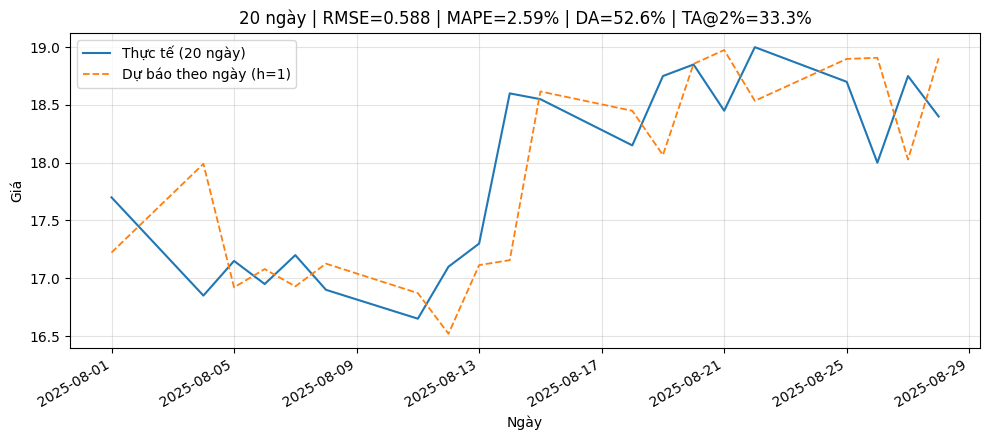


=== Đánh giá trung hạn 30 ngày ===


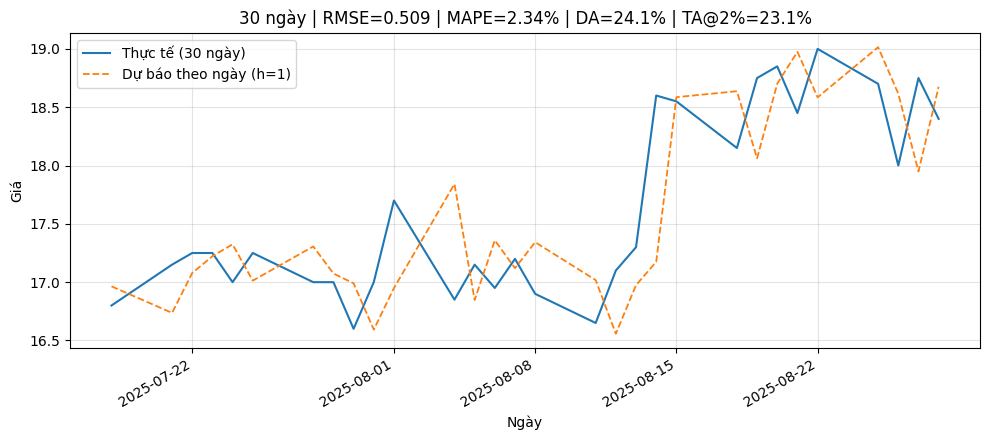


=== Đánh giá trung hạn 60 ngày ===


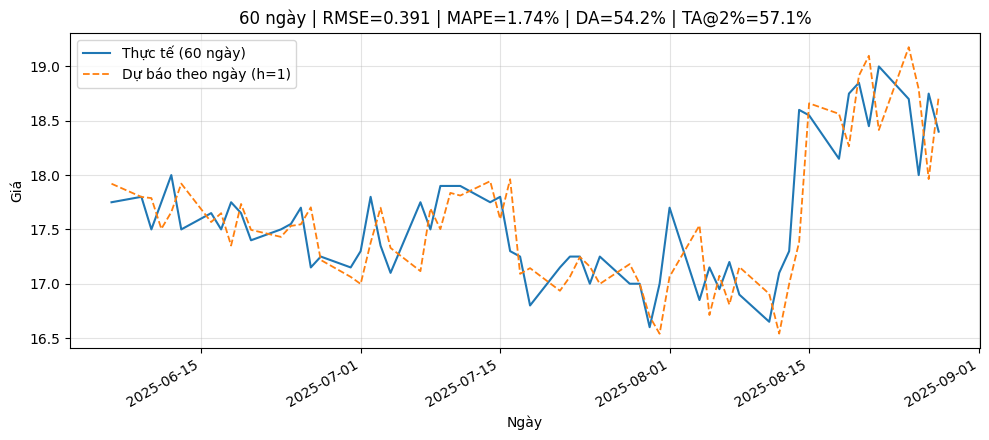


Tóm tắt trung hạn:
    N      rmse      mape         DA      TA@2%       start         end
0  20  0.588092  2.585131  52.631579  33.333333  2025-08-01  2025-08-28
1  30  0.508513  2.344814  24.137931  23.076923  2025-07-18  2025-08-28
2  60  0.390756  1.744046  54.237288  57.142857  2025-06-06  2025-08-28


In [ ]:
# ============================================
# DỰ BÁO TRUNG HẠN THEO NGÀY CHO 20/30/60 NGÀY (h=1)
# - Reuse model đã nạp: vae, x_scaler, cfg
# - Tính các chỉ số RMSE, MAPE, DA, TA@2%
# - Vẽ 1 figure riêng cho mỗi khung ngày
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


## So sánh VAE && TCN

In [ ]:
# ============================================================
# CODE 2 — VAE seq2seq (đã có) + Baseline #2: TCN (Temporal Convolutional Network)
# - cùng đặc trưng & đầu vào: (W,F) -> H bước log-return (multi-step direct)
# ============================================================
import os, json, joblib, numpy as np, pandas as pd
import tensorflow as tf
from keras import models as keras_models, layers, optimizers, callbacks
from keras import ops as K

# BEST_DIR = "/content/drive/MyDrive/kpdl/model_fpt_2"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

W = int(cfg["W"]); H = int(cfg["H"])
HIDDEN = int(cfg["HIDDEN"]); DROPOUT = float(cfg["DROPOUT"])
LR = float(cfg["LR"]); BATCH = int(cfg["BATCH"]); EPOCHS = int(cfg["EPOCHS"])
TARGET_COL = cfg["TARGET_COL"]; feature_cols_cfg = cfg["feature_cols"]
assert "df" in globals(), "Cần có biến df trong môi trường."

def make_design_matrix(df_in: pd.DataFrame, feature_cols, target_col, W, H, scaler):
    df_use = df_in.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill().fillna(0.0)
               .clip(-1e6, 1e6)
    )
    X_scaled = scaler.transform(X_feats.astype("float32")).astype("float32")
    prices = df_use[target_col].to_numpy(dtype=np.float32)

    eps = 1e-9
    logret = np.zeros_like(prices, dtype=np.float32)
    logret[1:] = np.log((prices[1:] + eps) / (np.maximum(prices[:-1], eps)))

    Xs, Ys = [], []
    for end in range(W, len(prices) - H):
        Xs.append(X_scaled[end - W:end])
        Ys.append(logret[end + 1:end + 1 + H])
    return np.asarray(Xs, np.float32), np.asarray(Ys, np.float32), df_use

X_all, y_all, df_use = make_design_matrix(df, feature_cols_cfg, TARGET_COL, W, H, x_scaler)
F = X_all.shape[-1]
print("Data:", X_all.shape, y_all.shape)

# --------- Baseline #2: TCN ----------
def ResidualBlock(x, dilation, filters, kernel_size=3, dropout=0.2):
    # causal padding cho TCN
    pad = (kernel_size - 1) * dilation
    x_in = x
    x = layers.ZeroPadding1D((pad, 0))(x)
    x = layers.Conv1D(filters, kernel_size, dilation_rate=dilation, padding="valid", activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    x = layers.ZeroPadding1D((pad, 0))(x)
    x = layers.Conv1D(filters, kernel_size, dilation_rate=dilation, padding="valid", activation="relu")(x)
    # match chiều
    if x_in.shape[-1] != filters:
        x_in = layers.Conv1D(filters, 1, padding="same")(x_in)
    out = layers.Add()([x, x_in])
    out = layers.Activation("relu")(out)
    return out

def build_tcn_baseline(W, F, H, hidden=128, dropout=0.2):
    inp = layers.Input(shape=(W, F))
    x = inp
    # 3–4 block dãn nở: 1,2,4,8
    for d in [1, 2, 4, 8]:
        x = ResidualBlock(x, dilation=d, filters=hidden, kernel_size=3, dropout=dropout)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    out = layers.Dense(H, activation="linear")(x)  # H bước log-return
    model = keras_models.Model(inp, out)
    model.compile(optimizer=optimizers.Adam(LR), loss="mse")
    return model

baseline2 = build_tcn_baseline(W, F, H, hidden=HIDDEN, dropout=DROPOUT)
baseline2.summary()

VAL_SPLIT = float(cfg.get("VAL_SPLIT", 0.2))
es = callbacks.EarlyStopping(patience=5, restore_best_weights=True, monitor="val_loss")
hist = baseline2.fit(X_all, y_all, validation_split=VAL_SPLIT,
                     epochs=EPOCHS, batch_size=BATCH, verbose=1, callbacks=[es])

baseline2_path = os.path.join(BEST_DIR, "baseline_tcn.keras")
baseline2.save(baseline2_path)

# --------- Backtest H ngày cuối ----------
X_feats = df_use[feature_cols_cfg]
X_scaled = x_scaler.transform(
    X_feats.replace([np.inf,-np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6,1e6).astype("float32")
).astype("float32")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
times  = pd.to_datetime(df_use["time"]).to_numpy("datetime64[ns]")

bt_window = X_scaled[-H - W : -H]              # (W,F)
pred_rets_b2 = baseline2.predict(bt_window[None, ...], verbose=0)[0]  # (H,)
pred_rets_vae = vae.predict(bt_window[None, ...], verbose=0)[0, :, 0] # (H,)

def roll_from_returns(start_price, rets):
    seq = [float(start_price)]
    for r in rets: seq.append(seq[-1] * np.exp(float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

start_price = prices[-H - 1]
pred_prices_b2  = roll_from_returns(start_price, pred_rets_b2)
pred_prices_vae = roll_from_returns(start_price, pred_rets_vae)
actual_idx      = times[-H:]
actual_prices   = prices[-H:]

rmse_b2 = float(np.sqrt(np.mean((pred_prices_b2 - actual_prices)**2)))
mape_b2 = float(np.mean(np.abs((actual_prices - pred_prices_b2) / actual_prices)) * 100)
rmse_v  = float(np.sqrt(np.mean((pred_prices_vae - actual_prices)**2)))
mape_v  = float(np.mean(np.abs((actual_prices - pred_prices_vae) / actual_prices)) * 100)

print(f"[Backtest H-cuối] TCN): RMSE={rmse_b2:.4f} | MAPE={mape_b2:.2f}%")
print(f"[Backtest H-cuối] VAE seq2seq    : RMSE={rmse_v :.4f} | MAPE={mape_v :.2f}%")


Data: (1380, 90, 20) (1380, 7)


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 90, 20)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_24   │ (None, 92, 20)    │          0 │ input_layer_6[0]… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_27 (Conv1D)  │ (None, 90, 128)   │      7,808 │ zero_padding1d_2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_21          │ (None, 90, 128)   │          0 │ conv1d_27[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_25   │ (None, 92, 128)   │          0 │ dropout_21[0][0]  │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_28 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_29 (Conv1D)  │ (None, 90, 128)   │      2,688 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_12 (Add)        │ (None, 90, 128)   │          0 │ conv1d_28[0][0],  │
│                     │                   │            │ conv1d_29[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_12       │ (None, 90, 128)   │          0 │ add_12[0][0]      │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_26   │ (None, 94, 128)   │          0 │ activation_12[0]… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_30 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_22          │ (None, 90, 128)   │          0 │ conv1d_30[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_27   │ (None, 94, 128)   │          0 │ dropout_22[0][0]  │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_31 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_13 (Add)        │ (None, 90, 128)   │          0 │ conv1d_31[0][0],  │
│                     │                   │            │ activation_12[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_13       │ (None, 90, 128)   │          0 │ add_13[0][0]      │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_28   │ (None, 98, 128)   │          0 │ activation_13[0]… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_32 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_23          │ (None, 90, 128)   │          0 │ conv1d_32[0][0] 

 Total params: 372,871 (1.42 MB)

 Trainable params: 372,871 (1.42 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - loss: 326.4448 - val_loss: 0.0184
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 12.2696 - val_loss: 0.0115
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 4.4002 - val_loss: 0.0112
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - loss: 2.0218 - val_loss: 0.0071
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 1.0336 - val_loss: 0.0054
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - loss: 0.6458 - val_loss: 0.0047
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5157 - val_loss: 0.0036
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - loss: 0.3870 - val_loss: 0.0029
Epoch 9/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.2954 - val_loss: 0.0025
Epoch 10/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.2421 - val_loss: 0.0022
[Backtest H-cuối] TCN): RMSE=0.5975 | MAPE=2.94%
[Backtest H-cuối] VAE seq2seq    : RMSE=0.3365 | MAPE=1.65%


# Dự báo VNZ

In [ ]:
import pandas as pd
df = pd.read_csv(
    "/content/drive/MyDrive/kpdl/data_stock/VNZ_history_2020-01-01_2025-09-01.csv"
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 747 entries, 0 to 746
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   time    747 non-null    object 
 1   open    747 non-null    float64
 2   high    747 non-null    float64
 3   low     747 non-null    float64
 4   close   747 non-null    float64
 5   volume  747 non-null    int64  
 6   symbol  747 non-null    object 
dtypes: float64(4), int64(1), object(2)
memory usage: 41.0+ KB


In [ ]:

df["time"] = pd.to_datetime(df["time"])
df = df.sort_values("time").reset_index(drop=True)

# 1. Đường trung bình động (SMA & EMA)
df["ma_5"]  = df["close"].rolling(window=5).mean()
df["ema_5"] = df["close"].ewm(span=5, adjust=False).mean()

df["ma_10"]  = df["close"].rolling(window=10).mean()
df["ema_10"] = df["close"].ewm(span=10, adjust=False).mean()

df["ma_20"]  = df["close"].rolling(window=20).mean()
df["ema_20"] = df["close"].ewm(span=20, adjust=False).mean()

# 2. RSI (14)
def rsi(series, period=14):
    delta = series.diff()
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=period).mean()
    avg_loss = pd.Series(loss).rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["rsi_14"] = rsi(df["close"], 14)

# 3. Daily return
df["ret"] = df["close"].pct_change()

# 4. % thay đổi theo ngày cho từng giá trị
df["open_pct"]   = df["open"].pct_change()
df["high_pct"]   = df["high"].pct_change()
df["low_pct"]    = df["low"].pct_change()
df["close_pct"]  = df["close"].pct_change()
df["volume_pct"] = df["volume"].pct_change()

# 5. MACD (12, 26, 9)
ema12 = df["close"].ewm(span=12, adjust=False).mean()
ema26 = df["close"].ewm(span=26, adjust=False).mean()
df["macd"] = ema12 - ema26
df["macd_signal"] = df["macd"].ewm(span=9, adjust=False).mean()

# 6. ATR (14) - Average True Range
high_low = df["high"] - df["low"]
high_close = np.abs(df["high"] - df["close"].shift())
low_close = np.abs(df["low"] - df["close"].shift())
true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
df["atr_14"] = true_range.rolling(window=14).mean()

# ==========================
# Đặt lại tên cột giống như bảng mẫu
# ==========================
df.rename(columns={"date": "time"}, inplace=True)

# Giữ lại đúng các cột mong muốn
df_final = df[
    [
        "time","open","high","low","close","volume","symbol",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20",
        "rsi_14","ret","open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14"
    ]
]

df = df.dropna(subset="ma_20")
df = df.dropna(subset='volume_pct')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 723 entries, 19 to 746
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         723 non-null    datetime64[ns]
 1   open         723 non-null    float64       
 2   high         723 non-null    float64       
 3   low          723 non-null    float64       
 4   close        723 non-null    float64       
 5   volume       723 non-null    int64         
 6   symbol       723 non-null    object        
 7   ma_5         723 non-null    float64       
 8   ema_5        723 non-null    float64       
 9   ma_10        723 non-null    float64       
 10  ema_10       723 non-null    float64       
 11  ma_20        723 non-null    float64       
 12  ema_20       723 non-null    float64       
 13  rsi_14       723 non-null    float64       
 14  ret          723 non-null    float64       
 15  open_pct     723 non-null    float64       
 16  high_pct    

In [ ]:
# ----- cấu hình đường dẫn artifacts -----
# BEST_DIR = "/content/drive/MyDrive/kpdl/model/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# ----- 1) Load artifacts -----
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

# ----- 2) Đồng bộ tham số & cột -----
W = int(cfg["W"])
H = int(cfg["H"])
TARGET_COL = cfg["TARGET_COL"]
feature_cols_cfg = cfg["feature_cols"]

# Kiểm tra dữ liệu đầu vào
assert "df" in globals(), "Cần có biến df trong môi trường."
missing = [c for c in (feature_cols_cfg + ["time", TARGET_COL]) if c not in df.columns]
if missing:
    raise ValueError(f"Thiếu cột trong df: {missing}")

# Chuẩn hóa dataframe
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
# do 'ret' thường là shift(-1) khi train → bỏ hàng cuối cho nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu quá ít cho W={W}, H={H}. Cần ≥ {W+H+1}, đang có {len(df_use)}.")

# ----- 3) Làm sạch feature rồi scale (KHÔNG fit lại) -----
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và các inf/NaN như lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)  # phòng khi NaN ở đầu/đuôi chuỗi
# tránh tràn float32 nếu dữ liệu cực trị
X_feats = X_feats.clip(-1e6, 1e6)

X_all_full = x_scaler.transform(X_feats.astype("float32"))

# ----- 4) Backtest H ngày cuối (multi-step direct) -----
bt_window = X_all_full[-H - W : -H]                     # (W, F)
pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]   # (H,)

# khôi phục giá từ returns
start_price = df_use[TARGET_COL].iloc[-H - 1]
pred_prices = [start_price]
for r in pred_rets:
    pred_prices.append(pred_prices[-1] * np.exp(r))
pred_prices = np.array(pred_prices[1:], dtype=np.float32)

actual_idx    = pd.to_datetime(df_use["time"].iloc[-H:])
actual_prices = df_use[TARGET_COL].iloc[-H:].to_numpy(dtype=np.float32)

mse  = float(np.mean((pred_prices - actual_prices)**2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_prices - pred_prices) / actual_prices)) * 100)
print(f"[Backtest dùng BEST] H={H}: RMSE={rmse:.4f} | MAPE={mape:.2f}%")

[Backtest dùng BEST] H=7: RMSE=3.1849 | MAPE=0.66%


[Backtest toàn bộ từ 2020] RMSE=58.080 | MAPE=5.42%


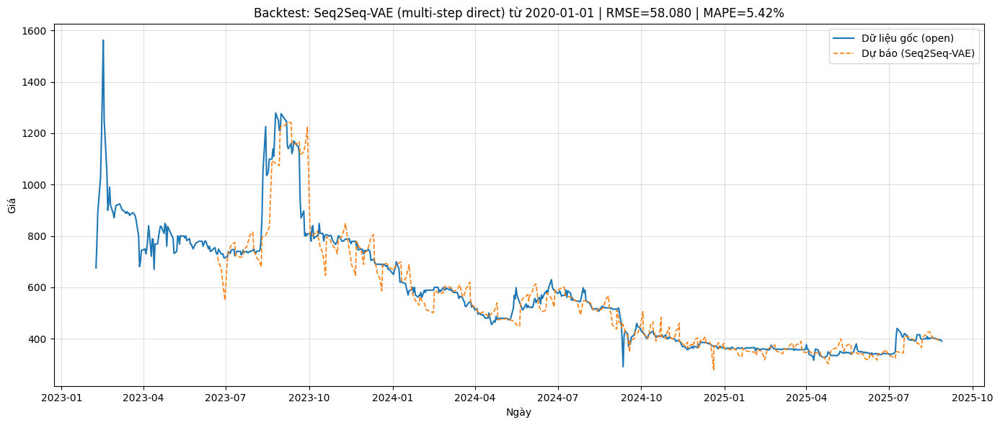

In [ ]:
start_date = pd.to_datetime("2020-01-01")

# 1) Chuẩn bị dữ liệu dùng cho backtest (đồng nhất với inference)
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use[df_use["time"] >= start_date].sort_values("time").reset_index(drop=True)

# Nếu trong training bạn dùng ret = shift(-1) -> bỏ hàng cuối để nhất quán
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

# Đảm bảo đủ độ dài
if len(df_use) < (W + H + 1):
    raise ValueError(f"Dữ liệu từ {start_date.date()} quá ít cho W={W}, H={H}. "
                     f"Cần ≥ {W+H+1}, đang có {len(df_use)}")

# 2) Làm sạch feature rồi scale bằng scaler đã lưu (KHÔNG fit lại)
X_feats = df_use[feature_cols_cfg].copy()

# xử lý volume_pct và mọi inf/NaN giống lúc train
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)

X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill()
if X_feats.isna().any().any():
    X_feats = X_feats.fillna(0.0)

# tránh tràn float32
X_feats = X_feats.clip(-1e6, 1e6)

X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# 3) Số bước dự báo (bước trượt theo H)
steps = max(0, (len(df_use) - W) // H)

pred_all = []
idx_all  = []

for i in range(steps):
    s = i * H
    e = s + W
    # (W, F)
    window = X_all_scaled[s:e]
    # dự báo H ngày tiếp theo
    rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]

    # khôi phục giá từ returns
    start_price = float(df_use[TARGET_COL].iloc[e - 1])
    prices = [start_price]
    for r in rets:
        prices.append(prices[-1] * np.exp(r))
    prices = prices[1:]  # (H,)

    # lưu kết quả và index tương ứng trong df_use
    pred_all.extend(prices)
    idx_all.extend(df_use["time"].iloc[e : e + H])

pred_all = np.asarray(pred_all, dtype=np.float32)
idx_all  = pd.to_datetime(idx_all)

# 4) Lấy giá thực tế theo đúng index đã dự báo
mask = df_use["time"].isin(idx_all)
actual_all = df_use.loc[mask, TARGET_COL].to_numpy(dtype=np.float32)

# Cắt cho an toàn nếu kích thước lệch biên
n = min(len(pred_all), len(actual_all))
pred_all   = pred_all[:n]
actual_all = actual_all[:n]
idx_all    = idx_all[:n]

# 5) Đánh giá sai số toàn bộ
mse  = float(np.mean((pred_all - actual_all) ** 2))
rmse = float(np.sqrt(mse))
mape = float(np.mean(np.abs((actual_all - pred_all) / actual_all)) * 100)
print(f"[Backtest toàn bộ từ 2020] RMSE={rmse:.3f} | MAPE={mape:.2f}%")

# 6) Vẽ kết quả
plt.figure(figsize=(14, 6))
plt.plot(df_use["time"], df_use[TARGET_COL], label=f"Dữ liệu gốc ({TARGET_COL})", linewidth=1.5)
plt.plot(idx_all, pred_all, linestyle="--", label="Dự báo (Seq2Seq-VAE)", linewidth=1.2)
plt.title(f"Backtest: Seq2Seq-VAE (multi-step direct) từ {start_date.date()} | RMSE={rmse:.3f} | MAPE={mape:.2f}%")
plt.xlabel("Ngày"); plt.ylabel("Giá"); plt.grid(True, alpha=0.4); plt.legend()
plt.tight_layout(); plt.show()


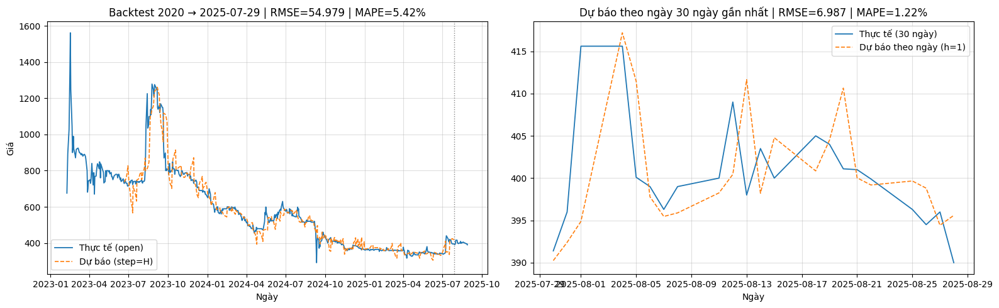

In [ ]:
# ======================
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> max-30d (multi-step, step=H)
# (2) Dự báo theo ngày trên 30 ngày gần nhất (h=1)
# ======================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# ---- 1) Thời gian & giá với kiểu thống nhất ----
times  = df_use["time"].to_numpy(dtype="datetime64[ns]")   # np.datetime64[ns]
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# ---- 2) BACKTEST: 2020 -> cutoff (multi-step, step=H) ----
# vị trí phần tử cuối cùng <= cutoff
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

# đủ dữ liệu?
if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu để backtest đến {pd.Timestamp(cutoff).date()} với W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)

bt_pred, bt_idx = [], []
for i in range(steps):
    e = W + i * H                         # dự báo cho [e, e+H-1]
    if e - 1 > cut_idx - H:               # đảm bảo không vượt cutoff
        break
    window = X_all_scaled[e - W : e]      # (W, F)
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]  # (H,)

    # khôi phục giá
    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets:
        seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]                          # (H,)

    tgt_end = min(e + H, cut_idx + 1)      # cắt đến cutoff
    take    = tgt_end - e
    if take > 0:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp theo bt_idx (dùng reindex để chắc ăn)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# đồng bộ kích thước cho chắc
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

n1 = min(len(bt_pred), len(bt_actual))
bt_rmse = float(np.sqrt(np.mean((bt_pred[:n1] - bt_actual[:n1])**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual[:n1] - bt_pred[:n1]) / bt_actual[:n1]))*100) if n1 else np.nan

# ---- 3) 30 ngày gần nhất: dự báo THEO NGÀY (h=1) ----
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không tìm thấy 30 ngày cuối để dự báo.")

first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]                 # [t-W, t-1]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0] # (H,)
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])                            # h=1
    d_pred.append(p1)

d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / last_actual))*100) if n2 else np.nan

# ---- 4) VẼ 2 BIỂU ĐỒ CẠNH NHAU ----
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# Trái: 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(f"Backtest 2020 → {pd.Timestamp(cutoff).date()} | RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}%")
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()

# Phải: 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(f"Dự báo theo ngày 30 ngày gần nhất | RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}%")
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()

plt.tight_layout(); plt.show()


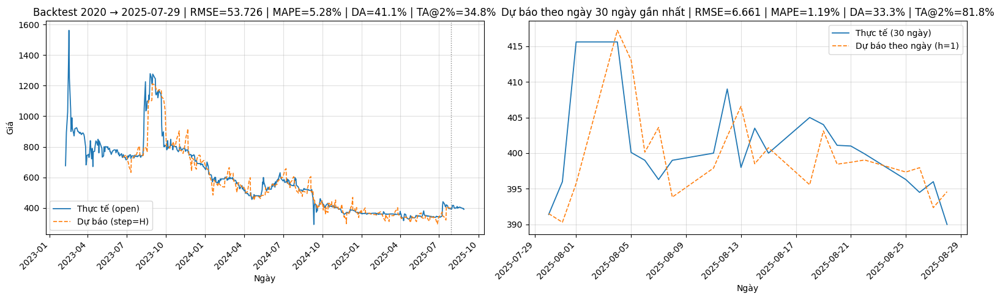

In [ ]:
# ======================
# Hai biểu đồ cạnh nhau:
# (1) Backtest 2020 -> max-30d (multi-step, step=H)
# (2) Dự báo theo ngày trên 30 ngày gần nhất (h=1)
# + Accuracy: Directional & Tolerance
# ======================

# ---- 0) Chuẩn bị df_use & scale như bạn đang làm ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()     # đồng bộ với training

# Làm sạch + scale (y hệt lúc inference)
X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6)
X_all_scaled = x_scaler.transform(X_feats.astype("float32"))

# ---- 1) Thời gian & giá với kiểu thống nhất ----
times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")

# ---- 2) BACKTEST: 2020 -> cutoff (multi-step, step=H) ----
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))

if cut_idx + 1 < W + H:
    raise ValueError(
        f"Không đủ dữ liệu để backtest đến {pd.Timestamp(cutoff).date()} với W={W}, H={H} "
        f"(cần >= {W+H}, đang có {cut_idx+1})."
    )

steps = max(0, (cut_idx + 1 - W) // H)

bt_pred, bt_idx = [], []
for i in range(steps):
    e = W + i * H
    if e - 1 > cut_idx - H:
        break
    window = X_all_scaled[e - W : e]
    rets   = vae.predict(window[None, ...], verbose=0)[0, :, 0]  # (H,)

    start_p = float(prices[e - 1])
    seq = [start_p]
    for r in rets:
        seq.append(seq[-1] * np.exp(r))
    seq = seq[1:]  # (H,)

    tgt_end = min(e + H, cut_idx + 1)
    take    = tgt_end - e
    if take > 0:
        bt_pred.extend(seq[:take])
        bt_idx.extend(times[e:tgt_end])

bt_pred = np.asarray(bt_pred, dtype=np.float32)
bt_idx  = np.asarray(bt_idx,  dtype="datetime64[ns]")

# Lấy thực tế khớp theo bt_idx (không dùng reindex để tránh duplicate)
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]

# Đồng bộ kích thước
n1 = min(len(bt_pred), len(bt_actual))
bt_pred   = bt_pred[:n1]
bt_actual = bt_actual[:n1]
bt_idx    = bt_idx[:n1]

# Metrics (RMSE, MAPE)
bt_rmse = float(np.sqrt(np.mean((bt_pred - bt_actual)**2))) if n1 else np.nan
bt_mape = float(np.mean(np.abs((bt_actual - bt_pred) / bt_actual))*100) if n1 else np.nan

# Accuracy
TAU = 0.02  # 2% ngưỡng chính xác theo sai số phần trăm
bt_pe   = np.abs((bt_actual - bt_pred) / bt_actual) if n1 else np.array([])
bt_ta   = float((bt_pe <= TAU).mean()*100) if n1 else np.nan   # Tolerance Accuracy @2%

# Directional Accuracy: so sánh hướng thay đổi
if n1 >= 2:
    bt_dir_true = np.sign(np.diff(bt_actual))
    bt_dir_pred = np.sign(np.diff(bt_pred))
    bt_da = float((bt_dir_true == bt_dir_pred).mean()*100)
else:
    bt_da = np.nan

# ---- 3) 30 ngày gần nhất: dự báo THEO NGÀY (h=1) ----
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không tìm thấy 30 ngày cuối để dự báo.")

first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

d_pred = []
for t_idx in range(first_last_idx, len(times)):
    win  = X_all_scaled[t_idx - W : t_idx]                 # [t-W, t-1]
    rets = vae.predict(win[None, ...], verbose=0)[0, :, 0] # (H,)
    p0   = float(prices[t_idx - 1])
    p1   = p0 * np.exp(rets[0])                            # h=1
    d_pred.append(p1)
d_pred = np.asarray(d_pred, dtype=np.float32)

n2 = min(len(d_pred), len(last_actual))
d_pred      = d_pred[:n2]
d_times     = last_times[:n2]
last_actual = last_actual[:n2]

# Metrics (RMSE, MAPE)
d_rmse = float(np.sqrt(np.mean((d_pred - last_actual)**2))) if n2 else np.nan
d_mape = float(np.mean(np.abs((last_actual - d_pred) / last_actual))*100) if n2 else np.nan

# Accuracy
d_pe = np.abs((last_actual - d_pred) / last_actual) if n2 else np.array([])
d_ta = float((d_pe <= TAU).mean()*100) if n2 else np.nan

if n2 >= 2:
    d_dir_true = np.sign(np.diff(last_actual))
    d_dir_pred = np.sign(np.diff(d_pred))
    d_da = float((d_dir_true == d_dir_pred).mean()*100)
else:
    d_da = np.nan

# ---- 4) VẼ 2 BIỂU ĐỒ CẠNH NHAU ----
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# Trái: 2020 -> cutoff
axes[0].plot(times.astype("datetime64[ns]"), prices, label=f"Thực tế ({TARGET_COL})", lw=1.3)
axes[0].plot(bt_idx.astype("datetime64[ns]"), bt_pred, "--", label="Dự báo (step=H)", lw=1.2)
axes[0].axvline(cutoff, color="gray", ls=":", lw=1)
axes[0].set_title(
    f"Backtest 2020 → {pd.Timestamp(cutoff).date()} | "
    f"RMSE={bt_rmse:.3f} | MAPE={bt_mape:.2f}% | "
    f"DA={bt_da:.1f}% | TA@2%={bt_ta:.1f}%"
)
axes[0].set_xlabel("Ngày"); axes[0].set_ylabel("Giá"); axes[0].grid(True, alpha=0.4); axes[0].legend()
# xoay nhãn trục X
for label in axes[0].get_xticklabels():
    label.set_rotation(45); label.set_horizontalalignment('right')

# Phải: 30 ngày gần nhất (h=1)
axes[1].plot(d_times.astype("datetime64[ns]"), last_actual, label="Thực tế (30 ngày)", lw=1.3)
axes[1].plot(d_times.astype("datetime64[ns]"), d_pred, "--", label="Dự báo theo ngày (h=1)", lw=1.2)
axes[1].set_title(
    f"Dự báo theo ngày 30 ngày gần nhất | "
    f"RMSE={d_rmse:.3f} | MAPE={d_mape:.2f}% | "
    f"DA={d_da:.1f}% | TA@2%={d_ta:.1f}%"
)
axes[1].set_xlabel("Ngày"); axes[1].grid(True, alpha=0.4); axes[1].legend()
# xoay nhãn trục X
for label in axes[1].get_xticklabels():
    label.set_rotation(45); label.set_horizontalalignment('right')

plt.tight_layout(); plt.show()


## So sánh VAE && TCN

In [ ]:
# ============================================================
# CODE 2 — VAE seq2seq (đã có) + Baseline #2: TCN (Temporal Convolutional Network)
# - cùng đặc trưng & đầu vào: (W,F) -> H bước log-return (multi-step direct)
# ============================================================
import os, json, joblib, numpy as np, pandas as pd
import tensorflow as tf
from keras import models as keras_models, layers, optimizers, callbacks
from keras import ops as K

# BEST_DIR = "/content/drive/MyDrive/kpdl/model_fpt_2"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

W = int(cfg["W"]); H = int(cfg["H"])
HIDDEN = int(cfg["HIDDEN"]); DROPOUT = float(cfg["DROPOUT"])
LR = float(cfg["LR"]); BATCH = int(cfg["BATCH"]); EPOCHS = int(cfg["EPOCHS"])
TARGET_COL = cfg["TARGET_COL"]; feature_cols_cfg = cfg["feature_cols"]
assert "df" in globals(), "Cần có biến df trong môi trường."

def make_design_matrix(df_in: pd.DataFrame, feature_cols, target_col, W, H, scaler):
    df_use = df_in.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill().fillna(0.0)
               .clip(-1e6, 1e6)
    )
    X_scaled = scaler.transform(X_feats.astype("float32")).astype("float32")
    prices = df_use[target_col].to_numpy(dtype=np.float32)

    eps = 1e-9
    logret = np.zeros_like(prices, dtype=np.float32)
    logret[1:] = np.log((prices[1:] + eps) / (np.maximum(prices[:-1], eps)))

    Xs, Ys = [], []
    for end in range(W, len(prices) - H):
        Xs.append(X_scaled[end - W:end])
        Ys.append(logret[end + 1:end + 1 + H])
    return np.asarray(Xs, np.float32), np.asarray(Ys, np.float32), df_use

X_all, y_all, df_use = make_design_matrix(df, feature_cols_cfg, TARGET_COL, W, H, x_scaler)
F = X_all.shape[-1]
print("Data:", X_all.shape, y_all.shape)

# --------- Baseline #2: TCN ----------
def ResidualBlock(x, dilation, filters, kernel_size=3, dropout=0.2):
    # causal padding cho TCN
    pad = (kernel_size - 1) * dilation
    x_in = x
    x = layers.ZeroPadding1D((pad, 0))(x)
    x = layers.Conv1D(filters, kernel_size, dilation_rate=dilation, padding="valid", activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    x = layers.ZeroPadding1D((pad, 0))(x)
    x = layers.Conv1D(filters, kernel_size, dilation_rate=dilation, padding="valid", activation="relu")(x)
    # match chiều
    if x_in.shape[-1] != filters:
        x_in = layers.Conv1D(filters, 1, padding="same")(x_in)
    out = layers.Add()([x, x_in])
    out = layers.Activation("relu")(out)
    return out

def build_tcn_baseline(W, F, H, hidden=128, dropout=0.2):
    inp = layers.Input(shape=(W, F))
    x = inp
    # 3–4 block dãn nở: 1,2,4,8
    for d in [1, 2, 4, 8]:
        x = ResidualBlock(x, dilation=d, filters=hidden, kernel_size=3, dropout=dropout)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    out = layers.Dense(H, activation="linear")(x)  # H bước log-return
    model = keras_models.Model(inp, out)
    model.compile(optimizer=optimizers.Adam(LR), loss="mse")
    return model

baseline2 = build_tcn_baseline(W, F, H, hidden=HIDDEN, dropout=DROPOUT)
baseline2.summary()

VAL_SPLIT = float(cfg.get("VAL_SPLIT", 0.2))
es = callbacks.EarlyStopping(patience=5, restore_best_weights=True, monitor="val_loss")
hist = baseline2.fit(X_all, y_all, validation_split=VAL_SPLIT,
                     epochs=EPOCHS, batch_size=BATCH, verbose=1, callbacks=[es])

baseline2_path = os.path.join(BEST_DIR, "baseline_tcn.keras")
baseline2.save(baseline2_path)

# --------- Backtest H ngày cuối ----------
X_feats = df_use[feature_cols_cfg]
X_scaled = x_scaler.transform(
    X_feats.replace([np.inf,-np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6,1e6).astype("float32")
).astype("float32")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
times  = pd.to_datetime(df_use["time"]).to_numpy("datetime64[ns]")

bt_window = X_scaled[-H - W : -H]              # (W,F)
pred_rets_b2 = baseline2.predict(bt_window[None, ...], verbose=0)[0]  # (H,)
pred_rets_vae = vae.predict(bt_window[None, ...], verbose=0)[0, :, 0] # (H,)

def roll_from_returns(start_price, rets):
    seq = [float(start_price)]
    for r in rets: seq.append(seq[-1] * np.exp(float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

start_price = prices[-H - 1]
pred_prices_b2  = roll_from_returns(start_price, pred_rets_b2)
pred_prices_vae = roll_from_returns(start_price, pred_rets_vae)
actual_idx      = times[-H:]
actual_prices   = prices[-H:]

rmse_b2 = float(np.sqrt(np.mean((pred_prices_b2 - actual_prices)**2)))
mape_b2 = float(np.mean(np.abs((actual_prices - pred_prices_b2) / actual_prices)) * 100)
rmse_v  = float(np.sqrt(np.mean((pred_prices_vae - actual_prices)**2)))
mape_v  = float(np.mean(np.abs((actual_prices - pred_prices_vae) / actual_prices)) * 100)

print(f"[Backtest H-cuối] TCN): RMSE={rmse_b2:.4f} | MAPE={mape_b2:.2f}%")
print(f"[Backtest H-cuối] VAE seq2seq    : RMSE={rmse_v :.4f} | MAPE={mape_v :.2f}%")


Data: (625, 90, 20) (625, 7)


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 90, 20)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_32   │ (None, 92, 20)    │          0 │ input_layer_8[0]… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_36 (Conv1D)  │ (None, 90, 128)   │      7,808 │ zero_padding1d_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_28          │ (None, 90, 128)   │          0 │ conv1d_36[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_33   │ (None, 92, 128)   │          0 │ dropout_28[0][0]  │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_37 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_38 (Conv1D)  │ (None, 90, 128)   │      2,688 │ input_layer_8[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_16 (Add)        │ (None, 90, 128)   │          0 │ conv1d_37[0][0],  │
│                     │                   │            │ conv1d_38[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_16       │ (None, 90, 128)   │          0 │ add_16[0][0]      │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_34   │ (None, 94, 128)   │          0 │ activation_16[0]… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_39 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_29          │ (None, 90, 128)   │          0 │ conv1d_39[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_35   │ (None, 94, 128)   │          0 │ dropout_29[0][0]  │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_40 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_17 (Add)        │ (None, 90, 128)   │          0 │ conv1d_40[0][0],  │
│                     │                   │            │ activation_16[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_17       │ (None, 90, 128)   │          0 │ add_17[0][0]      │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d_36   │ (None, 98, 128)   │          0 │ activation_17[0]… │
│ (ZeroPadding1D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_41 (Conv1D)  │ (None, 90, 128)   │     49,280 │ zero_padding1d_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_30          │ (None, 90, 128)   │          0 │ conv1d_41[0][0] 

 Total params: 372,871 (1.42 MB)

 Trainable params: 372,871 (1.42 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - loss: 114.9910 - val_loss: 0.9791
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 14.0102 - val_loss: 0.2027
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - loss: 4.0994 - val_loss: 0.2151
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 2.9498 - val_loss: 0.1126
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 1.8748 - val_loss: 0.0820
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - loss: 1.2853 - val_loss: 0.0687
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.9921 - val_loss: 0.0791
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.8536 - val_loss: 0.0814
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.6962 - val_loss: 0.0525
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - loss: 0.5212 - val_loss: 0.0324
[Backtest H-cuối] TCN): RMSE=113.7354 | MAPE=21.11%
[Backtest H-cuối] VAE seq2seq    : RMSE=3.1848 | MAPE=0.66%


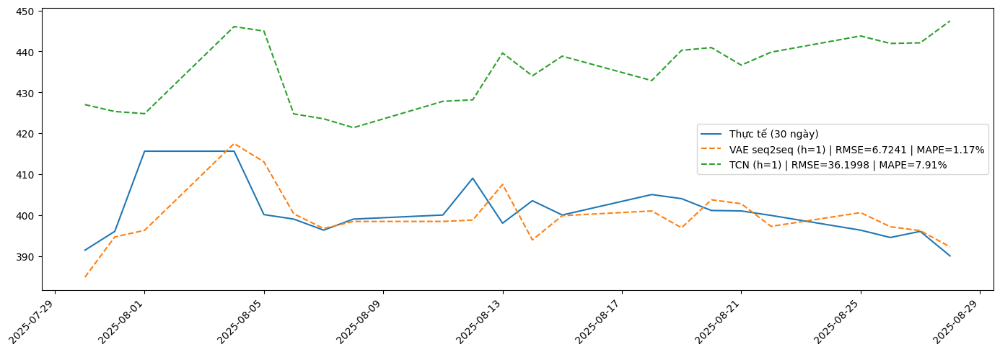

In [ ]:
# ======================================================================
# TRỰC QUAN 30 NGÀY GẦN NHẤT — VAE vs Baseline #2 (TCN)
# (dùng lại: vae, baseline2, x_scaler, cfg, df, W, H, TARGET_COL, feature_cols_cfg)
# ======================================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def pct_change_safe(a, b, eps=1e-9):
    return (a - b) / np.where(np.abs(b) < eps, np.sign(b) * eps + (b == 0)*eps, b)

# ---- Chuẩn bị dữ liệu như code 2 ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = (
    X_feats.replace([np.inf, -np.inf], np.nan)
           .ffill().bfill().fillna(0.0)
           .clip(-1e6, 1e6)
)
X_all_scaled = x_scaler.transform(X_feats.astype("float32")).astype("float32")

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- Mốc 30 ngày gần nhất ----
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")
last_30_mask = times > cutoff
if not last_30_mask.any():
    raise ValueError("Không có 30 ngày cuối để trực quan.")
first_last_idx = int(np.where(last_30_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó để dự báo theo ngày.")

last_times  = times[last_30_mask]
last_actual = prices[last_30_mask]

# ---- One-step (h=1) cho VAE & Baseline #2 (TCN) ----
def one_step_from_model(model_kind, win_scaled, prev_price):
    """
    model_kind: 'vae' hoặc 'tcn'
    - VAE: predict (H,1) -> lấy bước đầu rets[0]
    - TCN : predict (H,)  -> lấy bước đầu rets[0]
    """
    if model_kind == "vae":
        rets = vae.predict(win_scaled[None, ...], verbose=0)[0, :, 0]  # (H,)
        r1 = float(rets[0])
    elif model_kind == "tcn":
        rets = baseline2.predict(win_scaled[None, ...], verbose=0)[0]   # (H,)
        r1 = float(rets[0])
    else:
        raise ValueError("model_kind không hợp lệ.")
    # Khôi phục giá từ log-return: p1 = p0 * exp(r1)
    return prev_price * np.exp(r1)

pred_vae, pred_tcn = [], []
for t_idx in range(first_last_idx, len(times)):
    win = X_all_scaled[t_idx - W : t_idx]      # (W,F)
    p0  = float(prices[t_idx - 1])
    pred_vae.append(one_step_from_model("vae", win, p0))
    pred_tcn.append(one_step_from_model("tcn", win, p0))

pred_vae = np.asarray(pred_vae, dtype=np.float32)
pred_tcn = np.asarray(pred_tcn, dtype=np.float32)

n = min(len(pred_vae), len(pred_tcn), len(last_actual))
pred_vae, pred_tcn, d_times, last_actual = pred_vae[:n], pred_tcn[:n], last_times[:n], last_actual[:n]

# ---- Tính RMSE / MAPE để hiển thị ----
rmse_v  = float(np.sqrt(np.mean((pred_vae - last_actual)**2)))
mape_v  = float(np.mean(np.abs(pct_change_safe(last_actual, pred_vae))) * 100)
rmse_t  = float(np.sqrt(np.mean((pred_tcn - last_actual)**2)))
mape_t  = float(np.mean(np.abs(pct_change_safe(last_actual, pred_tcn))) * 100)

# ---- Vẽ ----
plt.figure(figsize=(14,5))
plt.plot(d_times, last_actual, label="Thực tế (30 ngày)")
plt.plot(d_times, pred_vae, "--", label=f"VAE seq2seq (h=1) | RMSE={rmse_v:.4f} | MAPE={mape_v:.2f}%")
plt.plot(d_times, pred_tcn, "--", label=f"TCN (h=1) | RMSE={rmse_t:.4f} | MAPE={mape_t:.2f}%")
plt.xticks(rotation=45, ha="right")
plt.legend()
plt.tight_layout()
plt.show()

## Đánh giá VAE && TCN

In [ ]:
# ============================================================
# EVAL for CODE 2 — VAE vs Baseline#2 (TCN)
# Tạo 2 bảng chỉ số: Backtest & 30 ngày gần nhất (h=1)
# ============================================================
import numpy as np, pandas as pd

K_LIST = [1, 20, 30]
TAU, EPS = 0.02, 1e-9

def pct_change_safe(a, b):
    return (a - b) / np.where(np.abs(b) < EPS, np.sign(b) * EPS + (b == 0)*EPS, b)

def directional_accuracy_k(y_true, y_pred, k: int) -> float:
    if len(y_true) <= k or len(y_pred) <= k: return np.nan
    t_dir = np.sign(y_true[k:] - y_true[:-k])
    p_dir = np.sign(y_pred[k:] - y_pred[:-k])
    m = min(len(t_dir), len(p_dir))
    return float((t_dir[:m] == p_dir[:m]).mean() * 100)

def slope_sign(arr):
    t = np.arange(len(arr)); a, _ = np.polyfit(t, arr, 1)
    return np.sign(a)

def slope_da_k(y_true, y_pred, k: int) -> float:
    m = min(len(y_true), len(y_pred)) - k + 1
    if m <= 0: return np.nan
    ok = sum(slope_sign(y_true[i:i+k]) == slope_sign(y_pred[i:i+k]) for i in range(m))
    return float(ok / m * 100)

def ta_daily_with_tol(actual, pred, tol=0.02):
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    r_true = pct_change_safe(actual[1:], actual[:-1])
    r_pred = pct_change_safe(pred[1:],   pred[:-1])
    lab_t  = np.where(r_true > 0, 1, np.where(r_true < 0, -1, 0))
    lab_p  = np.where(r_pred > 0, 1, np.where(r_pred < 0, -1, 0))
    pct_err = np.abs(pct_change_safe(actual[1:], pred[1:]))
    ok = (lab_t == lab_p) | (pct_err <= tol)
    return float(ok.mean() * 100)

def ta_k_return(actual, pred, k: int, tau: float = 0.02):
    if len(actual) <= k or len(pred) <= k: return np.nan
    rt = (actual[k:] / np.where(np.abs(actual[:-k]) < EPS, EPS, actual[:-k])) - 1.0
    rp = (pred[k:]   / np.where(np.abs(pred[:-k])   < EPS, EPS, pred[:-k]))   - 1.0
    m  = min(len(rt), len(rp))
    denom = np.where(np.abs(rt[:m]) < EPS, 1.0, np.abs(rt[:m]))
    pe = np.abs((rt[:m] - rp[:m]) / denom)
    return float((pe <= tau).mean() * 100)

def mae(a, b): return float(np.mean(np.abs(a - b)))
def rmse(a, b): return float(np.sqrt(np.mean((a - b) ** 2)))
def mape(a, b): return float(np.mean(np.abs(pct_change_safe(a, b))) * 100)

# ---- Chuẩn bị dữ liệu ----
df_use = df.copy()
df_use["time"] = pd.to_datetime(df_use["time"])
df_use = df_use.sort_values("time").reset_index(drop=True)
if "ret" in df_use.columns:
    df_use = df_use.iloc[:-1].copy()

X_feats = df_use[feature_cols_cfg].copy()
if "volume_pct" in X_feats.columns:
    X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
X_feats = (X_feats.replace([np.inf, -np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6, 1e6))
X_all_scaled = x_scaler.transform(X_feats.astype("float32")).astype("float32")

times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)

# ---- 1) Backtest (multi-step direct, step=H) ----
max_date = times.max()
cutoff = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")
cut_idx = int(pd.Index(times).searchsorted(cutoff, side="right") - 1)
cut_idx = int(np.clip(cut_idx, 0, len(times) - 1))
if cut_idx + 1 < W + H:
    raise ValueError("Không đủ dữ liệu cho backtest.")

def roll_price_from_rets(p0, rets):
    seq = [float(p0)]
    for r in rets: seq.append(seq[-1] * np.exp(float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

bt_idx, bt_pred_vae, bt_pred_tcn = [], [], []
for i in range(max(0, (cut_idx + 1 - W) // H)):
    e = W + i * H
    if e - 1 > cut_idx - H: break
    win = X_all_scaled[e - W:e]
    # VAE
    r_vae = vae.predict(win[None, ...], verbose=0)[0, :, 0]
    p_vae = roll_price_from_rets(prices[e - 1], r_vae)
    # TCN
    r_tcn = baseline2.predict(win[None, ...], verbose=0)[0]
    p_tcn = roll_price_from_rets(prices[e - 1], r_tcn)
    tgt_end = min(e + H, cut_idx + 1); take = max(0, tgt_end - e)
    if take:
        bt_pred_vae.extend(p_vae[:take]); bt_pred_tcn.extend(p_tcn[:take])
        bt_idx.extend(times[e:tgt_end])

bt_idx = np.asarray(bt_idx, dtype="datetime64[ns]")
mask = np.isin(times, bt_idx)
bt_actual = prices[mask]
n = min(len(bt_idx), len(bt_actual), len(bt_pred_vae), len(bt_pred_tcn))
bt_idx, bt_actual = bt_idx[:n], bt_actual[:n]
bt_pred_vae, bt_pred_tcn = np.asarray(bt_pred_vae[:n]), np.asarray(bt_pred_tcn[:n])

def build_metric_row(actual, pred):
    return {
        "RMSE": rmse(actual, pred),
        "MAPE": mape(actual, pred),
        "MAE":  mae(actual, pred),
        "DA@1": directional_accuracy_k(actual, pred, 1),
        "DA@20": directional_accuracy_k(actual, pred, 20),
        "Slope-DA@20": slope_da_k(actual, pred, 20),
        "TA(daily@2%)": ta_daily_with_tol(actual, pred, tol=TAU)
    }

tbl_backtest = pd.DataFrame({
    "VAE seq2seq": build_metric_row(bt_actual, bt_pred_vae),
    "TCN": build_metric_row(bt_actual, bt_pred_tcn),
}).round(4)

print("\n=== BẢNG CHỈ SỐ — BACKTEST ===")
print(tbl_backtest)

# ---- 2) 30 ngày gần nhất — one-step (h=1) ----
last_mask = times > cutoff
first_last_idx = int(np.where(last_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó.")

last_times  = times[last_mask]
last_actual = prices[last_mask]

pred_vae_1d, pred_tcn_1d = [], []
for t_idx in range(first_last_idx, len(times)):
    win = X_all_scaled[t_idx - W : t_idx]
    p0  = float(prices[t_idx - 1])
    # VAE
    r = vae.predict(win[None, ...], verbose=0)[0, :, 0][0]
    pred_vae_1d.append(p0 * np.exp(float(r)))
    # TCN
    r = baseline2.predict(win[None, ...], verbose=0)[0][0]
    pred_tcn_1d.append(p0 * np.exp(float(r)))

pred_vae_1d = np.asarray(pred_vae_1d, dtype=np.float32)
pred_tcn_1d = np.asarray(pred_tcn_1d, dtype=np.float32)
n2 = min(len(pred_vae_1d), len(pred_tcn_1d), len(last_actual))
last_actual = last_actual[:n2]; pred_vae_1d = pred_vae_1d[:n2]; pred_tcn_1d = pred_tcn_1d[:n2]

tbl_last30 = pd.DataFrame({
    "VAE seq2seq": build_metric_row(last_actual, pred_vae_1d),
    "TCN": build_metric_row(last_actual, pred_tcn_1d),
}).round(4)

print("\n=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===")
tbl_last30



=== BẢNG CHỈ SỐ — BACKTEST ===
              VAE seq2seq        TCN
RMSE              57.7730  1211.8018
MAPE               5.8952    36.2043
MAE               32.6101   314.8813
DA@1              36.3487    38.9803
DA@20             72.4958    49.0662
Slope-DA@20       72.8814    52.0339
TA(daily@2%)      57.7303    41.7763

=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===


,VAE seq2seq,TCN
RMSE,6.9166,36.1998
MAPE,1.1735,7.9107
MAE,4.7066,34.5695
DA@1,47.6190,38.0952
DA@20,50.0000,50.0000
Slope-DA@20,100.0000,0.0000
TA(daily@2%),95.2381,38.0952


## So sánh VAE && MLP

Data shapes: (625, 90, 20) (625, 7)


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 90, 20)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 1800)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 128)            │       230,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 247,943 (968.53 KB)

 Trainable params: 247,943 (968.53 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 182.7984 - val_loss: 2.0454
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 30.6063 - val_loss: 0.2515
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 8.3425 - val_loss: 0.0194
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2.3567 - val_loss: 0.0027
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.6881 - val_loss: 8.9634e-04
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2387 - val_loss: 7.1148e-04
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1025 - val_loss: 7.0462e-04
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0346 - val_loss: 7.0849e-04
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0151 - val_loss: 7.1107e-04
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0115 - val_loss: 7.1265e-04


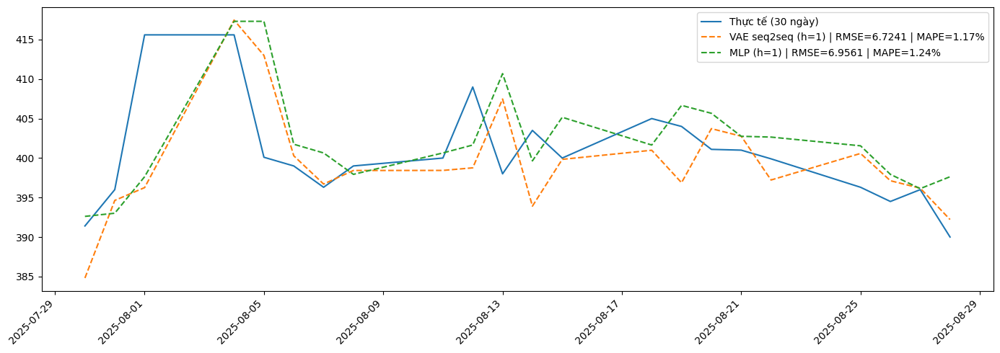


=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===
              VAE seq2seq      MLP
RMSE               6.7241   6.9561
MAPE               1.1701   1.2427
MAE                4.6766   5.0228
DA@1              66.6667  52.3810
DA@20            100.0000  50.0000
Slope-DA@20       66.6667  66.6667
TA(daily@2%)      90.4762  90.4762


In [ ]:
# ============================================================
# BASELINE #3 — MLP (Flatten W×F -> Dense -> Dense(H))
# So sánh với VAE seq2seq bằng cùng đặc trưng & tham số
# ============================================================
import os, json, joblib, numpy as np, pandas as pd
import tensorflow as tf
from keras import models as keras_models, layers, callbacks, optimizers
from keras import ops as K

# ---------- 0) LOAD VAE + SCALER + CFG ----------
# BEST_DIR = "/content/drive/MyDrive/kpdl/model_fpt_2/"
best_model_path = os.path.join(BEST_DIR, "best_vae.keras")
best_scaler_path = os.path.join(BEST_DIR, "x_scaler.pkl")
best_cfg_path = os.path.join(BEST_DIR, "config.json")

# Custom objects của bạn (đã định nghĩa ở nơi khác)
custom_objs = {"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}
vae = keras_models.load_model(best_model_path, custom_objects=custom_objs)
x_scaler = joblib.load(best_scaler_path)
cfg = json.load(open(best_cfg_path))

W = int(cfg["W"]); H = int(cfg["H"])
HIDDEN = int(cfg["HIDDEN"]); DROPOUT = float(cfg["DROPOUT"])
LR = float(cfg["LR"]); BATCH = int(cfg["BATCH"]); EPOCHS = int(cfg["EPOCHS"])
VAL_SPLIT = float(cfg.get("VAL_SPLIT", 0.2))
TARGET_COL = cfg["TARGET_COL"]; feature_cols_cfg = cfg["feature_cols"]

assert "df" in globals(), "Cần có biến df trong môi trường."

# ---------- 1) DATA PIPELINE (y như bạn đang dùng) ----------
EPS = 1e-9

def make_design_matrix(df_in, feature_cols, target_col, W, H, scaler):
    df_use = df_in.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill().fillna(0.0)
               .clip(-1e6, 1e6)
    )
    X_scaled = scaler.transform(X_feats.astype("float32")).astype("float32")
    prices = df_use[target_col].to_numpy(dtype=np.float32)

    # LOG-RETURN (đổi thành simple return nếu bạn huấn luyện theo simple)
    logret = np.zeros_like(prices, dtype=np.float32)
    logret[1:] = np.log((prices[1:] + EPS) / (np.maximum(prices[:-1], EPS)))

    Xs, Ys = [], []
    for end in range(W, len(prices) - H):
        Xs.append(X_scaled[end - W:end])                       # (W,F)
        Ys.append(logret[end + 1:end + 1 + H])                # (H,)
    return np.asarray(Xs, np.float32), np.asarray(Ys, np.float32), df_use

X_all, y_all, df_use = make_design_matrix(df, feature_cols_cfg, TARGET_COL, W, H, x_scaler)
F = X_all.shape[-1]
print("Data shapes:", X_all.shape, y_all.shape)

# ---------- 2) BASELINE #3: MLP (Flatten -> Dense -> Dense(H)) ----------
def build_mlp_baseline(W, F, H, hidden=128, dropout=0.2):
    inp = layers.Input(shape=(W, F))
    x = layers.Flatten()(inp)                       # (W*F,)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    x = layers.Dense(hidden, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    out = layers.Dense(H, activation="linear")(x)   # H bước log-return
    model = keras_models.Model(inp, out)
    model.compile(optimizer=optimizers.Adam(LR), loss="mse")
    return model

baseline3 = build_mlp_baseline(W, F, H, hidden=HIDDEN, dropout=DROPOUT)
baseline3.summary()

# Train + early stopping
es = callbacks.EarlyStopping(patience=5, restore_best_weights=True, monitor="val_loss")
hist = baseline3.fit(
    X_all, y_all,
    validation_split=VAL_SPLIT,
    epochs=EPOCHS, batch_size=BATCH, verbose=1, callbacks=[es]
)

# Save
baseline3_path = os.path.join(BEST_DIR, "baseline_mlp.keras")
baseline3.save(baseline3_path)

# ---------- 3) BACKTEST H ngày cuối ----------
def roll_from_returns(p0, rets, use_log=True):
    seq = [float(p0)]
    for r in rets:
        if use_log:
            seq.append(seq[-1] * np.exp(float(r)))   # đổi thành *(1+r) nếu simple return
        else:
            seq.append(seq[-1] * (1.0 + float(r)))
    return np.asarray(seq[1:], dtype=np.float32)

X_feats = df_use[feature_cols_cfg]
X_scaled_full = x_scaler.transform(
    X_feats.replace([np.inf,-np.inf], np.nan).ffill().bfill().fillna(0.0).clip(-1e6,1e6).astype("float32")
).astype("float32")
prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
times  = pd.to_datetime(df_use["time"]).to_numpy("datetime64[ns]")

bt_window = X_scaled_full[-H - W : -H]  # (W,F)
pred_rets_vae = vae.predict(bt_window[None, ...], verbose=0)[0, :, 0]   # (H,)
pred_rets_mlp = baseline3.predict(bt_window[None, ...], verbose=0)[0]   # (H,)

start_price = prices[-H - 1]
pred_prices_vae = roll_from_returns(start_price, pred_rets_vae, use_log=True)
pred_prices_mlp = roll_from_returns(start_price, pred_rets_mlp, use_log=True)
actual_idx      = times[-H:]
actual_prices   = prices[-H:]

# ---------- 4) TRỰC QUAN 30 NGÀY GẦN NHẤT (h=1) ----------
import matplotlib.pyplot as plt

def one_step_price(model_kind, win_scaled, prev_price):
    if model_kind == "vae":
        r1 = float(vae.predict(win_scaled[None, ...], verbose=0)[0, 0, 0])
    elif model_kind == "mlp":
        r1 = float(baseline3.predict(win_scaled[None, ...], verbose=0)[0][0])
    else:
        raise ValueError("model_kind?")
    return prev_price * np.exp(r1)  # đổi thành *(1+r1) nếu simple return

# Chuẩn bị 30 ngày cuối
max_date = times.max()
cutoff   = np.datetime64(pd.to_datetime(max_date) - pd.Timedelta(days=30), "ns")
last_mask = times > cutoff
if not last_mask.any():
    raise ValueError("Không có 30 ngày cuối để trực quan.")
first_last_idx = int(np.where(last_mask)[0][0])
if first_last_idx < W:
    raise ValueError("30 ngày cuối không đủ W ngày trước đó.")

last_times  = times[last_mask]
last_actual = prices[last_mask]

pred_vae_1d, pred_mlp_1d = [], []
for t_idx in range(first_last_idx, len(times)):
    win = X_scaled_full[t_idx - W : t_idx]
    p0  = float(prices[t_idx - 1])
    pred_vae_1d.append(one_step_price("vae", win, p0))
    pred_mlp_1d.append(one_step_price("mlp", win, p0))

pred_vae_1d = np.asarray(pred_vae_1d, dtype=np.float32)
pred_mlp_1d = np.asarray(pred_mlp_1d, dtype=np.float32)
n = min(len(pred_vae_1d), len(pred_mlp_1d), len(last_actual))
pred_vae_1d, pred_mlp_1d, d_times, last_actual = pred_vae_1d[:n], pred_mlp_1d[:n], last_times[:n], last_actual[:n]

def pct_change_safe(a, b, eps=1e-9): return (a - b) / np.where(np.abs(b) < eps, np.sign(b) * eps + (b == 0)*eps, b)
def RMSE(a,b): return float(np.sqrt(np.mean((a-b)**2)))
def MAPE(a,b): return float(np.mean(np.abs(pct_change_safe(a,b))) * 100)
def MAE(a,b):  return float(np.mean(np.abs(a-b)))

rmse_v = RMSE(pred_vae_1d, last_actual);  mape_v = MAPE(last_actual, pred_vae_1d);  mae_v = MAE(pred_vae_1d, last_actual)
rmse_m = RMSE(pred_mlp_1d, last_actual);  mape_m = MAPE(last_actual, pred_mlp_1d);  mae_m = MAE(pred_mlp_1d, last_actual)

plt.figure(figsize=(14,5))
plt.plot(d_times, last_actual, label="Thực tế (30 ngày)")
plt.plot(d_times, pred_vae_1d, "--", label=f"VAE seq2seq (h=1) | RMSE={rmse_v:.4f} | MAPE={mape_v:.2f}%")
plt.plot(d_times, pred_mlp_1d, "--", label=f"MLP (h=1) | RMSE={rmse_m:.4f} | MAPE={mape_m:.2f}%")
plt.xticks(rotation=45, ha="right"); plt.legend(); plt.tight_layout(); plt.show()

# ---------- 5) BẢNG ĐÁNH GIÁ (Backtest & 30 ngày) ----------
def directional_accuracy_k(y_true, y_pred, k:int)->float:
    if len(y_true) <= k or len(y_pred) <= k: return np.nan
    t_dir = np.sign(y_true[k:] - y_true[:-k])
    p_dir = np.sign(y_pred[k:] - y_pred[:-k])
    m = min(len(t_dir), len(p_dir))
    return float((t_dir[:m] == p_dir[:m]).mean() * 100)

def slope_sign(arr):
    t = np.arange(len(arr))
    a, _ = np.polyfit(t, arr, 1)
    return np.sign(a)

def slope_da_k(y_true, y_pred, k:int)->float:
    m = min(len(y_true), len(y_pred)) - k + 1
    if m <= 0: return np.nan
    ok = sum(slope_sign(y_true[i:i+k]) == slope_sign(y_pred[i:i+k]) for i in range(m))
    return float(ok / m * 100)

def ta_daily_with_tol(actual, pred, tol=0.02):
    n = min(len(actual), len(pred))
    if n <= 1: return np.nan
    r_true = pct_change_safe(actual[1:], actual[:-1])
    r_pred = pct_change_safe(pred[1:],   pred[:-1])
    lab_t  = np.where(r_true > 0, 1, np.where(r_true < 0, -1, 0))
    lab_p  = np.where(r_pred > 0, 1, np.where(r_pred < 0, -1, 0))
    pct_err = np.abs(pct_change_safe(actual[1:], pred[1:]))
    ok = (lab_t == lab_p) | (pct_err <= 0.02)
    return float(ok.mean() * 100)

def ta_k_return(actual, pred, k:int, tau:float=0.02):
    if len(actual) <= k or len(pred) <= k: return np.nan
    rt = (actual[k:] / np.where(np.abs(actual[:-k]) < EPS, EPS, actual[:-k])) - 1.0
    rp = (pred[k:]   / np.where(np.abs(pred[:-k])   < EPS, EPS, pred[:-k]))   - 1.0
    m  = min(len(rt), len(rp))
    denom = np.where(np.abs(rt[:m]) < EPS, 1.0, np.abs(rt[:m]))
    pe = np.abs((rt[:m] - rp[:m]) / denom)
    return float((pe <= tau).mean() * 100)

def build_metric_row(actual, pred):
    return {
        "RMSE": RMSE(actual, pred),
        "MAPE": MAPE(actual, pred),
        "MAE":  MAE(actual, pred),
        "DA@1": directional_accuracy_k(actual, pred, 1),
        "DA@20": directional_accuracy_k(actual, pred, 20),
        "Slope-DA@20": slope_da_k(actual, pred, 20),
        "TA(daily@2%)": ta_daily_with_tol(actual, pred, tol=0.02)
    }

# --- Backtest (đang có pred_prices_vae / pred_prices_mlp / actual_prices) ---
# tbl_backtest = pd.DataFrame({
#     "VAE seq2seq": build_metric_row(actual_prices, pred_prices_vae),
#     "Baseline#3 MLP": build_metric_row(actual_prices, pred_prices_mlp),
# }).round(4)
# print("\n=== BẢNG CHỈ SỐ — BACKTEST ===")
# print(tbl_backtest)

# --- 30 ngày gần nhất (h=1) ---
tbl_last30 = pd.DataFrame({
    "VAE seq2seq": build_metric_row(last_actual, pred_vae_1d),
    "MLP": build_metric_row(last_actual, pred_mlp_1d),
}).round(4)
print("\n=== BẢNG CHỈ SỐ — 30 NGÀY GẦN NHẤT (h=1) ===")
print(tbl_last30)


# Đánh giá mức xu hướng cho 20,30,60 ngày


=== Đánh giá trung hạn 20 ngày ===


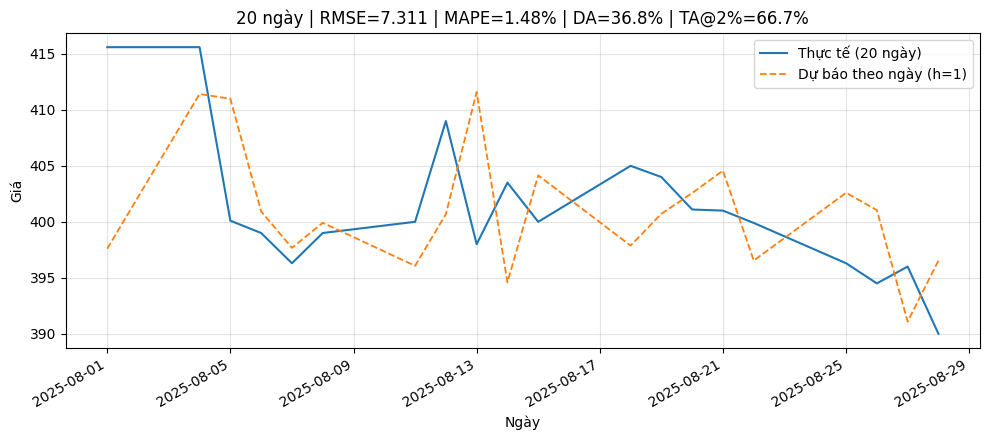


=== Đánh giá trung hạn 30 ngày ===


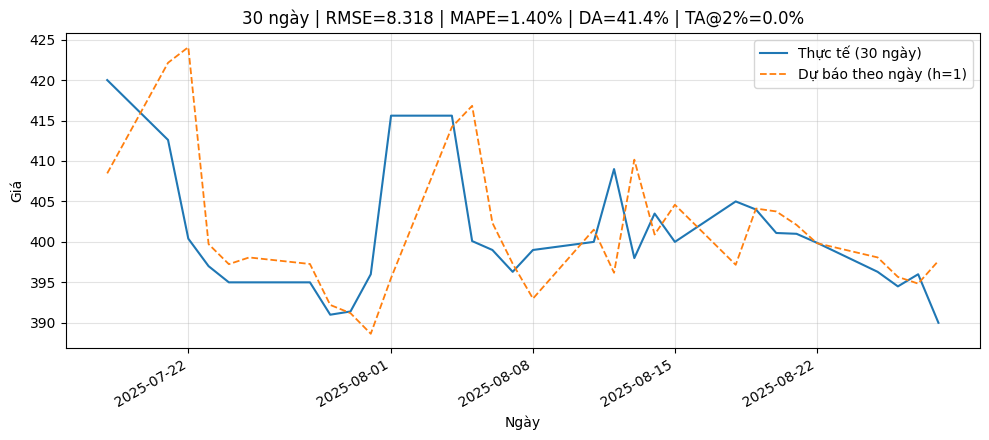


=== Đánh giá trung hạn 60 ngày ===


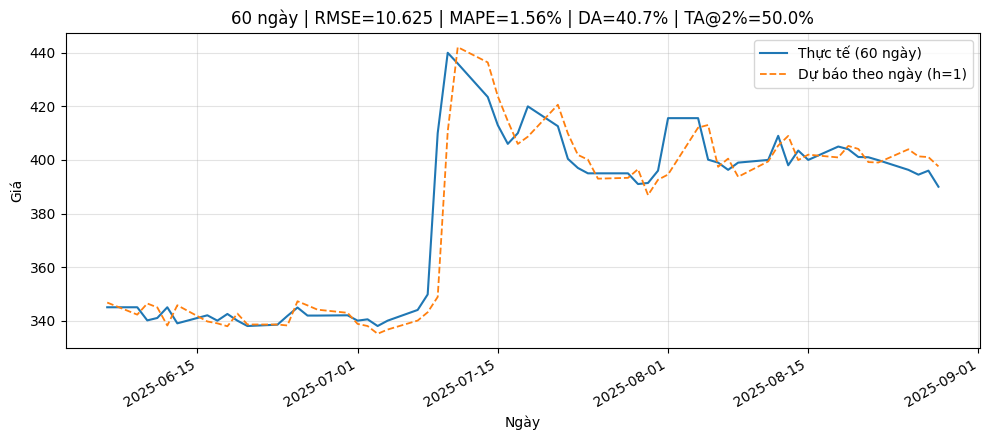


Tóm tắt trung hạn:
    N       rmse      mape         DA      TA@2%       start         end
0  20   7.311409  1.481086  36.842105  66.666667  2025-08-01  2025-08-28
1  30   8.318055  1.400604  41.379310   0.000000  2025-07-18  2025-08-28
2  60  10.625225  1.560195  40.677966  50.000000  2025-06-06  2025-08-28


In [ ]:
# ============================================
# DỰ BÁO TRUNG HẠN THEO NGÀY CHO 20/30/60 NGÀY (h=1)
# - Reuse model đã nạp: vae, x_scaler, cfg
# - Tính các chỉ số RMSE, MAPE, DA, TA@2%
# - Vẽ 1 figure riêng cho mỗi khung ngày
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# ---------- 1) Chuẩn hoá dữ liệu đầu vào (y hệt lúc inference bạn đang dùng) ----------
def prepare_df_for_inference(df_raw, feature_cols):
    df_use = df_raw.copy()
    df_use["time"] = pd.to_datetime(df_use["time"])
    df_use = df_use.sort_values("time").reset_index(drop=True)
    # đồng bộ với lúc train (ret = shift(-1) → bỏ 1 hàng cuối)
    if "ret" in df_use.columns:
        df_use = df_use.iloc[:-1].copy()

    X_feats = df_use[feature_cols].copy()
    if "volume_pct" in X_feats.columns:
        X_feats["volume_pct"] = X_feats["volume_pct"].replace([np.inf, -np.inf], np.nan)
    X_feats = (
        X_feats.replace([np.inf, -np.inf], np.nan)
               .ffill().bfill()
               .fillna(0.0)
               .clip(-1e6, 1e6)
               .astype("float32")
    )
    X_scaled = x_scaler.transform(X_feats)

    times  = df_use["time"].to_numpy(dtype="datetime64[ns]")
    prices = df_use[TARGET_COL].to_numpy(dtype=np.float32)
    return df_use, X_scaled, times, prices

# ---------- 2) Dự báo theo NGÀY (h=1) cho N ngày gần nhất ----------
def predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model):
    """
    Trả về (d_times, d_pred, d_actual):
      - d_times: mốc thời gian của N ngày gần nhất
      - d_pred:  dự báo giá theo ngày (chiết xuất rets[0])
      - d_actual: giá thực tế tương ứng
    """
    if len(times) < W + N:
        raise ValueError(f"Dữ liệu quá ngắn cho N={N} (cần >= {W+N}, đang có {len(times)}).")

    # index ngày đầu của đoạn N ngày cuối
    start_idx = len(times) - N
    # phải có đủ W ngày trước đó để suy luận theo ngày
    if start_idx < W:
        raise ValueError(f"N={N}: không đủ W={W} phiên trước đó để dự báo theo ngày.")

    preds = []
    for t_idx in range(start_idx, len(times)):
        win  = X_scaled[t_idx - W : t_idx]                      # [t-W, t-1]
        rets = model.predict(win[None, ...], verbose=0)[0, :, 0]  # (H,)
        # chỉ lấy bước 1 ngày
        p0 = float(prices[t_idx - 1])
        p1 = p0 * np.exp(rets[0])
        preds.append(p1)

    d_times   = times[start_idx:]                # N mốc thời gian
    d_actual  = prices[start_idx:]               # N giá thực tế
    d_pred    = np.asarray(preds, dtype=np.float32)
    # đồng bộ an toàn
    n = min(len(d_pred), len(d_actual))
    return d_times[:n], d_pred[:n], d_actual[:n]

# ---------- 3) Thước đo đánh giá xu hướng ----------
def direction_accuracy(actual, pred):
    """
    Tỷ lệ đúng chiều:
    so sánh sign(actual[t] - actual[t-1]) với sign(pred[t] - actual[t-1]) cho t=1..n-1
    """
    n = len(actual)
    if n < 2:
        return np.nan
    # chênh lệch thật và chênh lệch 'dự báo so với mốc hôm trước'
    actual_diff = actual[1:] - actual[:-1]           # (n-1,)
    pred_diff   = pred[1:]   - actual[:-1]           # (n-1,)
    s_true = np.sign(actual_diff)
    s_pred = np.sign(pred_diff)
    return float(np.mean(s_true == s_pred) * 100.0)


def trend_accuracy_with_band(actual, pred, band=0.02):
    """Tỷ lệ đúng xu hướng khi bỏ qua dao động nhỏ ±band (mặc định ±2%)."""
    if len(actual) < 2: return np.nan
    actual_ret = (actual[1:] - actual[:-1]) / actual[:-1]  # r_t
    pred_ret   = (pred[1:]   - actual[:-1]) / actual[:-1]  # \hat{r}_t vs base actual_{t-1}
    mask = np.abs(actual_ret) > band
    if mask.sum() == 0:  # không có biến động đủ lớn
        return np.nan
    s_true = np.sign(actual_ret[mask])
    s_pred = np.sign(pred_ret[mask])
    return float(np.mean(s_true == s_pred) * 100.0)

def regression_metrics(actual, pred):
    mse  = float(np.mean((pred - actual) ** 2))
    rmse = float(np.sqrt(mse))
    mape = float(np.mean(np.abs((actual - pred) / (actual + 1e-8))) * 100.0)
    return rmse, mape

# ---------- 4) Hàm chạy cho một N & vẽ ----------
def evaluate_and_plot_N(N, df_raw, feature_cols, W, H, model, save_path=None):
    df_use, X_scaled, times, prices = prepare_df_for_inference(df_raw, feature_cols)
    d_times, d_pred, d_actual = predict_last_N_days_daily(N, X_scaled, times, prices, W, H, model)

    # metrics
    rmse, mape = regression_metrics(d_actual, d_pred)
    da   = direction_accuracy(d_actual, d_pred)
    ta2  = trend_accuracy_with_band(d_actual, d_pred, band=0.02)

    # plot (1 hình riêng cho N)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    ax.plot(d_times, d_actual, label=f"Thực tế ({N} ngày)", lw=1.5)
    ax.plot(d_times, d_pred,   "--", label="Dự báo theo ngày (h=1)", lw=1.3)
    ax.set_title(f"{N} ngày | RMSE={rmse:.3f} | MAPE={mape:.2f}% | DA={da:.1f}% | TA@2%={ta2:.1f}%")
    ax.set_xlabel("Ngày"); ax.set_ylabel("Giá")
    for label in ax.get_xticklabels(): label.set_rotation(30); label.set_ha("right")
    ax.grid(True, alpha=0.35); ax.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=160)
    plt.show()

    # trả về để log/báo cáo
    return {
        "N": N, "rmse": rmse, "mape": mape,
        "DA": da, "TA@2%": ta2,
        "start": pd.Timestamp(d_times[0]).date(),
        "end":   pd.Timestamp(d_times[-1]).date(),
    }

# ---------- 5) Gọi cho 3 khung 20/30/60 ----------
horizons = [20, 30, 60]
results = []
for N in horizons:
    print(f"\n=== Đánh giá trung hạn {N} ngày ===")
    res = evaluate_and_plot_N(
        N=N,
        df_raw=df,                         # dùng df hiện tại
        feature_cols=feature_cols_cfg,
        W=W, H=H,
        model=vae,
        save_path=f"./medium_term_{N}d.png"  # nếu không muốn lưu file thì set None
    )
    results.append(res)

# Bảng tổng hợp
summary_df = pd.DataFrame(results)
print("\nTóm tắt trung hạn:")
print(summary_df)


# Turning mô hình

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15708 entries, 19 to 15746
Data columns (total 27 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   time         15708 non-null  datetime64[ns]
 1   open         15708 non-null  float64       
 2   high         15708 non-null  float64       
 3   low          15708 non-null  float64       
 4   close        15708 non-null  float64       
 5   volume       15708 non-null  float64       
 6   symbol       15708 non-null  object        
 7   p_neg        15708 non-null  float64       
 8   p_neu        15708 non-null  float64       
 9   p_pos        15708 non-null  float64       
 10  has_news     15708 non-null  int64         
 11  ma_5         15708 non-null  float64       
 12  ema_5        15708 non-null  float64       
 13  ma_10        15708 non-null  float64       
 14  ema_10       15708 non-null  float64       
 15  ma_20        15708 non-null  float64       
 16  ema_20  

# Xử lý trước khi tìm model tốt nhất

In [ ]:
# ========= A) PREPROCESS =========
import numpy as np, pandas as pd

def preprocess_multisymbol_df(df_raw: pd.DataFrame,
                              use_symbol_onehot: bool = True,
                              clip_abs: float = 1e12):
    """
    - Tính chỉ báo theo từng symbol
    - ret = log-return (log(close_{t+1}/close_t))  -> phù hợp exp(r)
    - Làm sạch NaN/±inf (ffill/bfill trong từng symbol), kẹp biên, ép float32
    - (tuỳ chọn) thêm one-hot symbol để mô hình phân biệt mã
    Trả về:
      df: DataFrame đã clean, sort theo (symbol,time)
      feature_cols: danh sách cột đặc trưng (KHÔNG gồm 'ret')
      symbol_onehot_cols: list tên cột one-hot (rỗng nếu use_symbol_onehot=False)
    """
    df = df_raw.copy()
    assert {'symbol','time','open','high','low','close','volume'}.issubset(df.columns)
    df['time'] = pd.to_datetime(df['time'])
    df = df.sort_values(['symbol','time']).reset_index(drop=True)

    # ---- has_news (nếu có 3 cột probs) ----
    for c in ['p_neg','p_neu','p_pos']:
        if c not in df.columns:
            df[c] = np.nan
    df[['p_neg','p_neu','p_pos']] = df[['p_neg','p_neu','p_pos']].fillna(
        {'p_neg':0.0,'p_neu':1.0,'p_pos':0.0}
    ).astype('float32')
    sum_p = df[['p_neg','p_neu','p_pos']].sum(axis=1)
    df['has_news'] = ((sum_p > 0.999) & (sum_p < 1.001)).astype('int32')

    g = df.groupby('symbol', group_keys=False)

    # ---- SMA/EMA ----
    df['ma_5']  = g['close'].transform(lambda s: s.rolling(5).mean())
    df['ema_5'] = g['close'].transform(lambda s: s.ewm(span=5, adjust=False).mean())
    df['ma_10']  = g['close'].transform(lambda s: s.rolling(10).mean())
    df['ema_10'] = g['close'].transform(lambda s: s.ewm(span=10, adjust=False).mean())
    df['ma_20']  = g['close'].transform(lambda s: s.rolling(20).mean())
    df['ema_20'] = g['close'].transform(lambda s: s.ewm(span=20, adjust=False).mean())

    # ---- RSI(14) ----
    def rsi_sma(series, period=14):
        delta = series.diff()
        gain = delta.clip(lower=0.0)
        loss = (-delta).clip(lower=0.0)
        avg_gain = gain.rolling(period).mean()
        avg_loss = loss.rolling(period).mean()
        rs = avg_gain / avg_loss
        return 100 - (100 / (1 + rs))
    df['rsi_14'] = g['close'].transform(lambda s: rsi_sma(s, 14))

    # ---- Pct-change (thập phân) ----
    for c in ['open','high','low','close','volume']:
        df[f'{c}_pct'] = g[c].transform(lambda s: s.pct_change())

    # ---- MACD (12,26,9) ----
    ema12 = g['close'].transform(lambda s: s.ewm(span=12, adjust=False).mean())
    ema26 = g['close'].transform(lambda s: s.ewm(span=26, adjust=False).mean())
    df['macd'] = ema12 - ema26
    df['macd_signal'] = g['macd'].transform(lambda s: s.ewm(span=9, adjust=False).mean())

    # ---- ATR(14) ----
    high_low   = df['high'] - df['low']
    high_close = (df['high'] - g['close'].shift()).abs()
    low_close  = (df['low']  - g['close'].shift()).abs()
    true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    # ---- ATR(14) ----
    g = df.groupby('symbol', group_keys=False)
    high_low   = df['high'] - df['low']
    high_close = (df['high'] - g['close'].shift()).abs()
    low_close  = (df['low']  - g['close'].shift()).abs()

    true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['true_range'] = true_range  # phải gán vào df trước

    df['atr_14'] = df.groupby('symbol', group_keys=False)['true_range'] \
                    .transform(lambda s: s.rolling(14).mean())

    df.drop(columns=['true_range'], inplace=True)  # dọn dẹp


    # ---- TARGET: log-return phù hợp exp(r) ----
    # r_t = log(close_{t+1}/close_t)
    df['ret'] = g['close'].transform(lambda s: np.log(s.shift(-1) / s))

    # ---- Thay ±inf -> NaN, fill theo group, kẹp biên, ép float ----
    feature_cols = [
        "open","high","low","close","volume",
        "ma_5","ema_5","ma_10","ema_10","ma_20","ema_20","rsi_14",
        "open_pct","high_pct","low_pct","close_pct","volume_pct",
        "macd","macd_signal","atr_14","has_news"
    ]
    clean_cols = feature_cols + ['ret']
    df[clean_cols] = df[clean_cols].replace([np.inf,-np.inf], np.nan)

    def _ffill_bfill_block(block: pd.DataFrame):
        return block.bfill().ffill()
    df[clean_cols] = df.groupby('symbol', group_keys=False)[clean_cols].apply(_ffill_bfill_block)
    df[clean_cols] = df[clean_cols].fillna(0.0)
    df[clean_cols] = df[clean_cols].clip(lower=-clip_abs, upper=clip_abs)
    df[clean_cols] = df[clean_cols].astype('float32')

    # ---- Bỏ dòng cuối mỗi symbol (ret NaN do shift(-1) trước khi fill) ----
    # Đảm bảo không lấy tương lai “ảo”:
    last_idx_each = g.tail(1).index
    df = df.drop(index=last_idx_each).reset_index(drop=True)

    # ---- One-hot symbol (tuỳ chọn) ----
    symbol_onehot_cols = []
    if use_symbol_onehot:
        sym_ohe = pd.get_dummies(df['symbol'], prefix='sym', dtype='float32')
        symbol_onehot_cols = list(sym_ohe.columns)
        df = pd.concat([df, sym_ohe], axis=1)
        feature_cols = feature_cols + symbol_onehot_cols

    # Guard hữu hạn
    X_check = df[feature_cols].to_numpy()
    y_check = df['ret'].to_numpy()
    assert np.isfinite(X_check).all() and np.isfinite(y_check).all(), "Non-finite after cleaning."

    return df, feature_cols, symbol_onehot_cols


In [ ]:
# ========= B) TRAIN + TUNER =========
import os, json, shutil, traceback
import numpy as np, pandas as pd
import tensorflow as tf
from sklearn.preprocessing import RobustScaler
from keras import layers, models, callbacks, optimizers, losses
from keras import ops as K
import joblib

# ---- VAE ----
class Sampling(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        eps = tf.random.normal(shape=K.shape(mu))
        return mu + K.exp(0.5 * logvar) * eps

class KLDivergenceLayer(layers.Layer):
    def __init__(self, beta=0.5, **kwargs):
        super().__init__(**kwargs); self.beta = beta
    def call(self, inputs):
        mu, logvar = inputs
        kl_per = -0.5 * K.sum(1 + logvar - K.square(mu) - K.exp(logvar), axis=1)
        self.add_loss(self.beta * K.mean(kl_per))
        return inputs

def build_vae(window, n_feat, horizon,
              hidden=128, latent=12, dropout=0.2, lr=1e-3, beta=0.5):
    enc_in = layers.Input(shape=(window, n_feat))
    x = layers.Conv1D(64, 5, padding="causal", activation="relu")(enc_in)
    x = layers.Conv1D(64, 3, padding="causal", activation="relu")(x)
    x = layers.LayerNormalization()(x)
    x = layers.LSTM(hidden, return_sequences=False, dropout=dropout)(x)
    mu     = layers.Dense(latent, name="z_mu")(x)
    logvar = layers.Dense(latent, name="z_logvar")(x)
    mu, logvar = KLDivergenceLayer(beta=beta, name="kl_layer")([mu, logvar])
    z = Sampling(name="z")([mu, logvar])

    d = layers.RepeatVector(horizon)(z)
    d = layers.LSTM(hidden, return_sequences=True, dropout=dropout)(d)
    d = layers.TimeDistributed(layers.Dense(64, activation="relu"))(d)
    # Output không activation (log-return có thể ± nhỏ). Nếu muốn ràng buộc, có thể dùng tanh*MAX_RET.
    y_hat = layers.TimeDistributed(layers.Dense(1), name="y_hat")(d)

    vae = models.Model(enc_in, y_hat, name="seq2seq_vae")
    vae.compile(
        optimizer=optimizers.Adam(learning_rate=1e-4, clipnorm=1.0),  # ổn định hơn
        loss=losses.Huber(delta=0.05),                                 # phù hợp log-ret
        metrics=[losses.MeanSquaredError(name="mse")]
    )
    return vae

# ---- Windowing per-symbol, rồi concat ----
def make_multi_step_multi_symbol(df, feature_cols, y_col, window, horizon):
    """
    - Tạo các (X,Y) sliding theo từng symbol, KHÔNG bắc qua symbol khác.
    - Trả về X (N, W, F), Y (N, H, 1)
    """
    Xs, Ys = [], []
    for sym, dfg in df.groupby('symbol'):
        X_all = dfg[feature_cols].to_numpy(dtype='float32', copy=False)
        y_all = dfg[y_col].to_numpy(dtype='float32', copy=False)
        n = len(dfg)
        if n < window + horizon:
            continue
        for s in range(0, n - window - horizon + 1):
            e = s + window
            Xs.append(X_all[s:e])
            Ys.append(y_all[e:e+horizon])
    if not Xs:
        return np.empty((0, window, len(feature_cols)), dtype='float32'), np.empty((0, horizon, 1), dtype='float32')
    X = np.asarray(Xs, dtype='float32')
    Y = np.asarray(Ys, dtype='float32').reshape(-1, horizon, 1)
    return X, Y

# ---- Backtest: dự báo H bước cuối cho MỖI symbol, rồi gộp metrics ----
def backtest_multi_symbol(vae, df, feature_cols, scaler, target_col, window, horizon):
    """
    - Với mỗi symbol: lấy cửa sổ (W) ngay TRƯỚC H ngày cuối, dự báo H bước log-return.
    - Dựng lại giá bằng exp(r).
    - Trả về: metrics trung bình & dict chi tiết theo symbol.
    """
    rmses, mapes = [], []
    details = {}
    for sym, dfg in df.groupby('symbol'):
        n = len(dfg)
        if n < window + horizon:
            continue
        X_all = scaler.transform(dfg[feature_cols].to_numpy(dtype='float32', copy=False))
        bt_window = X_all[-horizon - window : -horizon]   # (W,F)
        if bt_window.shape[0] != window:
            continue
        pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]  # (H,)

        start_price = float(dfg[target_col].iloc[-horizon-1])
        pred_prices = [start_price]
        for r in pred_rets:
            pred_prices.append(pred_prices[-1] * np.exp(float(r)))  # log-return
        pred_prices = np.asarray(pred_prices[1:], dtype='float64')

        actual_prices = dfg[target_col].iloc[-horizon:].to_numpy(dtype='float64', copy=False)
        mse  = float(np.mean((pred_prices - actual_prices)**2))
        rmse = float(np.sqrt(mse))
        mape = float(np.mean(np.abs((actual_prices - pred_prices) / np.clip(actual_prices, 1e-12, None))) * 100)

        rmses.append(rmse); mapes.append(mape)
        details[sym] = {'rmse': rmse, 'mape': mape}
    if len(rmses) == 0:
        return {'rmse': np.inf, 'mape': np.inf}, details
    return {'rmse': float(np.mean(rmses)), 'mape': float(np.mean(mapes))}, details

# ---- Tuner ----
def run_tuner(df, feature_cols,
              BASE_SAVE_DIR,
              W_grid=(30,45,60,90),
              H_grid=(7,20,30),
              RANK_BY='rmse',
              HIDDEN=128, LATENT=12, DROPOUT=0.2, LR=1e-4, BETA_MAX=0.5,
              TARGET_COL='close',
              EPOCHS=10, BATCH=128, VAL_SPLIT=0.2):
    os.makedirs(BASE_SAVE_DIR, exist_ok=True)
    LOG_PATH = os.path.join(BASE_SAVE_DIR, "tuning_errors.log")
    if os.path.exists(LOG_PATH): os.remove(LOG_PATH)
    def log_error(msg):
        with open(LOG_PATH, "a") as f: f.write(msg + "\n")

    all_results = []
    best_score = np.inf
    best_info = None

    # Split theo thời gian: lấy H ngày cuối của MỖI symbol cho backtest
    for W in W_grid:
        for H in H_grid:
            try:
                # Guard đủ dữ liệu cho phần lớn symbol
                ok_syms = [s for s, dfg in df.groupby('symbol') if len(dfg) >= (W + H + 20)]
                if len(ok_syms) == 0:
                    log_error(f"SKIP W={W},H={H}: no symbol has enough rows")
                    continue

                # Train set: cắt bỏ H dòng cuối của mỗi symbol
                df_train = pd.concat(
                    [dfg.iloc[:-H].copy() for s, dfg in df.groupby('symbol') if len(dfg) >= (W + H + 1)],
                    axis=0
                ).sort_values(['symbol','time']).reset_index(drop=True)

                # Scaler fit trên train
                x_scaler = RobustScaler()
                X_tr_np = df_train[feature_cols].to_numpy(dtype='float32', copy=False)
                if not np.isfinite(X_tr_np).all():
                    bad = np.where(~np.isfinite(X_tr_np).all(axis=1))[0][:10]
                    raise ValueError(f"Non-finite in train features at rows: {bad}")
                X_tr_np = x_scaler.fit_transform(X_tr_np)

                # Build train windows từ df_train (multi-symbol)
                # NOTE: cần scaler để scale df_train nhất quán trước khi window (đã transform X_tr_np ở trên),
                # nhưng để đơn giản, ta transform lại theo scaler (kết quả như nhau).
                df_train_scaled = df_train.copy()
                df_train_scaled[feature_cols] = x_scaler.transform(df_train[feature_cols].to_numpy(dtype='float32'))
                X_train, Y_train = make_multi_step_multi_symbol(df_train_scaled, feature_cols, 'ret', W, H)
                if X_train.shape[0] == 0:
                    raise ValueError(f"No windows for W={W},H={H}")

                # Build & train
                vae = build_vae(W, X_train.shape[-1], H,
                                hidden=HIDDEN, latent=LATENT, dropout=DROPOUT, lr=LR, beta=BETA_MAX)
                this_dir = os.path.join(BASE_SAVE_DIR, f"W{W}_H{H}")
                os.makedirs(this_dir, exist_ok=True)
                cbs = [
                    callbacks.EarlyStopping(monitor="val_mse", patience=2, restore_best_weights=True),
                    callbacks.ReduceLROnPlateau(monitor="val_mse", factor=0.5, patience=3, min_lr=1e-5),
                    callbacks.ModelCheckpoint(
                        filepath=os.path.join(this_dir, "best_vae.keras"),
                        monitor="val_mse", save_best_only=True, verbose=0
                    )
                ]
                hist = vae.fit(
                    X_train, Y_train,
                    epochs=EPOCHS, batch_size=BATCH,
                    validation_split=VAL_SPLIT, shuffle=False,
                    callbacks=cbs, verbose=0
                )

                # Backtest trên FULL df (mỗi symbol dùng W trước H cuối)
                agg_metrics, per_sym = backtest_multi_symbol(
                    vae, df, feature_cols, x_scaler, TARGET_COL, W, H
                )
                metrics = {
                    "W": W, "H": H,
                    "val_mse_min": float(np.min(hist.history["val_mse"])),
                    "rmse": float(agg_metrics['rmse']),
                    "mape": float(agg_metrics['mape'])
                }
                # Lưu artifacts
                vae.save(os.path.join(this_dir, "final_vae.keras"))
                joblib.dump(x_scaler, os.path.join(this_dir, "x_scaler.pkl"))
                json.dump(
                    {"W":W,"H":H,"feature_cols":feature_cols,"TARGET_COL":TARGET_COL},
                    open(os.path.join(this_dir,"config.json"),"w"), indent=2
                )
                pd.DataFrame(hist.history).to_csv(os.path.join(this_dir,"train_history.csv"), index=False)
                json.dump(per_sym, open(os.path.join(this_dir,"per_symbol_metrics.json"),"w"), indent=2)

                all_results.append({**metrics, "model_dir": this_dir})
                score = metrics[RANK_BY] if RANK_BY in ("rmse","mape") else metrics["val_mse_min"]
                if score < best_score:
                    best_score = score
                    best_info = (metrics, this_dir)

                print(f"[OK] W={W}, H={H} | rmse={metrics['rmse']:.4f} | mape={metrics['mape']:.2f}% | "
                      f"val_mse_min={metrics['val_mse_min']:.6f}")

            except Exception as e:
                err = f"[ERROR] W={W}, H={H} -> {e}\n{traceback.format_exc()}"
                with open(LOG_PATH, "a") as f: f.write(err + "\n")
                print(err)

    # Summary & best
    summary_path = None
    if len(all_results) > 0:
        rank_key = RANK_BY if RANK_BY in ("rmse","mape") else "val_mse_min"
        summary_df = pd.DataFrame(all_results).sort_values(rank_key, ascending=True)
        summary_path = os.path.join(BASE_SAVE_DIR, "tuning_results.csv")
        summary_df.to_csv(summary_path, index=False)

    BEST_DIR = os.path.join(BASE_SAVE_DIR, "best_overall")
    os.makedirs(BEST_DIR, exist_ok=True)

    if best_info is not None:
        best_metrics, best_dir = best_info
        for fname in ["best_vae.keras","final_vae.keras","x_scaler.pkl","config.json","train_history.csv","per_symbol_metrics.json"]:
            src = os.path.join(best_dir, fname)
            if os.path.exists(src):
                shutil.copy2(src, os.path.join(BEST_DIR, fname))
        with open(os.path.join(BEST_DIR, "BEST_README.txt"), "w") as f:
            f.write(
                f"Best by {RANK_BY}: W={best_metrics['W']}, H={best_metrics['H']}\n"
                f"rmse={best_metrics['rmse']:.6f}, mape={best_metrics['mape']:.4f}%, "
                f"val_mse_min={best_metrics['val_mse_min']:.6f}\n"
                f"Source dir: {best_dir}\n"
                f"Summary CSV: {summary_path}\n"
            )
        print(f"[BEST] by {RANK_BY}: W={best_metrics['W']}, H={best_metrics['H']} | "
              f"RMSE={best_metrics['rmse']:.4f} | MAPE={best_metrics['mape']:.2f}% | "
              f"val_mse_min={best_metrics['val_mse_min']:.6f}")
    else:
        print("Không đủ cấu hình hợp lệ. Xem tuning_errors.log nếu có.")


# 1) Tiền xử lý
df_clean, feature_cols, sym_ohe_cols = preprocess_multisymbol_df(df, use_symbol_onehot=True)

# 2) Chạy tuner + train
BASE_SAVE_DIR = "/content/drive/MyDrive/kpdl/model_turning/seq2seq_vae_tuning_multisymbol"
run_tuner(
    df_clean,
    feature_cols,
    BASE_SAVE_DIR=BASE_SAVE_DIR,
    W_grid=[30,45,60,90],
    H_grid=[7,20,30],
    RANK_BY='rmse',          # hoặc 'mape' / 'val_mse'
    EPOCHS=10, BATCH=128
)



[OK] W=30, H=7 | rmse=3.4931 | mape=4.01% | val_mse_min=0.000925
[OK] W=30, H=20 | rmse=9.5956 | mape=14.56% | val_mse_min=0.001047
[OK] W=30, H=30 | rmse=15.7429 | mape=16.23% | val_mse_min=0.001068
[OK] W=45, H=7 | rmse=3.7870 | mape=5.55% | val_mse_min=0.000945
[OK] W=45, H=20 | rmse=8.4507 | mape=9.39% | val_mse_min=0.001042
[OK] W=45, H=30 | rmse=34.2839 | mape=21.34% | val_mse_min=0.001047
[OK] W=60, H=7 | rmse=3.3911 | mape=5.87% | val_mse_min=0.000957
[OK] W=60, H=20 | rmse=17.7513 | mape=12.25% | val_mse_min=0.000985
[OK] W=60, H=30 | rmse=9.4551 | mape=14.06% | val_mse_min=0.001007
[OK] W=90, H=7 | rmse=2.0357 | mape=3.79% | val_mse_min=0.000885
[OK] W=90, H=20 | rmse=6.2970 | mape=14.41% | val_mse_min=0.000979
[OK] W=90, H=30 | rmse=8.8330 | mape=11.73% | val_mse_min=0.000987
[BEST] by rmse: W=90, H=7 | RMSE=2.0357 | MAPE=3.79% | val_mse_min=0.000885


# Dự đoán theo model mới

In [ ]:
import os, json, warnings
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from keras.models import load_model
import joblib

# ===== Các lớp custom dùng khi load model =====
from keras import layers
from keras import ops as K
import tensorflow as tf

class Sampling(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        eps = tf.random.normal(shape=K.shape(mu))
        return mu + K.exp(0.5 * logvar) * eps

class KLDivergenceLayer(layers.Layer):
    def __init__(self, beta=0.5, **kwargs):
        super().__init__(**kwargs); self.beta = beta
    def call(self, inputs):
        mu, logvar = inputs
        kl_per = -0.5 * K.sum(1 + logvar - K.square(mu) - K.exp(logvar), axis=1)
        self.add_loss(self.beta * K.mean(kl_per))
        return inputs


def load_best_artifacts(best_dir):
    """Nạp best model + scaler + config từ thư mục best_overall."""
    cfg_path = os.path.join(best_dir, "config.json")
    scl_path = os.path.join(best_dir, "x_scaler.pkl")
    # ưu tiên best_vae.keras; nếu không có thì dùng final_vae.keras
    model_path = os.path.join(best_dir, "best_vae.keras")
    if not os.path.exists(model_path):
        model_path = os.path.join(best_dir, "final_vae.keras")

    if not (os.path.exists(cfg_path) and os.path.exists(scl_path) and os.path.exists(model_path)):
        raise FileNotFoundError("Thiếu 1 trong các file: config.json / x_scaler.pkl / best_vae.keras(final_vae.keras)")

    config = json.load(open(cfg_path, "r"))
    scaler = joblib.load(scl_path)
    model = load_model(
        model_path,
        custom_objects={"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer},
        compile=False
    )
    return model, scaler, config


def align_features_for_infer(df_clean, config):
    """
    Căn chỉnh cột feature của df_clean theo đúng thứ tự/list trong config['feature_cols'].
    Nếu thiếu cột one-hot của symbol trong lúc train, thêm cột = 0.
    """
    feature_cols = config["feature_cols"]
    for c in feature_cols:
        if c not in df_clean.columns:
            df_clean[c] = 0.0
    # đảm bảo kiểu và thứ tự
    df_clean[feature_cols] = df_clean[feature_cols].astype("float32")
    return df_clean, feature_cols


def infer_next_h_for_symbol(df_raw, symbol, best_dir, preprocess_fn, lookback_plot=60):
    """
    - df_raw: DataFrame gốc (chứa 'symbol','time','open'...'close'...)
    - symbol: mã cần dự báo
    - best_dir: thư mục best_overall
    - preprocess_fn: hàm tiền xử lý (vd preprocess_multisymbol_df(df_raw, use_symbol_onehot=True))
    - lookback_plot: số phiên thực tế hiển thị phía trước dự báo để plot (mặc định 60)

    Trả về: dict {'forecast_df': DataFrame có cột time, actual, pred, ...}
    và vẽ biểu đồ (60 phiên gần nhất + 7 ngày dự báo).
    """
    # 1) Nạp artifacts
    vae, scaler, config = load_best_artifacts(best_dir)
    W = int(config.get("W", 90))
    H = int(config.get("H", 7))
    TARGET_COL = config.get("TARGET_COL", "close")

    # 2) Tiền xử lý lại đồng nhất với lúc train
    #    -> df_clean đã groupby(symbol), tính chỉ báo, one-hot, log-return...
    df_clean, feat_cols, _ = preprocess_fn(df_raw, use_symbol_onehot=True)
    df_clean, feature_cols = align_features_for_infer(df_clean, config)

    # 3) Lọc ra 1 symbol
    dfg = df_clean[df_clean["symbol"] == symbol].sort_values("time").reset_index(drop=True).copy()
    if len(dfg) < W + 1:
        raise ValueError(f"Symbol {symbol} không đủ dữ liệu: cần >= {W+1}, có {len(dfg)}")

    # 4) Lấy cửa sổ cuối (W,F), scale & dự báo H bước log-return
    X_all = scaler.transform(dfg[feature_cols].to_numpy(dtype="float32", copy=False))
    last_window = X_all[-W:]  # (W,F)
    pred_rets = vae.predict(last_window[np.newaxis], verbose=0)[0, :, 0]  # (H,)

    # 5) Dựng lại giá bằng exp(r) (vì dùng log-return khi train)
    last_price = float(dfg[TARGET_COL].iloc[-1])
    pred_prices = [last_price]
    for r in pred_rets:
        pred_prices.append(pred_prices[-1] * np.exp(float(r)))
    pred_prices = np.array(pred_prices[1:], dtype="float64")  # (H,)

    # 6) Tạo trục thời gian cho tương lai (bảo toàn tần suất từ cột 'time')
    dfg_time = pd.to_datetime(dfg["time"])
    if len(dfg_time) >= 2:
        freq_guess = (dfg_time.iloc[-1] - dfg_time.iloc[-2])
        if freq_guess <= pd.Timedelta(0):
            freq_guess = pd.Timedelta(days=1)
    else:
        freq_guess = pd.Timedelta(days=1)
    future_times = [dfg_time.iloc[-1] + (i+1)*freq_guess for i in range(H)]

    # 7) Chuẩn bị dữ liệu để vẽ: phần lịch sử + phần dự báo
    #    Lấy ~lookback_plot phiên cuối để context
    hist_idx_start = max(0, len(dfg)-lookback_plot)
    hist_times = dfg_time.iloc[hist_idx_start:].tolist()
    hist_prices = dfg[TARGET_COL].iloc[hist_idx_start:].to_numpy(dtype="float64")

    # 8) Plot
    plt.figure(figsize=(10, 4))
    # đường lịch sử
    plt.plot(hist_times, hist_prices, label="Actual (history)")
    # đánh dấu điểm bắt đầu dự báo (giá cuối)
    plt.scatter([dfg_time.iloc[-1]], [last_price], s=30, label="Last observed", zorder=3)
    # đường dự báo
    plt.plot(future_times, pred_prices, label=f"Forecast +{H}", linestyle="--")
    plt.title(f"{symbol} | Forecast next {H} steps (W={W})")
    plt.xlabel("Time"); plt.ylabel("Price")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 9) DataFrame kết quả để bạn lưu/so sánh
    forecast_df = pd.DataFrame({
        "time": future_times,
        "pred_price": pred_prices
    })
    return {
        "forecast_df": forecast_df,
        "last_price": last_price,
        "pred_returns": pred_rets
    }


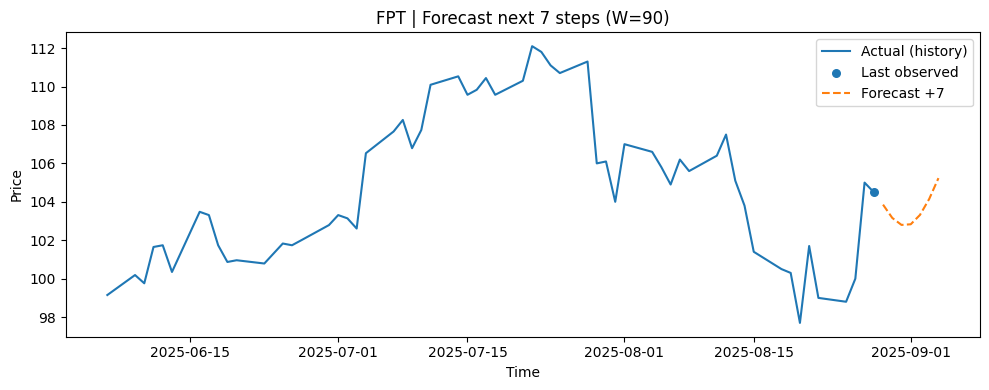

,time,pred_price
0,2025-08-29,103.853213
1,2025-08-30,103.161941
2,2025-08-31,102.798305
3,2025-09-01,102.831613
4,2025-09-02,103.317129


In [ ]:
BEST_DIR = "/content/drive/MyDrive/kpdl/model_turning/seq2seq_vae_tuning_multisymbol/best_overall"

# Giả sử bạn đã có df gốc (raw) với các cột: symbol, time, open, high, low, close, volume, p_neg/p_neu/p_pos (nếu có)
# Và bạn đã có HÀM preprocess_multisymbol_df(df_raw, use_symbol_onehot=True) như lúc train

out = infer_next_h_for_symbol(
    df_raw=df,                # dữ liệu gốc
    symbol="FPT",             # <-- thay mã bạn muốn dự báo
    best_dir=BEST_DIR,
    preprocess_fn=preprocess_multisymbol_df,  # chính là hàm tiền xử lý đã dùng lúc train
    lookback_plot=60
)

# DataFrame dự báo:
display(out["forecast_df"].head())


# Đánh giá model mới

In [ ]:
import numpy as np

def _safe_div(a, b):
    return a / np.clip(b, 1e-12, None)

def compute_rmse_mape(actual_prices, pred_prices):
    err = pred_prices - actual_prices
    rmse = float(np.sqrt(np.mean(err**2)))
    mape = float(np.mean(np.abs(_safe_div(err, actual_prices))) * 100.0)
    return rmse, mape

def compute_da(actual_prices, pred_prices, p0):
    """
    DA: tỷ lệ đúng chiều tăng/giảm theo từng bước.
    p0 = giá quan sát cuối cùng ngay trước horizon (giá mốc để lấy chênh lệch bước đầu tiên)
    """
    a = np.concatenate([[p0], actual_prices])
    p = np.concatenate([[p0], pred_prices])
    da = float(np.mean(np.sign(np.diff(a)) == np.sign(np.diff(p))))
    return da

def compute_ta(actual_prices, pred_prices, p0):
    """
    TA: đúng điểm đổi chiều (sign đổi giữa 2 bước liên tiếp).
    Cần >= 3 điểm trong horizon, nếu không trả về NaN.
    """
    a = np.concatenate([[p0], actual_prices])
    p = np.concatenate([[p0], pred_prices])

    if len(a) < 3 or len(p) < 3:
        return float("nan")

    a_dir = np.sign(np.diff(a))          # chiều mỗi bước
    p_dir = np.sign(np.diff(p))

    a_turn = (a_dir[1:] != a_dir[:-1])   # True nếu đổi chiều tại bước t (so t-1 -> t)
    p_turn = (p_dir[1:] != p_dir[:-1])

    ta = float(np.mean(a_turn == p_turn))
    return ta

def compute_sda(actual_prices, pred_prices, p0):
    """
    SDA (Slope Directional Accuracy):
    So sánh dấu của 'độ dốc' 2-bước: sign(x_{t+1} - x_{t-1}) giữa actual & predicted.
    Cần >= 3 điểm trong horizon, nếu không trả về NaN.
    """
    a = np.concatenate([[p0], actual_prices])
    p = np.concatenate([[p0], pred_prices])

    if len(a) < 3 or len(p) < 3:
        return float("nan")

    # vector độ dốc hai-bước tại chỉ số 1..n-1 (bỏ đầu/cuối vì cần t-1 và t+1)
    a_slope = np.sign(a[2:] - a[:-2])
    p_slope = np.sign(p[2:] - p[:-2])

    sda = float(np.mean(a_slope == p_slope))
    return sda


In [ ]:
def backtest_multi_symbol(vae, df, feature_cols, scaler, target_col, window, horizon):
    """
    - Với mỗi symbol: lấy cửa sổ (W) ngay TRƯỚC H ngày cuối, dự báo H bước (log-return).
    - Dựng giá bằng exp(r).
    - Tính RMSE, MAPE, DA, TA, SDA cho từng symbol, rồi lấy trung bình.
    """
    rmses, mapes, das, tas, sdas = [], [], [], [], []
    details = {}

    for sym, dfg in df.groupby('symbol'):
        n = len(dfg)
        if n < window + horizon:
            continue

        X_all = scaler.transform(dfg[feature_cols].to_numpy(dtype='float32', copy=False))
        bt_window = X_all[-horizon - window : -horizon]   # (W,F)
        if bt_window.shape[0] != window:
            continue

        # dự báo log-return rồi dựng giá
        pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]  # (H,)
        start_price = float(dfg[target_col].iloc[-horizon-1])
        pred_prices = [start_price]
        for r in pred_rets:
            pred_prices.append(pred_prices[-1] * np.exp(float(r)))
        pred_prices = np.asarray(pred_prices[1:], dtype='float64')  # (H,)

        actual_prices = dfg[target_col].iloc[-horizon:].to_numpy(dtype='float64', copy=False)

        rmse, mape = compute_rmse_mape(actual_prices, pred_prices)
        da = compute_da(actual_prices, pred_prices, p0=start_price)
        ta = compute_ta(actual_prices, pred_prices, p0=start_price)
        sda = compute_sda(actual_prices, pred_prices, p0=start_price)

        rmses.append(rmse); mapes.append(mape)
        das.append(da); tas.append(ta); sdas.append(sda)

        details[sym] = {'rmse': rmse, 'mape': mape, 'da': da, 'ta': ta, 'sda': sda}

    if len(rmses) == 0:
        return {'rmse': np.inf, 'mape': np.inf, 'da': np.nan, 'ta': np.nan, 'sda': np.nan}, details

    agg = {
        'rmse': float(np.mean(rmses)),
        'mape': float(np.mean(mapes)),
        'da':   float(np.mean(das)),
        'ta':   float(np.nanmean(tas)),   # TA/SDA có thể NaN nếu H<3
        'sda':  float(np.nanmean(sdas)),
    }
    return agg, details


In [ ]:
import matplotlib.pyplot as plt

def infer_next_h_for_symbol(df_raw, symbol, best_dir, preprocess_fn, lookback_plot=60, eval_backtest=False):
    """
    Nếu eval_backtest=True: so sánh dự báo H bước với 7 ngày cuối (có actual) để tính RMSE/MAPE/DA/TA/SDA và in lên biểu đồ.
    """
    # 1) Nạp artifacts
    vae, scaler, config = load_best_artifacts(best_dir)
    W = int(config.get("W", 90))
    H = int(config.get("H", 7))
    TARGET_COL = config.get("TARGET_COL", "close")

    # 2) Tiền xử lý
    df_clean, _, _ = preprocess_fn(df_raw, use_symbol_onehot=True)
    df_clean, feature_cols = align_features_for_infer(df_clean, config)

    # 3) Lọc symbol
    dfg = df_clean[df_clean["symbol"] == symbol].sort_values("time").reset_index(drop=True).copy()
    if len(dfg) < W + 1:
        raise ValueError(f"Symbol {symbol} không đủ dữ liệu: cần >= {W+1}, có {len(dfg)}")

    # 4) Lấy cửa sổ cuối (W,F) để dự báo H bước
    X_all = scaler.transform(dfg[feature_cols].to_numpy(dtype="float32", copy=False))
    last_window = X_all[-W:]  # (W,F)
    pred_rets = vae.predict(last_window[np.newaxis], verbose=0)[0, :, 0]  # (H,)

    # 5) Dựng giá
    last_price = float(dfg[TARGET_COL].iloc[-1])
    pred_prices = [last_price]
    for r in pred_rets:
        pred_prices.append(pred_prices[-1] * np.exp(float(r)))
    pred_prices = np.array(pred_prices[1:], dtype="float64")  # (H,)

    # 6) Trục thời gian tương lai
    dfg_time = pd.to_datetime(dfg["time"])
    freq_guess = (dfg_time.iloc[-1] - dfg_time.iloc[-2]) if len(dfg_time) >= 2 else pd.Timedelta(days=1)
    if freq_guess <= pd.Timedelta(0): freq_guess = pd.Timedelta(days=1)
    future_times = [dfg_time.iloc[-1] + (i+1)*freq_guess for i in range(H)]

    # 7) Chuẩn bị lịch sử để vẽ
    hist_idx_start = max(0, len(dfg)-lookback_plot)
    hist_times = dfg_time.iloc[hist_idx_start:].tolist()
    hist_prices = dfg[TARGET_COL].iloc[hist_idx_start:].to_numpy(dtype="float64")

    # 8) (Tuỳ chọn) tính metrics backtest trên 7 ngày cuối
    metrics_txt = None
    if eval_backtest and len(dfg) >= (W + H + 1):
        # Lấy đúng cửa sổ backtest: H ngày cuối làm actual; dùng W ngay trước đó làm input
        # -> tái dùng logic của backtest
        X_bt_all = X_all
        bt_window = X_bt_all[-H - W : -H]
        bt_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]
        start_price = float(dfg[TARGET_COL].iloc[-H-1])
        bt_pred_prices = [start_price]
        for r in bt_rets:
            bt_pred_prices.append(bt_pred_prices[-1] * np.exp(float(r)))
        bt_pred_prices = np.array(bt_pred_prices[1:], dtype="float64")
        bt_actual_prices = dfg[TARGET_COL].iloc[-H:].to_numpy(dtype="float64")

        rmse, mape = compute_rmse_mape(bt_actual_prices, bt_pred_prices)
        da   = compute_da(bt_actual_prices, bt_pred_prices, p0=start_price)
        ta   = compute_ta(bt_actual_prices, bt_pred_prices, p0=start_price)
        sda  = compute_sda(bt_actual_prices, bt_pred_prices, p0=start_price)

        metrics_txt = f"RMSE={rmse:.2f} | MAPE={mape:.2f}% | DA={da:.2f} | TA={ta:.2f} | SDA={sda:.2f}"

    # 9) Plot
    plt.figure(figsize=(10, 4))
    plt.plot(hist_times, hist_prices, label="Actual (history)")
    plt.scatter([dfg_time.iloc[-1]], [last_price], s=30, label="Last observed", zorder=3)
    plt.plot(future_times, pred_prices, label=f"Forecast +{H}", linestyle="--")
    plt.title(f"{symbol} | Forecast next {H} steps (W={W})")
    plt.xlabel("Time"); plt.ylabel("Price")
    plt.legend(loc="upper left")
    if metrics_txt is not None:
        # hộp nhỏ hiển thị metrics backtest
        plt.gcf().text(0.01, 0.02, metrics_txt, fontsize=9, ha='left', va='bottom',
                       bbox=dict(boxstyle="round", fc="w", ec="0.7"))
    plt.tight_layout()
    plt.show()

    forecast_df = pd.DataFrame({"time": future_times, "pred_price": pred_prices})
    return {
        "forecast_df": forecast_df,
        "last_price": last_price,
        "pred_returns": pred_rets,
        "metrics_backtest": metrics_txt
    }


# Chạy toàn bộ code

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/kpdl/preprocessed_data.csv')

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

def infer_backtest_and_future_symbol(
    df_raw,
    symbol,
    best_dir,
    preprocess_fn,
    lookback_hist_plot=120,  # số ngày lịch sử vẽ
    backtest_days=60         # số ngày dùng để backtest liên tục
):
    """
    Walk-forward backtest 1-step (stitched) trên 'backtest_days' ngày,
    rồi nối tiếp forecast H ngày tương lai (từ best model).
    Tính RMSE/MAPE/DA/TA/SDA trên phần backtest.
    """
    # 1) Nạp artifacts và config
    vae, scaler, config = load_best_artifacts(best_dir)
    W = int(config.get("W", 90))
    H = int(config.get("H", 7))
    TARGET_COL = config.get("TARGET_COL", "close")

    # 2) Tiền xử lý đồng nhất với lúc train
    df_clean, _, _ = preprocess_fn(df_raw, use_symbol_onehot=True)
    df_clean, feature_cols = align_features_for_infer(df_clean, config)

    # 3) Lọc 1 symbol
    dfg = df_clean[df_clean["symbol"] == symbol].sort_values("time").reset_index(drop=True).copy()
    if len(dfg) < (W + backtest_days + 1):
        raise ValueError(f"{symbol}: cần >= {W + backtest_days + 1} dòng, hiện có {len(dfg)}")

    # 4) Scale toàn bộ đặc trưng của symbol
    X_all = scaler.transform(dfg[feature_cols].to_numpy(dtype="float32", copy=False))
    prices = dfg[TARGET_COL].to_numpy(dtype="float64", copy=False)
    times  = pd.to_datetime(dfg["time"])

    # 5) Chọn đoạn backtest (liền trước điểm cuối)
    #    Ta lấy chuỗi dự báo 1-step stitched cho 'backtest_days' ngày cuối.
    start_bt_idx = len(dfg) - backtest_days  # chỉ số thời điểm đầu của vùng đánh giá
    if start_bt_idx - W < 0:
        start_bt_idx = W  # đảm bảo có đủ W ngày cửa sổ trước điểm dự báo đầu tiên

    # Chuỗi dự báo 1-step stitched
    pred_bt_1step = []
    for t in range(start_bt_idx, len(dfg)):   # t là index ngày cần dự báo 1-step (t vs t-1)
        # cửa sổ kết thúc ở t-1
        s = t - W
        e = t
        if s < 0:
            pred_bt_1step.append(np.nan)
            continue
        window = X_all[s:e]                       # (W,F)
        # dự báo H bước, lấy bước 1-ngày-tới để ghép
        pred_rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]
        p0 = float(prices[e-1])
        p1 = p0 * np.exp(float(pred_rets[0]))     # log-return -> giá 1 ngày tới
        pred_bt_1step.append(p1)

    pred_bt_1step = np.array(pred_bt_1step, dtype="float64")
    actual_bt = prices[start_bt_idx:]             # actual để so sánh
    times_bt  = times[start_bt_idx:]

    # 6) Tính metrics trên backtest (bỏ NaN đầu nếu có)
    valid = np.isfinite(pred_bt_1step)
    actual_eval = actual_bt[valid]
    pred_eval   = pred_bt_1step[valid]

    # p0 cho DA/TA/SDA là giá ngay trước điểm dự báo đầu tiên hợp lệ:
    # tìm chỉ số toàn cục của phần tử hợp lệ đầu tiên
    first_valid_pos = np.flatnonzero(valid)[0]
    p0 = float(prices[start_bt_idx + first_valid_pos - 1])  # giá chốt trước ngày đầu so sánh

    rmse_bt, mape_bt = compute_rmse_mape(actual_eval, pred_eval)
    da_bt  = compute_da(actual_eval, pred_eval, p0=p0)
    ta_bt  = compute_ta(actual_eval, pred_eval, p0=p0)
    sda_bt = compute_sda(actual_eval, pred_eval, p0=p0)

    metrics_txt = f"Backtest({len(actual_eval)}d)  RMSE={rmse_bt:.2f} | MAPE={mape_bt:.2f}% | DA={da_bt:.2f} | TA={ta_bt:.2f} | SDA={sda_bt:.2f}"

    # 7) Forecast H ngày tương lai từ điểm cuối
    last_window = X_all[-W:]                                   # (W,F)
    pred_rets_fut = vae.predict(last_window[np.newaxis], verbose=0)[0, :, 0]
    last_price = float(prices[-1])
    pred_future = [last_price]
    for r in pred_rets_fut:
        pred_future.append(pred_future[-1] * np.exp(float(r)))
    pred_future = np.array(pred_future[1:], dtype="float64")

    # thời gian tương lai
    if len(times) >= 2:
        freq = times.iloc[-1] - times.iloc[-2]
        if freq <= pd.Timedelta(0): freq = pd.Timedelta(days=1)
    else:
        freq = pd.Timedelta(days=1)
    fut_times = [times.iloc[-1] + (i+1)*freq for i in range(H)]

    # 8) Chuẩn bị plot: lịch sử + dự báo backtest (1-step) + forecast tương lai (H)
    hist_start = max(0, len(dfg) - lookback_hist_plot)
    plt.figure(figsize=(11, 4.5))
    # lịch sử
    plt.plot(times.iloc[hist_start:], prices[hist_start:], label="Thực tế (history)")
    # pred backtest 1-step stitched
    plt.plot(times_bt[valid], pred_bt_1step[valid], linestyle="--", label=f"Train {len(actual_eval)}d)")
    # điểm cuối + forecast tương lai
    # plt.scatter([times.iloc[-1]], [last_price], s=30, label="Last observed", zorder=3)
    plt.plot(fut_times, pred_future, linestyle="--", label=f"Dự đoán 7 ngày tiếp")

    # plt.title(f"{symbol} | Walk-forward backtest + {H}-step forecast (W={W})")
    plt.xlabel("Time"); plt.ylabel("Price")
    plt.legend(loc="upper left")
    plt.gcf().text(0.01, 0.01, metrics_txt, fontsize=9, ha='left', va='bottom',
                   bbox=dict(boxstyle="round", fc="w", ec="0.7"))
    plt.tight_layout()
    plt.show()

    # 9) Trả về bảng kết quả kết hợp
    df_bt = pd.DataFrame({"time": times_bt.values, "actual": actual_bt, "pred_1step": pred_bt_1step})
    df_fut = pd.DataFrame({"time": fut_times, "pred_price": pred_future})
    return {
        "future_df": df_fut,
        "metrics_backtest": {
            "days": int(len(actual_eval)),
            "rmse": float(rmse_bt),
            "mape": float(mape_bt)
        }
    }



=== BSR ===


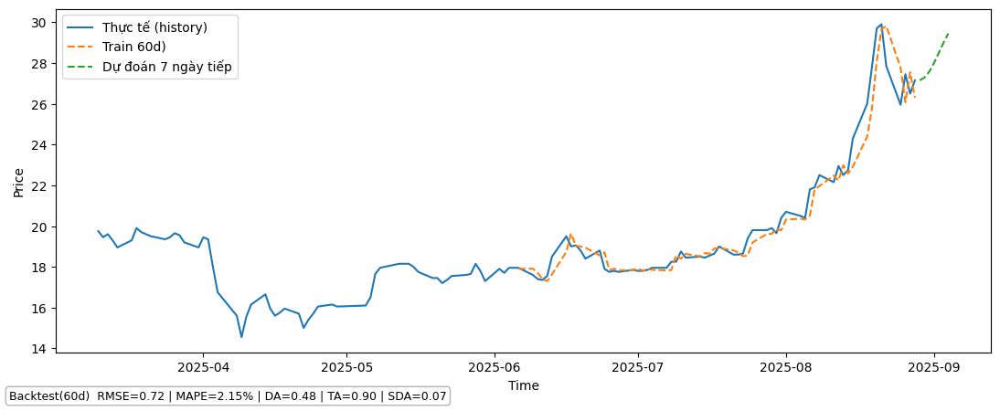

RMSE=0.72 | MAPE=2.15%

=== CMC ===


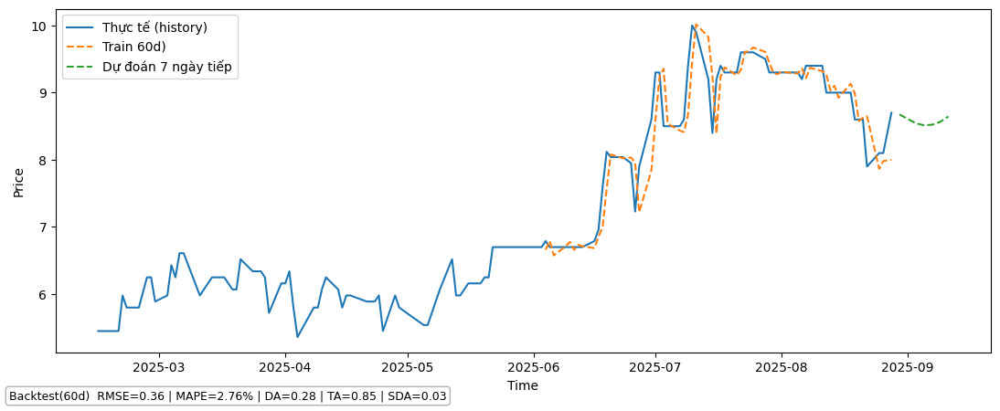

RMSE=0.36 | MAPE=2.76%

=== ELC ===


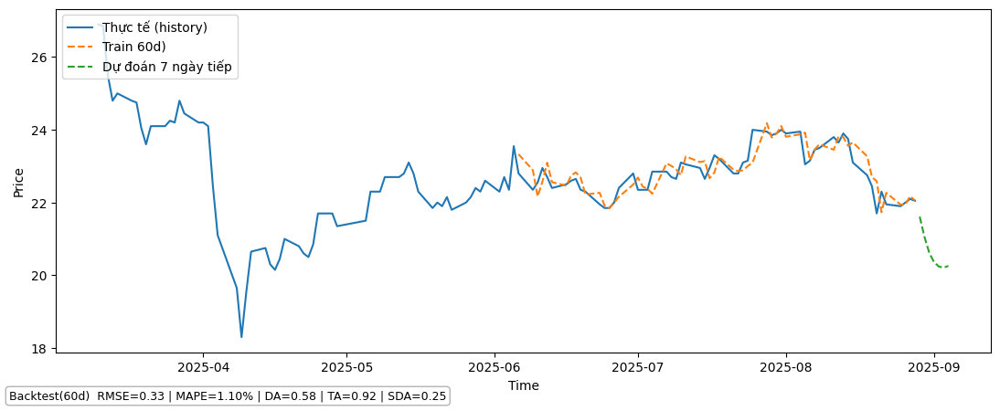

RMSE=0.33 | MAPE=1.10%

=== FPT ===


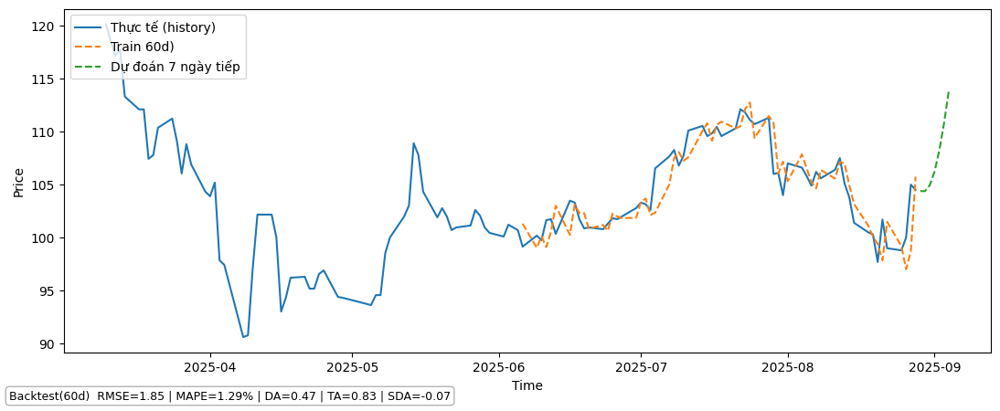

RMSE=1.85 | MAPE=1.29%

=== GAS ===


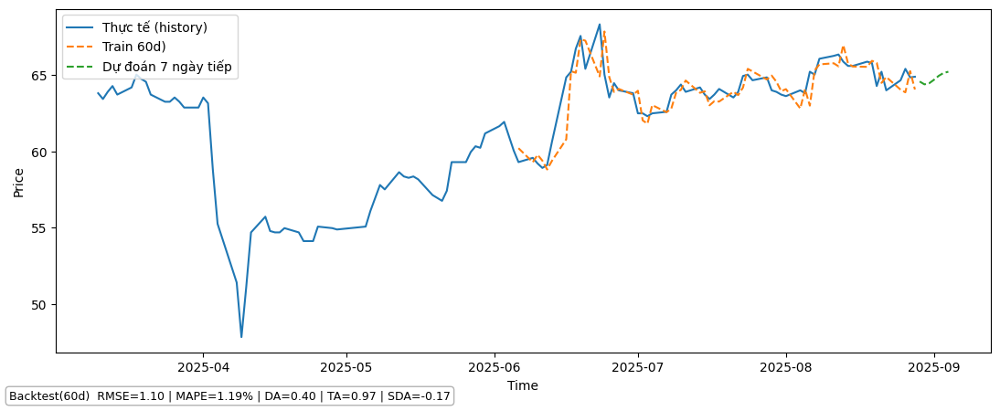

RMSE=1.10 | MAPE=1.19%

=== ITC ===


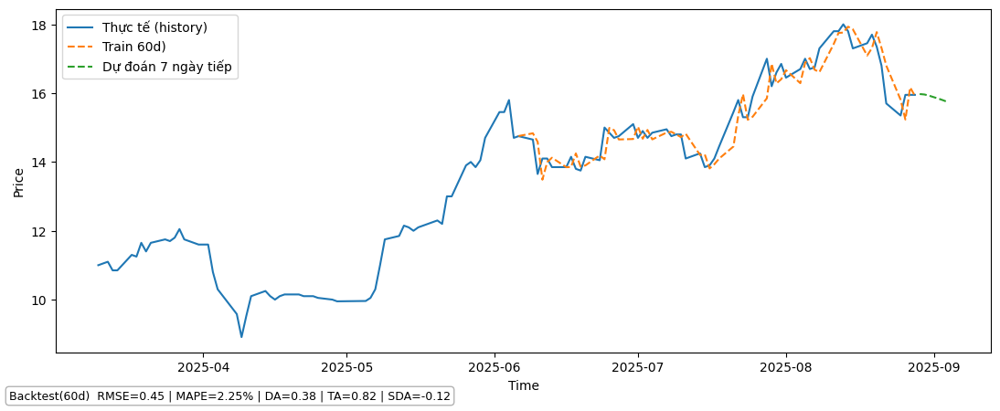

RMSE=0.45 | MAPE=2.25%

=== OIL ===


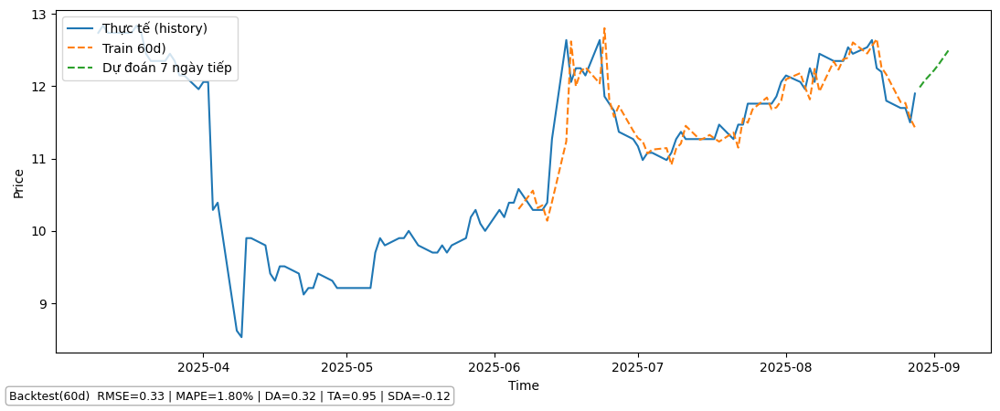

RMSE=0.33 | MAPE=1.80%

=== PLX ===


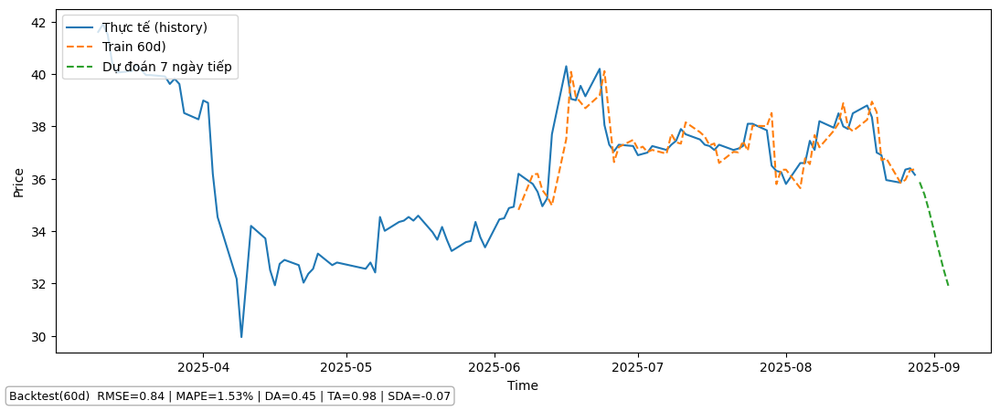

RMSE=0.84 | MAPE=1.53%

=== PVG ===


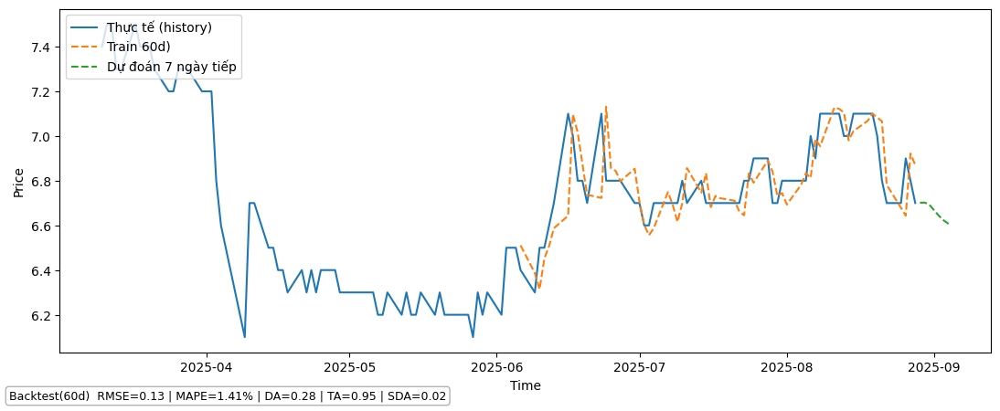

RMSE=0.13 | MAPE=1.41%

=== SGT ===


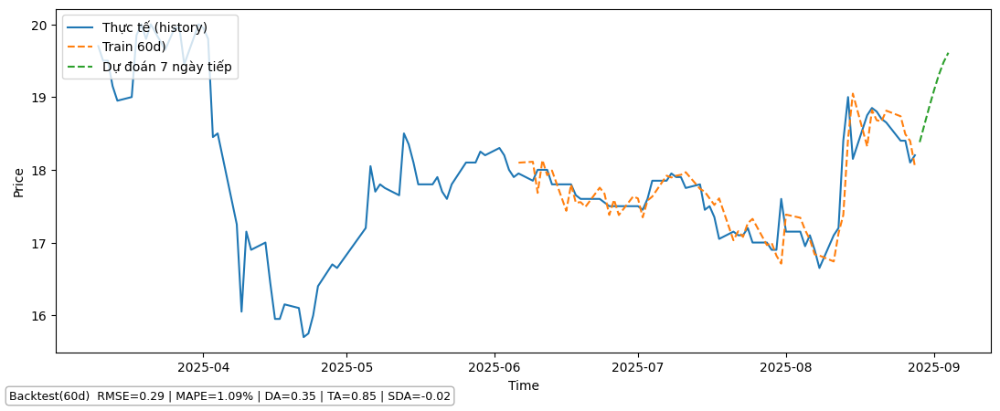

RMSE=0.29 | MAPE=1.09%

=== VNZ ===


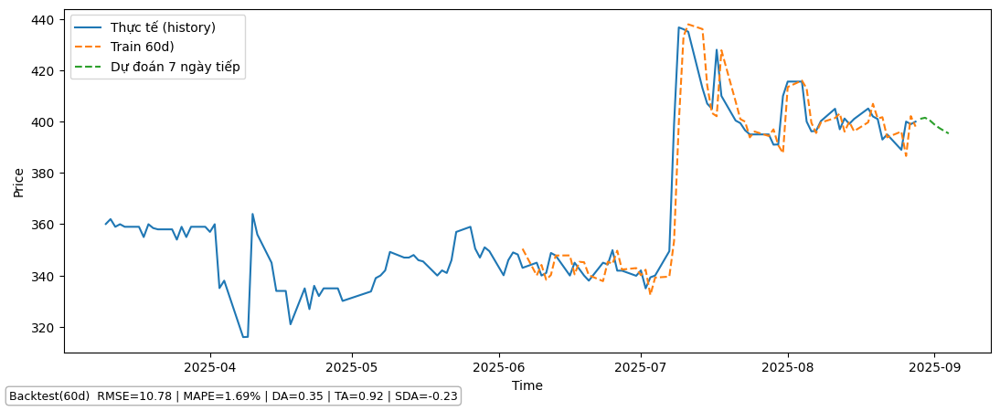

RMSE=10.78 | MAPE=1.69%


,symbol,days,rmse,mape
8,PVG,60,0.133264,1.405783
9,SGT,60,0.286553,1.093327
6,OIL,60,0.327108,1.799328
2,ELC,60,0.334700,1.101529
1,CMC,60,0.360785,2.762248


In [ ]:
def infer_backtest_and_future_all_symbols(
    df_raw,
    best_dir,
    preprocess_fn,
    lookback_hist_plot=120,
    backtest_days=60
):
    results, rows = {}, []
    for sym in df_raw["symbol"].unique():
        try:
            print(f"\n=== {sym} ===")
            out = infer_backtest_and_future_symbol(
                df_raw=df_raw,
                symbol=sym,
                best_dir=best_dir,
                preprocess_fn=preprocess_fn,
                lookback_hist_plot=lookback_hist_plot,
                backtest_days=backtest_days
            )
            results[sym] = out
            m = out["metrics_backtest"]
            rows.append({"symbol": sym, **m})
            # In ngắn gọn
            print(f"RMSE={m['rmse']:.2f} | MAPE={m['mape']:.2f}%")
        except Exception as e:
            print(f"[ERROR] {sym}: {e}")
    metrics_df = pd.DataFrame(rows).sort_values("rmse")
    return results, metrics_df

# DÙNG:
BEST_DIR = "/content/drive/MyDrive/kpdl/model_turning/seq2seq_vae_tuning_multisymbol/best_overall"

all_results, metrics_df = infer_backtest_and_future_all_symbols(
    df_raw=df,
    best_dir=BEST_DIR,
    preprocess_fn=preprocess_multisymbol_df,
    lookback_hist_plot=120,
    backtest_days=60
)

# Xem/tải metrics tổng hợp
display(metrics_df.head())
# metrics_df.to_csv("/content/metrics_backtest_all_symbols.csv", index=False)


# Turning model không tham số sentiment

In [ ]:
# ========= A) PREPROCESS (no-sentiment) =========
import numpy as np, pandas as pd

def preprocess_multisymbol_df_nosent(df_raw: pd.DataFrame,
                                     use_symbol_onehot: bool = True,
                                     clip_abs: float = 1e12):
    """
    - KHÔNG dùng: p_neg, p_neu, p_pos, has_news
    - Sử dụng sẵn các cột kỹ thuật bạn đã có trong df
    - y = logret (dùng để dự báo; phù hợp exp(r))
    - Làm sạch NaN/±inf theo từng symbol, ép float32
    """
    df = df_raw.copy()
    assert {'symbol','time','open','high','low','close','volume','logret'}.issubset(df.columns)
    df['time'] = pd.to_datetime(df['time'])
    df = df.sort_values(['symbol','time']).reset_index(drop=True)

    # ===== Chọn feature từ các cột bạn có (loại 4 sentiment) =====
    # Giữ lại các cột kỹ thuật bạn đã nêu; không dùng p_* và has_news
    base_features = [
        # giá/khối lượng gốc (nên giữ)
        "open","high","low","close","volume",
        # các đặc trưng bạn đã dựng sẵn
        "ret1","ret5","ret20",           # nếu đây là các return trong quá khứ
        "ema20","ema60","ema20_dist","ema60_slope",
        "vol20","atr14","vol_z20",
        # nếu không muốn dùng các sent_* thì có thể bỏ luôn:
        # "sent_polarity","sent_entropy","sent_polarity_ema3","sent_vol_interact",
    ]

    # Loại bỏ các cột sentiment bắt buộc
    ban_cols = {"p_neg","p_neu","p_pos","has_news"}
    feature_cols = [c for c in base_features if c in df.columns and c not in ban_cols]

    # y = logret (log-return)
    y_col = "logret"
    assert y_col in df.columns, "Thiếu cột logret trong df."

    # ===== Làm sạch các cột dùng =====
    clean_cols = feature_cols + [y_col]
    df[clean_cols] = df[clean_cols].replace([np.inf, -np.inf], np.nan)

    # fill theo từng symbol để không rò rỉ tương lai giữa mã
    def _ffill_bfill_block(block: pd.DataFrame):
        return block.bfill().ffill()

    df[clean_cols] = df.groupby('symbol', group_keys=False)[clean_cols].apply(_ffill_bfill_block)
    df[clean_cols] = df[clean_cols].fillna(0.0).clip(-clip_abs, clip_abs).astype('float32')

    # KHÔNG cần drop dòng cuối mỗi symbol vì y=logret của bạn đã sẵn (không phải shift ngay tại đây)

    # One-hot symbol (khuyên dùng)
    symbol_onehot_cols = []
    if use_symbol_onehot:
        sym_ohe = pd.get_dummies(df['symbol'], prefix='sym', dtype='float32')
        symbol_onehot_cols = list(sym_ohe.columns)
        df = pd.concat([df, sym_ohe], axis=1)
        feature_cols = feature_cols + symbol_onehot_cols

    # Guard
    X_check = df[feature_cols].to_numpy(copy=False)
    y_check = df[y_col].to_numpy(copy=False)
    assert np.isfinite(X_check).all() and np.isfinite(y_check).all(), "Non-finite after cleaning."

    return df, feature_cols, symbol_onehot_cols, y_col


In [ ]:
# ========= B) TRAIN + TUNER (no-sentiment) =========
import os, json, shutil, traceback
import numpy as np, pandas as pd
import tensorflow as tf
from sklearn.preprocessing import RobustScaler
from keras import layers, models, callbacks, optimizers, losses
from keras import ops as K
import joblib

# ---- VAE ----
class Sampling(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        eps = tf.random.normal(shape=K.shape(mu))
        return mu + K.exp(0.5 * logvar) * eps

class KLDivergenceLayer(layers.Layer):
    def __init__(self, beta=0.5, **kwargs):
        super().__init__(**kwargs); self.beta = beta
    def call(self, inputs):
        mu, logvar = inputs
        kl_per = -0.5 * K.sum(1 + logvar - K.square(mu) - K.exp(logvar), axis=1)
        self.add_loss(self.beta * K.mean(kl_per))
        return inputs

def build_vae(window, n_feat, horizon,
              hidden=128, latent=12, dropout=0.2, lr=1e-4, beta=0.5):
    enc_in = layers.Input(shape=(window, n_feat))
    x = layers.Conv1D(64, 5, padding="causal", activation="relu")(enc_in)
    x = layers.Conv1D(64, 3, padding="causal", activation="relu")(x)
    x = layers.LayerNormalization()(x)
    x = layers.LSTM(hidden, return_sequences=False, dropout=dropout)(x)
    mu     = layers.Dense(latent, name="z_mu")(x)
    logvar = layers.Dense(latent, name="z_logvar")(x)
    mu, logvar = KLDivergenceLayer(beta=beta, name="kl_layer")([mu, logvar])
    z = Sampling(name="z")([mu, logvar])

    d = layers.RepeatVector(horizon)(z)
    d = layers.LSTM(hidden, return_sequences=True, dropout=dropout)(d)
    d = layers.TimeDistributed(layers.Dense(64, activation="relu"))(d)
    y_hat = layers.TimeDistributed(layers.Dense(1), name="y_hat")(d)

    vae = models.Model(enc_in, y_hat, name="seq2seq_vae")
    vae.compile(
        optimizer=optimizers.Adam(learning_rate=lr, clipnorm=1.0),
        loss=losses.Huber(delta=0.05),
        metrics=[losses.MeanSquaredError(name="mse")]
    )
    return vae

# ---- Windowing per-symbol ----
def make_multi_step_multi_symbol(df, feature_cols, y_col, window, horizon):
    Xs, Ys = [], []
    for _, dfg in df.groupby('symbol'):
        X_all = dfg[feature_cols].to_numpy(dtype='float32', copy=False)
        y_all = dfg[y_col].to_numpy(dtype='float32', copy=False)
        n = len(dfg)
        if n < window + horizon:
            continue
        for s in range(0, n - window - horizon + 1):
            e = s + window
            Xs.append(X_all[s:e])
            Ys.append(y_all[e:e+horizon])
    if not Xs:
        return np.empty((0, window, len(feature_cols)), dtype='float32'), np.empty((0, horizon, 1), dtype='float32')
    X = np.asarray(Xs, dtype='float32')
    Y = np.asarray(Ys, dtype='float32').reshape(-1, horizon, 1)
    return X, Y

# ---- Backtest H ngày cuối / symbol ----
def backtest_multi_symbol(vae, df, feature_cols, scaler, target_col, y_col, window, horizon):
    rmses, mapes = [], []
    details = {}
    for sym, dfg in df.groupby('symbol'):
        n = len(dfg)
        if n < window + horizon:
            continue
        X_all = scaler.transform(dfg[feature_cols].to_numpy(dtype='float32', copy=False))
        bt_window = X_all[-horizon - window : -horizon]   # (W,F)
        if bt_window.shape[0] != window:
            continue

        # dự báo log-return, dựng giá
        pred_rets = vae.predict(bt_window[np.newaxis], verbose=0)[0, :, 0]
        start_price = float(dfg[target_col].iloc[-horizon-1])
        pred_prices = [start_price]
        for r in pred_rets:
            pred_prices.append(pred_prices[-1] * np.exp(float(r)))
        pred_prices = np.asarray(pred_prices[1:], dtype='float64')

        actual_prices = dfg[target_col].iloc[-horizon:].to_numpy(dtype='float64', copy=False)
        mse  = float(np.mean((pred_prices - actual_prices)**2))
        rmse = float(np.sqrt(mse))
        mape = float(np.mean(np.abs((actual_prices - pred_prices) / np.clip(actual_prices, 1e-12, None))) * 100)

        rmses.append(rmse); mapes.append(mape)
        details[sym] = {'rmse': rmse, 'mape': mape}

    if len(rmses) == 0:
        return {'rmse': np.inf, 'mape': np.inf}, details
    return {'rmse': float(np.mean(rmses)), 'mape': float(np.mean(mapes))}, details

# ---- Tuner ----
def run_tuner(df, feature_cols,
              BASE_SAVE_DIR,
              W_grid=(30,45,60,90),
              H_grid=(7,20,30),
              RANK_BY='rmse',
              HIDDEN=128, LATENT=12, DROPOUT=0.2, LR=1e-4, BETA_MAX=0.5,
              TARGET_COL='close',
              Y_COL='logret',                # <--- dùng y = logret
              EPOCHS=10, BATCH=128, VAL_SPLIT=0.2):
    os.makedirs(BASE_SAVE_DIR, exist_ok=True)
    LOG_PATH = os.path.join(BASE_SAVE_DIR, "tuning_errors.log")
    if os.path.exists(LOG_PATH): os.remove(LOG_PATH)
    def log_error(msg):
        with open(LOG_PATH, "a") as f: f.write(msg + "\n")

    all_results, best_info = [], None
    best_score = np.inf

    for W in W_grid:
        for H in H_grid:
            try:
                ok_syms = [s for s, dfg in df.groupby('symbol') if len(dfg) >= (W + H + 20)]
                if len(ok_syms) == 0:
                    log_error(f"SKIP W={W},H={H}: no symbol has enough rows")
                    continue

                # Train set: bỏ H dòng cuối mỗi symbol
                df_train = pd.concat(
                    [dfg.iloc[:-H].copy() for _, dfg in df.groupby('symbol') if len(dfg) >= (W + H + 1)],
                    axis=0
                ).sort_values(['symbol','time']).reset_index(drop=True)

                # Scaler
                x_scaler = RobustScaler()
                X_tr_np = df_train[feature_cols].to_numpy(dtype='float32', copy=False)
                if not np.isfinite(X_tr_np).all():
                    bad = np.where(~np.isfinite(X_tr_np).all(axis=1))[0][:10]
                    raise ValueError(f"Non-finite in train features at rows: {bad}")
                _ = x_scaler.fit_transform(X_tr_np)

                # Build train windows (scale trước khi window cho đồng nhất)
                df_train_scaled = df_train.copy()
                df_train_scaled[feature_cols] = x_scaler.transform(df_train[feature_cols].to_numpy(dtype='float32'))
                X_train, Y_train = make_multi_step_multi_symbol(df_train_scaled, feature_cols, Y_COL, W, H)
                if X_train.shape[0] == 0:
                    raise ValueError(f"No windows for W={W},H={H}")

                vae = build_vae(W, X_train.shape[-1], H,
                                hidden=HIDDEN, latent=LATENT, dropout=DROPOUT, lr=LR, beta=BETA_MAX)

                this_dir = os.path.join(BASE_SAVE_DIR, f"W{W}_H{H}")
                os.makedirs(this_dir, exist_ok=True)
                cbs = [
                    callbacks.EarlyStopping(monitor="val_mse", patience=2, restore_best_weights=True),
                    callbacks.ReduceLROnPlateau(monitor="val_mse", factor=0.5, patience=3, min_lr=1e-5),
                    callbacks.ModelCheckpoint(
                        filepath=os.path.join(this_dir, "best_vae.keras"),
                        monitor="val_mse", save_best_only=True, verbose=0
                    )
                ]
                hist = vae.fit(
                    X_train, Y_train,
                    epochs=EPOCHS, batch_size=BATCH,
                    validation_split=VAL_SPLIT, shuffle=False,
                    callbacks=cbs, verbose=0
                )

                # Backtest trên FULL df
                agg_metrics, per_sym = backtest_multi_symbol(
                    vae, df, feature_cols, x_scaler, TARGET_COL, Y_COL, W, H
                )
                metrics = {
                    "W": W, "H": H,
                    "val_mse_min": float(np.min(hist.history["val_mse"])),
                    "rmse": float(agg_metrics['rmse']),
                    "mape": float(agg_metrics['mape'])
                }

                # Lưu
                vae.save(os.path.join(this_dir, "final_vae.keras"))
                joblib.dump(x_scaler, os.path.join(this_dir, "x_scaler.pkl"))
                with open(os.path.join(this_dir,"config.json"),"w") as f:
                    json.dump(
                        {"W":W,"H":H,"feature_cols":feature_cols,"TARGET_COL":TARGET_COL,"Y_COL":Y_COL},
                        f, indent=2
                    )
                pd.DataFrame(hist.history).to_csv(os.path.join(this_dir,"train_history.csv"), index=False)
                json.dump(per_sym, open(os.path.join(this_dir,"per_symbol_metrics.json"),"w"), indent=2)

                all_results.append({**metrics, "model_dir": this_dir})
                score = metrics[RANK_BY] if RANK_BY in ("rmse","mape") else metrics["val_mse_min"]
                if score < best_score:
                    best_score = score
                    best_info = (metrics, this_dir)

                print(f"[OK] W={W}, H={H} | rmse={metrics['rmse']:.4f} | mape={metrics['mape']:.2f}% | "
                      f"val_mse_min={metrics['val_mse_min']:.6f}")

            except Exception as e:
                err = f"[ERROR] W={W}, H={H} -> {e}\n{traceback.format_exc()}"
                with open(LOG_PATH, "a") as f: f.write(err + "\n")
                print(err)

    # Summary & best
    summary_path = None
    if len(all_results) > 0:
        rank_key = RANK_BY if RANK_BY in ("rmse","mape") else "val_mse_min"
        summary_df = pd.DataFrame(all_results).sort_values(rank_key, ascending=True)
        summary_path = os.path.join(BASE_SAVE_DIR, "tuning_results.csv")
        summary_df.to_csv(summary_path, index=False)

    BEST_DIR = os.path.join(BASE_SAVE_DIR, "best_overall")
    os.makedirs(BEST_DIR, exist_ok=True)

    if best_info is not None:
        best_metrics, best_dir = best_info
        for fname in ["best_vae.keras","final_vae.keras","x_scaler.pkl","config.json","train_history.csv","per_symbol_metrics.json"]:
            src = os.path.join(best_dir, fname)
            if os.path.exists(src):
                shutil.copy2(src, os.path.join(BEST_DIR, fname))
        with open(os.path.join(BEST_DIR, "BEST_README.txt"), "w") as f:
            f.write(
                f"Best by {RANK_BY}: W={best_metrics['W']}, H={best_metrics['H']}\n"
                f"rmse={best_metrics['rmse']:.6f}, mape={best_metrics['mape']:.4f}%, "
                f"val_mse_min={best_metrics['val_mse_min']:.6f}\n"
                f"Source dir: {best_dir}\n"
                f"Summary CSV: {summary_path}\n"
            )
        print(f"[BEST] by {RANK_BY}: W={best_metrics['W']}, H={best_metrics['H']} | "
              f"RMSE={best_metrics['rmse']:.4f} | MAPE={best_metrics['mape']:.2f}% | "
              f"val_mse_min={best_metrics['val_mse_min']:.6f}")
    else:
        print("Không đủ cấu hình hợp lệ. Xem tuning_errors.log nếu có.")


In [ ]:
# 1) Tiền xử lý (KHÔNG sentiment)
df_clean, feature_cols, sym_ohe_cols, y_col = preprocess_multisymbol_df_nosent(
    df,
    use_symbol_onehot=True
)

# 2) Tuner
BASE_SAVE_DIR = "/content/drive/MyDrive/kpdl/model_no_sentiment"
run_tuner(
    df_clean,
    feature_cols,
    BASE_SAVE_DIR=BASE_SAVE_DIR,
    W_grid=[30,45,60,90],
    H_grid=[7,20,30],
    RANK_BY='rmse',
    EPOCHS=10, BATCH=128,
    TARGET_COL="close",
    Y_COL=y_col
)


[OK] W=30, H=7 | rmse=15.9347 | mape=20.35% | val_mse_min=4.857547
[OK] W=30, H=20 | rmse=1217.5203 | mape=402.80% | val_mse_min=4.917513
[OK] W=30, H=30 | rmse=1366.2521 | mape=1163.88% | val_mse_min=4.915100
[OK] W=45, H=7 | rmse=10.5840 | mape=13.67% | val_mse_min=4.836366
[OK] W=45, H=20 | rmse=853.7293 | mape=1261.63% | val_mse_min=4.880000
[OK] W=45, H=30 | rmse=20046.0260 | mape=37232.36% | val_mse_min=4.804442
[OK] W=60, H=7 | rmse=37.3716 | mape=44.38% | val_mse_min=4.810199
[OK] W=60, H=20 | rmse=1211.6168 | mape=349.48% | val_mse_min=4.870719
[OK] W=60, H=30 | rmse=1385.3482 | mape=3536.90% | val_mse_min=4.888276
[OK] W=90, H=7 | rmse=52.1179 | mape=71.23% | val_mse_min=4.908098
[OK] W=90, H=20 | rmse=960.3085 | mape=906.39% | val_mse_min=4.831754
[OK] W=90, H=30 | rmse=288685.4718 | mape=31169.16% | val_mse_min=4.846291
[BEST] by rmse: W=45, H=7 | RMSE=10.5840 | MAPE=13.67% | val_mse_min=4.836366


# Test với model không sentiment

In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/kpdl/preprocessed_data.csv')

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

def infer_backtest_and_future_symbol(
    df_raw,
    symbol,
    best_dir,
    preprocess_fn,
    lookback_hist_plot=120,  # số ngày lịch sử vẽ
    backtest_days=60         # số ngày dùng để backtest liên tục
):
    """
    Walk-forward backtest 1-step (stitched) trên 'backtest_days' ngày,
    rồi nối tiếp forecast H ngày tương lai (từ best model).
    Tính RMSE/MAPE/DA/TA/SDA trên phần backtest.
    """
    # 1) Nạp artifacts và config
    vae, scaler, config = load_best_artifacts(best_dir)
    W = int(config.get("W", 90))
    H = int(config.get("H", 7))
    TARGET_COL = config.get("TARGET_COL", "close")

    # 2) Tiền xử lý đồng nhất với lúc train
    df_clean, _, _ = preprocess_fn(df_raw, use_symbol_onehot=True)
    df_clean, feature_cols = align_features_for_infer(df_clean, config)

    # 3) Lọc 1 symbol
    dfg = df_clean[df_clean["symbol"] == symbol].sort_values("time").reset_index(drop=True).copy()
    if len(dfg) < (W + backtest_days + 1):
        raise ValueError(f"{symbol}: cần >= {W + backtest_days + 1} dòng, hiện có {len(dfg)}")

    # 4) Scale toàn bộ đặc trưng của symbol
    X_all = scaler.transform(dfg[feature_cols].to_numpy(dtype="float32", copy=False))
    prices = dfg[TARGET_COL].to_numpy(dtype="float64", copy=False)
    times  = pd.to_datetime(dfg["time"])

    # 5) Chọn đoạn backtest (liền trước điểm cuối)
    #    Ta lấy chuỗi dự báo 1-step stitched cho 'backtest_days' ngày cuối.
    start_bt_idx = len(dfg) - backtest_days  # chỉ số thời điểm đầu của vùng đánh giá
    if start_bt_idx - W < 0:
        start_bt_idx = W  # đảm bảo có đủ W ngày cửa sổ trước điểm dự báo đầu tiên

    # Chuỗi dự báo 1-step stitched
    pred_bt_1step = []
    for t in range(start_bt_idx, len(dfg)):   # t là index ngày cần dự báo 1-step (t vs t-1)
        # cửa sổ kết thúc ở t-1
        s = t - W
        e = t
        if s < 0:
            pred_bt_1step.append(np.nan)
            continue
        window = X_all[s:e]                       # (W,F)
        # dự báo H bước, lấy bước 1-ngày-tới để ghép
        pred_rets = vae.predict(window[np.newaxis], verbose=0)[0, :, 0]
        p0 = float(prices[e-1])
        p1 = p0 * np.exp(float(pred_rets[0]))     # log-return -> giá 1 ngày tới
        pred_bt_1step.append(p1)

    pred_bt_1step = np.array(pred_bt_1step, dtype="float64")
    actual_bt = prices[start_bt_idx:]             # actual để so sánh
    times_bt  = times[start_bt_idx:]

    # 6) Tính metrics trên backtest (bỏ NaN đầu nếu có)
    valid = np.isfinite(pred_bt_1step)
    actual_eval = actual_bt[valid]
    pred_eval   = pred_bt_1step[valid]

    # p0 cho DA/TA/SDA là giá ngay trước điểm dự báo đầu tiên hợp lệ:
    # tìm chỉ số toàn cục của phần tử hợp lệ đầu tiên
    first_valid_pos = np.flatnonzero(valid)[0]
    p0 = float(prices[start_bt_idx + first_valid_pos - 1])  # giá chốt trước ngày đầu so sánh

    rmse_bt, mape_bt = compute_rmse_mape(actual_eval, pred_eval)
    da_bt  = compute_da(actual_eval, pred_eval, p0=p0)
    ta_bt  = compute_ta(actual_eval, pred_eval, p0=p0)
    sda_bt = compute_sda(actual_eval, pred_eval, p0=p0)

    metrics_txt = f"Backtest({len(actual_eval)}d)  RMSE={rmse_bt:.2f} | MAPE={mape_bt:.2f}% | DA={da_bt:.2f} | TA={ta_bt:.2f} | SDA={sda_bt:.2f}"

    # 7) Forecast H ngày tương lai từ điểm cuối
    last_window = X_all[-W:]                                   # (W,F)
    pred_rets_fut = vae.predict(last_window[np.newaxis], verbose=0)[0, :, 0]
    last_price = float(prices[-1])
    pred_future = [last_price]
    for r in pred_rets_fut:
        pred_future.append(pred_future[-1] * np.exp(float(r)))
    pred_future = np.array(pred_future[1:], dtype="float64")

    # thời gian tương lai
    if len(times) >= 2:
        freq = times.iloc[-1] - times.iloc[-2]
        if freq <= pd.Timedelta(0): freq = pd.Timedelta(days=1)
    else:
        freq = pd.Timedelta(days=1)
    fut_times = [times.iloc[-1] + (i+1)*freq for i in range(H)]

    # 8) Chuẩn bị plot: lịch sử + dự báo backtest (1-step) + forecast tương lai (H)
    hist_start = max(0, len(dfg) - lookback_hist_plot)
    plt.figure(figsize=(11, 4.5))
    # lịch sử
    plt.plot(times.iloc[hist_start:], prices[hist_start:], label="Actual (history)")
    # pred backtest 1-step stitched
    plt.plot(times_bt[valid], pred_bt_1step[valid], linestyle="--", label=f"1-step stitched (last {len(actual_eval)}d)")
    # điểm cuối + forecast tương lai
    plt.scatter([times.iloc[-1]], [last_price], s=30, label="Last observed", zorder=3)
    plt.plot(fut_times, pred_future, linestyle="--", label=f"Forecast +{H}")

    plt.title(f"{symbol} | Walk-forward backtest + {H}-step forecast (W={W})")
    plt.xlabel("Time"); plt.ylabel("Price")
    plt.legend(loc="upper left")
    plt.gcf().text(0.01, 0.01, metrics_txt, fontsize=9, ha='left', va='bottom',
                   bbox=dict(boxstyle="round", fc="w", ec="0.7"))
    plt.tight_layout()
    plt.show()

    # 9) Trả về bảng kết quả kết hợp
    df_bt = pd.DataFrame({"time": times_bt.values, "actual": actual_bt, "pred_1step": pred_bt_1step})
    df_fut = pd.DataFrame({"time": fut_times, "pred_price": pred_future})
    return {
        "backtest_df": df_bt,
        "future_df": df_fut,
        "metrics_backtest": {
            "days": int(len(actual_eval)),
            "rmse": float(rmse_bt),
            "mape": float(mape_bt),
            "da": float(da_bt),
            "ta": float(ta_bt),
            "sda": float(sda_bt),
        }
    }


In [ ]:
# ==== Utility: custom layers + loader + feature align ====
import os, json, joblib
import numpy as np, pandas as pd
import tensorflow as tf
from keras import layers
from keras import ops as K
from keras.models import load_model

# Custom layers (để load_model nhận diện)
class Sampling(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        eps = tf.random.normal(shape=K.shape(mu))
        return mu + K.exp(0.5 * logvar) * eps

class KLDivergenceLayer(layers.Layer):
    def __init__(self, beta=0.5, **kwargs):
        super().__init__(**kwargs); self.beta = beta
    def call(self, inputs):
        mu, logvar = inputs
        kl_per = -0.5 * K.sum(1 + logvar - K.square(mu) - K.exp(logvar), axis=1)
        self.add_loss(self.beta * K.mean(kl_per))
        return inputs

def load_best_artifacts(best_dir: str):
    """Trả về (model, scaler, config) từ thư mục best_overall."""
    cfg_path = os.path.join(best_dir, "config.json")
    scl_path = os.path.join(best_dir, "x_scaler.pkl")

    model_path = os.path.join(best_dir, "best_vae.keras")
    if not os.path.exists(model_path):
        model_path = os.path.join(best_dir, "final_vae.keras")

    if not (os.path.exists(cfg_path) and os.path.exists(scl_path) and os.path.exists(model_path)):
        raise FileNotFoundError(f"Thiếu file trong {best_dir}: config.json / x_scaler.pkl / best_vae.keras|final_vae.keras")

    config = json.load(open(cfg_path, "r"))
    scaler = joblib.load(scl_path)
    model = load_model(
        model_path,
        custom_objects={"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer},
        compile=False
    )
    return model, scaler, config

def align_features_for_infer(df_clean: pd.DataFrame, config: dict):
    """Đảm bảo df có đủ các cột trong config['feature_cols'] theo đúng thứ tự."""
    feature_cols = list(config.get("feature_cols", []))
    missing = [c for c in feature_cols if c not in df_clean.columns]
    for c in missing:
        df_clean[c] = 0.0
    df_clean[feature_cols] = df_clean[feature_cols].astype("float32")
    return df_clean, feature_cols


In [ ]:
def infer_backtest_and_future_all_symbols(
    df_raw,
    best_dir,
    preprocess_fn,
    lookback_hist_plot=120,
    backtest_days=60
):
    results, rows = {}, []
    for sym in df_raw["symbol"].unique():
        try:
            print(f"\n=== {sym} ===")
            out = infer_backtest_and_future_symbol(
                df_raw=df_raw,
                symbol=sym,
                best_dir=best_dir,
                preprocess_fn=preprocess_fn,
                lookback_hist_plot=lookback_hist_plot,
                backtest_days=backtest_days
            )
            results[sym] = out
            m = out["metrics_backtest"]
            rows.append({"symbol": sym, **m})
            # In ngắn gọn
            print(f"Backtest({m['days']}d)  RMSE={m['rmse']:.2f} | MAPE={m['mape']:.2f}% | DA={m['da']:.2f} | TA={m['ta']:.2f} | SDA={m['sda']:.2f}")
        except Exception as e:
            print(f"[ERROR] {sym}: {e}")
    metrics_df = pd.DataFrame(rows).sort_values("rmse")
    return results, metrics_df

# DÙNG:
BEST_DIR = "/content/drive/MyDrive/kpdl/model_no_sentiment/best_overall"

all_results, metrics_df = infer_backtest_and_future_all_symbols(
    df_raw=df,
    best_dir=BEST_DIR,
    preprocess_fn=preprocess_multisymbol_df,
    lookback_hist_plot=120,
    backtest_days=60
)

# Xem/tải metrics tổng hợp
display(metrics_df.head())
# metrics_df.to_csv("/content/metrics_backtest_all_symbols.csv", index=False)



=== BSR ===
[ERROR] BSR: Input 0 of layer "seq2seq_vae" is incompatible with the layer: expected shape=(None, 45, 26), found shape=(1, 90, 26)

=== CMC ===
[ERROR] CMC: Input 0 of layer "seq2seq_vae" is incompatible with the layer: expected shape=(None, 45, 26), found shape=(1, 90, 26)

=== ELC ===
[ERROR] ELC: Input 0 of layer "seq2seq_vae" is incompatible with the layer: expected shape=(None, 45, 26), found shape=(1, 90, 26)

=== FPT ===
[ERROR] FPT: Input 0 of layer "seq2seq_vae" is incompatible with the layer: expected shape=(None, 45, 26), found shape=(1, 90, 26)

=== GAS ===
[ERROR] GAS: Input 0 of layer "seq2seq_vae" is incompatible with the layer: expected shape=(None, 45, 26), found shape=(1, 90, 26)

=== ITC ===
[ERROR] ITC: Input 0 of layer "seq2seq_vae" is incompatible with the layer: expected shape=(None, 45, 26), found shape=(1, 90, 26)

=== OIL ===
[ERROR] OIL: Input 0 of layer "seq2seq_vae" is incompatible with the layer: expected shape=(None, 45, 26), found shape=(1, 

KeyError: 'rmse'


=== BSR ===


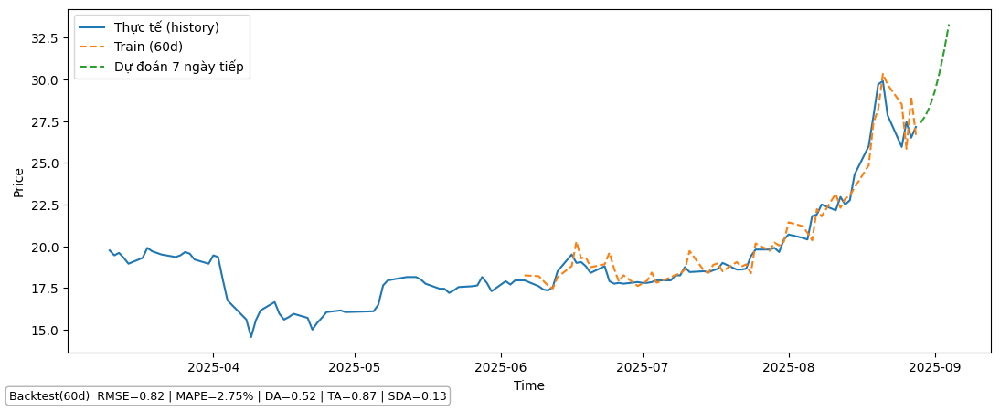

[ERROR] BSR: 'da'

=== CMC ===


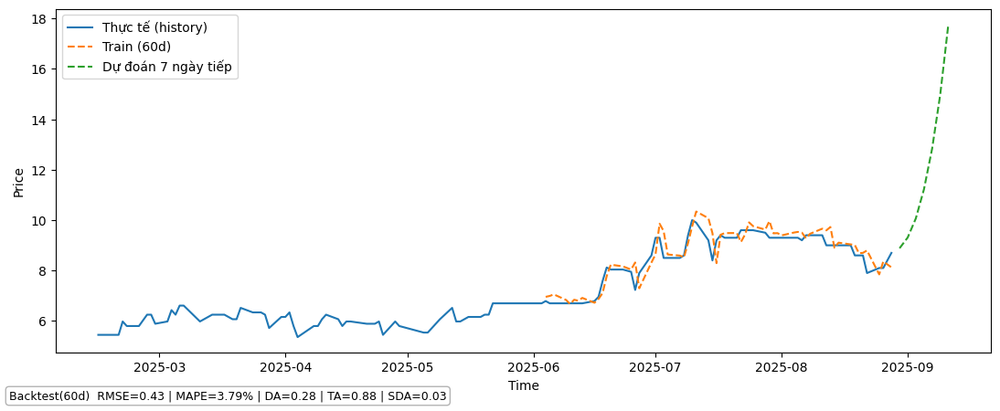

[ERROR] CMC: 'da'

=== ELC ===


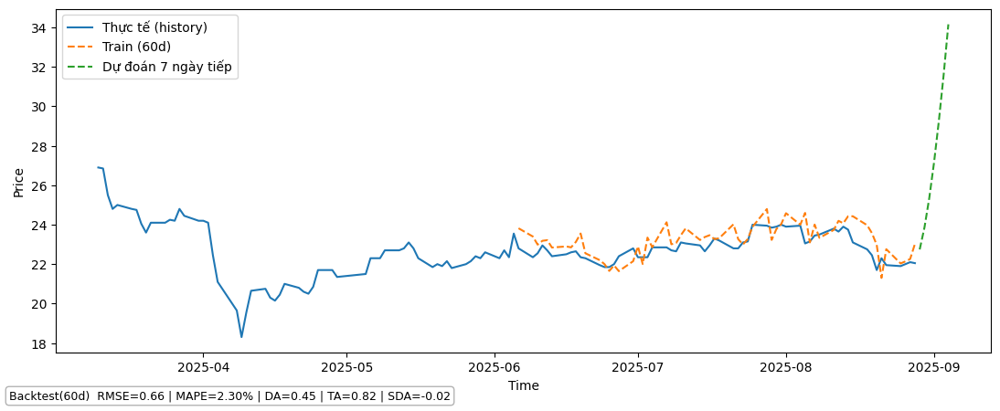

[ERROR] ELC: 'da'

=== FPT ===


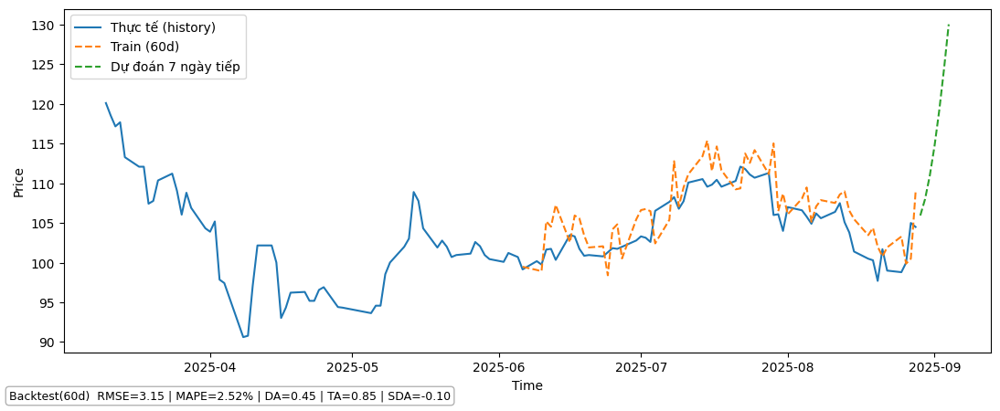

[ERROR] FPT: 'da'

=== GAS ===


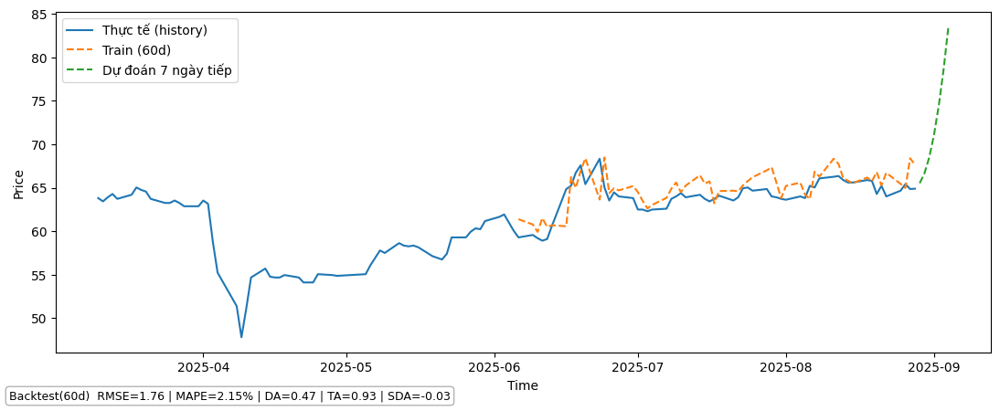

[ERROR] GAS: 'da'

=== ITC ===


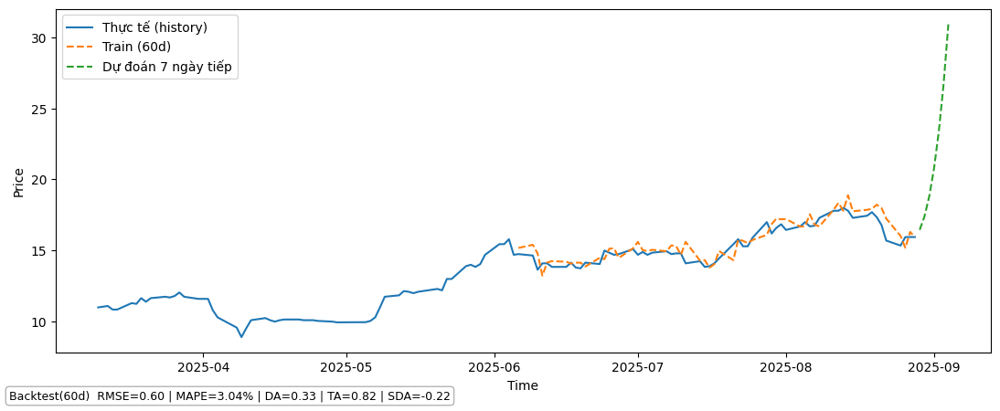

[ERROR] ITC: 'da'

=== OIL ===


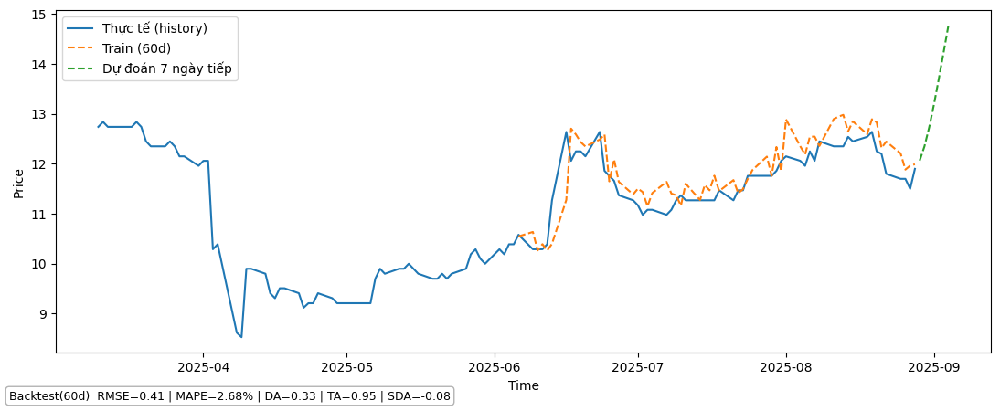

[ERROR] OIL: 'da'

=== PLX ===


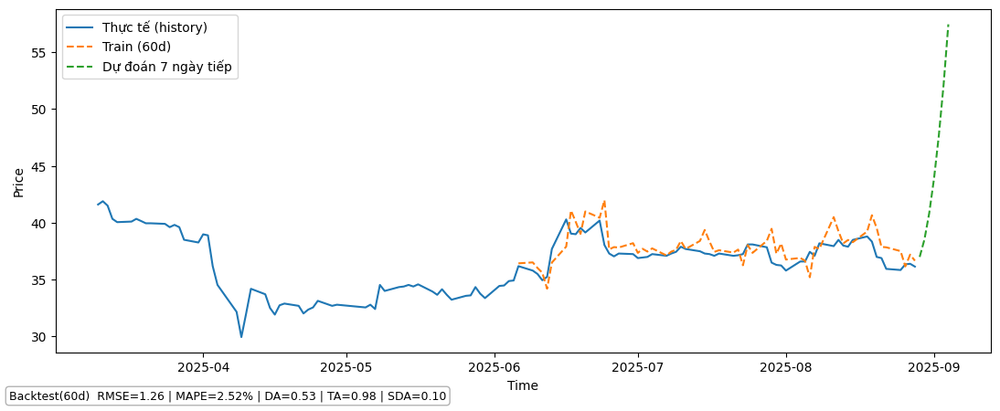

[ERROR] PLX: 'da'

=== PVG ===


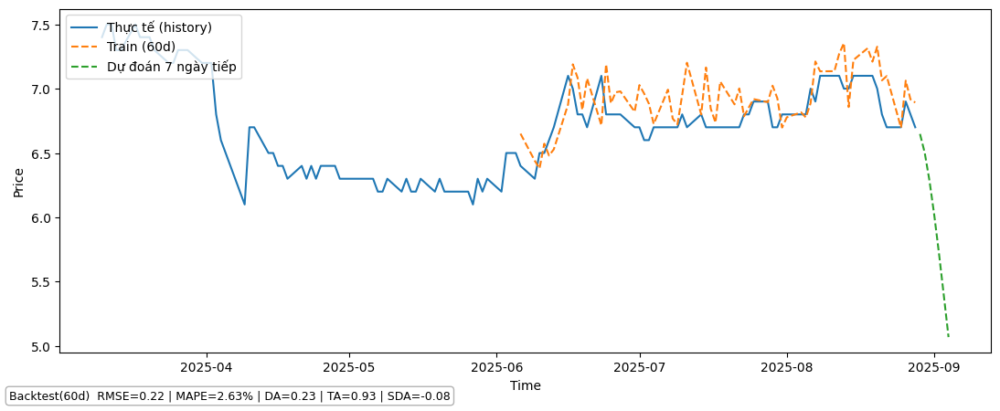

[ERROR] PVG: 'da'

=== SGT ===


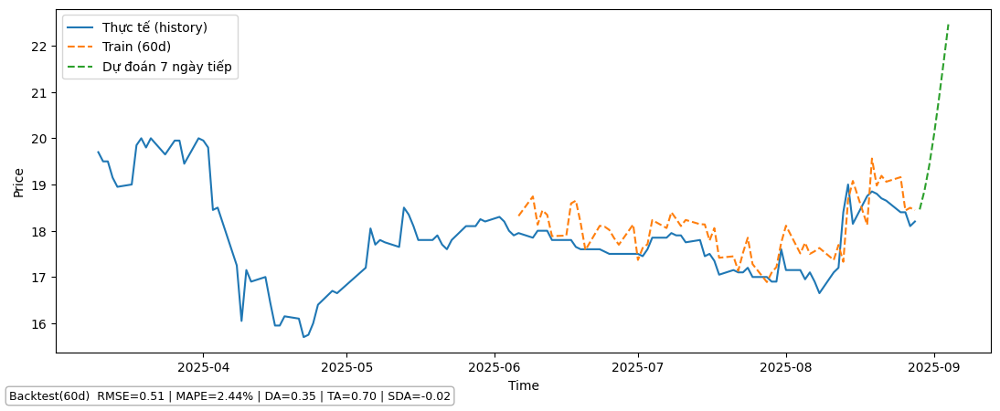

[ERROR] SGT: 'da'

=== VNZ ===


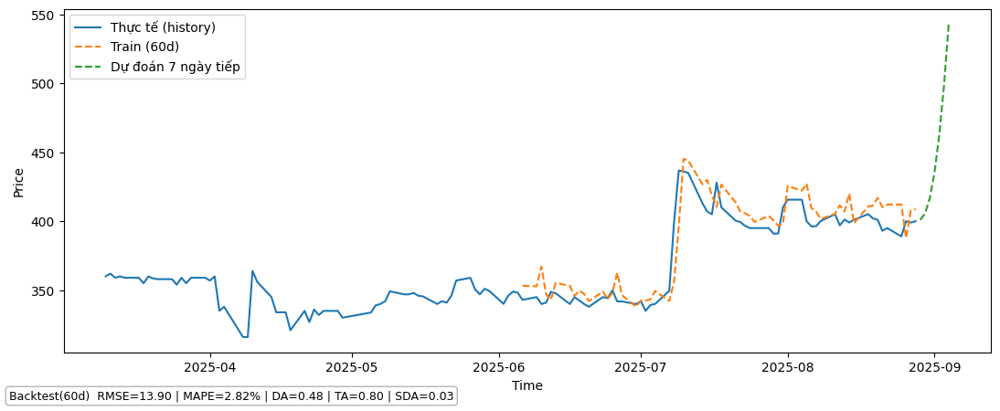

[ERROR] VNZ: 'da'


,symbol,days,rmse,mape
8,PVG,60,0.221892,2.632466
6,OIL,60,0.406361,2.682428
1,CMC,60,0.428576,3.791260
9,SGT,60,0.508104,2.443171
5,ITC,60,0.600000,3.040683


In [ ]:
# =======================
# 0) IMPORTS & GUARDS
# =======================
import os, json, joblib
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from keras import layers
from keras import ops as K
from keras.models import load_model
from IPython.display import display

# ---- Guard: df và preprocess phải có
try:
    df
except NameError:
    raise NameError("Biến df chưa tồn tại. Hãy chuẩn bị DataFrame df trước khi chạy cell này.")
assert "symbol" in df.columns, "DataFrame df cần có cột 'symbol'."

try:
    preprocess_multisymbol_df_nosent
except NameError:
    raise NameError("Chưa thấy hàm preprocess_multisymbol_df_nosent(...). Hãy chạy cell định nghĩa hàm đó trước.")

# =======================
# 1) CUSTOM LAYERS & LOADER & FEATURE ALIGN
# =======================
class Sampling(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        eps = tf.random.normal(shape=K.shape(mu))
        return mu + K.exp(0.5 * logvar) * eps

class KLDivergenceLayer(layers.Layer):
    def __init__(self, beta=0.5, **kwargs):
        super().__init__(**kwargs); self.beta = beta
    def call(self, inputs):
        mu, logvar = inputs
        kl_per = -0.5 * K.sum(1 + logvar - K.square(mu) - K.exp(logvar), axis=1)
        self.add_loss(self.beta * K.mean(kl_per))
        return inputs

def load_best_artifacts(best_dir: str):
    """Trả về (model, scaler, config) từ thư mục best_overall."""
    cfg_path = os.path.join(best_dir, "config.json")
    scl_path = os.path.join(best_dir, "x_scaler.pkl")
    model_path = os.path.join(best_dir, "best_vae.keras")
    if not os.path.exists(model_path):
        model_path = os.path.join(best_dir, "final_vae.keras")
    if not (os.path.exists(cfg_path) and os.path.exists(scl_path) and os.path.exists(model_path)):
        raise FileNotFoundError(f"Thiếu file trong {best_dir}: config.json / x_scaler.pkl / best_vae.keras|final_vae.keras")
    config = json.load(open(cfg_path, "r"))
    scaler = joblib.load(scl_path)
    model = load_model(
        model_path,
        custom_objects={"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer},
        compile=False
    )
    return model, scaler, config

def align_features_for_infer(df_clean: pd.DataFrame, config: dict):
    """Đảm bảo df có đủ các cột trong config['feature_cols'] theo đúng thứ tự."""
    feature_cols = list(config.get("feature_cols", []))
    missing = [c for c in feature_cols if c not in df_clean.columns]
    for c in missing:
        df_clean[c] = 0.0
    df_clean[feature_cols] = df_clean[feature_cols].astype("float32")
    return df_clean, feature_cols

# =======================
# 2) PREPROCESS ADAPTER (4-tuple -> 3-tuple)
# =======================
def preprocess_multisymbol_df_adapter(df_raw,
                                      use_symbol_onehot: bool = True,
                                      clip_abs: float = 1e12):
    """
    Adapter để khớp các code infer kỳ vọng (df, feature_cols, y_col).
    Gốc *_nosent trả (df, feature_cols, symbol_onehot_cols, y_col).
    """
    df_prep, feature_cols, symbol_onehot_cols, y_col = preprocess_multisymbol_df_nosent(
        df_raw=df_raw,
        use_symbol_onehot=use_symbol_onehot,
        clip_abs=clip_abs,
    )
    return df_prep, feature_cols, y_col

# Alias theo tên code bạn đang gọi
preprocess_multisymbol_df = preprocess_multisymbol_df_adapter

# =======================
# 3) WINDOWING ADAPTER (dùng w=90 cho model yêu cầu 45)
# =======================
def make_windows(x_seq, seq_len=45, stride=None):
    """
    x_seq: np.array shape (T, F) hoặc (1, T, F)
    seq_len: độ dài chuỗi mà model yêu cầu (45)
    stride: bước trượt (None -> tạo 2 cửa sổ không chồng lấn khi T=2*seq_len)
    return: np.array shape (N, seq_len, F)
    """
    x = np.asarray(x_seq)
    if x.ndim == 3:
        assert x.shape[0] == 1, f"Adapter hiện chỉ hỗ trợ batch=1, shape={x.shape}"
        x = x[0]
    assert x.ndim == 2, f"Expect (T,F) sau khi bỏ batch, hiện tại: {x.shape}"
    T, F = x.shape
    if T < seq_len:
        pad_len = seq_len - T
        pad_block = np.repeat(x[:1, :], pad_len, axis=0)
        x = np.concatenate([pad_block, x], axis=0)
        T = seq_len
    if T == seq_len:
        return x[None, :, :]
    if stride is None:
        starts = [T - 2*seq_len, T - seq_len]
        starts = [s for s in starts if s >= 0]
    else:
        starts = list(range(0, T - seq_len + 1, stride))
        if (T - seq_len) not in starts:
            starts.append(T - seq_len)
    windows = [x[s:s+seq_len, :] for s in starts]
    return np.stack(windows, axis=0)

def predict_seq_adapter(model, X_seq, seq_len_model=45, stride=None, agg_mode="mean", H=None):
    """
    - Tạo các cửa sổ (N, seq_len_model, F) từ chuỗi X_seq có T != seq_len_model
    - model.predict -> output có thể là:
        (N, H, D)  -> H là số bước dự báo
        (N, D)     -> 1-step
        (N,)       -> 1-step scalar
        (N, seq_len_model, D) -> theo time của encoder; lấy step cuối
    - Gộp theo trục N (các cửa sổ), GIỮ nguyên chiều H nếu có.
    """
    X_win = make_windows(X_seq, seq_len=seq_len_model, stride=stride)  # (N, L, F)
    y_pred = model.predict(X_win, verbose=0)
    y = np.asarray(y_pred)

    def _agg0(arr):
        if agg_mode == "mean":
            return arr.mean(axis=0)
        if agg_mode == "median":
            return np.median(arr, axis=0)
        if agg_mode == "last":
            return arr[-1]
        if agg_mode == "weighted_tail":
            w = np.arange(1, arr.shape[0]+1, dtype=np.float32); w = w / w.sum()
            return (arr * w.reshape((-1,) + (1,)*(arr.ndim-1))).sum(axis=0)
        raise ValueError("Unknown aggregate mode")

    if y.ndim == 3:
        N, T2, D = y.shape
        if H is not None and T2 == H:
            return _agg0(y)         # (H, D)
        if T2 == seq_len_model:
            return _agg0(y[:, -1, :])  # (D,)
        if H is None:
            return _agg0(y)         # (T2, D)
        return _agg0(y[:, -1, :])   # fallback
    if y.ndim == 2:
        return _agg0(y)             # (D,)
    if y.ndim == 1:
        return float(_agg0(y))      # scalar
    raise ValueError(f"Không rõ format output: shape={y.shape}")

# =======================
# 4) METRICS (fallback nếu bạn chưa có)
# =======================
def compute_rmse_mape(y_true, y_pred, eps=1e-12):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    rmse = float(np.sqrt(np.mean((y_pred - y_true)**2)))
    mape = float(np.mean(np.abs((y_pred - y_true) / (y_true + eps))) * 100.0)
    return rmse, mape

def _direction(x1, x0):
    return np.sign(x1 - x0)

def compute_da(y_true, y_pred, p0):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    true_dir = _direction(y_true, np.r_[p0, y_true[:-1]])
    pred_dir = _direction(y_pred, np.r_[p0, y_pred[:-1]])
    return float(np.mean(true_dir == pred_dir))

def compute_ta(y_true, y_pred, p0):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    true_dir = np.sign(y_true - p0)
    pred_dir = np.sign(y_pred - p0)
    return float(np.mean(true_dir == pred_dir))

def compute_sda(y_true, y_pred, p0):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    s_true = np.sign(y_true - np.r_[p0, y_true[:-1]])
    s_pred = np.sign(y_pred - np.r_[p0, y_pred[:-1]])
    return float(np.mean(s_true * s_pred))

# =======================
# 5) INFER 1 SYMBOL (hỗ trợ W=90 & model=45)
# =======================
def infer_backtest_and_future_symbol(
    df_raw,
    symbol,
    best_dir,
    preprocess_fn,
    lookback_hist_plot=120,  # số ngày lịch sử vẽ
    backtest_days=60         # số ngày dùng để backtest liên tục
):
    # 1) Nạp artifacts và config
    vae, scaler, config = load_best_artifacts(best_dir)
    W_cfg = int(config.get("W", 90))  # bạn muốn dùng w=90
    H = int(config.get("H", 7))
    TARGET_COL = config.get("TARGET_COL", "close")

    # Tìm seq_len model thực tế (thường 45)
    try:
        SEQ_LEN_MODEL = int(vae.input_shape[1])
    except Exception:
        SEQ_LEN_MODEL = 45

    # 2) Tiền xử lý
    df_clean, feature_cols, y_col = preprocess_fn(df_raw, use_symbol_onehot=True)
    df_clean, feature_cols = align_features_for_infer(df_clean, config)

    # 3) Lọc 1 symbol
    dfg = df_clean[df_clean["symbol"] == symbol].sort_values("time").reset_index(drop=True).copy()
    if len(dfg) < (W_cfg + backtest_days + 1):
        raise ValueError(f"{symbol}: cần >= {W_cfg + backtest_days + 1} dòng, hiện có {len(dfg)}")

    # 4) Scale
    X_all = scaler.transform(dfg[feature_cols].to_numpy(dtype="float32", copy=False))
    prices = dfg[TARGET_COL].to_numpy(dtype="float64", copy=False)
    times  = pd.to_datetime(dfg["time"])

    # 5) Walk-forward 1-step stitched trên 'backtest_days'
    start_bt_idx = len(dfg) - backtest_days
    if start_bt_idx - W_cfg < 0:
        start_bt_idx = W_cfg

    pred_bt_1step = []
    for t in range(start_bt_idx, len(dfg)):
        s = t - W_cfg
        e = t
        if s < 0:
            pred_bt_1step.append(np.nan); continue
        window = X_all[s:e]  # (W_cfg, F)

        if W_cfg == SEQ_LEN_MODEL:
            y_pred_full = vae.predict(window[np.newaxis], verbose=0)
            y_arr = np.asarray(y_pred_full)
            if y_arr.ndim == 3:      # (1, H, D)
                pred_rets = y_arr[0, :, 0]
            elif y_arr.ndim == 2:    # (1, D)
                pred_rets = y_arr[0, :]
            else:                    # (1,)
                pred_rets = np.atleast_1d(y_arr[0])
        else:
            y_agg = predict_seq_adapter(
                vae, window, seq_len_model=SEQ_LEN_MODEL,
                stride=None, agg_mode="mean", H=H
            )
            y_agg = np.asarray(y_agg)
            if y_agg.ndim == 2 and y_agg.shape[0] == H:
                pred_rets = y_agg[:, 0]
            elif y_agg.ndim == 1:
                pred_rets = y_agg
            else:
                pred_rets = np.atleast_1d(float(y_agg))

        p0 = float(prices[e-1])
        p1 = p0 * np.exp(float(pred_rets[0]))  # 1-step ahead
        pred_bt_1step.append(p1)

    pred_bt_1step = np.array(pred_bt_1step, dtype="float64")
    actual_bt = prices[start_bt_idx:]
    times_bt  = times[start_bt_idx:]

    # 6) Metrics
    valid_idx = np.isfinite(pred_bt_1step)
    actual_eval = actual_bt[valid_idx]
    pred_eval   = pred_bt_1step[valid_idx]
    if not np.any(valid_idx):
        raise RuntimeError(f"{symbol}: không có điểm dự báo hợp lệ trong backtest.")
    first_valid_pos = int(np.flatnonzero(valid_idx)[0])
    p0 = float(prices[start_bt_idx + first_valid_pos - 1])

    rmse_bt, mape_bt = compute_rmse_mape(actual_eval, pred_eval)
    da_bt  = compute_da(actual_eval, pred_eval, p0=p0)
    ta_bt  = compute_ta(actual_eval, pred_eval, p0=p0)
    sda_bt = compute_sda(actual_eval, pred_eval, p0=p0)
    metrics_txt = f"Backtest({len(actual_eval)}d)  RMSE={rmse_bt:.2f} | MAPE={mape_bt:.2f}% | DA={da_bt:.2f} | TA={ta_bt:.2f} | SDA={sda_bt:.2f}"

    # 7) Forecast H ngày tương lai từ đoạn cuối W_cfg (giữ đúng độ dài H)
    last_window = X_all[-W_cfg:]  # (W_cfg, F)
    if W_cfg == SEQ_LEN_MODEL:
        y_pred_fut = vae.predict(last_window[np.newaxis], verbose=0)
        y_arr = np.asarray(y_pred_fut)
        if y_arr.ndim == 3:          # (1, H, D)
            pred_rets_fut = y_arr[0, :, 0]
        elif y_arr.ndim == 2:        # (1, D) -> nếu D==H coi như H-step; ngược lại 1-step
            pr = y_arr[0, :]
            pred_rets_fut = pr if pr.shape[0] == H else np.repeat(pr[-1], H)
        else:                         # (1,)
            pred_rets_fut = np.repeat(float(y_arr[0]), H)
    else:
        y_agg_fut = predict_seq_adapter(
            vae, last_window, seq_len_model=SEQ_LEN_MODEL,
            stride=None, agg_mode="mean", H=H
        )
        y_agg_fut = np.asarray(y_agg_fut)
        if y_agg_fut.ndim == 2 and y_agg_fut.shape[0] == H:
            pred_rets_fut = y_agg_fut[:, 0]
        elif y_agg_fut.ndim == 1:
            pred_rets_fut = y_agg_fut if y_agg_fut.shape[0] == H else np.repeat(y_agg_fut[-1], H)
        else:
            pred_rets_fut = np.repeat(float(np.ravel(y_agg_fut)[-1]), H)

    last_price = float(prices[-1])
    pred_future = [last_price]
    for r in pred_rets_fut[:H]:
        pred_future.append(pred_future[-1] * np.exp(float(r)))
    pred_future = np.array(pred_future[1:], dtype="float64")  # (H,)

    # thời gian tương lai
    if len(times) >= 2:
        freq = times.iloc[-1] - times.iloc[-2]
        if freq <= pd.Timedelta(0): freq = pd.Timedelta(days=1)
    else:
        freq = pd.Timedelta(days=1)
    fut_times = [times.iloc[-1] + (i+1)*freq for i in range(H)]  # (H,)

    # 8) Plot
    hist_start = max(0, len(dfg) - lookback_hist_plot)
    plt.figure(figsize=(11, 4.5))
    plt.plot(times.iloc[hist_start:], prices[hist_start:], label="Thực tế (history)")
    plt.plot(times_bt[valid_idx], pred_bt_1step[valid_idx], linestyle="--", label=f"Train ({len(actual_eval)}d)")
    # plt.scatter([times.iloc[-1]], [last_price], s=30, label="Last observed", zorder=3)
    plt.plot(fut_times, pred_future, linestyle="--", label=f"Dự đoán 7 ngày tiếp")
    # plt.title(f"{symbol} | Walk-forward backtest + {H}-step forecast (W={W_cfg} )")
    plt.xlabel("Time"); plt.ylabel("Price")
    plt.legend(loc="upper left")
    plt.gcf().text(0.01, 0.01, metrics_txt, fontsize=9, ha='left', va='bottom',
                   bbox=dict(boxstyle="round", fc="w", ec="0.7"))
    plt.tight_layout()
    plt.show()

    # 9) Kết quả
    df_bt = pd.DataFrame({"time": times_bt.values, "actual": actual_bt, "pred_1step": pred_bt_1step})
    df_fut = pd.DataFrame({"time": fut_times, "pred_price": pred_future})
    return {
        "backtest_df": df_bt,
        "future_df": df_fut,
        "metrics_backtest": {
            "days": int(len(actual_eval)),
            "rmse": float(rmse_bt),
            "mape": float(mape_bt),

        }
    }

# =======================
# 6) CHẠY TOÀN BỘ SYMBOLS
# =======================
def infer_backtest_and_future_all_symbols(
    df_raw,
    best_dir,
    preprocess_fn,
    lookback_hist_plot=120,
    backtest_days=60
):
    results, rows = {}, []
    for sym in df_raw["symbol"].unique():
        try:
            print(f"\n=== {sym} ===")
            out = infer_backtest_and_future_symbol(
                df_raw=df_raw,
                symbol=sym,
                best_dir=best_dir,
                preprocess_fn=preprocess_fn,
                lookback_hist_plot=lookback_hist_plot,
                backtest_days=backtest_days
            )
            results[sym] = out
            m = out["metrics_backtest"]
            rows.append({"symbol": sym, **m})
            print(f"RMSE={m['rmse']:.2f} | MAPE={m['mape']:.2f}% | DA={m['da']:.2f} | TA={m['ta']:.2f} | SDA={m['sda']:.2f}")
        except Exception as e:
            print(f"[ERROR] {sym}: {e}")
    metrics_df = pd.DataFrame(rows)
    if not metrics_df.empty and "rmse" in metrics_df.columns:
        metrics_df = metrics_df.sort_values("rmse")
    return results, metrics_df

# =======================
# 7) DÙNG
# =======================
BEST_DIR = "/content/drive/MyDrive/kpdl/model_no_sentiment/best_overall"

all_results, metrics_df = infer_backtest_and_future_all_symbols(
    df_raw=df,
    best_dir=BEST_DIR,
    preprocess_fn=preprocess_multisymbol_df,  # alias -> adapter (3-tuple)
    lookback_hist_plot=120,
    backtest_days=60
)

display(metrics_df.head() if not metrics_df.empty else metrics_df)
# metrics_df.to_csv("/content/metrics_backtest_all_symbols.csv", index=False)


# So sánh với mô hình TCN

In [3]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/kpdl/preprocessed_data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14129 entries, 0 to 14128
Data columns (total 43 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   time                14129 non-null  object 
 1   open                14129 non-null  float64
 2   high                14129 non-null  float64
 3   low                 14129 non-null  float64
 4   close               14129 non-null  float64
 5   volume              14129 non-null  float64
 6   symbol              14129 non-null  object 
 7   p_neg               14129 non-null  float64
 8   p_neu               14129 non-null  float64
 9   p_pos               14129 non-null  float64
 10  has_news            14129 non-null  int64  
 11  ret1                14129 non-null  float64
 12  logret              14129 non-null  float64
 13  ret5                14129 non-null  float64
 14  ret20               14129 non-null  float64
 15  ema20               14129 non-null  float64
 16  ema6

# Train so sánh VAE và TCN

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RobustScaler 

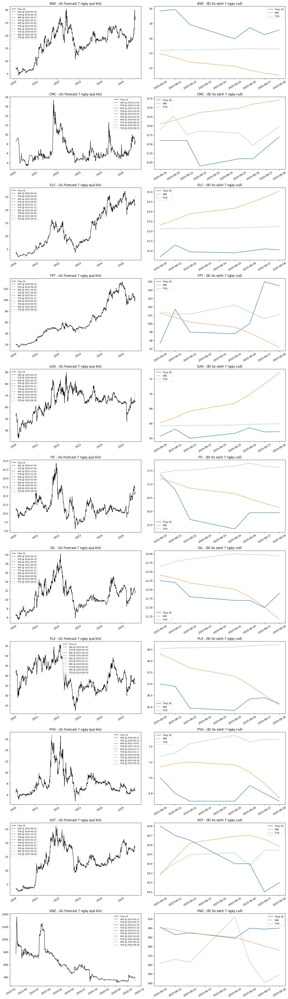

In [ ]:
# Giả sử df có cột "symbol"
symbols = df["symbol"].unique()

preds_by_symbol = {"vae": {}, "tcn": {}}
anchors_idx_by_symbol = {}

for sym in symbols:
    df_sym = df[df["symbol"] == sym].copy()
    X_sym, y_sym, df_use_sym = make_design_matrix(df_sym, feature_cols_cfg, TARGET_COL, W, H, x_scaler)
    prices_sym = df_use_sym[TARGET_COL].to_numpy(dtype=np.float32)

    X_feats_sym = align_features(df_use_sym, feature_cols_cfg)
    X_scaled_sym = x_scaler.transform(X_feats_sym).astype("float32")

    preds_vae_sym, anchors_vae = forecast_multi("vae", X_scaled_sym, prices_sym, W, H, horizon=7)
    preds_tcn_sym, anchors_tcn = forecast_multi("tcn", X_scaled_sym, prices_sym, W, H, horizon=7)

    preds_by_symbol["vae"][sym] = preds_vae_sym
    preds_by_symbol["tcn"][sym] = preds_tcn_sym
    anchors_idx_by_symbol[sym]  = anchors_vae

n_symbols = len(symbols)
fig, axes = plt.subplots(n_symbols, 2, figsize=(16, 5 * n_symbols), sharey=False)

if n_symbols == 1:
    axes = np.array([axes])  # để dễ index

for idx, sym in enumerate(symbols):
    df_sym = df[df["symbol"] == sym].copy()
    times_sym = pd.to_datetime(df_sym["time"]).to_numpy("datetime64[ns]")
    prices_sym = df_sym[TARGET_COL].to_numpy(dtype=np.float32)

    preds_vae_sym = preds_by_symbol["vae"][sym]
    preds_tcn_sym = preds_by_symbol["tcn"][sym]
    anchors_sym   = anchors_idx_by_symbol[sym]

    actual_future = prices_sym[-7:]
    pred_last_vae = preds_vae_sym[-1]
    pred_last_tcn = preds_tcn_sym[-1]

    # (A) nhiều mốc quá khứ
    k = 5
    ax0 = axes[idx, 0]
    idxs = np.linspace(0, len(anchors_sym)-1, k, dtype=int)
    ax0.plot(times_sym, prices_sym, color="black", linewidth=1.2, label="Thực tế")
    for i in idxs:
        t0 = anchors_sym[i]
        t_range = times_sym[t0:t0+7]
        ax0.plot(t_range, preds_vae_sym[i], "--", label=f"VAE @ {str(times_sym[t0])[:10]}")
        ax0.plot(t_range, preds_tcn_sym[i], ":",  label=f"TCN @ {str(times_sym[t0])[:10]}")
    ax0.set_title(f"{sym} - (A) Forecast 7 ngày quá khứ")
    ax0.legend(fontsize=8)
    ax0.tick_params(axis="x", rotation=30)

    # (B) 7 ngày cuối
    ax1 = axes[idx, 1]
    ax1.plot(times_sym[-7:], actual_future, label="Thực tế")
    ax1.plot(times_sym[-7:], pred_last_vae, "--", label="VAE")
    ax1.plot(times_sym[-7:], pred_last_tcn, ":", label="TCN")
    ax1.set_title(f"{sym} - (B) So sánh 7 ngày cuối")
    ax1.legend(fontsize=9)
    ax1.tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()



In [4]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

# ==== tiện ích ====
def to_numpy_time(s):
    return pd.to_datetime(s).to_numpy("datetime64[ns]")

def mape_safe(y_true, y_pred, eps=1e-9):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.mean(np.abs((y_true - y_pred) / np.clip(np.abs(y_true), eps, None))) * 100.0)

def one_step_series(model_kind, X_scaled, prices, W, start_idx, end_idx):
    """
    Trả về chuỗi dự báo 1-step từ start_idx..end_idx-1 (cùng chiều với y thực).
    Với mỗi t: dùng cửa sổ [t-W, t) -> dự báo giá t (h=1).
    """
    preds = []
    for t in range(start_idx, end_idx):
        window = X_scaled[t - W:t]              # (W, F)
        p0 = float(prices[t - 1])               # giá ngày t-1
        if model_kind == "vae":
            rets = vae.predict(window[None, ...], verbose=0)[0, :, 0]  # (H,)
            r1 = float(rets[0])
        elif model_kind == "tcn":
            rets = baseline2.predict(window[None, ...], verbose=0)[0]  # (H,)
            r1 = float(rets[0])
        else:
            raise ValueError("model_kind phải là 'vae' hoặc 'tcn'")
        preds.append(p0 * np.exp(r1))
    return np.asarray(preds, dtype=np.float32)

# ==== tham số / cột ====
W  = int(cfg["W"])
H  = int(cfg["H"])
TARGET_COL       = cfg["TARGET_COL"]
feature_cols_cfg = list(cfg["feature_cols"])

# ==== vẽ theo kiểu: mỗi symbol một biểu đồ đơn ====
symbols = df["symbol"].unique().tolist()
last_n_days = 7  # đúng như hình đầu tiên; có thể đổi

n = len(symbols)
fig, axes = plt.subplots(n, 1, figsize=(14, 3.8 * n), sharex=False)
if n == 1:
    axes = np.array([axes])

for i, sym in enumerate(symbols):
    dfg = df[df["symbol"] == sym].sort_values("time").reset_index(drop=True).copy()

    # Căn chỉnh & scale đặc trưng giống lúc train
    X_feats = align_features(dfg, feature_cols_cfg)
    X_scaled = x_scaler.transform(X_feats).astype("float32")
    times = to_numpy_time(dfg["time"])
    prices = dfg[TARGET_COL].to_numpy(dtype=np.float32)

    # Chọn vùng 30 ngày cuối (đảm bảo có đủ W ngày trước đó)
    end_idx = len(dfg)                      # độc quyền
    start_idx = max(W, end_idx - last_n_days)
    if end_idx - start_idx <= 1:
        axes[i].text(0.5, 0.5, f"{sym}: không đủ dữ liệu", ha="center", va="center")
        continue

    # Thực tế và mốc thời gian để vẽ
    y_true = prices[start_idx:end_idx]
    t_true = times[start_idx:end_idx]

    # Dự báo 1-step (h=1) cho VAE và TCN
    y_pred_vae = one_step_series("vae", X_scaled, prices, W, start_idx, end_idx)
    y_pred_tcn = one_step_series("tcn", X_scaled, prices, W, start_idx, end_idx)

    # Metrics trên cùng khoảng
    rmse_vae = float(np.sqrt(np.mean((y_pred_vae - y_true) ** 2)))
    mape_vae = mape_safe(y_true, y_pred_vae)
    rmse_tcn = float(np.sqrt(np.mean((y_pred_tcn - y_true) ** 2)))
    mape_tcn = mape_safe(y_true, y_pred_tcn)

    # Vẽ giống “hình 1”: 1 panel với 3 đường
    ax = axes[i]
    ax.plot(t_true, y_true, label="Thực tế (30 ngày)")
    ax.plot(t_true, y_pred_vae, "--", label=f"VAE seq2seq (h=1) | RMSE={rmse_vae:.4f} | MAPE={mape_vae:.2f}%")
    ax.plot(t_true, y_pred_tcn, ":",  label=f"TCN (h=1) | RMSE={rmse_tcn:.4f} | MAPE={mape_tcn:.2f}%")
    ax.set_title(sym)
    ax.legend(loc="best", fontsize=9)
    ax.tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()


NameError: name 'cfg' is not defined

TCN

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14129 entries, 0 to 14128
Data columns (total 43 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   time                14129 non-null  object 
 1   open                14129 non-null  float64
 2   high                14129 non-null  float64
 3   low                 14129 non-null  float64
 4   close               14129 non-null  float64
 5   volume              14129 non-null  float64
 6   symbol              14129 non-null  object 
 7   p_neg               14129 non-null  float64
 8   p_neu               14129 non-null  float64
 9   p_pos               14129 non-null  float64
 10  has_news            14129 non-null  int64  
 11  ret1                14129 non-null  float64
 12  logret              14129 non-null  float64
 13  ret5                14129 non-null  float64
 14  ret20               14129 non-null  float64
 15  ema20               14129 non-null  float64
 16  ema6

In [10]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models

# =========================
# 1. Build TCN model
# =========================
def build_tcn_model(input_shape, H=7, num_filters=64, kernel_size=3, dilations=[1,2,4,8], dropout=0.1):
    inputs = layers.Input(shape=input_shape)  # (W, F)

    x = inputs
    for d in dilations:
        x_skip = x
        x = layers.Conv1D(filters=num_filters,
                          kernel_size=kernel_size,
                          dilation_rate=d,
                          padding="causal",
                          activation="relu")(x)
        x = layers.Dropout(dropout)(x)
        # residual
        if x_skip.shape[-1] != x.shape[-1]:
            x_skip = layers.Conv1D(filters=num_filters, kernel_size=1, padding="same")(x_skip)
        x = layers.Add()([x, x_skip])
        x = layers.Activation("relu")(x)

    # Pooling
    x = layers.GlobalAveragePooling1D()(x)
    outputs = layers.Dense(H, activation="linear")(x)  # Dự báo 7 bước

    model = models.Model(inputs, outputs)
    return model


# =========================
# 2. Tạo dataset (X,y)
# =========================
def make_xy_from_df(df_symbol, feature_cols, W=90, H=7, target_col="logret"):
    X, y = [], []
    feats = df_symbol[feature_cols].to_numpy(dtype="float32")
    rets  = df_symbol[target_col].to_numpy(dtype="float32")

    for t in range(W, len(df_symbol) - H):
        X.append(feats[t-W:t])
        y.append(rets[t:t+H])
    return np.array(X), np.array(y)


# =========================
# 3. Chuẩn bị dữ liệu
# =========================
# giả sử df là DataFrame bạn đã load
df["time"] = pd.to_datetime(df["time"])
df = df.sort_values(["symbol", "time"]).reset_index(drop=True)

# Chọn feature columns (bỏ các cột non-numeric và target/logret)
exclude_cols = ["time", "symbol", "target", "logret"]  # logret chỉ dùng làm y
feature_cols = [c for c in df.columns if c not in exclude_cols]

W, H = 90, 7
X_all, y_all = [], []

for sym in df["symbol"].unique():
    dfg = df[df["symbol"] == sym].sort_values("time").reset_index(drop=True)
    X_sym, y_sym = make_xy_from_df(dfg, feature_cols, W=W, H=H, target_col="logret")
    if len(X_sym) > 0:
        X_all.append(X_sym)
        y_all.append(y_sym)

X_all = np.concatenate(X_all, axis=0)
y_all = np.concatenate(y_all, axis=0)

print("Dataset:", X_all.shape, y_all.shape)  # (N, 90, F), (N, 7)


# =========================
# 4. Train/test split
# =========================
N = len(X_all)
train_size = int(0.8 * N)

X_train, y_train = X_all[:train_size], y_all[:train_size]
X_test,  y_test  = X_all[train_size:], y_all[train_size:]

print("Train:", X_train.shape, y_train.shape)
print("Test:", X_test.shape, y_test.shape)


# =========================
# 5. Build & train model
# =========================
tcn_model = build_tcn_model(input_shape=(W, len(feature_cols)), H=H)

tcn_model.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
                  loss="mse",
                  metrics=["mae"])

history = tcn_model.fit(
    X_train, y_train,
    batch_size=64,
    epochs=10,
    validation_data=(X_test, y_test),
    shuffle=True
)

# =========================
# 6. Save model
# =========================
BEST_DIR = "./models"
os.makedirs(BEST_DIR, exist_ok=True)
tcn_model.save(os.path.join(BEST_DIR, "best_tcn.keras"))
print("✅ Model saved to", os.path.join(BEST_DIR, "best_tcn.keras"))


Dataset: (13062, 90, 39) (13062, 7)
Train: (10449, 90, 39) (10449, 7)
Test: (2613, 90, 39) (2613, 7)
Epoch 1/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - loss: 231240253440.0000 - mae: 130401.5469 - val_loss: 10557671.0000 - val_mae: 2084.9736
Epoch 2/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 33s 201ms/step - loss: 1692431872.0000 - mae: 19170.8691 - val_loss: 13969304.0000 - val_mae: 2259.5869
Epoch 3/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 35s 211ms/step - loss: 1531661824.0000 - mae: 17907.0977 - val_loss: 5916347.5000 - val_mae: 1575.9930
Epoch 4/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 33s 200ms/step - loss: 1376864000.0000 - mae: 17035.3008 - val_loss: 11695148.0000 - val_mae: 1723.0262
Epoch 5/10
 37/164 ━━━━━━━━━━━━━━━━━━━━ 22s 176ms/step - loss: 990328256.0000 - mae: 14366.2725

KeyboardInterrupt: 

In [7]:
import numpy as np

def make_xy_from_df(df_symbol, feature_cols, W=90, H=7, target_col="logret"):
    """
    Tạo dữ liệu (X,y) cho 1 symbol.
    - X: (N, W, F)
    - y: (N, H)
    """
    X, y = [], []
    feats = df_symbol[feature_cols].to_numpy(dtype="float32")
    rets  = df_symbol[target_col].to_numpy(dtype="float32")

    for t in range(W, len(df_symbol) - H):
        X.append(feats[t-W:t])
        y.append(rets[t:t+H])
    return np.array(X), np.array(y)

# Gộp tất cả symbols
X_all, y_all = [], []
for sym in df["symbol"].unique():
    dfg = df[df["symbol"] == sym].sort_values("time").reset_index(drop=True)
    X_sym, y_sym = make_xy_from_df(dfg, feature_cols_cfg, W=90, H=7, target_col="logret")
    if len(X_sym) > 0:
        X_all.append(X_sym); y_all.append(y_sym)

X_all = np.concatenate(X_all, axis=0)
y_all = np.concatenate(y_all, axis=0)

print("Dataset:", X_all.shape, y_all.shape)  # (N,90,F), (N,7)


KeyError: "['sym_BSR', 'sym_CMC', 'sym_ELC', 'sym_FPT', 'sym_GAS', 'sym_ITC', 'sym_OIL', 'sym_PLX', 'sym_PVG', 'sym_SGT', 'sym_VNZ'] not in index"

Dataset TCN: (13062, 90, 35) (13062, 7)
Training TCN ...
Epoch 1/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 42s 212ms/step - loss: 78.3281 - mae: 1.4350 - val_loss: 4.1241 - val_mae: 0.7991
Epoch 2/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 35s 214ms/step - loss: 1.1118 - mae: 0.2330 - val_loss: 2.4829 - val_mae: 0.6154
Epoch 3/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 33s 203ms/step - loss: 0.7730 - mae: 0.1973 - val_loss: 1.7696 - val_mae: 0.5166
Epoch 4/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 33s 200ms/step - loss: 0.5498 - mae: 0.1694 - val_loss: 1.5390 - val_mae: 0.4718
Epoch 5/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.3739 - mae: 0.1373 - val_loss: 1.1889 - val_mae: 0.4002
Epoch 6/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.3764 - mae: 0.1356 - val_loss: 1.3024 - val_mae: 0.4148
Epoch 7/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.3198 - mae: 0.1287 - val_loss: 0.8051 - val_mae: 0.3430
Epoch 8/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.2590 - mae: 0.1193 - val_loss:

TypeError: only length-1 arrays can be converted to Python scalars

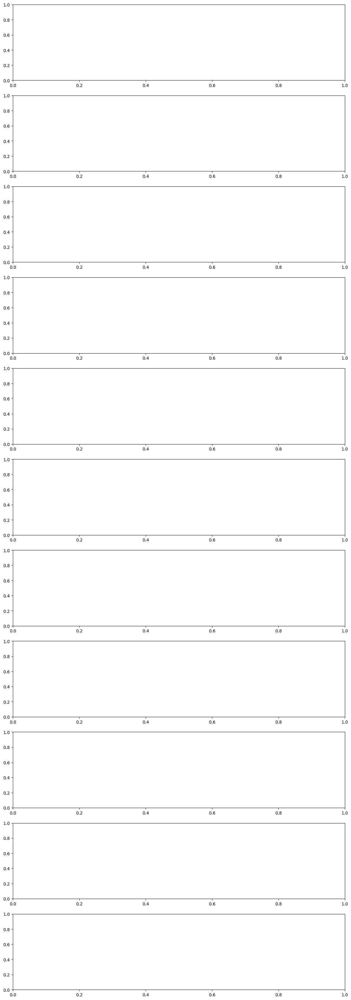

In [23]:
# =================== SETUP ===================
import os, json, joblib
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from keras import layers
from keras import ops as K
from keras.models import load_model
from IPython.display import display

# ---- Guard df
try:
    df
except NameError:
    raise NameError("Cần biến df trước khi chạy. df phải có cột 'symbol','time' và TARGET_COL.")
assert {"symbol","time"}.issubset(df.columns), "df phải có cột 'symbol' và 'time'."

# ---- Thư mục VAE
BEST_DIR = "/content/drive/MyDrive/kpdl/model_turning/seq2seq_vae_tuning_multisymbol/best_overall"
# =================== TRAIN / LOAD TCN ===================
from tensorflow.keras import layers, models

def build_tcn_model(input_shape, H=7, num_filters=64, kernel_size=3, dilations=[1,2,4,8], dropout=0.1):
    """TCN đơn giản với residual block."""
    inputs = layers.Input(shape=input_shape)
    x = inputs
    for d in dilations:
        x_skip = x
        x = layers.Conv1D(filters=num_filters,
                          kernel_size=kernel_size,
                          dilation_rate=d,
                          padding="causal",
                          activation="relu")(x)
        x = layers.Dropout(dropout)(x)
        # Residual
        if x_skip.shape[-1] != x.shape[-1]:
            x_skip = layers.Conv1D(filters=num_filters, kernel_size=1, padding="same")(x_skip)
        x = layers.Add()([x, x_skip])
        x = layers.Activation("relu")(x)
    x = layers.GlobalAveragePooling1D()(x)
    outputs = layers.Dense(H, activation="linear")(x)
    return models.Model(inputs, outputs)

# ----- Chuẩn bị dữ liệu để train TCN -----
# ----- Chuẩn bị dữ liệu để train TCN -----
def make_xy_from_df(df_symbol, feature_cols, x_scaler, W=90, H=7, target_col="logret"):
    X, y = [], []
    df2 = df_symbol.copy()
    # Bổ sung cột thiếu = 0.0
    miss = [c for c in feature_cols if c not in df2.columns]
    for c in miss:
        df2[c] = 0.0
    feats = df2[feature_cols].astype("float32").to_numpy(copy=False)
    feats_scaled = x_scaler.transform(feats)   # ✅ scale input giống VAE
    rets  = df2[target_col].astype("float32").to_numpy(copy=False)
    for t in range(W, len(df2) - H):
        X.append(feats_scaled[t-W:t])
        y.append(rets[t:t+H])
    return np.array(X), np.array(y)

# ----- Gom dữ liệu đa symbol -----
X_all, y_all = [], []
for sym in df["symbol"].unique():
    dfg = df[df["symbol"] == sym].sort_values("time").reset_index(drop=True)
    X_sym, y_sym = make_xy_from_df(dfg, feature_cols_cfg, x_scaler, W=W, H=H, target_col="logret")
    if len(X_sym) > 0:
        X_all.append(X_sym); y_all.append(y_sym)

if len(X_all) == 0:
    raise ValueError("Không tạo được dữ liệu train cho TCN.")

X_all = np.concatenate(X_all, axis=0)
y_all = np.concatenate(y_all, axis=0)

print("Dataset TCN:", X_all.shape, y_all.shape)

# ----- Train/test split -----
N = len(X_all)
train_size = int(0.8 * N)
X_train, y_train = X_all[:train_size], y_all[:train_size]
X_test,  y_test  = X_all[train_size:], y_all[train_size:]

# ----- Build & train TCN -----
baseline2 = build_tcn_model(input_shape=(W, len(feature_cols_cfg)), H=H)
baseline2.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
                  loss="mse", metrics=["mae"])

print("Training TCN ...")
baseline2.fit(X_train, y_train,
              batch_size=64,
              epochs=10,
              validation_data=(X_test, y_test),
              shuffle=True)


# Lưu model TCN
TCN_DIR = "/content/drive/MyDrive/kpdl/model_turning/tcn_multisymbol"
os.makedirs(TCN_DIR, exist_ok=True)
baseline2.save(os.path.join(TCN_DIR, "best_tcn.keras"))
print("✅ Đã train xong và lưu model TCN:", os.path.join(TCN_DIR, "best_tcn.keras"))

USE_TCN = True


# =================== Custom layers để load VAE ===================
class Sampling(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        eps = tf.random.normal(shape=K.shape(mu))
        return mu + K.exp(0.5 * logvar) * eps

class KLDivergenceLayer(layers.Layer):
    def __init__(self, beta=0.5, **kwargs):
        super().__init__(**kwargs); self.beta = beta
    def call(self, inputs):
        mu, logvar = inputs
        kl_per = -0.5 * K.sum(1 + logvar - K.square(mu) - K.exp(logvar), axis=1)
        self.add_loss(self.beta * K.mean(kl_per))
        return inputs

def load_best_artifacts(best_dir: str):
    cfg_path = os.path.join(best_dir, "config.json")
    scl_path = os.path.join(best_dir, "x_scaler.pkl")
    model_path = os.path.join(best_dir, "best_vae.keras")
    if not os.path.exists(model_path):
        model_path = os.path.join(best_dir, "final_vae.keras")
    if not (os.path.exists(cfg_path) and os.path.exists(scl_path) and os.path.exists(model_path)):
        raise FileNotFoundError(f"Thiếu file trong {best_dir}: config.json / x_scaler.pkl / best_vae.keras|final_vae.keras")
    cfg = json.load(open(cfg_path, "r"))
    x_scaler = joblib.load(scl_path)
    vae = load_model(model_path, custom_objects={"Sampling": Sampling, "KLDivergenceLayer": KLDivergenceLayer}, compile=False)
    return vae, x_scaler, cfg

vae, x_scaler, cfg = load_best_artifacts(BEST_DIR)

# =================== Tham số bắt buộc (W=90, H=7) ===================
W  = int(cfg.get("W", 90))
H  = int(cfg.get("H", 7))
TARGET_COL       = cfg.get("TARGET_COL", "close")
feature_cols_cfg = list(cfg.get("feature_cols", []))

assert W == 90 and H == 7, f"Config đang là W={W}, H={H}. Bạn nói cả hai model dùng W=90, H=7 -> kiểm tra lại config.json."

# =================== Căn cột feature và scale ===================
def align_features(df_symbol: pd.DataFrame, feature_cols_cfg):
    df2 = df_symbol.copy()
    miss = [c for c in feature_cols_cfg if c not in df2.columns]
    for c in miss:
        df2[c] = 0.0
    X = df2[feature_cols_cfg].astype("float32").to_numpy(copy=False)
    return X

def to_numpy_time(s):
    return pd.to_datetime(s).to_numpy("datetime64[ns]")

def mape_safe(y_true, y_pred, eps=1e-9):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.mean(np.abs((y_true - y_pred) / np.clip(np.abs(y_true), eps, None))) * 100.0)

# =================== Chuẩn hóa OUTPUT các model về (H,) log-returns ===================
def normalize_rets(out, H):
    """
    out có thể là: (1,H), (1,H,1), (1,H,D), (1,D), (1,), ...
    Trả về vector (H,) – nếu chỉ 1-step thì lặp lại cho đủ H.
    """
    arr = np.asarray(out)
    if arr.ndim == 3:
        # (1, H, D) -> lấy cột đầu
        if arr.shape[0] == 1 and arr.shape[1] == H:
            v = arr[0, :, 0]
        else:
            # fallback: dãn/ghép để có H
            v = arr.reshape(-1)
    elif arr.ndim == 2:
        # (1, H) hoặc (1, D)
        v = arr[0]
    elif arr.ndim == 1:
        v = arr
    else:
        v = arr.reshape(-1)

    v = np.asarray(v).astype("float32")
    if v.shape[0] < H:   # nếu model trả < H, lặp phần tử cuối để đủ H
        v = np.concatenate([v, np.repeat(v[-1], H - v.shape[0])], axis=0)
    elif v.shape[0] > H:
        v = v[:H]
    return v

# =================== Kiểm tra input shape của các model ===================
# VAE: yêu cầu (None, W, F)
try:
    L_vae = int(vae.input_shape[1])
    assert L_vae == W, f"VAE input timesteps={L_vae} ≠ W={W}. Kiểm tra lại model hoặc config."
except Exception:
    pass

# TCN (baseline2) là optional. Nếu có -> assert timesteps khớp W.
USE_TCN = True
try:
    baseline2
except NameError:
    USE_TCN = False
    print("[INFO] Chưa có model TCN (baseline2). Chỉ vẽ đường VAE.")
else:
    try:
        L_tcn = int(baseline2.input_shape[1])
        assert L_tcn == W, f"TCN input timesteps={L_tcn} ≠ W={W}. Cần train/load TCN với W={W}."
    except Exception:
        pass

# =================== Hàm dự báo 1-step walk-forward chung cho model ===================
def one_step_series_model_multistep(model, X_scaled, prices, W, start_idx, end_idx, H):
    """
    Dự báo multi-step: mỗi t dự báo H bước tới (ví dụ 7 ngày).
    Trả về chuỗi dự báo lấp vào timeline.
    """
    preds = []
    for t in range(start_idx, end_idx):
        window = X_scaled[t - W:t]          # (W, F)
        p0 = float(prices[t - 1])           # giá tại t-1
        out = model.predict(window[None, ...], verbose=0)
        rets = normalize_rets(out, H)       # (H,)

        # Biến đổi log-return -> giá dự báo
        pred_prices = [p0 * np.exp(rets[0])]
        for h in range(1, H):
            pred_prices.append(pred_prices[-1] * np.exp(rets[h]))

        preds.append(pred_prices)  # (H,)

    return np.array(preds, dtype=np.float32)  # (số bước, H)


# =================== Vẽ theo từng symbol ===================
last_n_days = 60  # khoảng thời gian quan sát cuối để vẽ & tính metric
symbols = df["symbol"].unique().tolist()

fig, axes = plt.subplots(len(symbols), 1, figsize=(14, 3.8 * max(1, len(symbols))), sharex=False)
if len(symbols) == 1:
    axes = np.array([axes])

for i, sym in enumerate(symbols):
    dfg = df[df["symbol"] == sym].sort_values("time").reset_index(drop=True).copy()
    if TARGET_COL not in dfg.columns:
        print(f"[WARN] {sym}: thiếu cột TARGET_COL='{TARGET_COL}'. Bỏ qua."); continue
    if len(dfg) < W + 2:
        axes[i].text(0.5, 0.5, f"{sym}: không đủ dữ liệu (cần ≥ W+2)", ha="center", va="center"); continue

    X_feats  = align_features(dfg, feature_cols_cfg)
    X_scaled = x_scaler.transform(X_feats).astype("float32")
    times    = to_numpy_time(dfg["time"])
    prices   = dfg[TARGET_COL].to_numpy(dtype=np.float32)

    end_idx   = len(dfg)
    start_idx = max(W, end_idx - last_n_days)
    y_true    = prices[start_idx:end_idx]
    t_true    = times[start_idx:end_idx]

    # VAE
    y_pred_vae = one_step_series_model(vae, X_scaled, prices, W, start_idx, end_idx, H)
    rmse_vae = float(np.sqrt(np.mean((y_pred_vae - y_true) ** 2)))
    mape_vae = mape_safe(y_true, y_pred_vae)

    # TCN (nếu có)
    if USE_TCN:
        y_pred_tcn = one_step_series_model(baseline2, X_scaled, prices, W, start_idx, end_idx, H)
        rmse_tcn = float(np.sqrt(np.mean((y_pred_tcn - y_true) ** 2)))
        mape_tcn = mape_safe(y_true, y_pred_tcn)
    else:
        y_pred_tcn, rmse_tcn, mape_tcn = None, None, None

    ax = axes[i]
    ax.plot(t_true, y_true, label=f"Thực tế ({len(y_true)}d)")
    ax.plot(t_true, y_pred_vae, "--", label=f"VAE (h=7) | RMSE={rmse_vae:.4f} | MAPE={mape_vae:.2f}%")
    if USE_TCN:
        ax.plot(t_true, y_pred_tcn, ":",  label=f"TCN (h=7) | RMSE={rmse_tcn:.4f} | MAPE={mape_tcn:.2f}%")
    ax.set_title(sym)
    ax.legend(loc="best", fontsize=9)
    ax.tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()


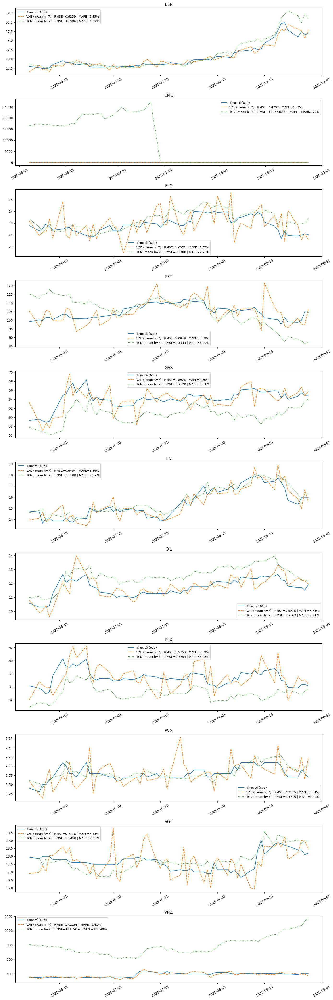

In [24]:
# =================== Hàm dự báo multi-step chung cho model ===================
def multistep_series_model(model, X_scaled, prices, W, start_idx, end_idx, H):
    """
    Dự báo multi-step: mỗi t dự báo H bước tới (ví dụ 7 ngày).
    Trả về (số bước, H) giá dự báo.
    """
    preds = []
    for t in range(start_idx, end_idx):
        window = X_scaled[t - W:t]          # (W, F)
        p0 = float(prices[t - 1])           # giá tại t-1
        out = model.predict(window[None, ...], verbose=0)
        rets = normalize_rets(out, H)       # (H,)

        # Biến đổi log-return -> giá dự báo
        pred_prices = [p0 * np.exp(rets[0])]
        for h in range(1, H):
            pred_prices.append(pred_prices[-1] * np.exp(rets[h]))

        preds.append(pred_prices)  # (H,)

    return np.array(preds, dtype=np.float32)  # (số bước, H)


# =================== Vẽ theo từng symbol ===================
last_n_days = 60  # khoảng thời gian quan sát cuối để vẽ & tính metric
symbols = df["symbol"].unique().tolist()

fig, axes = plt.subplots(len(symbols), 1, figsize=(14, 3.8 * max(1, len(symbols))), sharex=False)
if len(symbols) == 1:
    axes = np.array([axes])

for i, sym in enumerate(symbols):
    dfg = df[df["symbol"] == sym].sort_values("time").reset_index(drop=True).copy()
    if TARGET_COL not in dfg.columns:
        print(f"[WARN] {sym}: thiếu cột TARGET_COL='{TARGET_COL}'. Bỏ qua."); continue
    if len(dfg) < W + H + 2:
        axes[i].text(0.5, 0.5, f"{sym}: không đủ dữ liệu (cần ≥ W+H+2)", ha="center", va="center"); continue

    X_feats  = align_features(dfg, feature_cols_cfg)
    X_scaled = x_scaler.transform(X_feats).astype("float32")
    times    = to_numpy_time(dfg["time"])
    prices   = dfg[TARGET_COL].to_numpy(dtype=np.float32)

    end_idx   = len(dfg)
    start_idx = max(W, end_idx - last_n_days)
    y_true    = prices[start_idx:end_idx]
    t_true    = times[start_idx:end_idx]

    # VAE (multi-step)
    y_pred_vae_all = multistep_series_model(vae, X_scaled, prices, W, start_idx, end_idx, H)  # (n,H)
    y_pred_vae = y_pred_vae_all.mean(axis=1)  # lấy trung bình 7 bước
    rmse_vae = float(np.sqrt(np.mean((y_pred_vae - y_true) ** 2)))
    mape_vae = mape_safe(y_true, y_pred_vae)

    # TCN (multi-step, nếu có)
    if USE_TCN:
        y_pred_tcn_all = multistep_series_model(baseline2, X_scaled, prices, W, start_idx, end_idx, H)
        y_pred_tcn = y_pred_tcn_all.mean(axis=1)
        rmse_tcn = float(np.sqrt(np.mean((y_pred_tcn - y_true) ** 2)))
        mape_tcn = mape_safe(y_true, y_pred_tcn)
    else:
        y_pred_tcn, rmse_tcn, mape_tcn = None, None, None

    ax = axes[i]
    ax.plot(t_true, y_true, label=f"Thực tế ({len(y_true)}d)")
    ax.plot(t_true, y_pred_vae, "--", label=f"VAE (mean h=7) | RMSE={rmse_vae:.4f} | MAPE={mape_vae:.2f}%")
    if USE_TCN:
        ax.plot(t_true, y_pred_tcn, ":",  label=f"TCN (mean h=7) | RMSE={rmse_tcn:.4f} | MAPE={mape_tcn:.2f}%")
    ax.set_title(sym)
    ax.legend(loc="best", fontsize=9)
    ax.tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()


# Model MLP

In [19]:
# =================== BUILD MLP ===================
from tensorflow.keras import layers, models

def build_mlp_model(input_shape, H=7, hidden_units=[128,64], dropout=0.2):
    """MLP: flatten chuỗi đầu vào rồi fully connected."""
    inputs = layers.Input(shape=input_shape)
    x = layers.Flatten()(inputs)
    for u in hidden_units:
        x = layers.Dense(u, activation="relu")(x)
        x = layers.Dropout(dropout)(x)
    outputs = layers.Dense(H, activation="linear")(x)
    return models.Model(inputs, outputs)

# =================== TRAIN MLP ===================
N = len(X_all)
train_size = int(0.8 * N)
X_train, y_train = X_all[:train_size], y_all[:train_size]
X_test,  y_test  = X_all[train_size:], y_all[train_size:]

baseline_mlp = build_mlp_model(input_shape=(W, len(feature_cols_cfg)), H=H)
baseline_mlp.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
                     loss="mse", metrics=["mae"])

print("\nTraining MLP ...")
baseline_mlp.fit(X_train, y_train,
                 batch_size=64,
                 epochs=10,
                 validation_data=(X_test, y_test),
                 shuffle=True)

# Save model MLP
MLP_DIR = "/content/drive/MyDrive/kpdl/model_turning/mlp_multisymbol"
os.makedirs(MLP_DIR, exist_ok=True)
baseline_mlp.save(os.path.join(MLP_DIR, "best_mlp.keras"))
print("✅ Đã train và lưu model MLP:", os.path.join(MLP_DIR, "best_mlp.keras"))

USE_MLP = True



Training MLP ...
Epoch 1/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 174.5397 - mae: 2.2559 - val_loss: 40.6044 - val_mae: 1.6762
Epoch 2/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 37.6219 - mae: 0.9237 - val_loss: 10.0720 - val_mae: 0.5211
Epoch 3/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 14.7583 - mae: 0.4688 - val_loss: 2.0216 - val_mae: 0.1993
Epoch 4/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 4.6831 - mae: 0.2643 - val_loss: 0.2889 - val_mae: 0.0718
Epoch 5/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 1.1919 - mae: 0.1365 - val_loss: 0.0737 - val_mae: 0.0390
Epoch 6/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.9420 - mae: 0.1090 - val_loss: 0.0030 - val_mae: 0.0267
Epoch 7/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9223 - mae: 0.0929 - val_loss: 0.0019 - val_mae: 0.0241
Epoch 8/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.8553 - mae: 0.0654 - val_loss: 0.0048 - val_mae: 0.0233
Epoch 9/10
164/164 ━━━━━

# Trực quan

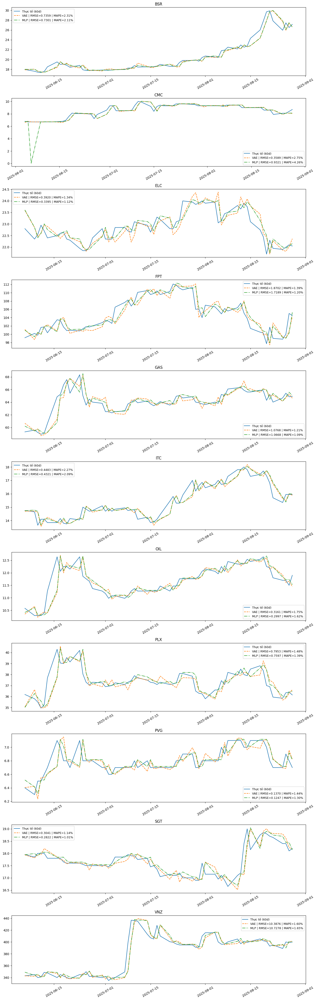

In [20]:
# =================== Vẽ theo từng symbol ===================
last_n_days = 60
symbols = df["symbol"].unique().tolist()

fig, axes = plt.subplots(len(symbols), 1, figsize=(14, 4 * max(1, len(symbols))), sharex=False)
if len(symbols) == 1:
    axes = np.array([axes])

for i, sym in enumerate(symbols):
    dfg = df[df["symbol"] == sym].sort_values("time").reset_index(drop=True).copy()
    if len(dfg) < W + 2:
        axes[i].text(0.5, 0.5, f"{sym}: không đủ dữ liệu", ha="center", va="center")
        continue

    X_feats  = align_features(dfg, feature_cols_cfg)
    X_scaled = x_scaler.transform(X_feats).astype("float32")
    times    = to_numpy_time(dfg["time"])
    prices   = dfg[TARGET_COL].to_numpy(dtype=np.float32)

    end_idx   = len(dfg)
    start_idx = max(W, end_idx - last_n_days)
    y_true    = prices[start_idx:end_idx]
    t_true    = times[start_idx:end_idx]

    # VAE
    y_pred_vae = one_step_series_model(vae, X_scaled, prices, W, start_idx, end_idx, H)
    rmse_vae, mape_vae = float(np.sqrt(np.mean((y_pred_vae - y_true) ** 2))), mape_safe(y_true, y_pred_vae)

    # MLP
    y_pred_mlp = one_step_series_model(baseline_mlp, X_scaled, prices, W, start_idx, end_idx, H)
    rmse_mlp, mape_mlp = float(np.sqrt(np.mean((y_pred_mlp - y_true) ** 2))), mape_safe(y_true, y_pred_mlp)

    ax = axes[i]
    ax.plot(t_true, y_true, label=f"Thực tế ({len(y_true)}d)")
    ax.plot(t_true, y_pred_vae, "--", label=f"VAE | RMSE={rmse_vae:.4f} | MAPE={mape_vae:.2f}%")
    ax.plot(t_true, y_pred_mlp, "-.", label=f"MLP | RMSE={rmse_mlp:.4f} | MAPE={mape_mlp:.2f}%")

    ax.set_title(sym)
    ax.legend(loc="best", fontsize=9)
    ax.tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()
